In [1]:
!pip install tf-levenberg-marquardt


[notice] A new release of pip is available: 25.0 -> 25.0.1
[notice] To update, run: pip install --upgrade pip


/tmp/ipykernel_1117863/2881501840.py:2: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd


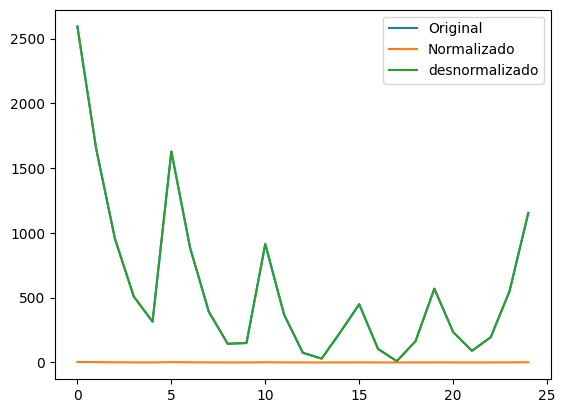

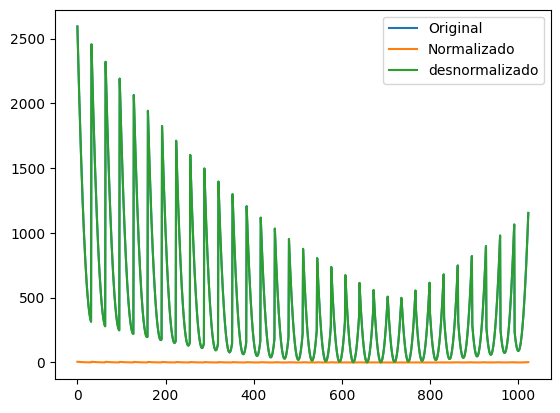

In [2]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

scaler = StandardScaler()
out_scaler = StandardScaler()

def function(grid):
    x = np.linspace(-10, 10, grid)
    y = np.linspace(-10, 10, grid)
    x, y = np.meshgrid(x, y)
    z = (x + 2 * y - 7)**2 + (2 * x + y - 5)**2
    return x, y, z

def create_dataframe(grid):
   x, y, z = function(grid)
   data = {'X': x.flatten(), 'Y': y.flatten(), 'Z': z.flatten()}
   df = pd.DataFrame(data)
   return df

def show_norm(df, label="function", plot=False):
    df_norm = pd.DataFrame(scaler.fit_transform(df), columns=df.columns)
    df_denorm = pd.DataFrame(scaler.inverse_transform(df_norm), columns=df_norm.columns)

    if (plot):
        df.plot(title=f"{label}: Original data")
        df_norm.plot(title=f"{label}: Normalized data")
        df_denorm.plot(title=f"{label}: Denormalized data")
    return (df_norm)


def test_out_scaler(df):
    out = df["Z"].values.reshape(-1, 1)  
    plt.plot(out, label='Original')
    out_scaler.fit(out)
    norm = out_scaler.transform(out)
    plt.plot(norm, label='Normalizado')
    plt.plot(out_scaler.inverse_transform(norm), label='desnormalizado')
    plt.legend()
    plt.show()


df_25 = create_dataframe(grid=5)
df_25_norm = show_norm(df_25)
test_out_scaler(df_25)

df_1000 = create_dataframe(grid=32)
df_1000_norm = show_norm(df_1000)
test_out_scaler(df_1000)



In [3]:
def split_df(df):
    _input = np.vstack([df['X'], df['Y']]).T
    _output = np.array(df['Z'])
    return (_input, _output)

In [4]:
import tensorflow as tf
import numpy as np
from keras import regularizers
from keras import initializers
import tf_levenberg_marquardt as lm


# layers, neurons
class ShuffleArchitecture:
    def __init__(self, input_size, hidden_sizes, output_size, act_h, act_o, param_reg):
        self.input_size = input_size
        self.hidden_sizes = hidden_sizes
        self.output_size = output_size
        self.act_h = act_h
        self.act_o = act_o
        self.regularizer = regularizers.L2(param_reg)
        self.initializer = initializers.RandomUniform(minval=-0.5, maxval=0.5, seed=np.random.randint(1, 10000))

    def compute_k(self):
        total_parameters = 0
        for layer in self.model.layers:
            weights = layer.get_weights()
            if len(weights) > 0:  
                for w in weights:
                    total_parameters += np.prod(w.shape)
        return total_parameters
        
    def set_architecture(self):
        self.model = tf.keras.Sequential()
        self.model.add(tf.keras.layers.Dense(self.hidden_sizes[0],
                        input_shape=(self.input_size,),
                        activation=self.act_h,
                        kernel_regularizer=self.regularizer,
                        kernel_initializer=self.initializer,                        
                        ))  # input layer

        for size in self.hidden_sizes[1:]:  # hidden layers
            self.model.add(tf.keras.layers.Dense(size,
                            activation=self.act_h,
                            kernel_regularizer=self.regularizer,
                            kernel_initializer=self.initializer,  
                        ))

        self.model.add(tf.keras.layers.Dense(self.output_size,
                        activation=self.act_o,
                        kernel_regularizer=self.regularizer,
                        kernel_initializer=self.initializer,  
                        ))  # output layer

    def create_model(self, _learning_rate):
        self.model.compile(
            optimizer=tf.keras.optimizers.Adam(learning_rate=_learning_rate),
            loss=lm.loss.MeanSquaredError())

        self.lm_model = lm.model.ModelWrapper(
            tf.keras.models.clone_model(self.model))
  

        self.lm_model.compile(
            optimizer=tf.keras.optimizers.SGD(learning_rate=_learning_rate),
            loss=lm.loss.MeanSquaredError())
        return(self.lm_model)


2025-03-18 15:08:29.140108: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2025-03-18 15:08:29.143622: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2025-03-18 15:08:29.151657: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1742310509.166949 1117863 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1742310509.171423 1117863 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-03-18 15:08:29.188843: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU ins

In [5]:
from sklearn.model_selection import train_test_split
from keras.callbacks import EarlyStopping
from sklearn.metrics import r2_score, mean_squared_error, root_mean_squared_error, mean_absolute_percentage_error 

class TrainWithSmallDataset:
    def __init__(self, batch_size=1000):
        self.batch_size = batch_size
        self.betters = []
        self.k = 0

    def create_dataset(self, input, output):
      input = tf.expand_dims(tf.cast(input, tf.float32), axis=-1)
      output = tf.expand_dims(tf.cast(output, tf.float32), axis=-1)
      dataset = tf.data.Dataset.from_tensor_slices((input, output))
      dataset = dataset.shuffle(len(input))
      dataset = dataset.batch(self.batch_size).cache()
      dataset = dataset.prefetch(tf.data.experimental.AUTOTUNE)
      return (dataset, input, output)

    def split_dataset(self, input, output, sup_input, sup_output):
      input_train, input_vt, output_train, output_vt = train_test_split(input, output, test_size=0.3, shuffle = True)
      input_val, input_test, output_val, output_test = train_test_split(input_vt, output_vt, test_size=0.5, shuffle = True)

      self.train_dataset, self.train_input, self.train_output = self.create_dataset(input_train, output_train)
      self.val_dataset, self.val_input, self.val_output = self.create_dataset(input_val, output_val)
      self.test_dataset, self.test_input, self.test_output = self.create_dataset(input_test, output_test)
      self.vt_dataset, self.vt_input, self.vt_output = self.create_dataset(input_vt, output_vt)
      self.sup_dataset, self.sup_input, self.sup_output = self.create_dataset(sup_input, sup_output)
      self.dataset, self.input, self.output = self.create_dataset(input, output)

      self._data = (input, output)
      self._train = (input_train, output_train)
      self._vt = (input_vt, output_vt)
      self._val = (input_val, output_val)
      self._test = (input_test, output_test)
      self._sup = (sup_input, sup_output)

    def train_using_lm(self, train_dataset, epochs=1000):
      early_stopping_monitor = EarlyStopping(monitor='val_loss',
                                              patience=6,
                                              restore_best_weights=True)

      self.results = self.lm_model.fit(train_dataset,
                                            epochs=epochs,
                                            validation_data=self.val_dataset,
                                            callbacks=[early_stopping_monitor],
                                            verbose=0)
      print ("Stopped at epoch: ", early_stopping_monitor.stopped_epoch)
    
    def get_new_metrics(self, orig, pred, r2, mse):
      n = len(orig) # N: quantidade de saidas
      k = self.k
      waste = (orig.flatten() - pred.flatten())

      mape = mean_absolute_percentage_error(orig, pred)  
      r2_adj = 1 - (((n - 1)/(n - k - 1)) * (1 - r2))
      rsd = np.sqrt(np.sum(waste ** 2) / (n - 2))
      rmse = root_mean_squared_error(orig, pred)          
      aic = (-2 * np.log(mse)) + (2 * k)
      bic = (-2 * np.log(mse)) + (k * np.log(n))
      return (mape, r2_adj, rsd, rmse, aic, bic)
      

    def get_metrics(self):
          # Calculando a saida com os dados normalizados
          pred = self.lm_model.predict(self.input).flatten()
          test_pred = self.lm_model.predict(self.test_input).flatten()
          val_pred = self.lm_model.predict(self.val_input).flatten()
          vt_pred = self.lm_model.predict(self.vt_input).flatten()
          sup_pred = self.lm_model.predict(self.sup_input).flatten()

          # Calculando as metricas com a saida desnormalizada
          pred_denorm = out_scaler.inverse_transform(pred.reshape(-1, 1))
          test_pred_denorm = out_scaler.inverse_transform(test_pred.reshape(-1, 1))
          val_pred_denorm = out_scaler.inverse_transform(val_pred.reshape(-1, 1))
          vt_pred_denorm = out_scaler.inverse_transform(vt_pred.reshape(-1, 1))
          sup_pred_denorm = out_scaler.inverse_transform(sup_pred.reshape(-1, 1))

          out_denorm = out_scaler.inverse_transform(self._data[1].reshape(-1, 1))
          test_denorm = out_scaler.inverse_transform(self._test[1].reshape(-1, 1))
          val_denorm = out_scaler.inverse_transform(self._val[1].reshape(-1, 1))
          vt_denorm = out_scaler.inverse_transform(self._vt[1].reshape(-1, 1))    
          sup_denorm = out_scaler.inverse_transform(self._sup[1].reshape(-1, 1))

          r2 = r2_score(out_denorm, pred_denorm)
          r2_test = r2_score(test_denorm, test_pred_denorm)
          r2_val = r2_score(val_denorm, val_pred_denorm)
          r2_vt = r2_score(vt_denorm,  vt_pred_denorm)
          r2_sup = r2_score(sup_denorm,  sup_pred_denorm)

          mse = mean_squared_error(out_denorm, pred_denorm)
          mse_test = mean_squared_error(test_denorm, test_pred_denorm)
          mse_val = mean_squared_error(val_denorm, val_pred_denorm)
          mse_vt = mean_squared_error(vt_denorm,  vt_pred_denorm)
          mse_sup = mean_squared_error(sup_denorm,  sup_pred_denorm)
          
          mape, r2_adj, rsd, rmse, aic, bic = self.get_new_metrics(out_denorm, pred_denorm, r2, mse)
          metrics = {
                          'r2': r2,
                          'r2_sup': r2_sup,
                          'r2_test': r2_test,
                          'r2_val': r2_val,
                          'r2_vt': r2_vt,
                          'mse': mse,
                          'mse_sup': mse_sup,
                          'mse_test': mse_test,
                          'mse_val': mse_val,
                          'mse_vt': mse_vt,
                          'mape': mape,
                          'rmse': rmse,
                          'r2_adj': r2_adj,
                          'rsd': rsd,
                          'aic': aic,
                          'bic': bic
                          }

          return metrics

In [6]:
import pickle
from itertools import product

class Tester:
  def __init__(self, run_times=500, dataset_run_times=10):
    self.run_times = run_times
    self.better_metrics = {}
    self.dataset_run_times = dataset_run_times
    self.input_25, self.output_25 = split_df(df_25_norm)
    self.input_1000, self.output_1000 = split_df(df_1000_norm)
  
  def setArchitecure(self, trainer, _hidden_sizes, _pg, _lr):
    shuffler = ShuffleArchitecture(input_size=2,
                                    hidden_sizes=_hidden_sizes,
                                    output_size=1,
                                    act_h='tanh',
                                    act_o='linear',
                                    param_reg=_pg)
    shuffler.set_architecture()    
    trainer.lm_model = shuffler.create_model(_lr)
    trainer.k = shuffler.compute_k()

  def Train(self, trainer, epochs=1000):
    trainer.train_using_lm(trainer.train_dataset, epochs=epochs)
    return(trainer.get_metrics(), trainer.lm_model)

 
  def SaveModelWeights(self, model, fileName):
    if not fileName.endswith(".keras"):
        fileName += ".keras"
    path = f"content/models/{fileName}"
    open(path,'w').close()
    model.save(path)

  def SaveDataset(self, trainer, fileName):
    path = f"content/dataset/{fileName}.pkl" 
    with open(path, 'wb') as f:
      pickle.dump((trainer._data, trainer._train, trainer._vt, trainer._val, trainer._test), f)
      
  def LoopWeights(self, sort_by, boundarie, trainer, idx):
    better_model = 0
    save = False

    for i in range(self.run_times):
      print (f"+++++++++++ [{idx}] | {i + 1} ++++++++++++++++++")
      metrics, model = self.Train(trainer)
      if (metrics[sort_by] >= boundarie): # should be >= to acsending metrics
        fileName = f"model_{idx}_{better_model}"
        self.SaveModelWeights(model, fileName)
        self.better_metrics[fileName] = metrics
        better_model += 1
        save = True
    return(save)

  def Loop(self, sort_by, boundarie, hidden_sizes, regularizers, learning_rate):
    trainer = TrainWithSmallDataset()

    for count, (hidden_size, reg, lr) in enumerate(product(hidden_sizes, regularizers, learning_rate), start=1):
      header =  f"Hidden Size={hidden_size}, regularizer={reg}, learning_rate={lr}"
      print(f"Testando combinacao{count}: {header}")
      self.setArchitecure(trainer, hidden_size, reg, lr)
      for j in range(self.dataset_run_times):
        trainer.split_dataset(self.input_25, self.output_25, self.input_1000, self.output_1000)
        if (self.LoopWeights(sort_by, boundarie, trainer, f"{count}_{j}") == True):
          self.SaveDataset(trainer, f"dataset_{count}_{j}")
          self.DisplayBetterResults('mse_sup', header, f"{count}_{j}")
        self.better_metrics = {}

  def DisplayBetterResults(self, sort_by, header, dataset=0):
    df = pd.DataFrame.from_dict(self.better_metrics, orient='index')
    df = df.sort_values([sort_by])
    display(df)
    path = f'content/results/metrics_{dataset}'
    df.to_excel(f"{path}.xlsx", index=True)
    print(f"DataFrame salvo em {path}")
    with open(f"{path}.txt", 'w') as arquivo:
      arquivo.write(header)

In [7]:
import os
print(os.getcwd())

/workspaces/Ic-Rna-2024/fuction_ensemble_3/redes-ensemble-s/Teste04


# Treinando com 25 dados


In [ ]:
tester = Tester(run_times=25, dataset_run_times=10)
tester.Loop(sort_by='r2',
            boundarie = 0.95, 
            hidden_sizes = [[3, 6], [3, 7], [3, 8], [4, 2], [4, 3], [4, 4], [4, 8], [8, 4], [8, 8], [5, 7]],
            regularizers=[0.2, 0.05],
            learning_rate=[0.01, 0.1])

Testando combinacao1: Hidden Size=[1, 3], regularizer=0.2, learning_rate=0.01
+++++++++++ [1_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [1_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
+++++++++++ [1_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [1_0] | 4 ++++++++++++++++++
Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [1_0] | 5 +++++++

/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [2_0] | 2 ++++++++++++++++++
Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [2_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [2_0] | 4 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [2_0] | 5 +++++++

/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  28
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [3_0] | 2 ++++++++++++++++++
Stopped at epoch:  9
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [3_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [3_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [3_0] | 5 ++++++

/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [4_0] | 2 ++++++++++++++++++
Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [4_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [4_0] | 4 ++++++++++++++++++
Stopped at epoch:  12
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [4_0] | 5 ++++++

/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [5_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [5_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [5_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [5_0] | 5 +++++++

/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [6_0] | 2 ++++++++++++++++++
Stopped at epoch:  11
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [6_0] | 3 ++++++++++++++++++
Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [6_0] | 4 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [6_0] | 5 ++++++

/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [7_0] | 2 ++++++++++++++++++
Stopped at epoch:  10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [7_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [7_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [7_0] | 5 ++++++

/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [8_0] | 2 ++++++++++++++++++
Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [8_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [8_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [8_0] | 5 +++++++

/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  9
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [9_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [9_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [9_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [9_0] | 5 +++++++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_9_3_10,0.978666,0.978105,0.968090,0.782845,0.967080,4758.615187,4883.815138,6584.227463,2279.756069,4431.991766,0.943184,68.982717,1.170669,71.919454,37.064576,69.974223
model_9_3_9,0.978328,0.977841,0.967683,0.778390,0.966595,4834.035065,4942.787081,6668.149094,2326.519115,4497.334105,0.951682,69.527225,1.173374,72.487143,37.033126,69.942774
model_9_3_8,0.978230,0.977763,0.967585,0.778374,0.966519,4856.005372,4960.049862,6688.401696,2326.693819,4507.547758,0.952892,69.685044,1.174162,72.651681,37.024057,69.933704
model_9_3_7,0.974026,0.974746,0.960430,0.736183,0.959391,5793.583404,5633.159133,8164.706736,2769.621401,5467.164069,1.025563,76.115592,1.207788,79.355991,36.670987,69.580635
model_9_3_6,0.965250,0.972644,0.942082,0.697395,0.943819,7751.332116,6101.865424,11950.518144,3176.831747,7563.674945,0.942293,88.041650,1.278003,91.789765,36.088760,68.998407
model_9_3_5,0.964665,0.972165,0.941177,0.691373,0.942891,7881.836833,6208.853670,12137.215781,3240.052945,7688.634363,0.951256,88.779710,1.282684,92.559246,36.055367,68.965015
model_9_3_4,0.963969,0.971697,0.939009,0.689835,0.941169,8037.088918,6313.089057,12584.593290,3256.200435,7920.396863,0.951879,89.649813,1.288252,93.466391,36.016356,68.926003
model_9_3_3,0.962874,0.970945,0.936656,0.680857,0.939016,8281.275195,6480.820214,13070.149485,3350.449261,8210.299373,0.966542,91.001512,1.297010,94.875635,35.956496,68.866143
model_9_3_2,0.962489,0.970614,0.936170,0.678111,0.938536,8367.109497,6554.859442,13170.399534,3379.281636,8274.840585,0.968878,91.471906,1.300088,95.366054,35.935872,68.845520
model_9_3_1,0.960800,0.969713,0.933450,0.664679,0.935929,8743.842256,6755.647799,13731.542910,3520.295961,8625.919436,0.938076,93.508514,1.313600,97.489365,35.847790,68.757437


DataFrame salvo em content/results/metrics_9_3
+++++++++++ [9_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [9_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [9_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [9_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_9_4_24,0.992402,0.987823,0.991924,0.994097,0.993019,1694.864179,2716.092022,1980.797752,1291.484006,1636.140879,0.623372,41.168728,1.060787,42.921366,39.129284,72.038931
model_9_4_23,0.992314,0.987720,0.992093,0.993937,0.993033,1714.376873,2739.196306,1939.330900,1326.405393,1632.868147,0.630332,41.405034,1.061487,43.167732,39.106390,72.016037
model_9_4_22,0.992126,0.987546,0.991772,0.993853,0.992826,1756.244396,2777.954345,2018.047797,1344.820364,1681.434081,0.637115,41.907570,1.062988,43.691662,39.058134,71.967781
model_9_4_21,0.991970,0.987421,0.991574,0.993770,0.992683,1791.045398,2805.753999,2066.650041,1363.009929,1714.829985,0.642433,42.320744,1.064236,44.122426,39.018891,71.928538
model_9_4_20,0.991792,0.987241,0.991279,0.993674,0.992484,1830.753867,2845.897681,2139.047231,1384.021234,1761.534232,0.648904,42.787310,1.065660,44.608854,38.975034,71.884681
model_9_4_19,0.991627,0.987072,0.991005,0.993592,0.992303,1867.666355,2883.764517,2206.292397,1401.797032,1804.044714,0.655247,43.216506,1.066984,45.056322,38.935110,71.844757
model_9_4_18,0.989893,0.986156,0.988120,0.992945,0.990491,2254.488485,3088.070281,2913.828017,1543.405444,2228.616730,0.721779,47.481454,1.080858,49.502838,38.558643,71.468290
model_9_4_17,0.989672,0.985985,0.987800,0.992803,0.990257,2303.634224,3126.128285,2992.387378,1574.509471,2283.448424,0.729792,47.996190,1.082620,50.039487,38.515513,71.425161
model_9_4_16,0.989502,0.985851,0.987633,0.992701,0.990123,2341.685798,3155.987375,3033.235398,1596.705559,2314.970478,0.737230,48.390968,1.083985,50.451072,38.482747,71.392395
model_9_4_15,0.989312,0.985679,0.987433,0.992615,0.989978,2384.093658,3194.416079,3082.336766,1615.614438,2348.975602,0.745292,48.827182,1.085506,50.905856,38.446851,71.356499


DataFrame salvo em content/results/metrics_9_4
+++++++++++ [9_5] | 1 ++++++++++++++++++
Stopped at epoch:  17
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [9_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [9_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [9_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_9_5_24,0.999090,0.992917,0.997957,0.990358,0.996822,203.063130,1579.947272,126.941279,144.454789,135.698034,0.211401,14.250022,1.007283,14.856675,43.372966,76.282613
model_9_5_23,0.999067,0.992893,0.997879,0.990151,0.996729,208.111739,1585.235173,131.749540,147.559110,139.654325,0.214283,14.426078,1.007464,15.040226,43.323850,76.233497
model_9_5_22,0.998965,0.992824,0.997553,0.989748,0.996422,230.830628,1600.571662,151.998718,153.588909,152.793814,0.221626,15.193111,1.008279,15.839913,43.116632,76.026279
model_9_5_21,0.998945,0.992815,0.997495,0.989575,0.996349,235.241071,1602.656617,155.611725,156.181520,155.896623,0.223967,15.337571,1.008437,15.990523,43.078778,75.988426
model_9_5_20,0.998798,0.992701,0.997120,0.988242,0.995842,268.143504,1628.081992,178.924627,176.158672,177.541650,0.239514,16.375088,1.009617,17.072209,42.816955,75.726603
model_9_5_19,0.998753,0.992660,0.997015,0.987881,0.995703,278.058402,1637.157663,185.421420,181.566794,183.494107,0.244034,16.675083,1.009973,17.384976,42.744338,75.653985
model_9_5_18,0.998526,0.992571,0.996383,0.986526,0.995005,328.819202,1657.097000,224.735480,201.862949,213.299215,0.259820,18.133373,1.011793,18.905348,42.408984,75.318631
model_9_5_17,0.998496,0.992503,0.996196,0.986658,0.994892,335.577225,1672.180514,236.339394,199.881871,218.110632,0.262986,18.318767,1.012036,19.098635,42.368296,75.277943
model_9_5_16,0.998435,0.992469,0.995992,0.986167,0.994657,349.103177,1679.837105,249.012788,207.233461,228.123125,0.268490,18.684303,1.012521,19.479732,42.289265,75.198912
model_9_5_15,0.998407,0.992436,0.995937,0.985907,0.994572,355.439832,1687.226505,252.428693,211.140271,231.784482,0.271333,18.853112,1.012748,19.655728,42.253288,75.162935


DataFrame salvo em content/results/metrics_9_5
+++++++++++ [9_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [9_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [9_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [9_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_9_6_24,0.999436,0.993161,0.999653,0.993663,0.999631,125.809943,1525.482623,191.506947,120.213897,155.860422,0.160686,11.216503,1.004512,11.694013,44.330455,77.240103
model_9_6_22,0.999399,0.993159,0.999627,0.993481,0.999610,134.047275,1525.967056,206.071673,123.675315,164.873494,0.166260,11.577879,1.004808,12.070773,44.203615,77.113262
model_9_6_23,0.999411,0.993157,0.999634,0.993579,0.999617,131.389321,1526.373312,202.283439,121.808193,162.045816,0.164805,11.462518,1.004712,11.950501,44.243670,77.153318
model_9_6_21,0.999390,0.993155,0.999622,0.993413,0.999605,136.124639,1526.882523,208.764602,124.965382,166.864992,0.167323,11.667246,1.004882,12.163945,44.172858,77.082505
model_9_6_20,0.999380,0.993147,0.999620,0.993316,0.999602,138.185327,1528.506052,210.016001,126.795211,168.405606,0.168795,11.755226,1.004956,12.255670,44.142809,77.052456
model_9_6_19,0.999370,0.993146,0.999617,0.993245,0.999598,140.472723,1528.764803,211.709896,128.154908,169.932402,0.170393,11.852119,1.005038,12.356688,44.109973,77.019621
model_9_6_18,0.999359,0.993145,0.999616,0.993175,0.999596,142.895406,1529.011635,212.424741,129.468786,170.946764,0.172100,11.953887,1.005125,12.462788,44.075774,76.985421
model_9_6_15,0.999317,0.993140,0.999608,0.992994,0.999586,152.411587,1530.136624,216.761021,132.916113,174.838567,0.179490,12.345509,1.005466,12.871083,43.946831,76.856478
model_9_6_16,0.999345,0.993135,0.999620,0.993137,0.999597,145.992766,1531.397854,210.123616,130.205667,170.164641,0.175869,12.082747,1.005236,12.597134,44.032886,76.942533
model_9_6_17,0.999356,0.993133,0.999621,0.993185,0.999599,143.671940,1531.716486,209.430335,129.278460,169.354397,0.174171,11.986323,1.005153,12.496606,44.064935,76.974582


DataFrame salvo em content/results/metrics_9_6
+++++++++++ [9_7] | 1 ++++++++++++++++++
Stopped at epoch:  10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [9_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [9_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [9_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_9_7_23,0.999914,0.993471,0.999680,0.999910,0.999851,19.225367,1456.308209,26.801030,21.701444,24.251237,0.063106,4.384674,1.000690,4.571339,48.087539,80.997186
model_9_7_10,0.999747,0.993461,0.999228,0.999743,0.999611,56.346734,1458.571695,64.564323,62.209649,63.386986,0.097155,7.506446,1.002021,7.826011,45.936951,78.846599
model_9_7_24,0.999914,0.993443,0.999685,0.999911,0.999853,19.105671,1462.588913,26.385977,21.557234,23.971606,0.063147,4.371003,1.000685,4.557086,48.100030,81.009677
model_9_7_11,0.999769,0.993442,0.999318,0.999773,0.999656,51.558750,1462.842266,57.057304,54.929712,55.993508,0.091116,7.180442,1.001849,7.486128,46.114556,79.024203
model_9_7_9,0.999708,0.993399,0.999052,0.999669,0.999511,65.222064,1472.507943,79.319906,80.076792,79.698349,0.107503,8.076018,1.002339,8.419831,45.644404,78.554052
model_9_7_13,0.999838,0.993391,0.999590,0.999896,0.999817,36.110358,1474.224752,34.332119,25.118902,29.725510,0.065657,6.009189,1.001295,6.265013,46.826840,79.736488
model_9_7_6,0.999698,0.993375,0.999163,0.999700,0.999562,67.472306,1477.686311,69.969425,72.524627,71.247026,0.098711,8.214153,1.002420,8.563846,45.576566,78.486213
model_9_7_14,0.999832,0.993369,0.999525,0.999852,0.999768,37.533126,1479.030893,39.757687,35.711148,37.734418,0.072271,6.126429,1.001346,6.387243,46.749552,79.659199
model_9_7_15,0.999834,0.993359,0.999528,0.999854,0.999770,36.996375,1481.311740,39.479312,35.291415,37.385364,0.071565,6.082465,1.001327,6.341408,46.778360,79.688007
model_9_7_8,0.999728,0.993311,0.999224,0.999736,0.999605,60.603075,1491.963612,64.924944,63.875630,64.400287,0.098232,7.784798,1.002174,8.116213,45.791309,78.700956


DataFrame salvo em content/results/metrics_9_7
+++++++++++ [9_8] | 1 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [9_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [9_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [9_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_9_8_24,0.999918,0.993752,0.999333,0.978880,0.999489,18.346004,1393.667754,72.126211,18.310002,45.218106,0.043972,4.283224,1.000658,4.465569,48.181176,81.090824
model_9_8_23,0.999920,0.993745,0.999368,0.978509,0.999509,17.881813,1395.312379,68.347775,18.631066,43.489420,0.045735,4.228689,1.000641,4.408713,48.232432,81.142079
model_9_8_22,0.999931,0.993655,0.999522,0.979276,0.999606,15.354330,1415.307594,51.749966,17.966607,34.858286,0.046469,3.918460,1.000551,4.085277,48.537205,81.446852
model_9_8_21,0.999932,0.993647,0.999540,0.979450,0.999618,15.082156,1417.178705,49.799694,17.815190,33.807442,0.046779,3.883575,1.000541,4.048907,48.572975,81.482623
model_9_8_20,0.999929,0.993627,0.999547,0.978121,0.999616,15.869099,1421.522731,49.043908,18.967594,34.005751,0.048591,3.983604,1.000569,4.153194,48.471253,81.380900
model_9_8_18,0.999929,0.993604,0.999568,0.977311,0.999625,15.906209,1426.585252,46.792494,19.669839,33.231167,0.051104,3.988259,1.000570,4.158047,48.466581,81.376228
model_9_8_19,0.999930,0.993600,0.999571,0.977807,0.999629,15.724988,1427.661716,46.420004,19.240081,32.830043,0.050367,3.965475,1.000564,4.134293,48.489498,81.399145
model_9_8_15,0.999928,0.993586,0.999590,0.977400,0.999639,15.967109,1430.622039,44.364668,19.592836,31.978752,0.052582,3.995887,1.000573,4.166000,48.458938,81.368585
model_9_8_14,0.999928,0.993584,0.999591,0.977779,0.999641,15.982776,1431.193675,44.300539,19.264502,31.782521,0.052631,3.997846,1.000573,4.168043,48.456977,81.366624
model_9_8_17,0.999931,0.993582,0.999604,0.977558,0.999648,15.333945,1431.650647,42.857188,19.455761,31.156474,0.051547,3.915858,1.000550,4.082564,48.539862,81.449509


DataFrame salvo em content/results/metrics_9_8
+++++++++++ [9_9] | 1 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [9_9] | 2 ++++++++++++++++++
Stopped at epoch:  14
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [9_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [9_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_9_9_0,0.999920,0.993746,0.999808,0.999913,0.999873,17.768812,1395.069292,9.106852,6.015669,7.561261,0.043613,4.215307,1.000637,4.394761,48.245110,81.154758
model_9_9_4,0.999932,0.993734,0.999848,0.999902,0.999883,15.274149,1397.724158,7.205677,6.775202,6.990439,0.050641,3.908216,1.000548,4.074596,48.547676,81.457324
model_9_9_3,0.999931,0.993720,0.999843,0.999902,0.999881,15.314739,1400.893364,7.422731,6.800350,7.111541,0.050546,3.913405,1.000549,4.080007,48.542369,81.452016
model_9_9_1,0.999931,0.993710,0.999847,0.999909,0.999887,15.388584,1403.005218,7.241070,6.307265,6.774167,0.046954,3.922829,1.000552,4.089832,48.532748,81.442395
model_9_9_2,0.999932,0.993705,0.999849,0.999909,0.999887,15.202855,1404.048565,7.152618,6.299366,6.725992,0.046610,3.899084,1.000545,4.065076,48.557034,81.466681
model_9_9_5,0.999935,0.993612,0.999821,0.999858,0.999847,14.399702,1424.908108,8.489894,9.816078,9.152986,0.049688,3.794694,1.000516,3.956242,48.665585,81.575232
model_9_9_6,0.999936,0.993601,0.999816,0.999852,0.999842,14.383694,1427.291401,8.711393,10.227502,9.469448,0.049511,3.792584,1.000516,3.954042,48.667810,81.577457
model_9_9_7,0.999938,0.993588,0.999826,0.999864,0.999852,13.849944,1430.213715,8.257581,9.417270,8.837425,0.048494,3.721551,1.000497,3.879985,48.743438,81.653085
model_9_9_8,0.999939,0.993584,0.999827,0.999865,0.999853,13.713758,1431.150971,8.202126,9.380770,8.791448,0.048148,3.703209,1.000492,3.860862,48.763201,81.672848
model_9_9_10,0.999942,0.993572,0.999830,0.999868,0.999856,12.965288,1433.781886,8.043826,9.171713,8.607769,0.047104,3.600734,1.000465,3.754025,48.875449,81.785096


DataFrame salvo em content/results/metrics_9_9
Testando combinacao10: Hidden Size=[2, 5], regularizer=0.2, learning_rate=0.1
+++++++++++ [10_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [10_0] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
+++++++++++ [10_0] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [10_0] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [10_0] | 5 +++

/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
+++++++++++ [11_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [11_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [11_0] | 4 ++++++++++++++++++
Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [11_0] | 5 +++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_11_7_0,0.950464,0.776375,0.586908,0.982991,0.892754,11049.454126,49881.144432,28477.047669,3582.013762,16029.530715,1.206703,105.116384,1.396291,109.591406,35.379727,68.289375


DataFrame salvo em content/results/metrics_11_7
+++++++++++ [11_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [11_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [11_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [11_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_11_8_0,0.950988,0.775322,0.904664,0.739257,0.822914,10932.559749,50116.084236,9204.219070,28087.543174,18645.881122,1.226200,104.558882,1.392099,109.010170,35.400999,68.310646
model_11_8_1,0.952176,0.772356,0.903256,0.752824,0.829209,10667.398486,50777.725232,9340.151481,26626.071760,17983.111621,1.202314,103.283099,1.382589,107.680074,35.450105,68.359752
model_11_8_24,0.950182,0.765355,0.800186,0.588022,0.697653,11112.202673,52339.189324,19291.070590,44378.792348,31834.931469,0.445855,105.414433,1.398542,109.902144,35.368402,68.278049
model_11_8_23,0.950297,0.764721,0.801723,0.589257,0.698990,11086.715603,52480.689538,19142.737970,44245.703254,31694.220612,0.443952,105.293474,1.397628,109.776035,35.372994,68.282642
model_11_8_22,0.950365,0.763842,0.802963,0.590169,0.700025,11071.345997,52676.763601,19022.990549,44147.422997,31585.206773,0.441974,105.220464,1.397076,109.699917,35.375769,68.285416
model_11_8_21,0.950433,0.763368,0.804271,0.591046,0.701073,11056.180318,52782.559719,18896.676090,44052.979847,31474.827969,0.440151,105.148373,1.396532,109.624757,35.378510,68.288158
model_11_8_20,0.950480,0.762721,0.805474,0.591764,0.701992,11045.744121,52926.710169,18780.543341,43975.657066,31378.100204,0.438398,105.098735,1.396158,109.573006,35.380399,68.290046
model_11_8_19,0.950536,0.762022,0.806751,0.592560,0.702984,11033.364105,53082.673235,18657.312916,43889.874636,31273.593776,0.436630,105.039822,1.395714,109.511584,35.382642,68.292289
model_11_8_2,0.951286,0.761809,0.889876,0.740482,0.816761,10865.905858,53130.168268,10631.983064,27955.537570,19293.760317,1.120594,104.239656,1.389708,108.677354,35.413229,68.322877
model_11_8_18,0.950566,0.761423,0.807904,0.593188,0.703834,11026.580493,53216.360823,18545.963091,43822.283450,31184.123271,0.434912,105.007526,1.395471,109.477914,35.383872,68.293519


DataFrame salvo em content/results/metrics_11_8
+++++++++++ [11_9] | 1 ++++++++++++++++++
Stopped at epoch:  14
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [11_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [11_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [11_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_11_9_14,0.959195,0.763017,0.381394,0.957798,0.834817,9101.864136,52860.760502,40294.239938,9387.692235,24840.966086,3.216222,95.403690,1.326440,99.465223,35.767531,68.677178
model_11_9_11,0.960060,0.747806,0.432218,0.955898,0.844418,8908.797946,56253.793664,36983.725016,9810.408814,23397.066915,3.181536,94.386429,1.319516,98.404655,35.810411,68.720058
model_11_9_13,0.962307,0.741190,0.467356,0.954027,0.850645,8407.648996,57729.374988,34694.903802,10226.506861,22460.705332,3.115853,91.693233,1.301542,95.596804,35.926206,68.835853
model_11_9_12,0.962039,0.735362,0.475423,0.954976,0.853093,8467.463530,59029.415284,34169.472759,10015.459165,22092.465962,3.098348,92.018822,1.303687,95.936253,35.912027,68.821675
model_11_9_15,0.966848,0.714457,0.547801,0.955343,0.869039,7394.847883,63692.560713,29454.982843,9933.868542,19694.425693,2.859483,85.993301,1.265218,89.654214,36.182922,69.092570
model_11_9_17,0.967391,0.710382,0.541778,0.957918,0.869639,7273.714109,64601.299867,29847.264808,9361.104973,19604.184890,2.825178,85.286072,1.260873,88.916877,36.215955,69.125603
model_11_9_10,0.963176,0.706617,0.526455,0.950575,0.860890,8213.863868,65441.274245,30845.364096,10994.506473,20919.935285,3.065411,90.630369,1.294592,94.488692,35.972843,68.882490
model_11_9_16,0.968754,0.686516,0.583894,0.956342,0.877595,6969.698133,69924.890484,27103.953860,9711.658551,18407.806206,2.746461,83.484718,1.249970,87.038835,36.301346,69.210993
model_11_9_9,0.965257,0.640338,0.561303,0.957914,0.873865,7749.633274,80225.130555,28575.456220,9361.957530,18968.706875,2.872940,88.032001,1.277942,91.779706,36.089198,68.998846
model_11_9_8,0.967551,0.544822,0.604223,0.963466,0.887267,7238.071384,101530.665588,25779.774901,8126.884960,16953.329931,2.653002,85.076856,1.259595,88.698754,36.225780,69.135427


DataFrame salvo em content/results/metrics_11_9
Testando combinacao12: Hidden Size=[2, 5], regularizer=0.05, learning_rate=0.1
+++++++++++ [12_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [12_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [12_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [12_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [12_0] | 5 ++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_12_0_21,0.998822,0.992266,0.996863,0.999746,0.998001,262.707610,1725.148997,1557.033956,62.737343,809.885650,0.056812,16.208257,1.009422,16.898277,42.857917,75.767564
model_12_0_19,0.998807,0.992215,0.996813,0.999762,0.997975,266.211353,1736.458752,1581.865497,58.919586,820.392541,0.056408,16.315985,1.009548,17.010590,42.831419,75.741066
model_12_0_20,0.998757,0.992174,0.996681,0.999745,0.997889,277.344126,1745.579412,1647.408572,63.125013,855.266792,0.055639,16.653652,1.009947,17.362632,42.749482,75.659129
model_12_0_15,0.998709,0.992156,0.996552,0.999745,0.997810,287.958715,1749.714696,1711.568344,62.912296,887.240320,0.060958,16.969346,1.010328,17.691767,42.674366,75.584013
model_12_0_16,0.998672,0.992105,0.996451,0.999736,0.997745,296.224357,1761.132248,1761.682109,65.161933,913.422021,0.058748,17.211170,1.010624,17.943885,42.617766,75.527413
model_12_0_17,0.998629,0.992067,0.996325,0.999744,0.997670,305.872986,1769.556148,1824.333528,63.287120,943.810324,0.054464,17.489225,1.010970,18.233777,42.553660,75.463307
model_12_0_13,0.998473,0.992050,0.995908,0.999713,0.997405,340.598582,1773.335633,2030.985468,71.010100,1050.997784,0.060176,18.455313,1.012216,19.240994,42.338591,75.248238
model_12_0_14,0.998454,0.992022,0.995858,0.999705,0.997373,344.827365,1779.624949,2055.786297,72.881092,1064.333694,0.059989,18.569528,1.012367,19.360071,42.313912,75.223559
model_12_0_18,0.998592,0.992003,0.996227,0.999731,0.997606,314.150079,1783.711939,1872.970205,66.557597,969.763901,0.053928,17.724279,1.011267,18.478839,42.500258,75.409906
model_12_0_12,0.998381,0.991946,0.995684,0.999651,0.997249,361.141767,1796.442719,2142.561029,86.234267,1114.397648,0.061402,19.003730,1.012952,19.812759,42.221459,75.131106


DataFrame salvo em content/results/metrics_12_0
+++++++++++ [12_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [12_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [12_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [12_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_12_1_3,0.998836,0.994728,0.997736,0.997504,0.997626,259.567124,1175.987446,435.576631,638.391163,536.983897,0.113172,16.111087,1.009309,16.796969,42.881969,75.791617
model_12_1_4,0.998914,0.994592,0.997832,0.997393,0.997605,242.280742,1206.364613,417.026038,666.609803,541.817921,0.089860,15.565370,1.008689,16.228020,43.019806,75.929453
model_12_1_5,0.999003,0.993830,0.997880,0.996742,0.997257,222.447535,1376.170877,407.810463,833.252315,620.531389,0.053451,14.914675,1.007978,15.549624,43.190617,76.100265
model_12_1_2,0.999284,0.992956,0.999502,0.999395,0.999446,159.728810,1571.286206,95.811809,154.739178,125.275493,0.074989,12.638386,1.005729,13.176429,43.853045,76.762692
model_12_1_6,0.998920,0.992929,0.997545,0.996185,0.996800,240.905510,1577.338833,472.268019,975.622560,723.945289,0.047883,15.521131,1.008640,16.181898,43.031190,75.940838
model_12_1_7,0.998998,0.992715,0.997548,0.996493,0.996975,223.558700,1624.862898,471.696998,896.785090,684.241044,0.054157,14.951879,1.008018,15.588412,43.180652,76.090299
model_12_1_1,0.999142,0.992677,0.999675,0.999736,0.999713,191.380491,1633.476825,62.468309,67.507255,64.987782,0.071714,13.834034,1.006864,14.422977,43.491473,76.401120
model_12_1_0,0.999037,0.992593,0.999749,0.999853,0.999810,214.792192,1652.121378,48.343448,37.567487,42.955467,0.057530,14.655790,1.007704,15.279718,43.260658,76.170305
model_12_1_8,0.998957,0.992486,0.997447,0.996311,0.996829,232.710849,1676.116954,491.208131,943.404707,717.306419,0.051517,15.254863,1.008346,15.904294,43.100407,76.010054
model_12_1_9,0.998961,0.992354,0.997411,0.996345,0.996833,231.679368,1705.451458,498.154973,934.747140,716.451057,0.052200,15.221017,1.008309,15.869008,43.109291,76.018939


DataFrame salvo em content/results/metrics_12_1
+++++++++++ [12_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [12_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [12_2] | 3 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [12_2] | 4 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_12_2_0,0.999222,0.991855,0.995299,0.999306,0.996969,173.510544,1816.753286,794.217347,78.618886,436.418117,0.048132,13.172340,1.006223,13.733114,43.687523,76.597171
model_12_2_1,0.999284,0.991816,0.995699,0.999390,0.997236,159.632390,1825.510666,726.634853,69.115493,397.875173,0.049003,12.634571,1.005725,13.172451,43.854253,76.763900
model_12_2_2,0.999251,0.989900,0.997125,0.996487,0.996932,167.154557,2252.953173,485.657101,397.758282,441.707691,0.065771,12.928827,1.005995,13.479233,43.762162,76.671810
model_12_2_3,0.998981,0.988915,0.996446,0.993574,0.995388,227.280492,2472.553691,600.472257,727.486437,663.979347,0.067074,15.075825,1.008151,15.717634,43.147630,76.057277
model_12_2_4,0.998896,0.988572,0.996427,0.992498,0.994954,246.357500,2549.159867,603.646830,849.401174,726.524002,0.064670,15.695780,1.008836,16.363982,42.986433,75.896080
model_12_2_5,0.998757,0.987483,0.997462,0.988685,0.994062,277.276558,2792.103666,428.782775,1281.020767,854.901771,0.066147,16.651623,1.009945,17.360517,42.749969,75.659616
model_12_2_6,0.998678,0.987197,0.997516,0.987600,0.993667,294.876335,2855.861095,419.679468,1403.858408,911.768938,0.064559,17.171964,1.010576,17.903010,42.626888,75.536535
model_12_2_10,0.998049,0.984983,0.998094,0.978874,0.990575,435.108684,3349.683884,321.973392,2391.783154,1356.878273,0.069831,20.859259,1.015605,21.747281,41.848808,74.758456
model_12_2_12,0.998078,0.984954,0.998193,0.979070,0.990711,428.644467,3356.138901,305.201194,2369.576527,1337.388860,0.072378,20.703731,1.015373,21.585131,41.878744,74.788392
model_12_2_11,0.998056,0.984945,0.998131,0.978892,0.990604,433.725304,3358.224413,315.716318,2389.814101,1352.765209,0.070901,20.826073,1.015556,21.712682,41.855177,74.764824


DataFrame salvo em content/results/metrics_12_2
+++++++++++ [12_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [12_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [12_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [12_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_12_3_10,0.999700,0.992920,0.999207,0.999718,0.999594,66.844583,1579.199462,172.933109,184.500687,178.716898,0.053274,8.175854,1.002397,8.523917,45.595259,78.504907
model_12_3_12,0.999747,0.992871,0.999086,0.999827,0.999645,56.334408,1590.258462,199.426843,113.073108,156.249976,0.044839,7.505625,1.002020,7.825155,45.937389,78.847036
model_12_3_11,0.999722,0.992850,0.999176,0.999753,0.999613,62.066201,1594.884427,179.781618,161.370615,170.576117,0.048372,7.878210,1.002226,8.213602,45.743597,78.653244
model_12_3_15,0.999745,0.992549,0.999062,0.999771,0.999598,56.853747,1661.907971,204.530430,149.683127,177.106778,0.033551,7.540142,1.002039,7.861142,45.919036,78.828683
model_12_3_13,0.999776,0.992545,0.998977,0.999866,0.999648,49.950710,1662.842974,223.065033,87.380987,155.223010,0.035714,7.067582,1.001791,7.368463,46.177927,79.087574
model_12_3_14,0.999771,0.992542,0.998995,0.999850,0.999640,51.008764,1663.585443,219.223627,97.962746,158.593187,0.034662,7.142042,1.001829,7.446094,46.136005,79.045652
model_12_3_22,0.999729,0.992531,0.999091,0.999726,0.999572,60.491847,1665.921661,198.325270,178.854263,188.589767,0.032193,7.777650,1.002170,8.108761,45.794983,78.704630
model_12_3_21,0.999729,0.992531,0.999091,0.999726,0.999572,60.491847,1665.921661,198.325270,178.854263,188.589767,0.032193,7.777650,1.002170,8.108761,45.794983,78.704630
model_12_3_20,0.999729,0.992531,0.999091,0.999726,0.999572,60.491847,1665.921661,198.325270,178.854263,188.589767,0.032193,7.777650,1.002170,8.108761,45.794983,78.704630
model_12_3_19,0.999729,0.992531,0.999091,0.999726,0.999572,60.491847,1665.921661,198.325270,178.854263,188.589767,0.032193,7.777650,1.002170,8.108761,45.794983,78.704630


DataFrame salvo em content/results/metrics_12_3
+++++++++++ [12_4] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [12_4] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [12_4] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [12_4] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_12_4_0,0.999729,0.992531,0.999609,0.999676,0.99971,60.491847,1665.921661,10.589898,207.617578,109.103738,0.032193,7.77765,1.00217,8.108761,45.794983,78.70463
model_12_4_22,0.999729,0.992531,0.999609,0.999676,0.99971,60.491847,1665.921661,10.589898,207.617578,109.103738,0.032193,7.77765,1.00217,8.108761,45.794983,78.70463
model_12_4_21,0.999729,0.992531,0.999609,0.999676,0.99971,60.491847,1665.921661,10.589898,207.617578,109.103738,0.032193,7.77765,1.00217,8.108761,45.794983,78.70463
model_12_4_20,0.999729,0.992531,0.999609,0.999676,0.99971,60.491847,1665.921661,10.589898,207.617578,109.103738,0.032193,7.77765,1.00217,8.108761,45.794983,78.70463
model_12_4_19,0.999729,0.992531,0.999609,0.999676,0.99971,60.491847,1665.921661,10.589898,207.617578,109.103738,0.032193,7.77765,1.00217,8.108761,45.794983,78.70463
model_12_4_18,0.999729,0.992531,0.999609,0.999676,0.99971,60.491847,1665.921661,10.589898,207.617578,109.103738,0.032193,7.77765,1.00217,8.108761,45.794983,78.70463
model_12_4_17,0.999729,0.992531,0.999609,0.999676,0.99971,60.491847,1665.921661,10.589898,207.617578,109.103738,0.032193,7.77765,1.00217,8.108761,45.794983,78.70463
model_12_4_16,0.999729,0.992531,0.999609,0.999676,0.99971,60.491847,1665.921661,10.589898,207.617578,109.103738,0.032193,7.77765,1.00217,8.108761,45.794983,78.70463
model_12_4_15,0.999729,0.992531,0.999609,0.999676,0.99971,60.491847,1665.921661,10.589898,207.617578,109.103738,0.032193,7.77765,1.00217,8.108761,45.794983,78.70463
model_12_4_14,0.999729,0.992531,0.999609,0.999676,0.99971,60.491847,1665.921661,10.589898,207.617578,109.103738,0.032193,7.77765,1.00217,8.108761,45.794983,78.70463


DataFrame salvo em content/results/metrics_12_4
+++++++++++ [12_5] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
+++++++++++ [12_5] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
+++++++++++ [12_5] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [12_5] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_12_5_0,0.999729,0.992531,0.999728,0.999622,0.999701,60.491847,1665.921661,164.251474,79.214504,121.732989,0.032193,7.77765,1.00217,8.108761,45.794983,78.70463
model_12_5_22,0.999729,0.992531,0.999728,0.999622,0.999701,60.491847,1665.921661,164.251474,79.214504,121.732989,0.032193,7.77765,1.00217,8.108761,45.794983,78.70463
model_12_5_21,0.999729,0.992531,0.999728,0.999622,0.999701,60.491847,1665.921661,164.251474,79.214504,121.732989,0.032193,7.77765,1.00217,8.108761,45.794983,78.70463
model_12_5_20,0.999729,0.992531,0.999728,0.999622,0.999701,60.491847,1665.921661,164.251474,79.214504,121.732989,0.032193,7.77765,1.00217,8.108761,45.794983,78.70463
model_12_5_19,0.999729,0.992531,0.999728,0.999622,0.999701,60.491847,1665.921661,164.251474,79.214504,121.732989,0.032193,7.77765,1.00217,8.108761,45.794983,78.70463
model_12_5_18,0.999729,0.992531,0.999728,0.999622,0.999701,60.491847,1665.921661,164.251474,79.214504,121.732989,0.032193,7.77765,1.00217,8.108761,45.794983,78.70463
model_12_5_17,0.999729,0.992531,0.999728,0.999622,0.999701,60.491847,1665.921661,164.251474,79.214504,121.732989,0.032193,7.77765,1.00217,8.108761,45.794983,78.70463
model_12_5_16,0.999729,0.992531,0.999728,0.999622,0.999701,60.491847,1665.921661,164.251474,79.214504,121.732989,0.032193,7.77765,1.00217,8.108761,45.794983,78.70463
model_12_5_15,0.999729,0.992531,0.999728,0.999622,0.999701,60.491847,1665.921661,164.251474,79.214504,121.732989,0.032193,7.77765,1.00217,8.108761,45.794983,78.70463
model_12_5_14,0.999729,0.992531,0.999728,0.999622,0.999701,60.491847,1665.921661,164.251474,79.214504,121.732989,0.032193,7.77765,1.00217,8.108761,45.794983,78.70463


DataFrame salvo em content/results/metrics_12_5
+++++++++++ [12_6] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [12_6] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [12_6] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [12_6] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_12_6_0,0.999729,0.992531,0.999642,0.999669,0.999666,60.491847,1665.921661,10.095942,78.826875,44.461409,0.032193,7.77765,1.00217,8.108761,45.794983,78.70463
model_12_6_22,0.999729,0.992531,0.999642,0.999669,0.999666,60.491847,1665.921661,10.095942,78.826875,44.461409,0.032193,7.77765,1.00217,8.108761,45.794983,78.70463
model_12_6_21,0.999729,0.992531,0.999642,0.999669,0.999666,60.491847,1665.921661,10.095942,78.826875,44.461409,0.032193,7.77765,1.00217,8.108761,45.794983,78.70463
model_12_6_20,0.999729,0.992531,0.999642,0.999669,0.999666,60.491847,1665.921661,10.095942,78.826875,44.461409,0.032193,7.77765,1.00217,8.108761,45.794983,78.70463
model_12_6_19,0.999729,0.992531,0.999642,0.999669,0.999666,60.491847,1665.921661,10.095942,78.826875,44.461409,0.032193,7.77765,1.00217,8.108761,45.794983,78.70463
model_12_6_18,0.999729,0.992531,0.999642,0.999669,0.999666,60.491847,1665.921661,10.095942,78.826875,44.461409,0.032193,7.77765,1.00217,8.108761,45.794983,78.70463
model_12_6_17,0.999729,0.992531,0.999642,0.999669,0.999666,60.491847,1665.921661,10.095942,78.826875,44.461409,0.032193,7.77765,1.00217,8.108761,45.794983,78.70463
model_12_6_16,0.999729,0.992531,0.999642,0.999669,0.999666,60.491847,1665.921661,10.095942,78.826875,44.461409,0.032193,7.77765,1.00217,8.108761,45.794983,78.70463
model_12_6_15,0.999729,0.992531,0.999642,0.999669,0.999666,60.491847,1665.921661,10.095942,78.826875,44.461409,0.032193,7.77765,1.00217,8.108761,45.794983,78.70463
model_12_6_14,0.999729,0.992531,0.999642,0.999669,0.999666,60.491847,1665.921661,10.095942,78.826875,44.461409,0.032193,7.77765,1.00217,8.108761,45.794983,78.70463


DataFrame salvo em content/results/metrics_12_6
+++++++++++ [12_7] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [12_7] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [12_7] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [12_7] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_12_7_0,0.999729,0.992531,0.998959,0.999994,0.999939,60.491847,1665.921661,4.38375,0.361268,2.372509,0.032193,7.77765,1.00217,8.108761,45.794983,78.70463
model_12_7_22,0.999729,0.992531,0.998959,0.999994,0.999939,60.491847,1665.921661,4.38375,0.361268,2.372509,0.032193,7.77765,1.00217,8.108761,45.794983,78.70463
model_12_7_21,0.999729,0.992531,0.998959,0.999994,0.999939,60.491847,1665.921661,4.38375,0.361268,2.372509,0.032193,7.77765,1.00217,8.108761,45.794983,78.70463
model_12_7_20,0.999729,0.992531,0.998959,0.999994,0.999939,60.491847,1665.921661,4.38375,0.361268,2.372509,0.032193,7.77765,1.00217,8.108761,45.794983,78.70463
model_12_7_19,0.999729,0.992531,0.998959,0.999994,0.999939,60.491847,1665.921661,4.38375,0.361268,2.372509,0.032193,7.77765,1.00217,8.108761,45.794983,78.70463
model_12_7_18,0.999729,0.992531,0.998959,0.999994,0.999939,60.491847,1665.921661,4.38375,0.361268,2.372509,0.032193,7.77765,1.00217,8.108761,45.794983,78.70463
model_12_7_17,0.999729,0.992531,0.998959,0.999994,0.999939,60.491847,1665.921661,4.38375,0.361268,2.372509,0.032193,7.77765,1.00217,8.108761,45.794983,78.70463
model_12_7_16,0.999729,0.992531,0.998959,0.999994,0.999939,60.491847,1665.921661,4.38375,0.361268,2.372509,0.032193,7.77765,1.00217,8.108761,45.794983,78.70463
model_12_7_15,0.999729,0.992531,0.998959,0.999994,0.999939,60.491847,1665.921661,4.38375,0.361268,2.372509,0.032193,7.77765,1.00217,8.108761,45.794983,78.70463
model_12_7_14,0.999729,0.992531,0.998959,0.999994,0.999939,60.491847,1665.921661,4.38375,0.361268,2.372509,0.032193,7.77765,1.00217,8.108761,45.794983,78.70463


DataFrame salvo em content/results/metrics_12_7
+++++++++++ [12_8] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [12_8] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [12_8] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [12_8] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_12_8_0,0.999729,0.992531,0.999995,0.999901,0.999989,60.491847,1665.921661,0.105304,0.317716,0.21151,0.032193,7.77765,1.00217,8.108761,45.794983,78.70463
model_12_8_22,0.999729,0.992531,0.999995,0.999901,0.999989,60.491847,1665.921661,0.105304,0.317716,0.21151,0.032193,7.77765,1.00217,8.108761,45.794983,78.70463
model_12_8_21,0.999729,0.992531,0.999995,0.999901,0.999989,60.491847,1665.921661,0.105304,0.317716,0.21151,0.032193,7.77765,1.00217,8.108761,45.794983,78.70463
model_12_8_20,0.999729,0.992531,0.999995,0.999901,0.999989,60.491847,1665.921661,0.105304,0.317716,0.21151,0.032193,7.77765,1.00217,8.108761,45.794983,78.70463
model_12_8_19,0.999729,0.992531,0.999995,0.999901,0.999989,60.491847,1665.921661,0.105304,0.317716,0.21151,0.032193,7.77765,1.00217,8.108761,45.794983,78.70463
model_12_8_18,0.999729,0.992531,0.999995,0.999901,0.999989,60.491847,1665.921661,0.105304,0.317716,0.21151,0.032193,7.77765,1.00217,8.108761,45.794983,78.70463
model_12_8_17,0.999729,0.992531,0.999995,0.999901,0.999989,60.491847,1665.921661,0.105304,0.317716,0.21151,0.032193,7.77765,1.00217,8.108761,45.794983,78.70463
model_12_8_16,0.999729,0.992531,0.999995,0.999901,0.999989,60.491847,1665.921661,0.105304,0.317716,0.21151,0.032193,7.77765,1.00217,8.108761,45.794983,78.70463
model_12_8_15,0.999729,0.992531,0.999995,0.999901,0.999989,60.491847,1665.921661,0.105304,0.317716,0.21151,0.032193,7.77765,1.00217,8.108761,45.794983,78.70463
model_12_8_14,0.999729,0.992531,0.999995,0.999901,0.999989,60.491847,1665.921661,0.105304,0.317716,0.21151,0.032193,7.77765,1.00217,8.108761,45.794983,78.70463


DataFrame salvo em content/results/metrics_12_8
+++++++++++ [12_9] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [12_9] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [12_9] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [12_9] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_12_9_0,0.999729,0.992531,0.999611,0.999642,0.999659,60.491847,1665.921661,78.93075,164.258952,121.594851,0.032193,7.77765,1.00217,8.108761,45.794983,78.70463
model_12_9_22,0.999729,0.992531,0.999611,0.999642,0.999659,60.491847,1665.921661,78.93075,164.258952,121.594851,0.032193,7.77765,1.00217,8.108761,45.794983,78.70463
model_12_9_21,0.999729,0.992531,0.999611,0.999642,0.999659,60.491847,1665.921661,78.93075,164.258952,121.594851,0.032193,7.77765,1.00217,8.108761,45.794983,78.70463
model_12_9_20,0.999729,0.992531,0.999611,0.999642,0.999659,60.491847,1665.921661,78.93075,164.258952,121.594851,0.032193,7.77765,1.00217,8.108761,45.794983,78.70463
model_12_9_19,0.999729,0.992531,0.999611,0.999642,0.999659,60.491847,1665.921661,78.93075,164.258952,121.594851,0.032193,7.77765,1.00217,8.108761,45.794983,78.70463
model_12_9_18,0.999729,0.992531,0.999611,0.999642,0.999659,60.491847,1665.921661,78.93075,164.258952,121.594851,0.032193,7.77765,1.00217,8.108761,45.794983,78.70463
model_12_9_17,0.999729,0.992531,0.999611,0.999642,0.999659,60.491847,1665.921661,78.93075,164.258952,121.594851,0.032193,7.77765,1.00217,8.108761,45.794983,78.70463
model_12_9_16,0.999729,0.992531,0.999611,0.999642,0.999659,60.491847,1665.921661,78.93075,164.258952,121.594851,0.032193,7.77765,1.00217,8.108761,45.794983,78.70463
model_12_9_15,0.999729,0.992531,0.999611,0.999642,0.999659,60.491847,1665.921661,78.93075,164.258952,121.594851,0.032193,7.77765,1.00217,8.108761,45.794983,78.70463
model_12_9_14,0.999729,0.992531,0.999611,0.999642,0.999659,60.491847,1665.921661,78.93075,164.258952,121.594851,0.032193,7.77765,1.00217,8.108761,45.794983,78.70463


DataFrame salvo em content/results/metrics_12_9
Testando combinacao13: Hidden Size=[2, 6], regularizer=0.2, learning_rate=0.01
+++++++++++ [13_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [13_0] | 2 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [13_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [13_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [13_0] | 5 ++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_13_3_11,0.958813,0.961263,0.875164,0.945816,0.933198,9186.966100,8640.568390,2235.364486,4461.591068,3348.477777,1.038729,95.848662,1.141211,99.929138,43.748918,81.534069
model_13_3_10,0.957963,0.960437,0.872897,0.944831,0.931983,9376.658686,8824.740546,2275.962741,4542.745990,3409.354365,1.048058,96.833149,1.144127,100.955536,43.708042,81.493193
model_13_3_9,0.957175,0.959702,0.870273,0.944033,0.930859,9552.415181,8988.703008,2322.942064,4608.408686,3465.675375,1.056777,97.736458,1.146828,101.897301,43.670901,81.456052
model_13_3_8,0.956295,0.958855,0.867996,0.943138,0.929718,9748.625191,9177.587547,2363.715877,4682.096131,3522.906004,1.065195,98.735126,1.149844,102.938485,43.630237,81.415387
model_13_3_7,0.955396,0.957935,0.866490,0.942361,0.928810,9949.167482,9382.943039,2390.696697,4746.115942,3568.406319,1.072961,99.745514,1.152927,103.991887,43.589512,81.374662
model_13_3_6,0.954482,0.957055,0.864092,0.941408,0.927599,10153.180385,9579.246372,2433.632538,4824.612039,3629.122289,1.082125,100.762991,1.156063,105.052680,43.548915,81.334066
model_13_3_5,0.952561,0.955232,0.857283,0.939315,0.924663,10581.530619,9985.798107,2555.560107,4996.942992,3776.251550,1.101623,102.866567,1.162647,107.245810,43.466269,81.251420
model_13_3_4,0.953899,0.954828,0.949954,0.954925,0.954038,10283.093452,10075.888015,896.143857,3711.554275,2303.849066,0.848795,101.405589,1.158059,105.722635,43.523487,81.308638
model_13_3_3,0.952963,0.953923,0.949163,0.954151,0.953261,10492.050614,10277.746566,910.315044,3775.303881,2342.809462,0.856737,102.430711,1.161271,106.791399,43.483254,81.268404
model_13_3_2,0.951991,0.952943,0.948404,0.953131,0.952288,10708.819063,10496.296060,923.902933,3859.257947,2391.580440,0.866181,103.483424,1.164603,107.888928,43.442354,81.227505


DataFrame salvo em content/results/metrics_13_3
+++++++++++ [13_4] | 1 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
+++++++++++ [13_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [13_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [13_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_13_4_24,0.976687,0.978090,0.836486,0.984825,0.979391,5200.218660,4887.263927,2783.024520,2915.108371,2849.066446,0.772081,72.112542,1.079932,75.182522,44.887088,82.672239
model_13_4_23,0.976223,0.977679,0.833784,0.984485,0.978988,5303.533584,4978.874812,2829.010841,2980.602315,2904.806578,0.779757,72.825364,1.081520,75.925690,44.847743,82.632893
model_13_4_22,0.975755,0.977260,0.830956,0.984071,0.978527,5408.081190,5072.284176,2877.147685,3059.953278,2968.550482,0.788116,73.539657,1.083127,76.670393,44.808701,82.593851
model_13_4_21,0.975231,0.976781,0.827226,0.983630,0.977990,5524.892115,5179.089453,2940.640912,3144.735626,3042.688269,0.796367,74.329618,1.084922,77.493984,44.765962,82.551113
model_13_4_20,0.974701,0.976301,0.823056,0.983206,0.977439,5643.144591,5286.210215,3011.603863,3226.309660,3118.956761,0.804785,75.120867,1.086740,78.318917,44.723607,82.508757
model_13_4_19,0.973512,0.975054,0.821088,0.980974,0.975767,5908.313300,5564.384411,3045.106646,3655.006872,3350.056759,0.834088,76.865553,1.090816,80.137879,44.631769,82.416919
model_13_4_18,0.972961,0.974563,0.817046,0.980476,0.975172,6031.275748,5673.848233,3113.900572,3750.709587,3432.305080,0.842711,77.661289,1.092706,80.967490,44.590572,82.375723
model_13_4_17,0.972362,0.974028,0.813407,0.979906,0.974552,6164.844299,5793.187741,3175.833620,3860.223166,3518.028393,0.851275,78.516522,1.094759,81.859133,44.546764,82.331914
model_13_4_16,0.971787,0.973503,0.808806,0.979441,0.973946,6293.062485,5910.408227,3254.142550,3949.587570,3601.865060,0.860239,79.328825,1.096729,82.706017,44.505594,82.290744
model_13_4_15,0.971200,0.972966,0.804565,0.978924,0.973326,6423.992056,6030.020169,3326.327758,4048.788847,3687.558302,0.869019,80.149810,1.098742,83.561953,44.464410,82.249561


DataFrame salvo em content/results/metrics_13_4
+++++++++++ [13_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [13_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [13_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [13_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_13_5_24,0.984360,0.983906,0.892621,0.989108,0.981533,3488.507156,3589.992572,2755.529946,2729.823029,2742.676487,0.599538,59.063586,1.053621,61.578045,45.685542,83.470692
model_13_5_23,0.984161,0.983779,0.894948,0.989045,0.981681,3533.028043,3618.264605,2695.824379,2745.604512,2720.714445,0.604932,59.439280,1.054306,61.969734,45.660179,83.445329
model_13_5_22,0.983968,0.983659,0.897594,0.989001,0.981872,3576.147920,3645.066987,2627.911878,2756.681629,2692.296754,0.610499,59.800902,1.054968,62.346751,45.635917,83.421068
model_13_5_21,0.983768,0.983529,0.900371,0.988964,0.982081,3620.729146,3673.924053,2556.665598,2765.897727,2661.281663,0.616008,60.172495,1.055654,62.734163,45.611139,83.396289
model_13_5_20,0.983554,0.983386,0.903087,0.988934,0.982290,3668.447643,3705.946090,2486.966188,2773.362136,2630.164162,0.621177,60.567711,1.056387,63.146204,45.584952,83.370103
model_13_5_19,0.983326,0.983223,0.905342,0.988850,0.982414,3719.153529,3742.325042,2429.078221,2794.569180,2611.823700,0.626698,60.984863,1.057166,63.581115,45.557497,83.342648
model_13_5_18,0.983103,0.983061,0.907998,0.988774,0.982579,3768.956877,3778.285465,2360.921792,2813.568229,2587.245011,0.632404,61.391831,1.057932,64.005408,45.530893,83.316043
model_13_5_17,0.982977,0.983000,0.914109,0.989036,0.983329,3797.081146,3791.971135,2204.104246,2747.830309,2475.967278,0.635489,61.620460,1.058364,64.243771,45.516024,83.301175
model_13_5_16,0.982729,0.982819,0.916080,0.988966,0.983440,3852.420338,3832.401047,2153.522837,2765.473589,2459.498213,0.641294,62.067869,1.059215,64.710226,45.487086,83.272237
model_13_5_15,0.982408,0.982570,0.915971,0.988803,0.983292,3923.998638,3887.799648,2156.331509,2806.360961,2481.346235,0.647763,62.641828,1.060315,65.308620,45.450267,83.235418


DataFrame salvo em content/results/metrics_13_5
+++++++++++ [13_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [13_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [13_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [13_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_13_6_24,0.990464,0.988688,0.992937,0.964961,0.988186,2127.104879,2523.158466,531.945570,952.636094,742.290832,0.465094,46.120547,1.032695,48.083994,46.674966,84.460116
model_13_6_23,0.990281,0.988558,0.992847,0.964349,0.988000,2167.786365,2552.265978,538.706055,969.286778,753.996417,0.469688,46.559493,1.033321,48.541627,46.637076,84.422227
model_13_6_22,0.990086,0.988412,0.992748,0.963778,0.987817,2211.471547,2584.732677,546.156586,984.799646,765.478116,0.474664,47.026286,1.033992,49.028292,46.597173,84.382324
model_13_6_21,0.989898,0.988275,0.992630,0.963195,0.987620,2253.316655,2615.380145,555.069727,1000.638609,777.854168,0.479179,47.469113,1.034635,49.489971,46.559683,84.344834
model_13_6_20,0.989697,0.988123,0.992529,0.962598,0.987431,2298.212276,2649.297314,562.644617,1016.875498,789.760058,0.483736,47.939673,1.035325,49.980564,46.520226,84.305377
model_13_6_19,0.989489,0.987968,0.992440,0.961977,0.987243,2344.507554,2683.791037,569.373183,1033.760658,801.566920,0.488579,48.420115,1.036037,50.481460,46.480339,84.265489
model_13_6_18,0.989273,0.987794,0.992342,0.961312,0.987040,2392.760161,2722.714131,576.738434,1051.833864,814.286149,0.495425,48.915848,1.036779,50.998297,46.439594,84.224745
model_13_6_17,0.989062,0.987633,0.992222,0.960675,0.986830,2439.760042,2758.481611,585.797511,1069.172575,827.485043,0.500242,49.393927,1.037501,51.496729,46.400690,84.185841
model_13_6_16,0.988845,0.987465,0.992101,0.960044,0.986622,2488.247802,2795.926012,594.890764,1086.321002,840.605883,0.505145,49.882340,1.038246,52.005934,46.361332,84.146482
model_13_6_15,0.988609,0.987279,0.991992,0.959540,0.986447,2540.757962,2837.605218,603.149249,1100.024199,851.586724,0.510096,50.405932,1.039054,52.551817,46.319565,84.104715


DataFrame salvo em content/results/metrics_13_6
+++++++++++ [13_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [13_7] | 2 ++++++++++++++++++
Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [13_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [13_7] | 4 ++++++++++++++++++
Stopped at epoch:  12
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_13_7_24,0.997081,0.993579,0.962616,0.998284,0.997600,651.019352,1432.182803,192.281548,389.980896,291.131222,0.170892,25.515081,1.010007,26.601311,49.042921,86.828072
model_13_7_23,0.996959,0.993557,0.961136,0.998188,0.997479,678.386555,1437.234568,199.895870,411.777856,305.836863,0.175680,26.045855,1.010427,27.154681,48.960565,86.745716
model_13_7_22,0.996835,0.993510,0.959846,0.998094,0.997364,705.936321,1447.608932,206.526917,432.929284,319.728101,0.180023,26.569462,1.010851,27.700579,48.880950,86.666100
model_13_7_21,0.996778,0.993495,0.958847,0.998055,0.997306,718.793020,1451.084745,211.666128,441.931303,326.798715,0.182043,26.810316,1.011048,27.951686,48.844853,86.630004
model_13_7_20,0.996744,0.993480,0.958415,0.998027,0.997271,726.194795,1454.392984,213.889648,448.251103,331.070375,0.185070,26.948002,1.011162,28.095234,48.824363,86.609514
model_13_7_19,0.996680,0.993455,0.958054,0.997976,0.997215,740.644789,1459.864842,215.748670,459.860189,337.804430,0.187194,27.214790,1.011384,28.373380,48.784958,86.570108
model_13_7_18,0.995971,0.992834,0.933997,0.997646,0.996396,898.650995,1598.433923,339.481103,534.799410,437.140256,0.281937,29.977508,1.013813,31.253713,48.398211,86.183361
model_13_7_17,0.995890,0.992794,0.933062,0.997589,0.996323,916.680296,1607.372302,344.292606,547.824508,446.058557,0.284940,30.276729,1.014090,31.565672,48.358482,86.143633
model_13_7_16,0.995801,0.992741,0.932279,0.997528,0.996249,936.585676,1619.150297,348.317825,561.528726,454.923275,0.287776,30.603687,1.014396,31.906550,48.315518,86.100669
model_13_7_15,0.995718,0.992703,0.931375,0.997470,0.996175,955.195342,1627.677559,352.968913,574.831564,463.900239,0.290737,30.906235,1.014682,32.221977,48.276168,86.061319


DataFrame salvo em content/results/metrics_13_7
+++++++++++ [13_8] | 1 ++++++++++++++++++
Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [13_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [13_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [13_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_13_8_24,0.998770,0.994427,0.999410,0.998085,0.998711,274.326273,1243.188365,129.864834,497.978199,313.921516,0.087673,16.562798,1.004217,17.267910,50.771364,88.556514
model_13_8_23,0.998532,0.994406,0.999166,0.997839,0.998469,327.550660,1247.724895,183.658045,561.945259,372.801652,0.113464,18.098361,1.005035,18.868845,50.416715,88.201865
model_13_8_22,0.998507,0.994388,0.999142,0.997825,0.998451,333.125295,1251.764944,188.936913,565.509702,377.223307,0.114601,18.251720,1.005120,19.028734,50.382963,88.168113
model_13_8_21,0.998481,0.994368,0.999118,0.997813,0.998433,338.792266,1256.167552,194.293886,568.612612,381.453249,0.115732,18.406310,1.005208,19.189905,50.349226,88.134376
model_13_8_20,0.998392,0.994311,0.999037,0.997743,0.998359,358.778991,1268.934459,212.111428,586.921627,399.516528,0.119407,18.941462,1.005515,19.747839,50.234587,88.019737
model_13_8_19,0.998181,0.994253,0.998816,0.997476,0.998117,405.803913,1281.825723,260.844149,656.144845,458.494497,0.131672,20.144575,1.006238,21.002172,49.988260,87.773410
model_13_8_18,0.998149,0.994231,0.998785,0.997456,0.998092,412.963786,1286.793846,267.715209,661.507057,464.611133,0.132952,20.321510,1.006348,21.186639,49.953280,87.738431
model_13_8_17,0.998114,0.994208,0.998751,0.997425,0.998060,420.705669,1291.864953,275.195458,669.529892,472.362675,0.134316,20.511111,1.006467,21.384311,49.916133,87.701284
model_13_8_16,0.998080,0.994185,0.998718,0.997402,0.998033,428.166424,1297.024569,282.424637,675.424017,478.924327,0.135642,20.692183,1.006581,21.573092,49.880976,87.666127
model_13_8_15,0.998043,0.994160,0.998682,0.997378,0.998003,436.447404,1302.714173,290.398750,681.763242,486.080996,0.137031,20.891324,1.006709,21.780711,49.842664,87.627815


DataFrame salvo em content/results/metrics_13_8
+++++++++++ [13_9] | 1 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [13_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [13_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [13_9] | 4 ++++++++++++++++++
Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_13_9_6,0.999183,0.994642,0.998960,0.999743,0.999801,182.148028,1195.116850,10.231314,46.427446,28.329380,0.036878,13.496223,1.002800,14.070785,51.590361,89.375511
model_13_9_7,0.999370,0.994537,0.999780,0.999754,0.999836,140.611127,1218.653965,2.165584,44.485622,23.325603,0.031647,11.857956,1.002161,12.362774,52.108004,89.893154
model_13_9_8,0.999380,0.994497,0.999780,0.999745,0.999831,138.366994,1227.378393,2.161526,46.084311,24.122919,0.031416,11.762950,1.002127,12.263723,52.140181,89.925332
model_13_9_1,0.998944,0.994496,0.995342,0.999677,0.999634,235.609820,1227.664915,45.843502,58.496675,52.170088,0.080895,15.349587,1.003622,16.003051,51.075646,88.860796
model_13_9_2,0.998965,0.994493,0.995509,0.999690,0.999648,230.755977,1228.274379,44.195404,56.119789,50.157596,0.079625,15.190654,1.003547,15.837352,51.117278,88.902429
model_13_9_3,0.999027,0.994490,0.996074,0.999725,0.999690,216.971461,1229.155210,38.640893,49.659168,44.150031,0.076507,14.729951,1.003335,15.357036,51.240468,89.025619
model_13_9_0,0.998927,0.994487,0.995137,0.999663,0.999618,239.337402,1229.727210,47.862862,60.957108,54.409985,0.083247,15.470533,1.003679,16.129146,51.044251,88.829402
model_13_9_13,0.999526,0.994464,0.999161,0.999553,0.999688,105.814331,1234.764543,8.253231,80.807897,44.530564,0.048565,10.286609,1.001626,10.724532,52.676628,90.461779
model_13_9_12,0.999518,0.994461,0.999240,0.999555,0.999691,107.416888,1235.476032,7.479666,80.544027,44.011847,0.047659,10.364212,1.001651,10.805438,52.646565,90.431716
model_13_9_4,0.999040,0.994458,0.996201,0.999722,0.999692,214.043501,1236.290682,37.388995,50.317515,43.853255,0.074034,14.630226,1.003290,15.253065,51.267641,89.052792


DataFrame salvo em content/results/metrics_13_9
Testando combinacao14: Hidden Size=[2, 6], regularizer=0.2, learning_rate=0.1
+++++++++++ [14_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [14_0] | 2 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [14_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [14_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [14_0] | 5 +++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_14_0_2,0.988734,0.983167,0.524061,0.590984,0.633133,2512.879026,3754.653157,3108.834036,6103.915736,4606.374886,0.879010,50.128625,1.038625,52.262704,46.341631,84.126782
model_14_0_3,0.990440,0.982741,0.502196,0.585955,0.624457,2132.484171,3849.645337,3251.654943,6178.965355,4715.310149,0.625506,46.178828,1.032778,48.144756,46.669914,84.455065
model_14_0_1,0.981711,0.979628,0.423708,0.511186,0.559608,4079.419974,4544.022296,3764.336995,7294.774434,5529.555714,1.389431,63.870337,1.062704,66.589430,45.372580,83.157730
model_14_0_4,0.988330,0.974476,0.185522,0.449939,0.461254,2602.976839,5693.310152,5320.170642,8208.796556,6764.483599,0.300132,51.019377,1.040010,53.191378,46.271178,84.056329
model_14_0_0,0.976054,0.974130,0.263846,0.435594,0.473103,5341.244188,5770.451322,4808.555278,8422.867310,6615.711294,1.638058,73.083816,1.082099,76.195146,44.833572,82.618723
model_14_0_5,0.989955,0.973762,0.376181,0.478686,0.527931,2240.555241,5852.623419,4074.786108,7779.783354,5927.284731,0.371261,47.334504,1.034439,49.349632,46.571042,84.356193
model_14_0_6,0.990240,0.971960,0.286077,0.455562,0.490751,2177.037157,6254.570299,4663.344263,8124.880439,6394.112351,0.313704,46.658731,1.033463,48.645090,46.628560,84.413710
model_14_0_7,0.990191,0.970412,0.258072,0.452078,0.481397,2187.957579,6599.719419,4846.268751,8176.868359,6511.568555,0.310590,46.775609,1.033631,48.766943,46.618552,84.403703
model_14_0_8,0.990154,0.968621,0.242816,0.454977,0.479151,2196.273183,6999.289989,4945.925814,8133.612025,6539.768919,0.312241,46.864413,1.033758,48.859528,46.610966,84.396116
model_14_0_9,0.990136,0.966370,0.222249,0.459352,0.476401,2200.282150,7501.433654,5080.266974,8068.313937,6574.290455,0.312935,46.907165,1.033820,48.904100,46.607318,84.392469


DataFrame salvo em content/results/metrics_14_0
+++++++++++ [14_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [14_1] | 2 ++++++++++++++++++
Stopped at epoch:  9
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [14_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [14_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_14_1_0,0.984407,0.911372,0.901134,0.969052,0.92464,3478.243083,19769.198785,11068.336133,1804.045991,6436.191062,0.32753,58.976632,1.053463,61.487389,45.691435,83.476585


DataFrame salvo em content/results/metrics_14_1
+++++++++++ [14_2] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [14_2] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [14_2] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [14_2] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━

/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  13
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [15_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [15_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [15_0] | 4 ++++++++++++++++++
Stopped at epoch:  18
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [15_0] | 5 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_15_4_5,0.954840,0.959236,0.978243,-0.764661,0.846144,10073.242860,9092.784738,1682.095883,11580.526650,6631.311266,1.204511,100.365546,1.154834,104.638315,43.564724,81.349875
model_15_4_4,0.953948,0.958438,0.977887,-0.801162,0.843046,10272.158960,9270.719573,1709.639883,11820.059729,6764.849806,1.217228,101.351660,1.157891,105.666410,43.525615,81.310766
model_15_4_3,0.953036,0.957621,0.977523,-0.838783,0.839855,10475.572947,9453.016818,1737.778967,12066.946114,6902.362540,1.230065,102.350246,1.161018,106.707508,43.486397,81.271548
model_15_4_2,0.952106,0.956785,0.977153,-0.877424,0.836583,10683.160603,9639.351618,1766.317926,12320.524927,7043.421426,1.243043,103.359376,1.164209,107.759599,43.447152,81.232303
model_15_4_1,0.951156,0.955931,0.976776,-0.917006,0.833231,10895.113546,9829.957587,1795.460654,12580.280769,7187.870712,1.256172,104.379661,1.167467,108.823319,43.407861,81.193011
model_15_4_0,0.950183,0.955055,0.976391,-0.958221,0.829748,11112.062503,10025.366088,1825.234939,12850.752697,7337.993818,1.269394,105.413768,1.170801,109.901450,43.368427,81.153578


DataFrame salvo em content/results/metrics_15_4
+++++++++++ [15_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [15_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [15_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [15_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_15_5_24,0.966305,0.971330,0.962387,0.844672,0.882206,7515.990460,6395.028296,1881.152032,16603.485177,9242.318605,0.958500,86.694812,1.115527,90.385590,44.150424,81.935574
model_15_5_23,0.966174,0.970994,0.961578,0.848570,0.884603,7545.098083,6469.911631,1921.605907,16186.812288,9054.209097,0.967755,86.862524,1.115974,90.560442,44.142693,81.927844
model_15_5_22,0.965988,0.970636,0.960791,0.851866,0.886598,7586.525608,6549.920496,1960.984575,15834.442680,8897.713627,0.977102,87.100664,1.116611,90.808719,44.131742,81.916893
model_15_5_21,0.965793,0.970271,0.960021,0.855074,0.888537,7630.132200,6631.319557,1999.502036,15491.578523,8745.540279,0.986177,87.350628,1.117281,91.069325,44.120279,81.905430
model_15_5_20,0.965626,0.969885,0.959020,0.858916,0.890836,7667.308907,6717.373159,2049.542675,15080.850897,8565.196786,0.995653,87.563171,1.117853,91.290916,44.110558,81.895709
model_15_5_19,0.965341,0.969502,0.958475,0.861049,0.892115,7730.860824,6802.748485,2076.826791,14852.871199,8464.848995,1.004568,87.925314,1.118830,91.668477,44.094049,81.879200
model_15_5_18,0.965068,0.969109,0.957920,0.863528,0.893626,7791.894176,6890.360147,2104.566818,14587.918511,8346.242664,1.013902,88.271707,1.119768,92.029616,44.078321,81.863472
model_15_5_17,0.964760,0.968737,0.957730,0.865466,0.894886,7860.606164,6973.440305,2114.083752,14380.796766,8247.440259,1.023179,88.660060,1.120824,92.434502,44.060762,81.845913
model_15_5_16,0.964519,0.968339,0.957137,0.868600,0.896832,7914.351053,7062.160947,2143.704569,14045.771540,8094.738055,1.032839,88.962639,1.121650,92.749962,44.047134,81.832285
model_15_5_15,0.964294,0.967883,0.955986,0.872360,0.899026,7964.526815,7163.962214,2201.272724,13643.816585,7922.544655,1.042748,89.244198,1.122421,93.043508,44.034494,81.819645


DataFrame salvo em content/results/metrics_15_5
+++++++++++ [15_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [15_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [15_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [15_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_15_6_24,0.974933,0.979127,0.881342,0.968746,0.910914,5591.471410,4655.922815,16091.173424,1903.168985,8997.171205,0.756378,74.776142,1.085945,77.959517,44.742004,82.527155
model_15_6_23,0.974485,0.978760,0.879506,0.968236,0.909528,5691.306130,4737.734801,16340.153014,1934.208648,9137.180831,0.764281,75.440746,1.087480,78.652415,44.706610,82.491760
model_15_6_22,0.973933,0.978310,0.876556,0.967682,0.907380,5814.347855,4838.124476,16740.154225,1967.965960,9354.060092,0.773417,76.251871,1.089371,79.498071,44.663832,82.448983
model_15_6_21,0.973602,0.978024,0.875550,0.967790,0.906737,5888.330383,4901.804033,16876.616412,1961.391148,9419.003780,0.780443,76.735457,1.090508,80.002244,44.638544,82.423695
model_15_6_20,0.973151,0.977642,0.873815,0.967419,0.905461,5988.966330,4987.101533,17111.857315,1983.967346,9547.912330,0.788744,77.388412,1.092055,80.682997,44.604652,82.389802
model_15_6_19,0.972674,0.977241,0.871851,0.966875,0.903978,6095.153283,5076.662889,17378.284518,2017.129588,9697.707053,0.797232,78.071463,1.093687,81.395126,44.569502,82.354652
model_15_6_18,0.972036,0.976771,0.867580,0.966736,0.901068,6237.680339,5181.404081,17957.488342,2025.572229,9991.530286,0.811402,78.978987,1.095878,82.341286,44.523273,82.308423
model_15_6_17,0.971573,0.976352,0.865429,0.966614,0.899588,6340.814616,5274.915029,18249.115285,2033.004148,10141.059716,0.824030,79.629232,1.097463,83.019213,44.490475,82.275626
model_15_6_16,0.971143,0.975980,0.864051,0.966163,0.898527,6436.749535,5357.929524,18435.960538,2060.437132,10248.198835,0.832831,80.229356,1.098938,83.644886,44.460442,82.245593
model_15_6_15,0.970666,0.975567,0.862285,0.965593,0.897169,6543.064649,5449.984391,18675.447145,2095.173398,10385.310271,0.841824,80.889212,1.100572,84.332833,44.427678,82.212829


DataFrame salvo em content/results/metrics_15_6
+++++++++++ [15_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [15_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [15_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [15_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_15_7_24,0.984513,0.986190,0.989976,0.952944,0.980699,3454.533702,3080.433417,651.565550,1022.849152,837.207351,0.594516,58.775281,1.053099,61.277467,45.705114,83.490265
model_15_7_23,0.984211,0.985980,0.989800,0.952631,0.980489,3521.740286,3127.190129,662.983433,1029.664294,846.323864,0.600194,59.344252,1.054132,61.870660,45.666579,83.451729
model_15_7_22,0.983908,0.985770,0.989661,0.952300,0.980302,3589.451038,3174.066787,672.020096,1036.860852,854.440474,0.605916,59.912027,1.055173,62.462607,45.628491,83.413641
model_15_7_21,0.983598,0.985553,0.989490,0.951982,0.980095,3658.692375,3222.519697,683.123798,1043.759131,863.441464,0.611736,60.487126,1.056237,63.062188,45.590278,83.375428
model_15_7_20,0.983280,0.985327,0.989332,0.951738,0.979915,3729.527186,3272.880299,693.393251,1049.080803,871.237027,0.617546,61.069855,1.057326,63.669725,45.551927,83.337077
model_15_7_19,0.982957,0.985099,0.989158,0.951373,0.979693,3801.676804,3323.807367,704.763425,1056.995920,880.879673,0.623505,61.657739,1.058435,64.282637,45.513605,83.298756
model_15_7_18,0.982629,0.984865,0.988994,0.951071,0.979494,3874.826961,3375.906656,715.380991,1063.575301,889.478146,0.629459,62.248108,1.059559,64.898139,45.475487,83.260638
model_15_7_17,0.982295,0.984629,0.988842,0.950674,0.979280,3949.221612,3428.706835,725.302092,1072.210422,898.756257,0.635409,62.842833,1.060703,65.518182,45.437452,83.222603
model_15_7_16,0.981956,0.984385,0.988676,0.950301,0.979063,4024.954411,3482.972443,736.062318,1080.309344,908.185831,0.641492,63.442528,1.061867,66.143408,45.399462,83.184613
model_15_7_15,0.981605,0.984132,0.988496,0.949908,0.978830,4103.203983,3539.509070,747.760034,1088.849630,918.304832,0.647679,64.056256,1.063070,66.783264,45.360953,83.146104


DataFrame salvo em content/results/metrics_15_7
+++++++++++ [15_8] | 1 ++++++++++++++++++
Stopped at epoch:  9
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [15_8] | 2 ++++++++++++++++++
Stopped at epoch:  9
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [15_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [15_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_15_8_24,0.991343,0.991687,0.995493,0.991570,0.994980,1931.115523,1854.290824,1021.197550,325.807315,673.502432,0.444773,43.944460,1.029683,45.815266,46.868294,84.653444
model_15_8_23,0.991185,0.991582,0.995424,0.991575,0.994923,1966.259462,1877.791269,1036.661134,325.584524,681.122829,0.448556,44.342524,1.030223,46.230277,46.832223,84.617374
model_15_8_22,0.991052,0.991483,0.995400,0.991842,0.994941,1995.868300,1899.670591,1042.119316,315.291940,678.705628,0.451733,44.675142,1.030678,46.577055,46.802331,84.587482
model_15_8_21,0.990907,0.991378,0.995370,0.992064,0.994947,2028.313216,1923.233188,1049.044861,306.709469,677.877165,0.455205,45.036798,1.031177,46.954108,46.770080,84.555231
model_15_8_20,0.990758,0.991273,0.995321,0.992134,0.994916,2061.502549,1946.594713,1060.190929,304.008085,682.099507,0.458849,45.403772,1.031687,47.336705,46.737619,84.522770
model_15_8_19,0.990606,0.991160,0.995287,0.992310,0.994913,2095.406159,1971.763006,1067.853550,297.198974,682.526262,0.462401,45.775607,1.032208,47.724369,46.704995,84.490145
model_15_8_18,0.990453,0.991047,0.995234,0.992435,0.994886,2129.610996,1997.011112,1079.807365,292.385414,686.096390,0.466166,46.147708,1.032734,48.112312,46.672611,84.457761
model_15_8_17,0.990281,0.990924,0.995173,0.992444,0.994836,2167.862295,2024.437575,1093.578912,292.025481,692.802196,0.470103,46.560308,1.033322,48.542477,46.637006,84.422157
model_15_8_16,0.990116,0.990807,0.995127,0.992460,0.994799,2204.694643,2050.576626,1104.129147,291.382487,697.755817,0.473878,46.954176,1.033888,48.953112,46.603311,84.388462
model_15_8_15,0.989948,0.990681,0.995102,0.992441,0.994776,2242.111544,2078.559578,1109.680116,292.136058,700.908087,0.477572,47.350940,1.034463,49.366768,46.569653,84.354804


DataFrame salvo em content/results/metrics_15_8
+++++++++++ [15_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [15_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [15_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [15_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_15_9_24,0.994079,0.995189,0.945554,0.997963,0.976992,1320.749189,1073.049653,5170.847151,266.865423,2718.856287,0.316874,36.342113,1.020301,37.889272,47.628091,85.413242
model_15_9_23,0.994121,0.995178,0.946660,0.998044,0.977481,1311.403512,1075.612465,5065.765927,256.199780,2660.982854,0.319787,36.213306,1.020157,37.754981,47.642294,85.427444
model_15_9_22,0.994061,0.995133,0.946351,0.998021,0.977344,1324.733116,1085.730991,5095.138609,259.236258,2677.187434,0.322440,36.396883,1.020362,37.946374,47.622067,85.407218
model_15_9_21,0.994049,0.995105,0.946753,0.998048,0.977521,1327.356702,1091.835603,5057.001269,255.611686,2656.306478,0.325398,36.432907,1.020403,37.983931,47.618110,85.403261
model_15_9_20,0.993984,0.995064,0.946436,0.998009,0.977372,1341.837200,1101.083900,5087.062401,260.819322,2673.940861,0.328337,36.631096,1.020625,38.190558,47.596410,85.381561
model_15_9_19,0.993874,0.994972,0.945317,0.998000,0.976917,1366.522850,1121.616677,5193.349621,261.979721,2727.664671,0.329686,36.966510,1.021005,38.540251,47.559951,85.345101
model_15_9_18,0.993824,0.994931,0.945233,0.997998,0.976882,1377.581702,1130.592461,5201.322471,262.243851,2731.783161,0.332533,37.115788,1.021175,38.695884,47.543830,85.328981
model_15_9_17,0.993808,0.994898,0.945628,0.998023,0.977055,1381.175530,1138.001002,5163.805431,258.992496,2711.398963,0.335707,37.164170,1.021230,38.746326,47.538620,85.323770
model_15_9_16,0.993712,0.994846,0.944891,0.997989,0.976740,1402.568779,1149.672737,5233.778978,263.377962,2748.578470,0.338694,37.450885,1.021559,39.045247,47.507879,85.293029
model_15_9_15,0.993638,0.994792,0.944423,0.997945,0.976528,1419.073274,1161.583917,5278.222111,269.184305,2773.703208,0.340968,37.670589,1.021812,39.274304,47.484481,85.269632


DataFrame salvo em content/results/metrics_15_9
Testando combinacao16: Hidden Size=[2, 6], regularizer=0.05, learning_rate=0.1
+++++++++++ [16_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [16_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [16_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [16_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [16_0] | 5 +++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_16_0_0,0.965026,0.807729,0.702884,0.293070,0.677286,7801.246694,42887.355641,38589.224016,7103.701495,22846.462755,0.958606,88.324666,1.119911,92.084830,44.075922,81.861073
model_16_0_1,0.967188,0.781964,0.706072,0.491511,0.694294,7319.026113,48634.603799,38175.139803,5109.636364,21642.388084,0.977031,85.551307,1.112499,89.193403,44.203535,81.988685
model_16_0_2,0.968453,0.762020,0.712610,0.541665,0.703851,7036.732033,53083.221289,37325.942973,4605.652060,20965.797517,0.975641,83.885231,1.108160,87.456399,44.282202,82.067352
model_16_0_3,0.968894,0.739259,0.716490,0.542378,0.707461,6938.333193,58160.291761,36822.065022,4598.491262,20710.278142,0.963710,83.296658,1.106648,86.842769,44.310366,82.095517
model_16_0_4,0.957451,0.511254,0.712071,-1.091158,0.587475,9490.912259,109018.260993,37395.976743,21013.331536,29204.654140,1.176283,97.421313,1.145883,101.568740,43.683820,81.468971
model_16_0_5,0.951039,0.331700,0.685502,-1.660711,0.522682,10921.202559,149069.239568,40846.747047,26736.570861,33791.658954,1.118905,104.504558,1.167868,108.953533,43.403077,81.188228
model_16_0_6,0.956360,0.201930,0.659135,-0.609513,0.573099,9734.165766,178015.228940,44271.278477,16173.449549,30222.364013,1.124951,98.661876,1.149622,102.862116,43.633206,81.418356
model_16_0_7,0.956231,0.095901,0.648768,-0.512065,0.570506,9762.973094,201665.779109,45617.698684,15194.219099,30405.958891,1.103730,98.807758,1.150065,103.014209,43.627295,81.412446
model_16_0_8,0.951024,-0.184821,0.624243,-0.934961,0.517996,10924.518955,264282.951366,48803.052760,19443.764366,34123.408563,1.117900,104.520424,1.167919,108.970074,43.402470,81.187621


DataFrame salvo em content/results/metrics_16_0
+++++++++++ [16_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [16_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [16_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [16_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_16_1_0,0.954409,-0.471653,0.706396,-0.680138,0.758286,10169.459628,328263.035779,27012.437320,6707.336013,16859.886667,1.189647,100.843739,1.156313,105.136865,43.545711,81.330862
model_16_1_1,0.960241,-0.904254,0.639246,-0.834311,0.709589,8868.636595,424757.816088,33190.361535,7322.815954,20256.588744,1.326180,94.173439,1.136318,98.182597,43.819447,81.604598
model_16_1_2,0.967049,-1.195214,0.614231,-0.739678,0.695799,7349.853401,489658.406810,35491.827360,6945.029593,21218.428476,1.201316,85.731286,1.112973,89.381044,44.195129,81.980279
model_16_1_3,0.967954,-1.525456,0.598834,-0.638152,0.688550,7148.034305,563321.375345,36908.396089,6539.723554,21724.059821,1.077721,84.546048,1.109871,88.145349,44.250815,82.035965
model_16_1_4,0.967807,-1.834368,0.589306,-0.598472,0.683402,7180.962004,632226.367232,37784.988904,6381.314912,22083.151908,1.016333,84.740557,1.110377,88.348138,44.241623,82.026773
model_16_1_5,0.967800,-2.107944,0.587024,-0.573695,0.682606,7182.431055,693249.690853,37994.953902,6282.401081,22138.677491,0.986280,84.749225,1.110400,88.357174,44.241214,82.026364
model_16_1_6,0.967876,-2.319150,0.587345,-0.569584,0.682935,7165.477600,740360.726623,37965.455795,6265.992775,22115.724285,0.972456,84.649144,1.110139,88.252833,44.245940,82.031091
model_16_1_7,0.967864,-2.484655,0.586718,-0.564048,0.682680,7168.082978,777277.676851,38023.130537,6243.890226,22133.510382,0.965143,84.664532,1.110179,88.268876,44.245213,82.030364
model_16_1_8,0.967994,-2.622028,0.588452,-0.561109,0.683908,7139.171145,807919.713751,37863.539150,6232.158831,22047.848991,0.960761,84.493616,1.109735,88.090684,44.253296,82.038447
model_16_1_9,0.968161,-2.733480,0.590950,-0.561907,0.685532,7101.943275,832780.018198,37633.748503,6235.344072,21934.546288,0.961245,84.273028,1.109163,87.860705,44.263753,82.048903


DataFrame salvo em content/results/metrics_16_1
+++++++++++ [16_2] | 1 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [16_2] | 2 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [16_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [16_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_16_2_1,0.956640,-2.838353,0.920221,0.869665,0.936201,9671.745109,856172.563777,39477.944848,10099.195014,24788.569931,2.014289,98.345031,1.148663,102.531783,43.646072,81.431222
model_16_2_0,0.969127,-3.227513,0.990393,0.932697,0.987172,6886.455919,942977.732274,4753.725390,5215.071963,4984.398677,1.135656,82.984673,1.105850,86.517502,44.325376,82.110527


DataFrame salvo em content/results/metrics_16_2
+++++++++++ [16_3] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [16_3] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [16_3] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [16_3] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━

/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [17_0] | 2 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [17_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [17_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [17_0] | 5 +++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_17_3_3,0.987424,0.976961,0.952265,0.992164,0.983041,2805.075421,5138.997943,3564.285052,1657.036678,2610.660865,0.481849,52.962963,0.924547,55.217706,24.121629,48.499145
model_17_3_2,0.987287,0.976815,0.952809,0.992240,0.983225,2835.799984,5171.573167,3523.659918,1640.966583,2582.313250,0.490322,53.252230,0.923720,55.519288,24.099841,48.477358
model_17_3_1,0.987145,0.976665,0.953353,0.992312,0.983407,2867.504003,5205.054512,3483.014335,1625.789531,2554.401933,0.498855,53.549080,0.922867,55.828776,24.077606,48.455122
model_17_3_0,0.986997,0.976509,0.953882,0.992381,0.983582,2900.314593,5239.852301,3443.527774,1611.281865,2527.404819,0.507404,53.854569,0.921985,56.147269,24.054851,48.432368


DataFrame salvo em content/results/metrics_17_3
+++++++++++ [17_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [17_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [17_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [17_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_17_4_13,0.987913,0.978549,0.896401,0.970459,0.950180,2696.048151,4784.762507,2433.568269,1742.555179,2088.062110,0.446434,51.923484,0.927479,54.133974,24.200915,48.578432
model_17_4_12,0.987921,0.978547,0.903542,0.971561,0.952957,2694.303751,4785.241988,2265.812324,1677.526581,1971.669453,0.448917,51.906683,0.927526,54.116458,24.202210,48.579726
model_17_4_11,0.987929,0.978545,0.910777,0.972685,0.955775,2692.546977,4785.695588,2095.871879,1611.252584,1853.562231,0.451427,51.889758,0.927573,54.098812,24.203514,48.581031
model_17_4_14,0.987902,0.978542,0.889187,0.969385,0.947402,2698.456068,4786.368218,2603.031313,1805.890154,2204.460442,0.443852,51.946666,0.927414,54.158143,24.199130,48.576646
model_17_4_10,0.987935,0.978540,0.917904,0.973831,0.958579,2691.215648,4786.709232,1928.462388,1543.633709,1736.048049,0.453827,51.876928,0.927609,54.085436,24.204503,48.582020
model_17_4_15,0.987892,0.978534,0.881960,0.968328,0.944634,2700.842944,4788.229434,2772.786320,1868.221783,2320.504052,0.441208,51.969635,0.927350,54.182090,24.197362,48.574878
model_17_4_9,0.987944,0.978528,0.925117,0.975037,0.961449,2689.118873,4789.399262,1759.011181,1472.496743,1615.753962,0.456094,51.856715,0.927666,54.064363,24.206062,48.583579
model_17_4_16,0.987880,0.978522,0.874814,0.967287,0.941898,2703.524981,4790.923317,2940.641320,1929.665657,2435.153488,0.438560,51.995432,0.927278,54.208986,24.195377,48.572893
model_17_4_8,0.987948,0.978512,0.932160,0.976236,0.964266,2688.388011,4792.962844,1593.570883,1401.754012,1497.660003,0.458308,51.849667,0.927685,54.057015,24.206606,48.584122
model_17_4_17,0.987871,0.978510,0.867766,0.966265,0.939204,2705.474699,4793.511320,3106.222209,1989.930969,2548.076589,0.435854,52.014178,0.927226,54.228529,24.193935,48.571451


DataFrame salvo em content/results/metrics_17_4
+++++++++++ [17_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [17_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [17_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [17_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_17_5_24,0.991306,0.982654,0.992323,0.859903,0.987609,1939.355753,3869.109687,2012.200453,3644.806629,2828.503541,0.348253,44.038117,0.947833,45.912911,24.859778,49.237294
model_17_5_23,0.991220,0.982542,0.992418,0.859337,0.987631,1958.497791,3894.153994,1987.459663,3659.524346,2823.492004,0.349091,44.254918,0.947319,46.138942,24.840134,49.217650
model_17_5_22,0.991129,0.982423,0.992505,0.858686,0.987644,1978.852166,3920.611125,1964.502648,3676.474423,2820.488535,0.349949,44.484291,0.946771,46.378080,24.819456,49.196972
model_17_5_21,0.991034,0.982301,0.992589,0.857955,0.987650,2000.011656,3947.870447,1942.695861,3695.479436,2819.087648,0.350818,44.721490,0.946202,46.625376,24.798183,49.175700
model_17_5_20,0.990934,0.982175,0.992668,0.857142,0.987650,2022.172490,3976.079978,1921.887485,3716.636684,2819.262084,0.351720,44.968572,0.945606,46.882977,24.776145,49.153661
model_17_5_19,0.990831,0.982044,0.992742,0.856254,0.987642,2045.206230,4005.323329,1902.514501,3739.722818,2821.120212,0.352625,45.223956,0.944986,47.149234,24.753492,49.131009
model_17_5_18,0.990724,0.981907,0.992811,0.855297,0.987627,2069.182497,4035.728408,1884.297610,3764.631408,2824.464509,0.353544,45.488268,0.944341,47.424797,24.730182,49.107699
model_17_5_17,0.990612,0.981767,0.992876,0.854249,0.987604,2094.162001,4067.052650,1867.459914,3791.906144,2829.683029,0.354476,45.762015,0.943669,47.710199,24.706182,49.083699
model_17_5_16,0.990495,0.981622,0.992936,0.853123,0.987575,2120.089974,4099.413519,1851.538192,3821.203154,2836.370673,0.355410,46.044435,0.942972,48.004642,24.681572,49.059089
model_17_5_15,0.990374,0.981470,0.992992,0.851904,0.987537,2147.120176,4133.144327,1837.072575,3852.917829,2844.995202,0.357091,46.337028,0.942245,48.309691,24.656234,49.033751


DataFrame salvo em content/results/metrics_17_5
+++++++++++ [17_6] | 1 ++++++++++++++++++
Stopped at epoch:  35
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [17_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [17_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [17_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_17_6_24,0.996363,0.992161,0.991734,0.978147,0.988798,811.148860,1748.538315,1378.432019,1630.958714,1504.695367,0.236776,28.480675,0.978181,29.693157,26.603097,50.980613
model_17_6_23,0.996083,0.991895,0.990490,0.976294,0.987511,873.737192,1807.968257,1585.802964,1769.229828,1677.516396,0.243245,29.559046,0.976497,30.817436,26.454441,50.831957
model_17_6_22,0.995955,0.991768,0.989994,0.975547,0.986996,902.271746,1836.127413,1668.576086,1825.001731,1746.788909,0.246136,30.037839,0.975730,31.316612,26.390169,50.767685
model_17_6_21,0.995841,0.991649,0.989569,0.974934,0.986561,927.741752,1862.776777,1739.505611,1870.731187,1805.118399,0.248650,30.458853,0.975045,31.755550,26.334493,50.712010
model_17_6_20,0.995704,0.991502,0.989036,0.974154,0.986014,958.174023,1895.649590,1828.323757,1928.911029,1878.617393,0.251602,30.954386,0.974226,32.272178,26.269941,50.647458
model_17_6_19,0.995557,0.991334,0.988466,0.973289,0.985420,991.004869,1932.979469,1923.425356,1993.485282,1958.455319,0.254660,31.480230,0.973343,32.820408,26.202561,50.580078
model_17_6_18,0.994756,0.990379,0.986276,0.970946,0.983410,1169.789046,2146.015101,2288.599372,2168.386711,2228.493041,0.277597,34.202179,0.968534,35.658237,25.870843,50.248359
model_17_6_17,0.994628,0.990082,0.985908,0.970215,0.982979,1198.330995,2212.314510,2349.869595,2222.876900,2286.373247,0.279907,34.616918,0.967766,36.090632,25.822630,50.200146
model_17_6_16,0.994552,0.989848,0.985715,0.969537,0.982670,1215.251981,2264.455815,2382.067410,2273.487059,2327.777235,0.281953,34.860464,0.967311,36.344547,25.794587,50.172103
model_17_6_8,0.994589,0.989632,0.995080,0.954031,0.984176,1207.059250,2312.578333,820.370386,3430.753846,2125.562116,0.305482,34.742758,0.967531,36.221829,25.808115,50.185632


DataFrame salvo em content/results/metrics_17_6
+++++++++++ [17_7] | 1 ++++++++++++++++++
Stopped at epoch:  10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [17_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [17_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [17_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_17_7_24,0.997488,0.993537,0.998369,0.996689,0.997380,560.318409,1441.666897,122.555655,1928.464841,1025.510248,0.162061,23.671046,0.984928,24.678771,27.342990,51.720506
model_17_7_20,0.997386,0.993524,0.998293,0.996714,0.997391,583.140375,1444.476468,128.256809,1914.202796,1021.229802,0.168924,24.148300,0.984314,25.176343,27.263144,51.640661
model_17_7_22,0.997430,0.993524,0.998310,0.996702,0.997384,573.276664,1444.526357,126.998492,1920.708506,1023.851016,0.166241,23.943197,0.984579,24.962508,27.297263,51.674780
model_17_7_19,0.997366,0.993523,0.998277,0.996726,0.997399,587.617245,1444.699351,129.455002,1907.074621,1018.267277,0.170330,24.240818,0.984194,25.272800,27.247848,51.625365
model_17_7_21,0.997408,0.993522,0.998289,0.996709,0.997387,578.057714,1444.938923,128.558906,1917.149982,1022.851967,0.167597,24.042831,0.984451,25.066384,27.280653,51.658169
model_17_7_23,0.997465,0.993511,0.998381,0.996675,0.997370,565.437509,1447.359567,121.664776,1936.984589,1029.327185,0.163473,23.778930,0.984790,24.791248,27.324800,51.702317
model_17_7_15,0.997268,0.993511,0.998212,0.996749,0.997410,609.345108,1447.494178,134.361697,1893.447825,1013.904563,0.176038,24.684917,0.983609,25.735805,27.175230,51.552747
model_17_7_16,0.997290,0.993510,0.998226,0.996732,0.997398,604.482839,1447.596790,133.281839,1903.511292,1018.394112,0.174636,24.586233,0.983740,25.632920,27.191253,51.568770
model_17_7_17,0.997302,0.993493,0.998268,0.996693,0.997374,601.911791,1451.333939,130.146632,1926.113737,1028.135132,0.173077,24.533891,0.983809,25.578349,27.199778,51.577295
model_17_7_18,0.997320,0.993487,0.998306,0.996672,0.997362,597.843929,1452.733782,127.298439,1938.269692,1032.784066,0.171604,24.450847,0.983919,25.491770,27.213341,51.590857


DataFrame salvo em content/results/metrics_17_7
+++++++++++ [17_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [17_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [17_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [17_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_17_8_23,0.998484,0.994036,0.946344,0.997575,0.995788,338.113064,1330.399187,296.185363,163.550348,229.867856,0.137049,18.387851,0.990905,19.170660,28.353239,52.730756
model_17_8_24,0.998515,0.994034,0.947206,0.997636,0.995869,331.325821,1330.713289,291.427033,159.392859,225.409946,0.135811,18.202358,0.991088,18.977270,28.393796,52.771312
model_17_8_22,0.998451,0.994017,0.944997,0.997506,0.995678,345.453583,1334.635326,303.620415,168.139446,235.879930,0.137982,18.586382,0.990708,19.377642,28.310283,52.687800
model_17_8_21,0.998419,0.994009,0.943538,0.997426,0.995554,352.756941,1336.230754,311.679151,173.555072,242.617362,0.138801,18.781825,0.990511,19.581406,28.268441,52.645958
model_17_8_20,0.998384,0.994007,0.942304,0.997346,0.995442,360.400351,1336.776203,318.488332,178.951573,248.719953,0.139730,18.984213,0.990306,19.792410,28.225569,52.603085
model_17_8_19,0.998349,0.993993,0.941005,0.997271,0.995330,368.318977,1339.880052,325.656868,183.994068,254.825468,0.140706,19.191638,0.990093,20.008666,28.182101,52.559618
model_17_8_18,0.998314,0.993993,0.939975,0.997189,0.995227,375.995855,1339.975283,331.342168,189.571023,260.455844,0.141656,19.390613,0.989886,20.216111,28.140844,52.518360
model_17_8_17,0.998280,0.993976,0.938620,0.997110,0.995110,383.606801,1343.598386,338.822265,194.863870,266.843067,0.142663,19.585883,0.989681,20.419694,28.100764,52.478280
model_17_8_16,0.998241,0.993947,0.936856,0.997025,0.994969,392.273890,1350.161115,348.560096,200.576046,274.568071,0.142806,19.805905,0.989448,20.649084,28.056079,52.433596
model_17_8_15,0.998204,0.993933,0.935503,0.996940,0.994847,400.654888,1353.275212,356.028907,206.351006,281.189956,0.143816,20.016366,0.989223,20.868504,28.013799,52.391316


DataFrame salvo em content/results/metrics_17_8
+++++++++++ [17_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [17_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [17_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [17_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_17_9_20,0.998791,0.994145,0.996348,0.998831,0.998317,269.663931,1305.896887,242.221155,278.457691,260.340251,0.120598,16.421447,0.992746,17.120542,28.805647,53.183164
model_17_9_19,0.998782,0.994143,0.996376,0.998871,0.998354,271.752809,1306.494905,240.394907,268.947928,254.670466,0.121242,16.484927,0.992690,17.186724,28.790214,53.167731
model_17_9_11,0.998729,0.994141,0.996813,0.999337,0.998806,283.597159,1306.946369,211.411643,158.027010,184.719327,0.125657,16.840343,0.992372,17.557271,28.704890,53.082407
model_17_9_21,0.998793,0.994141,0.996260,0.998759,0.998243,269.152395,1307.001125,248.058785,295.716644,271.887714,0.120233,16.405865,0.992760,17.104296,28.809445,53.186961
model_17_9_22,0.998801,0.994140,0.996222,0.998711,0.998197,267.406863,1307.018244,250.603044,307.142646,278.875878,0.119649,16.352580,0.992807,17.048743,28.822457,53.199974
model_17_9_10,0.998714,0.994137,0.996844,0.999370,0.998838,286.774397,1307.688587,209.366321,150.124093,179.745207,0.126625,16.934415,0.992286,17.655348,28.682608,53.060125
model_17_9_23,0.998808,0.994137,0.996199,0.998666,0.998158,265.798945,1307.703618,252.088519,317.951290,285.019905,0.119045,16.303342,0.992850,16.997409,28.834520,53.212036
model_17_9_13,0.998741,0.994132,0.996647,0.999170,0.998642,280.926080,1308.859327,222.403743,197.746381,210.078248,0.125500,16.760850,0.992443,17.474394,28.723817,53.101333
model_17_9_24,0.998816,0.994132,0.996180,0.998627,0.998124,264.082278,1308.909465,253.398559,327.107983,290.253271,0.118331,16.250609,0.992896,16.942431,28.847479,53.224995
model_17_9_14,0.998751,0.994132,0.996615,0.999126,0.998601,278.651437,1308.970786,224.529062,208.210533,216.368816,0.124928,16.692856,0.992505,17.403505,28.740077,53.117593


DataFrame salvo em content/results/metrics_17_9
Testando combinacao18: Hidden Size=[3, 2], regularizer=0.2, learning_rate=0.1
+++++++++++ [18_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [18_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [18_0] | 3 ++++++++++++++++++
Stopped at epoch:  20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [18_0] | 4 ++++++++++++++++++
Stopped at epoch:  11
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [18_0] | 5 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_18_0_0,0.950585,0.942010,0.807687,0.871120,0.911763,11022.425930,12935.070975,61972.336940,6808.396363,34390.374190,0.173258,104.987742,0.703509,109.457287,21.384626,45.762142
model_18_0_2,0.956486,0.927283,0.829709,0.891704,0.922262,9706.121555,16220.092898,54875.849098,5720.986207,30298.417652,0.129720,98.519651,0.738916,102.713836,21.638976,46.016492
model_18_0_5,0.966017,0.927259,0.869420,0.900559,0.939279,7580.091342,16225.392922,42078.824544,5253.206746,23666.010135,0.115387,87.063720,0.796104,90.770203,22.133439,46.510955
model_18_0_1,0.952974,0.926561,0.815364,0.886741,0.915996,10489.533024,16381.125214,59498.332828,5983.194701,32740.763764,0.131944,102.418421,0.717843,106.778586,21.483734,45.861250
model_18_0_3,0.958901,0.926426,0.839547,0.895242,0.926569,9167.467610,16411.165285,51705.376871,5534.121878,28619.749375,0.125607,95.746893,0.753405,99.823037,21.753167,46.130684
model_18_0_4,0.961289,0.925602,0.849370,0.898190,0.930830,8634.742250,16595.050529,48540.021956,5378.379930,26959.200943,0.119412,92.923314,0.767735,96.879252,21.872902,46.250418
model_18_0_6,0.967463,0.925029,0.875460,0.901808,0.941861,7257.670128,16722.853593,40132.472614,5187.246162,22659.859388,0.111740,85.191960,0.804777,88.818759,22.220372,46.597888
model_18_0_7,0.968758,0.922718,0.880895,0.902802,0.944175,6968.719932,17238.380847,38381.342776,5134.732701,21758.037738,0.107707,83.478859,0.812549,87.032727,22.301626,46.679143
model_18_0_8,0.969763,0.919914,0.885032,0.904053,0.945970,6744.559026,17863.824087,37047.968270,5068.630003,21058.299136,0.105966,82.125264,0.818579,85.621507,22.367017,46.744534
model_18_0_9,0.971641,0.916353,0.893062,0.904617,0.949328,6325.633323,18658.057060,34460.260138,5038.859647,19749.559892,0.103944,79.533850,0.829847,82.919771,22.495269,46.872786


DataFrame salvo em content/results/metrics_18_0
+++++++++++ [18_1] | 1 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [18_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [18_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [18_1] | 4 ++++++++++++++++++
Stopped at epoch:  10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_18_1_24,0.998591,0.984190,0.928427,0.984836,0.986809,314.320204,3526.630286,458.330992,1282.698110,870.514551,0.050629,17.729078,0.991545,18.483841,28.499176,52.876692
model_18_1_23,0.998590,0.984174,0.928619,0.984810,0.986802,314.477624,3529.995528,457.100490,1284.885136,870.992813,0.051016,17.733517,0.991541,18.488469,28.498174,52.875691
model_18_1_22,0.998594,0.984168,0.929648,0.984797,0.986843,313.677741,3531.446443,450.513410,1285.974538,868.243974,0.052396,17.710950,0.991562,18.464942,28.503268,52.880784
model_18_1_21,0.998594,0.984161,0.929898,0.984797,0.986855,313.523019,3533.068544,448.912552,1286.031353,867.471953,0.053397,17.706581,0.991567,18.460387,28.504254,52.881771
model_18_1_20,0.998567,0.983955,0.929942,0.984344,0.986567,319.672021,3578.889257,448.629227,1324.337751,886.483758,0.051553,17.879374,0.991401,18.640536,28.465409,52.842925
model_18_1_18,0.998569,0.983923,0.931709,0.984269,0.986605,319.221691,3586.003417,437.310401,1330.614832,883.962617,0.052713,17.866776,0.991413,18.627402,28.468228,52.845745
model_18_1_17,0.998562,0.983758,0.931963,0.984154,0.986544,320.721012,3622.801179,435.687323,1340.373738,888.030531,0.053868,17.908685,0.991373,18.671095,28.458857,52.836373
model_18_1_19,0.998549,0.983746,0.929367,0.984123,0.986397,323.554977,3625.645304,452.308202,1343.044854,897.676528,0.052844,17.987634,0.991297,18.753405,28.441262,52.818778
model_18_1_16,0.998546,0.983607,0.933084,0.983822,0.986385,324.357847,3656.492346,428.507104,1368.441512,898.474308,0.056618,18.009937,0.991275,18.776658,28.436305,52.813822
model_18_1_15,0.998543,0.983579,0.933271,0.983764,0.986357,325.012731,3662.761793,427.312141,1373.377723,900.344932,0.057010,18.028109,0.991258,18.795603,28.432271,52.809788


DataFrame salvo em content/results/metrics_18_1
+++++++++++ [18_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [18_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [18_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [18_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_18_2_8,0.999686,0.994226,0.998792,0.998877,0.999044,70.124511,1288.028369,95.207917,169.555496,132.381629,0.115757,8.374038,0.998114,8.730538,31.499455,55.876972
model_18_2_7,0.999629,0.993992,0.998507,0.998864,0.998956,82.708071,1340.046009,117.656680,171.512090,144.584091,0.132805,9.094398,0.997775,9.481565,31.169366,55.546882
model_18_2_9,0.999851,0.993845,0.999417,0.999058,0.999321,33.315390,1372.905571,45.912765,142.240994,94.076880,0.043736,5.771949,0.999104,6.017672,32.987961,57.365478
model_18_2_10,0.999867,0.993749,0.999493,0.999100,0.999365,29.681285,1394.395365,39.940532,135.912987,87.926759,0.031332,5.448053,0.999202,5.679988,33.218967,57.596483
model_18_2_11,0.999890,0.993663,0.999615,0.999225,0.999468,24.462211,1413.417021,30.312548,117.024114,73.668331,0.018580,4.945929,0.999342,5.156487,33.605741,57.983257
model_18_2_14,0.999884,0.993654,0.999577,0.999173,0.999429,25.947560,1415.606226,33.338131,124.861369,79.099750,0.018459,5.093875,0.999302,5.310732,33.487845,57.865361
model_18_2_15,0.999885,0.993652,0.999585,0.999180,0.999435,25.657042,1415.904444,32.705941,123.804252,78.255096,0.018023,5.065278,0.999310,5.280917,33.510364,57.887880
model_18_2_6,0.999672,0.993650,0.998945,0.999355,0.999348,73.141376,1416.489221,83.140229,97.379593,90.259911,0.116743,8.552273,0.998033,8.916361,31.415212,55.792728
model_18_2_17,0.999885,0.993649,0.999576,0.999184,0.999435,25.663912,1416.531080,33.402619,123.242954,78.322786,0.017227,5.065956,0.999310,5.281624,33.509828,57.887345
model_18_2_20,0.999886,0.993648,0.999574,0.999197,0.999441,25.349590,1416.780481,33.536710,121.225318,77.381014,0.017649,5.034838,0.999318,5.249181,33.534475,57.911991


DataFrame salvo em content/results/metrics_18_2
+++++++++++ [18_3] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [18_3] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [18_3] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [18_3] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_18_3_0,0.99989,0.993608,0.999978,0.999997,0.999993,24.546851,1425.732836,1.177251,0.662388,0.919819,0.016994,4.954478,0.99934,5.1654,33.598833,57.976349
model_18_3_22,0.99989,0.993608,0.999978,0.999997,0.999993,24.546851,1425.732836,1.177251,0.662388,0.919819,0.016994,4.954478,0.99934,5.1654,33.598833,57.976349
model_18_3_21,0.99989,0.993608,0.999978,0.999997,0.999993,24.546851,1425.732836,1.177251,0.662388,0.919819,0.016994,4.954478,0.99934,5.1654,33.598833,57.976349
model_18_3_20,0.99989,0.993608,0.999978,0.999997,0.999993,24.546851,1425.732836,1.177251,0.662388,0.919819,0.016994,4.954478,0.99934,5.1654,33.598833,57.976349
model_18_3_19,0.99989,0.993608,0.999978,0.999997,0.999993,24.546851,1425.732836,1.177251,0.662388,0.919819,0.016994,4.954478,0.99934,5.1654,33.598833,57.976349
model_18_3_18,0.99989,0.993608,0.999978,0.999997,0.999993,24.546851,1425.732836,1.177251,0.662388,0.919819,0.016994,4.954478,0.99934,5.1654,33.598833,57.976349
model_18_3_17,0.99989,0.993608,0.999978,0.999997,0.999993,24.546851,1425.732836,1.177251,0.662388,0.919819,0.016994,4.954478,0.99934,5.1654,33.598833,57.976349
model_18_3_16,0.99989,0.993608,0.999978,0.999997,0.999993,24.546851,1425.732836,1.177251,0.662388,0.919819,0.016994,4.954478,0.99934,5.1654,33.598833,57.976349
model_18_3_15,0.99989,0.993608,0.999978,0.999997,0.999993,24.546851,1425.732836,1.177251,0.662388,0.919819,0.016994,4.954478,0.99934,5.1654,33.598833,57.976349
model_18_3_14,0.99989,0.993608,0.999978,0.999997,0.999993,24.546851,1425.732836,1.177251,0.662388,0.919819,0.016994,4.954478,0.99934,5.1654,33.598833,57.976349


DataFrame salvo em content/results/metrics_18_3
+++++++++++ [18_4] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [18_4] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [18_4] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [18_4] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_18_4_0,0.99989,0.993608,0.99987,0.999998,0.999992,24.546851,1425.732836,4.84736,1.277355,3.062358,0.016994,4.954478,0.99934,5.1654,33.598833,57.976349
model_18_4_22,0.99989,0.993608,0.99987,0.999998,0.999992,24.546851,1425.732836,4.84736,1.277355,3.062358,0.016994,4.954478,0.99934,5.1654,33.598833,57.976349
model_18_4_21,0.99989,0.993608,0.99987,0.999998,0.999992,24.546851,1425.732836,4.84736,1.277355,3.062358,0.016994,4.954478,0.99934,5.1654,33.598833,57.976349
model_18_4_20,0.99989,0.993608,0.99987,0.999998,0.999992,24.546851,1425.732836,4.84736,1.277355,3.062358,0.016994,4.954478,0.99934,5.1654,33.598833,57.976349
model_18_4_19,0.99989,0.993608,0.99987,0.999998,0.999992,24.546851,1425.732836,4.84736,1.277355,3.062358,0.016994,4.954478,0.99934,5.1654,33.598833,57.976349
model_18_4_18,0.99989,0.993608,0.99987,0.999998,0.999992,24.546851,1425.732836,4.84736,1.277355,3.062358,0.016994,4.954478,0.99934,5.1654,33.598833,57.976349
model_18_4_17,0.99989,0.993608,0.99987,0.999998,0.999992,24.546851,1425.732836,4.84736,1.277355,3.062358,0.016994,4.954478,0.99934,5.1654,33.598833,57.976349
model_18_4_16,0.99989,0.993608,0.99987,0.999998,0.999992,24.546851,1425.732836,4.84736,1.277355,3.062358,0.016994,4.954478,0.99934,5.1654,33.598833,57.976349
model_18_4_15,0.99989,0.993608,0.99987,0.999998,0.999992,24.546851,1425.732836,4.84736,1.277355,3.062358,0.016994,4.954478,0.99934,5.1654,33.598833,57.976349
model_18_4_14,0.99989,0.993608,0.99987,0.999998,0.999992,24.546851,1425.732836,4.84736,1.277355,3.062358,0.016994,4.954478,0.99934,5.1654,33.598833,57.976349


DataFrame salvo em content/results/metrics_18_4
+++++++++++ [18_5] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
+++++++++++ [18_5] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
+++++++++++ [18_5] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [18_5] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_18_5_0,0.99989,0.993608,0.999999,0.999998,0.999998,24.546851,1425.732836,0.144087,1.359528,0.751808,0.016994,4.954478,0.99934,5.1654,33.598833,57.976349
model_18_5_22,0.99989,0.993608,0.999999,0.999998,0.999998,24.546851,1425.732836,0.144087,1.359528,0.751808,0.016994,4.954478,0.99934,5.1654,33.598833,57.976349
model_18_5_21,0.99989,0.993608,0.999999,0.999998,0.999998,24.546851,1425.732836,0.144087,1.359528,0.751808,0.016994,4.954478,0.99934,5.1654,33.598833,57.976349
model_18_5_20,0.99989,0.993608,0.999999,0.999998,0.999998,24.546851,1425.732836,0.144087,1.359528,0.751808,0.016994,4.954478,0.99934,5.1654,33.598833,57.976349
model_18_5_19,0.99989,0.993608,0.999999,0.999998,0.999998,24.546851,1425.732836,0.144087,1.359528,0.751808,0.016994,4.954478,0.99934,5.1654,33.598833,57.976349
model_18_5_18,0.99989,0.993608,0.999999,0.999998,0.999998,24.546851,1425.732836,0.144087,1.359528,0.751808,0.016994,4.954478,0.99934,5.1654,33.598833,57.976349
model_18_5_17,0.99989,0.993608,0.999999,0.999998,0.999998,24.546851,1425.732836,0.144087,1.359528,0.751808,0.016994,4.954478,0.99934,5.1654,33.598833,57.976349
model_18_5_16,0.99989,0.993608,0.999999,0.999998,0.999998,24.546851,1425.732836,0.144087,1.359528,0.751808,0.016994,4.954478,0.99934,5.1654,33.598833,57.976349
model_18_5_15,0.99989,0.993608,0.999999,0.999998,0.999998,24.546851,1425.732836,0.144087,1.359528,0.751808,0.016994,4.954478,0.99934,5.1654,33.598833,57.976349
model_18_5_14,0.99989,0.993608,0.999999,0.999998,0.999998,24.546851,1425.732836,0.144087,1.359528,0.751808,0.016994,4.954478,0.99934,5.1654,33.598833,57.976349


DataFrame salvo em content/results/metrics_18_5
+++++++++++ [18_6] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [18_6] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [18_6] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
+++++++++++ [18_6] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_18_6_0,0.99989,0.993608,0.999999,0.999918,0.999993,24.546851,1425.732836,0.55157,4.946155,2.748863,0.016994,4.954478,0.99934,5.1654,33.598833,57.976349
model_18_6_22,0.99989,0.993608,0.999999,0.999918,0.999993,24.546851,1425.732836,0.55157,4.946155,2.748863,0.016994,4.954478,0.99934,5.1654,33.598833,57.976349
model_18_6_21,0.99989,0.993608,0.999999,0.999918,0.999993,24.546851,1425.732836,0.55157,4.946155,2.748863,0.016994,4.954478,0.99934,5.1654,33.598833,57.976349
model_18_6_20,0.99989,0.993608,0.999999,0.999918,0.999993,24.546851,1425.732836,0.55157,4.946155,2.748863,0.016994,4.954478,0.99934,5.1654,33.598833,57.976349
model_18_6_19,0.99989,0.993608,0.999999,0.999918,0.999993,24.546851,1425.732836,0.55157,4.946155,2.748863,0.016994,4.954478,0.99934,5.1654,33.598833,57.976349
model_18_6_18,0.99989,0.993608,0.999999,0.999918,0.999993,24.546851,1425.732836,0.55157,4.946155,2.748863,0.016994,4.954478,0.99934,5.1654,33.598833,57.976349
model_18_6_17,0.99989,0.993608,0.999999,0.999918,0.999993,24.546851,1425.732836,0.55157,4.946155,2.748863,0.016994,4.954478,0.99934,5.1654,33.598833,57.976349
model_18_6_16,0.99989,0.993608,0.999999,0.999918,0.999993,24.546851,1425.732836,0.55157,4.946155,2.748863,0.016994,4.954478,0.99934,5.1654,33.598833,57.976349
model_18_6_15,0.99989,0.993608,0.999999,0.999918,0.999993,24.546851,1425.732836,0.55157,4.946155,2.748863,0.016994,4.954478,0.99934,5.1654,33.598833,57.976349
model_18_6_14,0.99989,0.993608,0.999999,0.999918,0.999993,24.546851,1425.732836,0.55157,4.946155,2.748863,0.016994,4.954478,0.99934,5.1654,33.598833,57.976349


DataFrame salvo em content/results/metrics_18_6
+++++++++++ [18_7] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
+++++++++++ [18_7] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [18_7] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
+++++++++++ [18_7] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_18_7_0,0.99989,0.993608,0.999991,0.999781,0.999887,24.546851,1425.732836,0.688395,99.573444,50.130919,0.016994,4.954478,0.99934,5.1654,33.598833,57.976349
model_18_7_22,0.99989,0.993608,0.999991,0.999781,0.999887,24.546851,1425.732836,0.688395,99.573444,50.130919,0.016994,4.954478,0.99934,5.1654,33.598833,57.976349
model_18_7_21,0.99989,0.993608,0.999991,0.999781,0.999887,24.546851,1425.732836,0.688395,99.573444,50.130919,0.016994,4.954478,0.99934,5.1654,33.598833,57.976349
model_18_7_20,0.99989,0.993608,0.999991,0.999781,0.999887,24.546851,1425.732836,0.688395,99.573444,50.130919,0.016994,4.954478,0.99934,5.1654,33.598833,57.976349
model_18_7_19,0.99989,0.993608,0.999991,0.999781,0.999887,24.546851,1425.732836,0.688395,99.573444,50.130919,0.016994,4.954478,0.99934,5.1654,33.598833,57.976349
model_18_7_18,0.99989,0.993608,0.999991,0.999781,0.999887,24.546851,1425.732836,0.688395,99.573444,50.130919,0.016994,4.954478,0.99934,5.1654,33.598833,57.976349
model_18_7_17,0.99989,0.993608,0.999991,0.999781,0.999887,24.546851,1425.732836,0.688395,99.573444,50.130919,0.016994,4.954478,0.99934,5.1654,33.598833,57.976349
model_18_7_16,0.99989,0.993608,0.999991,0.999781,0.999887,24.546851,1425.732836,0.688395,99.573444,50.130919,0.016994,4.954478,0.99934,5.1654,33.598833,57.976349
model_18_7_15,0.99989,0.993608,0.999991,0.999781,0.999887,24.546851,1425.732836,0.688395,99.573444,50.130919,0.016994,4.954478,0.99934,5.1654,33.598833,57.976349
model_18_7_14,0.99989,0.993608,0.999991,0.999781,0.999887,24.546851,1425.732836,0.688395,99.573444,50.130919,0.016994,4.954478,0.99934,5.1654,33.598833,57.976349


DataFrame salvo em content/results/metrics_18_7
+++++++++++ [18_8] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [18_8] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [18_8] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [18_8] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_18_8_0,0.99989,0.993608,0.999979,0.999974,0.999978,24.546851,1425.732836,12.511547,4.200871,8.356209,0.016994,4.954478,0.99934,5.1654,33.598833,57.976349
model_18_8_22,0.99989,0.993608,0.999979,0.999974,0.999978,24.546851,1425.732836,12.511547,4.200871,8.356209,0.016994,4.954478,0.99934,5.1654,33.598833,57.976349
model_18_8_21,0.99989,0.993608,0.999979,0.999974,0.999978,24.546851,1425.732836,12.511547,4.200871,8.356209,0.016994,4.954478,0.99934,5.1654,33.598833,57.976349
model_18_8_20,0.99989,0.993608,0.999979,0.999974,0.999978,24.546851,1425.732836,12.511547,4.200871,8.356209,0.016994,4.954478,0.99934,5.1654,33.598833,57.976349
model_18_8_19,0.99989,0.993608,0.999979,0.999974,0.999978,24.546851,1425.732836,12.511547,4.200871,8.356209,0.016994,4.954478,0.99934,5.1654,33.598833,57.976349
model_18_8_18,0.99989,0.993608,0.999979,0.999974,0.999978,24.546851,1425.732836,12.511547,4.200871,8.356209,0.016994,4.954478,0.99934,5.1654,33.598833,57.976349
model_18_8_17,0.99989,0.993608,0.999979,0.999974,0.999978,24.546851,1425.732836,12.511547,4.200871,8.356209,0.016994,4.954478,0.99934,5.1654,33.598833,57.976349
model_18_8_16,0.99989,0.993608,0.999979,0.999974,0.999978,24.546851,1425.732836,12.511547,4.200871,8.356209,0.016994,4.954478,0.99934,5.1654,33.598833,57.976349
model_18_8_15,0.99989,0.993608,0.999979,0.999974,0.999978,24.546851,1425.732836,12.511547,4.200871,8.356209,0.016994,4.954478,0.99934,5.1654,33.598833,57.976349
model_18_8_14,0.99989,0.993608,0.999979,0.999974,0.999978,24.546851,1425.732836,12.511547,4.200871,8.356209,0.016994,4.954478,0.99934,5.1654,33.598833,57.976349


DataFrame salvo em content/results/metrics_18_8
+++++++++++ [18_9] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [18_9] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [18_9] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [18_9] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_18_9_0,0.99989,0.993608,0.999914,0.999986,0.999993,24.546851,1425.732836,0.356695,4.937899,2.647297,0.016994,4.954478,0.99934,5.1654,33.598833,57.976349
model_18_9_22,0.99989,0.993608,0.999914,0.999986,0.999993,24.546851,1425.732836,0.356695,4.937899,2.647297,0.016994,4.954478,0.99934,5.1654,33.598833,57.976349
model_18_9_21,0.99989,0.993608,0.999914,0.999986,0.999993,24.546851,1425.732836,0.356695,4.937899,2.647297,0.016994,4.954478,0.99934,5.1654,33.598833,57.976349
model_18_9_20,0.99989,0.993608,0.999914,0.999986,0.999993,24.546851,1425.732836,0.356695,4.937899,2.647297,0.016994,4.954478,0.99934,5.1654,33.598833,57.976349
model_18_9_19,0.99989,0.993608,0.999914,0.999986,0.999993,24.546851,1425.732836,0.356695,4.937899,2.647297,0.016994,4.954478,0.99934,5.1654,33.598833,57.976349
model_18_9_18,0.99989,0.993608,0.999914,0.999986,0.999993,24.546851,1425.732836,0.356695,4.937899,2.647297,0.016994,4.954478,0.99934,5.1654,33.598833,57.976349
model_18_9_17,0.99989,0.993608,0.999914,0.999986,0.999993,24.546851,1425.732836,0.356695,4.937899,2.647297,0.016994,4.954478,0.99934,5.1654,33.598833,57.976349
model_18_9_16,0.99989,0.993608,0.999914,0.999986,0.999993,24.546851,1425.732836,0.356695,4.937899,2.647297,0.016994,4.954478,0.99934,5.1654,33.598833,57.976349
model_18_9_15,0.99989,0.993608,0.999914,0.999986,0.999993,24.546851,1425.732836,0.356695,4.937899,2.647297,0.016994,4.954478,0.99934,5.1654,33.598833,57.976349
model_18_9_14,0.99989,0.993608,0.999914,0.999986,0.999993,24.546851,1425.732836,0.356695,4.937899,2.647297,0.016994,4.954478,0.99934,5.1654,33.598833,57.976349


DataFrame salvo em content/results/metrics_18_9
Testando combinacao19: Hidden Size=[3, 2], regularizer=0.05, learning_rate=0.01
+++++++++++ [19_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  9
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [19_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [19_0] | 3 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
+++++++++++ [19_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [19_0] | 5 ++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_19_4_4,0.966170,0.944292,0.909270,0.953392,0.931049,7546.024089,12426.100536,6310.918119,3118.906673,4714.921236,1.390358,86.867854,0.797020,90.565999,22.142448,46.519964
model_19_4_3,0.961102,0.941813,0.885520,0.944742,0.914739,8676.474870,12979.101447,7962.826173,3697.679462,5830.252818,1.555049,93.147597,0.766612,97.113083,21.863259,46.240775
model_19_4_1,0.956268,0.938715,0.890549,0.932564,0.911338,9754.821256,13670.015117,7613.040858,4512.642944,6062.845086,0.491826,98.766499,0.737606,102.971193,21.628966,46.006483
model_19_4_0,0.954960,0.936774,0.881118,0.926820,0.903731,10046.539387,14102.982682,8269.016895,4896.999423,6583.018083,0.534537,100.232427,0.729759,104.499529,21.570033,45.947549
model_19_4_2,0.957227,0.931175,0.889068,0.937476,0.912988,9540.824296,15351.874911,7716.045833,4183.944026,5949.990100,1.424321,97.677143,0.743362,101.835461,21.673330,46.050846
model_19_4_5,0.967407,0.928829,0.896538,0.955414,0.925564,7270.094103,15875.316181,7196.504588,2983.562881,5090.033734,1.619304,85.264847,0.804442,88.894748,22.216951,46.594467
model_19_4_6,0.970396,0.914574,0.903232,0.955582,0.929051,6603.492651,19054.973058,6730.872145,2972.302156,4851.577799,1.587592,81.261877,0.822373,84.721363,22.409292,46.786809
model_19_4_7,0.977374,0.641600,0.914923,0.957921,0.936141,5046.789778,79943.813274,5917.711957,2815.776903,4366.749497,1.436354,71.040761,0.864247,74.065114,22.946985,47.324501
model_19_4_9,0.980215,0.640974,0.923200,0.963819,0.943237,4413.217411,80083.263365,5341.930446,2421.120738,3881.501233,1.274065,66.432051,0.881289,69.260201,23.215281,47.592798
model_19_4_8,0.977718,0.588762,0.915618,0.958145,0.936605,4970.264577,91729.565745,5869.308689,2800.809462,4335.054047,1.427997,70.500103,0.866305,73.501439,22.977543,47.355060


DataFrame salvo em content/results/metrics_19_4
+++++++++++ [19_5] | 1 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [19_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [19_5] | 3 ++++++++++++++++++
Stopped at epoch:  71
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [19_5] | 4 ++++++++++++++++++
Stopped at epoch:  134
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_19_5_0,0.957268,0.499877,0.991219,0.95796,0.990571,9531.619588,111555.997099,5043.359704,1766.886686,3405.129562,1.092217,97.630014,0.74361,101.786326,21.67526,46.052777


DataFrame salvo em content/results/metrics_19_5
+++++++++++ [19_6] | 1 ++++++++++++++++++
Stopped at epoch:  20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [19_6] | 2 ++++++++++++++++++
Stopped at epoch:  15
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [19_6] | 3 ++++++++++++++++++
Stopped at epoch:  17
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [19_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_19_7_0,0.958134,0.954335,0.985100,0.401062,0.909379,9338.419249,10185.842951,7519.948044,48729.391553,28124.683553,0.566164,96.635497,0.748807,100.749470,21.716215,46.093732
model_19_7_1,0.952313,0.949367,0.973076,0.374225,0.896085,10636.839521,11294.067534,13588.376446,50912.780669,32250.607634,0.558574,103.135055,0.713881,107.525728,21.455843,45.833359
model_19_7_2,0.950617,0.947690,0.962344,0.411126,0.892196,11015.162753,11668.020443,19004.891692,47910.512702,33457.686986,0.541330,104.953146,0.703704,109.421218,21.385944,45.763460


DataFrame salvo em content/results/metrics_19_7
+++++++++++ [19_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [19_8] | 2 ++++++++++++++++++
Stopped at epoch:  11
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [19_8] | 3 ++++++++++++++++++
Stopped at epoch:  37
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [19_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_19_8_22,0.992875,0.989032,0.992671,0.962153,0.986487,1589.218137,2446.557297,1412.744832,2721.744007,2067.249720,0.865300,39.864999,0.957252,41.562134,25.258005,49.635522
model_19_8_21,0.992096,0.988373,0.993318,0.958428,0.986018,1763.077486,2593.572665,1288.154402,2989.617328,2138.879303,0.875759,41.989016,0.952575,43.776576,25.050368,49.427884
model_19_8_20,0.991897,0.988193,0.993449,0.956883,0.985738,1807.514783,2633.616834,1262.825156,3100.705485,2181.768283,0.890901,42.514877,0.951380,44.324824,25.000584,49.378100
model_19_8_19,0.991642,0.979709,0.996922,0.973151,0.991750,1864.232384,4526.036935,593.344872,1930.847270,1262.093407,0.922308,43.176757,0.949854,45.014881,24.938791,49.316307
model_19_8_18,0.991467,0.979309,0.997106,0.974120,0.992093,1903.302580,4615.322068,557.946449,1861.142098,1209.544712,0.922259,43.626856,0.948803,45.484142,24.897308,49.274825
model_19_8_16,0.990035,0.978959,0.997333,0.965820,0.990286,2222.777675,4693.393816,514.095758,2458.044703,1486.073102,0.943636,47.146343,0.940210,49.153461,24.586974,48.964491
model_19_8_17,0.990518,0.978582,0.997245,0.972735,0.991856,2114.921742,4777.544261,531.092059,1960.720591,1245.908577,0.967897,45.988278,0.943111,47.946095,24.686454,49.063970
model_19_8_15,0.987732,0.978083,0.996640,0.960833,0.988677,2736.548306,4888.716748,647.793783,2816.666665,1732.232136,1.061176,52.312028,0.926390,54.539060,24.171095,48.548611
model_19_8_14,0.987457,0.977748,0.996685,0.960006,0.988511,2797.791413,4963.404576,639.069816,2876.112742,1757.591279,1.069815,52.894153,0.924742,55.145967,24.126829,48.504345
model_19_8_13,0.985439,0.974929,0.996145,0.958538,0.987826,3247.950059,5592.371127,743.040515,2981.706140,1862.372155,1.094237,56.990789,0.912634,59.417005,23.828441,48.205958


DataFrame salvo em content/results/metrics_19_8
+++++++++++ [19_9] | 1 ++++++++++++++++++
Stopped at epoch:  26
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [19_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [19_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [19_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_19_9_0,0.993577,0.989588,0.948085,0.985457,0.976266,1432.791480,2322.555562,1794.701508,1512.345453,1653.529042,0.794413,37.852232,0.961459,39.463680,25.465240,49.842757
model_19_9_1,0.993926,0.988513,0.939610,0.986367,0.974842,1354.784693,2562.369774,2087.697514,1417.720850,1752.698527,0.776579,36.807400,0.963558,38.374367,25.577204,49.954721
model_19_9_2,0.993944,0.988392,0.938727,0.986466,0.974697,1350.893885,2589.233450,2118.214916,1407.352982,1762.788780,0.770876,36.754508,0.963662,38.319224,25.582956,49.960473
model_19_9_3,0.993888,0.988205,0.932349,0.986116,0.972854,1363.299362,2630.944474,2338.697758,1443.782746,1891.243212,0.760866,36.922884,0.963329,38.494768,25.564674,49.942190
model_19_9_4,0.993833,0.988161,0.929381,0.985628,0.971753,1375.672202,2640.737928,2441.315272,1494.550702,1967.922425,0.752541,37.090055,0.962996,38.669056,25.546604,49.924121
model_19_9_5,0.992999,0.987247,0.907896,0.980810,0.962826,1561.686034,2844.753659,3184.061704,1995.563415,2589.819302,0.732746,39.518173,0.957992,41.200544,25.292957,49.670474
model_19_9_6,0.992322,0.985564,0.892184,0.974862,0.954489,1712.542274,3220.125086,3727.225788,2614.085207,3170.662248,0.703760,41.382874,0.953934,43.144629,25.108531,49.486048
model_19_9_7,0.991319,0.981450,0.873476,0.961791,0.940092,1936.322940,4137.715787,4373.960142,3973.413567,4173.686855,0.696742,44.003670,0.947915,45.876997,24.862908,49.240424
model_19_9_8,0.990603,0.979780,0.862315,0.955091,0.932322,2096.042101,4510.242244,4759.799358,4670.143078,4714.973897,0.689751,45.782552,0.943619,47.731610,24.704388,49.081904
model_19_9_9,0.987701,0.975055,0.823379,0.924077,0.899515,2743.394460,5564.257329,6105.828988,7895.294428,7000.580766,0.721456,52.377423,0.926206,54.607239,24.166097,48.543614


DataFrame salvo em content/results/metrics_19_9
Testando combinacao20: Hidden Size=[3, 2], regularizer=0.05, learning_rate=0.1
+++++++++++ [20_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  27
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [20_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
+++++++++++ [20_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [20_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [20_0] | 5 ++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_20_0_11,0.999243,0.994633,0.999981,0.998141,0.998675,168.940328,1197.194929,1.507666,1046.707439,524.107526,0.027553,12.997705,0.995456,13.551044,29.740909,54.118425
model_20_0_10,0.999203,0.994582,0.999872,0.998114,0.998646,177.806485,1208.474115,10.074669,1061.571797,535.823233,0.057980,13.334410,0.995217,13.902083,29.638608,54.016125
model_20_0_12,0.999321,0.994575,0.999988,0.998325,0.998807,151.484876,1210.057110,0.947490,942.836452,471.892005,0.016841,12.307919,0.995925,12.831893,29.959028,54.336545
model_20_0_13,0.999350,0.994557,0.999990,0.998395,0.998857,144.889194,1214.206868,0.819698,903.634505,452.227101,0.012832,12.036993,0.996103,12.549432,30.048061,54.425578
model_20_0_14,0.999373,0.994525,0.999990,0.998450,0.998897,139.801973,1221.198467,0.787577,872.399843,436.593710,0.010305,11.823788,0.996239,12.327152,30.119546,54.497063
model_20_0_15,0.999389,0.994506,0.999990,0.998489,0.998924,136.268150,1225.499100,0.750549,850.473331,425.611940,0.008797,11.673395,0.996335,12.170356,30.170751,54.548267
model_20_0_16,0.999398,0.994497,0.999991,0.998511,0.998940,134.285316,1227.540613,0.735130,838.144481,419.439876,0.007963,11.588154,0.996388,12.081486,30.200066,54.577583
model_20_0_17,0.999406,0.994489,0.999991,0.998532,0.998955,132.411176,1229.200404,0.707753,826.469106,413.588430,0.007772,11.507006,0.996438,11.996883,30.228176,54.605692
model_20_0_18,0.999418,0.994470,0.999991,0.998561,0.998975,129.818432,1233.615758,0.712395,810.267788,405.490092,0.007693,11.393789,0.996508,11.878846,30.267726,54.645243
model_20_0_19,0.999426,0.994458,0.999991,0.998581,0.998990,127.952812,1236.175920,0.702900,798.627039,399.665539,0.007286,11.311623,0.996558,11.793182,30.296677,54.674193


DataFrame salvo em content/results/metrics_20_0
+++++++++++ [20_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [20_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [20_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [20_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_20_1_8,0.999789,0.994540,0.997172,0.999960,0.999201,47.016847,1217.976263,274.485936,10.491483,142.488710,0.030364,6.856883,0.998735,7.148795,32.298988,56.676505
model_20_1_7,0.999787,0.994540,0.997178,0.999955,0.999199,47.517142,1217.987176,273.871756,11.566798,142.719536,0.033928,6.893268,0.998722,7.186729,32.277819,56.655335
model_20_1_6,0.999774,0.994517,0.997293,0.999925,0.999208,50.353419,1223.129305,262.741926,19.416947,141.080072,0.056305,7.096014,0.998646,7.398106,32.161867,56.539383
model_20_1_9,0.999797,0.994494,0.997193,0.999976,0.999219,45.225015,1228.091024,272.411566,6.160583,139.286074,0.022041,6.724955,0.998783,7.011250,32.376699,56.754216
model_20_1_3,0.999775,0.994481,0.997724,0.999865,0.999282,50.288441,1231.099234,220.893921,35.045170,127.969545,0.081876,7.091434,0.998647,7.393331,32.164450,56.541966
model_20_1_5,0.999780,0.994466,0.997501,0.999911,0.999255,48.993715,1234.365995,242.499142,23.093480,132.796681,0.062997,6.999551,0.998682,7.297536,32.216616,56.594132
model_20_1_11,0.999826,0.994448,0.997585,0.999975,0.999324,38.912395,1238.358296,234.340329,6.494412,120.417370,0.016047,6.237980,0.998953,6.503544,32.677374,57.054891
model_20_1_10,0.999824,0.994435,0.997570,0.999976,0.999321,39.339147,1241.366934,235.857578,6.187707,121.022643,0.020498,6.272093,0.998942,6.539109,32.655560,57.033076
model_20_1_12,0.999835,0.994417,0.997698,0.999977,0.999356,36.819750,1245.289724,223.443152,5.979819,114.711564,0.013346,6.067928,0.999010,6.326252,32.787931,57.165448
model_20_1_13,0.999834,0.994412,0.997665,0.999981,0.999350,37.115086,1246.404567,226.634390,5.046876,115.840416,0.012546,6.092215,0.999002,6.351573,32.771953,57.149469


DataFrame salvo em content/results/metrics_20_1
+++++++++++ [20_2] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [20_2] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [20_2] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [20_2] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_20_2_0,0.999846,0.99435,0.999963,0.999999,0.999992,34.258846,1260.287998,1.042051,0.113063,0.577557,0.011543,5.853106,0.999078,6.102284,32.93211,57.309627
model_20_2_22,0.999846,0.99435,0.999963,0.999999,0.999992,34.258846,1260.287998,1.042051,0.113063,0.577557,0.011543,5.853106,0.999078,6.102284,32.93211,57.309627
model_20_2_21,0.999846,0.99435,0.999963,0.999999,0.999992,34.258846,1260.287998,1.042051,0.113063,0.577557,0.011543,5.853106,0.999078,6.102284,32.93211,57.309627
model_20_2_20,0.999846,0.99435,0.999963,0.999999,0.999992,34.258846,1260.287998,1.042051,0.113063,0.577557,0.011543,5.853106,0.999078,6.102284,32.93211,57.309627
model_20_2_19,0.999846,0.99435,0.999963,0.999999,0.999992,34.258846,1260.287998,1.042051,0.113063,0.577557,0.011543,5.853106,0.999078,6.102284,32.93211,57.309627
model_20_2_18,0.999846,0.99435,0.999963,0.999999,0.999992,34.258846,1260.287998,1.042051,0.113063,0.577557,0.011543,5.853106,0.999078,6.102284,32.93211,57.309627
model_20_2_17,0.999846,0.99435,0.999963,0.999999,0.999992,34.258846,1260.287998,1.042051,0.113063,0.577557,0.011543,5.853106,0.999078,6.102284,32.93211,57.309627
model_20_2_16,0.999846,0.99435,0.999963,0.999999,0.999992,34.258846,1260.287998,1.042051,0.113063,0.577557,0.011543,5.853106,0.999078,6.102284,32.93211,57.309627
model_20_2_15,0.999846,0.99435,0.999963,0.999999,0.999992,34.258846,1260.287998,1.042051,0.113063,0.577557,0.011543,5.853106,0.999078,6.102284,32.93211,57.309627
model_20_2_14,0.999846,0.99435,0.999963,0.999999,0.999992,34.258846,1260.287998,1.042051,0.113063,0.577557,0.011543,5.853106,0.999078,6.102284,32.93211,57.309627


DataFrame salvo em content/results/metrics_20_2
+++++++++++ [20_3] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [20_3] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [20_3] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [20_3] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_20_3_0,0.999846,0.99435,0.999993,0.999541,0.999741,34.258846,1260.287998,0.507447,204.503379,102.505413,0.011543,5.853106,0.999078,6.102284,32.93211,57.309627
model_20_3_22,0.999846,0.99435,0.999993,0.999541,0.999741,34.258846,1260.287998,0.507447,204.503379,102.505413,0.011543,5.853106,0.999078,6.102284,32.93211,57.309627
model_20_3_21,0.999846,0.99435,0.999993,0.999541,0.999741,34.258846,1260.287998,0.507447,204.503379,102.505413,0.011543,5.853106,0.999078,6.102284,32.93211,57.309627
model_20_3_20,0.999846,0.99435,0.999993,0.999541,0.999741,34.258846,1260.287998,0.507447,204.503379,102.505413,0.011543,5.853106,0.999078,6.102284,32.93211,57.309627
model_20_3_19,0.999846,0.99435,0.999993,0.999541,0.999741,34.258846,1260.287998,0.507447,204.503379,102.505413,0.011543,5.853106,0.999078,6.102284,32.93211,57.309627
model_20_3_18,0.999846,0.99435,0.999993,0.999541,0.999741,34.258846,1260.287998,0.507447,204.503379,102.505413,0.011543,5.853106,0.999078,6.102284,32.93211,57.309627
model_20_3_17,0.999846,0.99435,0.999993,0.999541,0.999741,34.258846,1260.287998,0.507447,204.503379,102.505413,0.011543,5.853106,0.999078,6.102284,32.93211,57.309627
model_20_3_16,0.999846,0.99435,0.999993,0.999541,0.999741,34.258846,1260.287998,0.507447,204.503379,102.505413,0.011543,5.853106,0.999078,6.102284,32.93211,57.309627
model_20_3_15,0.999846,0.99435,0.999993,0.999541,0.999741,34.258846,1260.287998,0.507447,204.503379,102.505413,0.011543,5.853106,0.999078,6.102284,32.93211,57.309627
model_20_3_14,0.999846,0.99435,0.999993,0.999541,0.999741,34.258846,1260.287998,0.507447,204.503379,102.505413,0.011543,5.853106,0.999078,6.102284,32.93211,57.309627


DataFrame salvo em content/results/metrics_20_3
+++++++++++ [20_4] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [20_4] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [20_4] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [20_4] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_20_4_0,0.999846,0.99435,0.999998,0.998415,0.999035,34.258846,1260.287998,0.120374,204.560015,102.340195,0.011543,5.853106,0.999078,6.102284,32.93211,57.309627
model_20_4_22,0.999846,0.99435,0.999998,0.998415,0.999035,34.258846,1260.287998,0.120374,204.560015,102.340195,0.011543,5.853106,0.999078,6.102284,32.93211,57.309627
model_20_4_21,0.999846,0.99435,0.999998,0.998415,0.999035,34.258846,1260.287998,0.120374,204.560015,102.340195,0.011543,5.853106,0.999078,6.102284,32.93211,57.309627
model_20_4_20,0.999846,0.99435,0.999998,0.998415,0.999035,34.258846,1260.287998,0.120374,204.560015,102.340195,0.011543,5.853106,0.999078,6.102284,32.93211,57.309627
model_20_4_19,0.999846,0.99435,0.999998,0.998415,0.999035,34.258846,1260.287998,0.120374,204.560015,102.340195,0.011543,5.853106,0.999078,6.102284,32.93211,57.309627
model_20_4_18,0.999846,0.99435,0.999998,0.998415,0.999035,34.258846,1260.287998,0.120374,204.560015,102.340195,0.011543,5.853106,0.999078,6.102284,32.93211,57.309627
model_20_4_17,0.999846,0.99435,0.999998,0.998415,0.999035,34.258846,1260.287998,0.120374,204.560015,102.340195,0.011543,5.853106,0.999078,6.102284,32.93211,57.309627
model_20_4_16,0.999846,0.99435,0.999998,0.998415,0.999035,34.258846,1260.287998,0.120374,204.560015,102.340195,0.011543,5.853106,0.999078,6.102284,32.93211,57.309627
model_20_4_15,0.999846,0.99435,0.999998,0.998415,0.999035,34.258846,1260.287998,0.120374,204.560015,102.340195,0.011543,5.853106,0.999078,6.102284,32.93211,57.309627
model_20_4_14,0.999846,0.99435,0.999998,0.998415,0.999035,34.258846,1260.287998,0.120374,204.560015,102.340195,0.011543,5.853106,0.999078,6.102284,32.93211,57.309627


DataFrame salvo em content/results/metrics_20_4
+++++++++++ [20_5] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [20_5] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [20_5] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [20_5] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_20_5_0,0.999846,0.99435,0.997572,0.999891,0.998445,34.258846,1260.287998,204.511536,2.611069,103.561302,0.011543,5.853106,0.999078,6.102284,32.93211,57.309627
model_20_5_22,0.999846,0.99435,0.997572,0.999891,0.998445,34.258846,1260.287998,204.511536,2.611069,103.561302,0.011543,5.853106,0.999078,6.102284,32.93211,57.309627
model_20_5_21,0.999846,0.99435,0.997572,0.999891,0.998445,34.258846,1260.287998,204.511536,2.611069,103.561302,0.011543,5.853106,0.999078,6.102284,32.93211,57.309627
model_20_5_20,0.999846,0.99435,0.997572,0.999891,0.998445,34.258846,1260.287998,204.511536,2.611069,103.561302,0.011543,5.853106,0.999078,6.102284,32.93211,57.309627
model_20_5_19,0.999846,0.99435,0.997572,0.999891,0.998445,34.258846,1260.287998,204.511536,2.611069,103.561302,0.011543,5.853106,0.999078,6.102284,32.93211,57.309627
model_20_5_18,0.999846,0.99435,0.997572,0.999891,0.998445,34.258846,1260.287998,204.511536,2.611069,103.561302,0.011543,5.853106,0.999078,6.102284,32.93211,57.309627
model_20_5_17,0.999846,0.99435,0.997572,0.999891,0.998445,34.258846,1260.287998,204.511536,2.611069,103.561302,0.011543,5.853106,0.999078,6.102284,32.93211,57.309627
model_20_5_16,0.999846,0.99435,0.997572,0.999891,0.998445,34.258846,1260.287998,204.511536,2.611069,103.561302,0.011543,5.853106,0.999078,6.102284,32.93211,57.309627
model_20_5_15,0.999846,0.99435,0.997572,0.999891,0.998445,34.258846,1260.287998,204.511536,2.611069,103.561302,0.011543,5.853106,0.999078,6.102284,32.93211,57.309627
model_20_5_14,0.999846,0.99435,0.997572,0.999891,0.998445,34.258846,1260.287998,204.511536,2.611069,103.561302,0.011543,5.853106,0.999078,6.102284,32.93211,57.309627


DataFrame salvo em content/results/metrics_20_5
+++++++++++ [20_6] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [20_6] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [20_6] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [20_6] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_20_6_0,0.999846,0.99435,0.998475,0.999986,0.999976,34.258846,1260.287998,3.067432,3.585333,3.326383,0.011543,5.853106,0.999078,6.102284,32.93211,57.309627
model_20_6_22,0.999846,0.99435,0.998475,0.999986,0.999976,34.258846,1260.287998,3.067432,3.585333,3.326383,0.011543,5.853106,0.999078,6.102284,32.93211,57.309627
model_20_6_21,0.999846,0.99435,0.998475,0.999986,0.999976,34.258846,1260.287998,3.067432,3.585333,3.326383,0.011543,5.853106,0.999078,6.102284,32.93211,57.309627
model_20_6_20,0.999846,0.99435,0.998475,0.999986,0.999976,34.258846,1260.287998,3.067432,3.585333,3.326383,0.011543,5.853106,0.999078,6.102284,32.93211,57.309627
model_20_6_19,0.999846,0.99435,0.998475,0.999986,0.999976,34.258846,1260.287998,3.067432,3.585333,3.326383,0.011543,5.853106,0.999078,6.102284,32.93211,57.309627
model_20_6_18,0.999846,0.99435,0.998475,0.999986,0.999976,34.258846,1260.287998,3.067432,3.585333,3.326383,0.011543,5.853106,0.999078,6.102284,32.93211,57.309627
model_20_6_17,0.999846,0.99435,0.998475,0.999986,0.999976,34.258846,1260.287998,3.067432,3.585333,3.326383,0.011543,5.853106,0.999078,6.102284,32.93211,57.309627
model_20_6_16,0.999846,0.99435,0.998475,0.999986,0.999976,34.258846,1260.287998,3.067432,3.585333,3.326383,0.011543,5.853106,0.999078,6.102284,32.93211,57.309627
model_20_6_15,0.999846,0.99435,0.998475,0.999986,0.999976,34.258846,1260.287998,3.067432,3.585333,3.326383,0.011543,5.853106,0.999078,6.102284,32.93211,57.309627
model_20_6_14,0.999846,0.99435,0.998475,0.999986,0.999976,34.258846,1260.287998,3.067432,3.585333,3.326383,0.011543,5.853106,0.999078,6.102284,32.93211,57.309627


DataFrame salvo em content/results/metrics_20_6
+++++++++++ [20_7] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [20_7] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [20_7] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [20_7] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_20_7_0,0.999846,0.99435,0.998236,0.999998,0.999124,34.258846,1260.287998,204.515505,0.208686,102.362094,0.011543,5.853106,0.999078,6.102284,32.93211,57.309627
model_20_7_22,0.999846,0.99435,0.998236,0.999998,0.999124,34.258846,1260.287998,204.515505,0.208686,102.362094,0.011543,5.853106,0.999078,6.102284,32.93211,57.309627
model_20_7_21,0.999846,0.99435,0.998236,0.999998,0.999124,34.258846,1260.287998,204.515505,0.208686,102.362094,0.011543,5.853106,0.999078,6.102284,32.93211,57.309627
model_20_7_20,0.999846,0.99435,0.998236,0.999998,0.999124,34.258846,1260.287998,204.515505,0.208686,102.362094,0.011543,5.853106,0.999078,6.102284,32.93211,57.309627
model_20_7_19,0.999846,0.99435,0.998236,0.999998,0.999124,34.258846,1260.287998,204.515505,0.208686,102.362094,0.011543,5.853106,0.999078,6.102284,32.93211,57.309627
model_20_7_18,0.999846,0.99435,0.998236,0.999998,0.999124,34.258846,1260.287998,204.515505,0.208686,102.362094,0.011543,5.853106,0.999078,6.102284,32.93211,57.309627
model_20_7_17,0.999846,0.99435,0.998236,0.999998,0.999124,34.258846,1260.287998,204.515505,0.208686,102.362094,0.011543,5.853106,0.999078,6.102284,32.93211,57.309627
model_20_7_16,0.999846,0.99435,0.998236,0.999998,0.999124,34.258846,1260.287998,204.515505,0.208686,102.362094,0.011543,5.853106,0.999078,6.102284,32.93211,57.309627
model_20_7_15,0.999846,0.99435,0.998236,0.999998,0.999124,34.258846,1260.287998,204.515505,0.208686,102.362094,0.011543,5.853106,0.999078,6.102284,32.93211,57.309627
model_20_7_14,0.999846,0.99435,0.998236,0.999998,0.999124,34.258846,1260.287998,204.515505,0.208686,102.362094,0.011543,5.853106,0.999078,6.102284,32.93211,57.309627


DataFrame salvo em content/results/metrics_20_7
+++++++++++ [20_8] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [20_8] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [20_8] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [20_8] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_20_8_0,0.999846,0.99435,0.999675,0.999985,0.999876,34.258846,1260.287998,2.95145,0.16885,1.56015,0.011543,5.853106,0.999078,6.102284,32.93211,57.309627
model_20_8_22,0.999846,0.99435,0.999675,0.999985,0.999876,34.258846,1260.287998,2.95145,0.16885,1.56015,0.011543,5.853106,0.999078,6.102284,32.93211,57.309627
model_20_8_21,0.999846,0.99435,0.999675,0.999985,0.999876,34.258846,1260.287998,2.95145,0.16885,1.56015,0.011543,5.853106,0.999078,6.102284,32.93211,57.309627
model_20_8_20,0.999846,0.99435,0.999675,0.999985,0.999876,34.258846,1260.287998,2.95145,0.16885,1.56015,0.011543,5.853106,0.999078,6.102284,32.93211,57.309627
model_20_8_19,0.999846,0.99435,0.999675,0.999985,0.999876,34.258846,1260.287998,2.95145,0.16885,1.56015,0.011543,5.853106,0.999078,6.102284,32.93211,57.309627
model_20_8_18,0.999846,0.99435,0.999675,0.999985,0.999876,34.258846,1260.287998,2.95145,0.16885,1.56015,0.011543,5.853106,0.999078,6.102284,32.93211,57.309627
model_20_8_17,0.999846,0.99435,0.999675,0.999985,0.999876,34.258846,1260.287998,2.95145,0.16885,1.56015,0.011543,5.853106,0.999078,6.102284,32.93211,57.309627
model_20_8_16,0.999846,0.99435,0.999675,0.999985,0.999876,34.258846,1260.287998,2.95145,0.16885,1.56015,0.011543,5.853106,0.999078,6.102284,32.93211,57.309627
model_20_8_15,0.999846,0.99435,0.999675,0.999985,0.999876,34.258846,1260.287998,2.95145,0.16885,1.56015,0.011543,5.853106,0.999078,6.102284,32.93211,57.309627
model_20_8_14,0.999846,0.99435,0.999675,0.999985,0.999876,34.258846,1260.287998,2.95145,0.16885,1.56015,0.011543,5.853106,0.999078,6.102284,32.93211,57.309627


DataFrame salvo em content/results/metrics_20_8
+++++++++++ [20_9] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [20_9] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [20_9] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [20_9] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_20_9_0,0.999846,0.99435,1.0,0.999983,1.0,34.258846,1260.287998,0.00791,0.234718,0.121314,0.011543,5.853106,0.999078,6.102284,32.93211,57.309627
model_20_9_22,0.999846,0.99435,1.0,0.999983,1.0,34.258846,1260.287998,0.00791,0.234718,0.121314,0.011543,5.853106,0.999078,6.102284,32.93211,57.309627
model_20_9_21,0.999846,0.99435,1.0,0.999983,1.0,34.258846,1260.287998,0.00791,0.234718,0.121314,0.011543,5.853106,0.999078,6.102284,32.93211,57.309627
model_20_9_20,0.999846,0.99435,1.0,0.999983,1.0,34.258846,1260.287998,0.00791,0.234718,0.121314,0.011543,5.853106,0.999078,6.102284,32.93211,57.309627
model_20_9_19,0.999846,0.99435,1.0,0.999983,1.0,34.258846,1260.287998,0.00791,0.234718,0.121314,0.011543,5.853106,0.999078,6.102284,32.93211,57.309627
model_20_9_18,0.999846,0.99435,1.0,0.999983,1.0,34.258846,1260.287998,0.00791,0.234718,0.121314,0.011543,5.853106,0.999078,6.102284,32.93211,57.309627
model_20_9_17,0.999846,0.99435,1.0,0.999983,1.0,34.258846,1260.287998,0.00791,0.234718,0.121314,0.011543,5.853106,0.999078,6.102284,32.93211,57.309627
model_20_9_16,0.999846,0.99435,1.0,0.999983,1.0,34.258846,1260.287998,0.00791,0.234718,0.121314,0.011543,5.853106,0.999078,6.102284,32.93211,57.309627
model_20_9_15,0.999846,0.99435,1.0,0.999983,1.0,34.258846,1260.287998,0.00791,0.234718,0.121314,0.011543,5.853106,0.999078,6.102284,32.93211,57.309627
model_20_9_14,0.999846,0.99435,1.0,0.999983,1.0,34.258846,1260.287998,0.00791,0.234718,0.121314,0.011543,5.853106,0.999078,6.102284,32.93211,57.309627


DataFrame salvo em content/results/metrics_20_9
Testando combinacao21: Hidden Size=[2, 3], regularizer=0.2, learning_rate=0.01
+++++++++++ [21_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [21_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [21_0] | 3 ++++++++++++++++++
Stopped at epoch:  10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [21_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [21_0] | 5 ++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_21_1_4,0.975485,0.968261,0.924654,0.967179,0.971145,5468.171889,7079.647882,5534.639004,17594.912315,11564.775659,0.828664,73.947088,0.882330,77.095169,20.786601,43.945241
model_21_1_5,0.975020,0.967821,0.924350,0.963869,0.968904,5571.992329,7177.755656,5556.958007,19368.911985,12462.934996,0.954780,74.645779,0.880096,77.823604,20.748984,43.907625
model_21_1_6,0.972895,0.964671,0.924110,0.956647,0.964052,6046.024645,7880.488810,5574.641197,23240.635819,14407.638508,0.965800,77.756187,0.869895,81.066429,20.585687,43.744328
model_21_1_7,0.970311,0.961400,0.922334,0.949265,0.958953,6622.267844,8610.121419,5705.106549,27197.745297,16451.425923,0.958020,81.377318,0.857495,84.841719,20.403614,43.562254
model_21_1_8,0.963280,0.952953,0.919307,0.931113,0.946536,8190.632683,10494.241699,5927.420668,36928.726582,21428.073625,0.965724,90.502114,0.823745,94.354977,19.978507,43.137148
model_21_1_3,0.961133,0.949385,0.854116,0.955653,0.956973,8669.585131,11289.976823,10716.166468,23773.596768,17244.881618,1.745386,93.110607,0.813438,97.074518,19.864848,43.023488
model_21_1_2,0.954765,0.941955,0.847235,0.947276,0.950740,10090.006399,12947.438411,11221.591005,28264.310992,19742.950999,1.859287,100.449024,0.782872,104.725347,19.561399,42.720039
model_21_1_1,0.953585,0.940689,0.846053,0.945031,0.949131,10353.192333,13229.666705,11308.446019,29467.615772,20388.030895,1.870891,101.750638,0.777208,106.082373,19.509900,42.668540
model_21_1_9,0.952059,0.939849,0.916304,0.902018,0.926802,10693.610918,13417.021112,6148.049359,52526.435005,29337.242182,0.976344,103.409917,0.769883,107.812291,19.445197,42.603837
model_21_1_0,0.951832,0.938751,0.843503,0.942410,0.947144,10744.247180,13661.994760,11495.739688,30873.057986,21184.398837,1.900476,103.654460,0.768793,108.067245,19.435749,42.594389


DataFrame salvo em content/results/metrics_21_1
+++++++++++ [21_2] | 1 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [21_2] | 2 ++++++++++++++++++
Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [21_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [21_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_21_3_7,0.972262,0.922565,0.955726,0.508247,0.931582,6187.117389,17272.520864,9372.732315,10798.193715,10085.463015,1.938400,78.658232,0.866859,82.006875,20.539551,43.698192
model_21_3_8,0.974789,0.919450,0.961802,0.538477,0.938197,5623.466486,17967.158021,8086.372913,10134.384524,9110.378719,1.856180,74.989776,0.878988,78.182246,20.730593,43.889234
model_21_3_2,0.959681,0.918274,0.947255,0.430942,0.919742,8993.446508,18229.575913,11166.020225,12495.718084,11830.869155,2.195958,94.833784,0.806469,98.871054,19.791497,42.950138
model_21_3_9,0.975757,0.918162,0.963448,0.537691,0.939320,5407.642148,18254.615982,7737.898121,10151.658004,8944.778062,1.821201,73.536672,0.883632,76.667281,20.808863,43.967504
model_21_3_6,0.970947,0.916660,0.954685,0.494225,0.929791,6480.441811,18589.574904,9593.029072,11106.107700,10349.568386,1.973068,80.501191,0.860547,83.928294,20.446912,43.605553
model_21_3_5,0.965162,0.915438,0.948260,0.431942,0.920538,7770.927175,18862.065364,10953.140163,12473.741839,11713.441001,2.128437,88.152863,0.832776,91.905712,20.083710,43.242351
model_21_3_4,0.963558,0.913223,0.945746,0.420650,0.917892,8128.669249,19356.353568,11485.441407,12721.704556,12103.572981,2.166178,90.159133,0.825078,93.997394,19.993695,43.152336
model_21_3_3,0.960088,0.913159,0.947950,0.440184,0.920929,8902.584061,19370.594747,11018.886303,12292.758478,11655.822391,2.182087,94.353506,0.808424,98.370330,19.811806,42.970447
model_21_3_1,0.955079,0.902435,0.948374,0.438104,0.921079,10019.875867,21762.638984,10929.134311,12338.438419,11633.786365,2.198371,100.099330,0.784381,104.360766,19.575348,42.733989
model_21_3_0,0.952705,0.892533,0.947329,0.426506,0.919465,10549.470766,23971.252982,11150.286152,12593.120062,11871.703107,2.216511,102.710617,0.772985,107.083220,19.472338,42.630979


DataFrame salvo em content/results/metrics_21_3
+++++++++++ [21_4] | 1 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [21_4] | 2 ++++++++++++++++++
Stopped at epoch:  9
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [21_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [21_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_21_4_0,0.973760,0.914160,0.973573,0.926763,0.960181,5853.089165,19147.344445,5301.044494,6199.010489,5750.027491,1.809609,76.505485,0.874047,79.762481,20.650550,43.809191
model_21_4_1,0.958303,0.762920,0.957088,0.593189,0.850968,9300.724924,52882.491764,8607.655734,34433.958443,21520.807088,1.337826,96.440266,0.799856,100.545928,19.724305,42.882945
model_21_4_2,0.960349,0.755733,0.958188,0.611789,0.857183,8844.368993,54485.608431,8386.967366,32859.565962,20623.266664,1.274496,94.044505,0.809677,98.048175,19.824927,42.983568
model_21_4_3,0.963081,0.747316,0.959049,0.643521,0.867081,8235.083594,56362.968147,8214.338062,30173.659630,19193.998846,1.213665,90.747361,0.822788,94.610664,19.967682,43.126323
model_21_4_8,0.966310,0.737943,0.960461,0.678716,0.878376,7514.752858,58453.734590,7931.154667,27194.657426,17562.906047,1.110716,86.687674,0.838289,90.378148,20.150753,43.309394
model_21_4_4,0.964034,0.737419,0.959644,0.649191,0.869156,8022.395323,58570.566153,8094.977863,29693.717765,18894.347814,1.158603,89.567825,0.827365,93.380913,20.020015,43.178656
model_21_4_6,0.962436,0.736508,0.959607,0.620522,0.860728,8379.017945,58773.747586,8102.419762,32120.347095,20111.383429,1.149225,91.536976,0.819691,95.433894,19.933028,43.091669
model_21_4_5,0.964113,0.734568,0.959762,0.650021,0.869481,8004.770921,59206.649842,8071.233753,29623.505032,18847.369393,1.153149,89.469385,0.827744,93.278282,20.024414,43.183055
model_21_4_10,0.970234,0.732902,0.962054,0.713133,0.889570,6639.457785,59578.194476,7611.626288,24281.479232,15946.552760,1.020008,81.482868,0.857125,84.951762,20.398429,43.557070
model_21_4_9,0.969372,0.730447,0.961749,0.704118,0.886716,6831.863114,60125.705680,7672.811830,25044.481129,16358.646479,1.029959,82.655085,0.852984,86.173883,20.341295,43.499935


DataFrame salvo em content/results/metrics_21_4
+++++++++++ [21_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [21_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [21_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [21_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_21_5_0,0.966655,0.643871,0.711202,0.948787,0.824861,7437.808879,79437.076135,30384.115721,4159.557751,17271.836736,0.820647,86.242732,0.839945,89.914264,20.171337,43.329978
model_21_5_1,0.965518,0.606422,0.685432,0.952504,0.812645,7691.519061,87790.424684,33095.429567,3857.616396,18476.522982,0.806882,87.701306,0.834485,91.434932,20.104253,43.262894
model_21_5_2,0.965116,0.567202,0.667572,0.956249,0.804660,7781.222322,96538.764969,34974.455249,3553.462086,19263.958667,0.779143,88.211237,0.832555,91.966572,20.081063,43.239703
model_21_5_3,0.967019,0.566316,0.682821,0.958779,0.813836,7356.700868,96736.358186,33370.079893,3347.991744,18359.035819,0.769544,85.771212,0.841690,89.422670,20.193266,43.351907
model_21_5_4,0.965189,0.543720,0.650912,0.960028,0.797330,7764.830922,101776.610028,36727.183870,3246.569897,19986.876883,0.765613,88.118278,0.832908,91.869656,20.085280,43.243921
model_21_5_5,0.965797,0.533763,0.651650,0.960531,0.797931,7629.160560,103997.668401,36649.558561,3205.640739,19927.599650,0.760995,87.345066,0.835827,91.063526,20.120534,43.279174
model_21_5_9,0.971963,0.519720,0.715258,0.962356,0.832612,6253.748256,107129.983781,29957.423878,3057.430054,16507.426966,0.738644,79.080644,0.865425,82.447271,20.518127,43.676768
model_21_5_7,0.967187,0.518435,0.662136,0.962589,0.804371,7319.246755,107416.597893,35546.365631,3038.553109,19292.459370,0.746617,85.552596,0.842496,89.194748,20.203475,43.362115
model_21_5_6,0.966599,0.517206,0.655416,0.962115,0.800592,7450.430678,107690.623803,36253.288935,3077.017390,19665.153163,0.748814,86.315877,0.839673,89.990523,20.167946,43.326586
model_21_5_10,0.972904,0.513610,0.724306,0.961898,0.837250,6044.046024,108492.754914,29005.497395,3094.653139,16050.075267,0.734654,77.743463,0.869937,81.053163,20.586342,43.744983


DataFrame salvo em content/results/metrics_21_5
+++++++++++ [21_6] | 1 ++++++++++++++++++
Stopped at epoch:  102
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [21_6] | 2 ++++++++++++++++++
Stopped at epoch:  9
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [21_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [21_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━

/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [22_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [22_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [22_0] | 4 ++++++++++++++++++
Stopped at epoch:  12
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [22_0] | 5 ++

/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [23_0] | 2 ++++++++++++++++++
Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [23_0] | 3 ++++++++++++++++++
Stopped at epoch:  13
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [23_0] | 4 ++++++++++++++++++
Stopped at epoch:  26
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [23_0] | 5 

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_23_4_0,0.952605,0.847505,0.534845,0.338158,0.508184,10571.883751,34015.175868,30839.55821,9270.175312,20054.866761,1.40673,102.819666,0.772502,107.196912,19.468093,42.626734


DataFrame salvo em content/results/metrics_23_4
+++++++++++ [23_5] | 1 ++++++++++++++++++
Stopped at epoch:  11
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [23_5] | 2 ++++++++++++++++++
Stopped at epoch:  9
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [23_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [23_5] | 4 ++++++++++++++++++
Stopped at epoch:  12
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_23_5_1,0.951943,0.801704,0.975981,0.004006,0.622322,10719.418041,44231.420768,178.893346,8772.526776,4475.710061,1.340295,103.534622,0.769327,107.942306,19.440376,42.599016
model_23_5_2,0.959466,0.799479,0.893725,0.050074,0.613594,9041.308702,44727.695195,791.521340,8366.762949,4579.142145,1.296642,95.085797,0.805439,99.133796,19.780882,42.939522
model_23_5_0,0.950215,0.797641,0.974439,0.013926,0.625524,11104.880167,45137.612762,190.374951,8685.152897,4437.763924,1.380155,105.379695,0.761033,109.865927,19.369720,42.528361
model_23_5_3,0.960317,0.796466,0.888607,0.080100,0.623144,8851.615134,45399.643316,829.637193,8102.302335,4465.969764,1.203775,94.083023,0.809521,98.088332,19.823290,42.981930
model_23_5_4,0.965244,0.778338,0.875463,-0.264704,0.490878,7752.580437,49443.319251,927.533795,11139.273125,6033.403460,0.644629,88.048739,0.833171,91.797156,20.088438,43.247079
model_23_5_5,0.963595,0.750439,0.814786,-0.629077,0.336403,8120.319263,55666.319181,1379.451025,14348.599048,7864.025036,0.689727,90.112814,0.825258,93.949103,19.995750,43.154391
model_23_5_6,0.961914,0.728416,0.794661,-1.756658,-0.088950,8495.288300,60578.752746,1529.334891,24280.115509,12904.725200,1.302665,92.169888,0.817189,96.093751,19.905466,43.064107
model_23_5_7,0.961657,0.727007,0.787670,-1.847844,-0.125034,8552.748208,60893.026195,1581.407077,25083.263582,13332.335330,1.352784,92.481069,0.815952,96.418180,19.891984,43.050625
model_23_5_9,0.956571,0.712287,0.756788,-3.535253,-0.761810,9687.258629,64176.514887,1811.412607,39945.642631,20878.527619,2.046487,98.423872,0.791539,102.613980,19.642866,42.801507
model_23_5_10,0.955265,0.707251,0.746460,-3.781466,-0.856553,9978.487827,65299.779552,1888.332387,42114.236549,22001.284468,2.136243,99.892381,0.785272,104.145007,19.583626,42.742267


DataFrame salvo em content/results/metrics_23_5
+++++++++++ [23_6] | 1 ++++++++++++++++++
Stopped at epoch:  159
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [23_6] | 2 ++++++++++++++++++
Stopped at epoch:  49
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [23_6] | 3 ++++++++++++++++++
Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [23_6] | 4 ++++++++++++++++++
Stopped at epoch:  32
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_23_9_9,0.970326,0.911973,-1.532060,0.963929,0.765489,6619.072858,19635.066429,23664.798831,3866.782782,13765.790806,0.557986,81.357685,0.857563,84.821250,20.404579,43.563219
model_23_9_8,0.970628,0.911921,-1.456043,0.963987,0.771594,6551.581263,19646.613563,22954.331895,3860.599719,13407.465807,0.560159,80.941839,0.859016,84.387700,20.425077,43.583717
model_23_9_10,0.969924,0.911803,-1.618068,0.963904,0.758619,6708.593663,19673.057380,24468.629039,3869.539757,14169.084398,0.555742,81.906005,0.855637,85.392913,20.377711,43.536351
model_23_9_18,0.968868,0.911577,-2.008507,0.961164,0.725035,6944.196205,19723.305551,28117.694899,4163.257740,16140.476320,0.517453,83.331844,0.850567,86.879453,20.308677,43.467318
model_23_9_19,0.968796,0.911513,-2.038864,0.960749,0.722239,6960.238094,19737.595414,28401.413547,4207.702118,16304.557832,0.514024,83.428041,0.850222,86.979746,20.304062,43.462703
model_23_9_11,0.969250,0.911224,-1.762152,0.964779,0.747948,6859.109867,19802.046980,25815.248978,3775.713764,14795.481371,0.553019,82.819743,0.852398,86.345551,20.333334,43.491975
model_23_9_12,0.968831,0.911063,-1.878989,0.962811,0.736850,6952.461625,19837.999303,26907.211644,3986.633376,15446.922510,0.539914,83.381423,0.850389,86.931142,20.306298,43.464939
model_23_9_13,0.968615,0.910959,-1.933970,0.962595,0.732275,7000.699329,19861.321168,27421.074892,4009.814924,15715.444908,0.536470,83.670182,0.849351,87.232195,20.292469,43.451110
model_23_9_14,0.968529,0.910954,-1.973724,0.962577,0.729094,7019.803311,19862.443146,27792.611722,4011.814698,15902.213210,0.532832,83.784266,0.848940,87.351136,20.287019,43.445660
model_23_9_20,0.968358,0.910863,-2.136410,0.960447,0.714198,7057.953146,19882.633591,29313.089363,4240.114054,16776.601709,0.509441,84.011625,0.848119,87.588174,20.276179,43.434820


DataFrame salvo em content/results/metrics_23_9
Testando combinacao24: Hidden Size=[2, 3], regularizer=0.05, learning_rate=0.1
+++++++++++ [24_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [24_0] | 2 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [24_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [24_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [24_0] | 5 +++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_24_0_2,0.994874,0.995666,0.992250,0.975310,0.983095,1143.411547,966.827018,577.024465,2424.131423,1500.577944,0.440440,33.814369,0.975395,35.253917,23.916457,47.075097
model_24_0_3,0.995347,0.995531,0.992176,0.978492,0.984824,1037.837164,996.948960,582.536830,2111.704023,1347.120426,0.441074,32.215480,0.977667,33.586960,24.110212,47.268852
model_24_0_4,0.998911,0.995218,0.997301,0.992724,0.994844,242.950201,1066.595995,200.985142,714.366617,457.675879,0.180076,15.586860,0.994772,16.250425,27.014287,50.172928
model_24_0_5,0.999536,0.994118,0.997883,0.996248,0.997037,103.564738,1312.018377,157.654532,368.336981,262.995756,0.089522,10.176676,0.997771,10.609918,28.719606,51.878247
model_24_0_0,0.988988,0.993903,0.989769,0.934462,0.959465,2456.236627,1359.880218,761.746744,6434.619817,3598.183280,0.243353,49.560434,0.947144,51.670324,22.387229,45.545869
model_24_0_6,0.999657,0.993705,0.997913,0.997073,0.997506,76.409143,1404.080751,155.402432,287.369445,221.385938,0.066611,8.741232,0.998356,9.113365,29.327795,52.486436
model_24_0_1,0.990273,0.993621,0.988093,0.945915,0.965096,2169.637157,1422.962149,886.489272,5310.156849,3098.323061,0.221966,46.579364,0.953311,48.562344,22.635370,45.794010
model_24_0_8,0.999705,0.993465,0.997940,0.997506,0.997757,65.849299,1457.751966,153.341342,244.879388,199.110365,0.054945,8.114758,0.998583,8.460220,29.625262,52.783903
model_24_0_7,0.999701,0.993453,0.997901,0.997487,0.997730,66.749674,1460.371403,156.269693,246.726302,201.497998,0.054920,8.170047,0.998564,8.517863,29.598101,52.756742
model_24_0_14,0.999743,0.993432,0.998218,0.997802,0.998037,57.222734,1464.937758,132.700745,215.758071,174.229408,0.049812,7.564571,0.998769,7.886610,29.906097,53.064738


DataFrame salvo em content/results/metrics_24_0
+++++++++++ [24_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [24_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [24_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [24_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_24_1_0,0.999785,0.993409,0.999992,0.990907,0.999787,48.007382,1470.187988,2.384721,91.376842,46.880781,0.043944,6.928736,0.998967,7.223707,30.257290,53.415931
model_24_1_1,0.999782,0.993360,0.999741,0.991113,0.999628,48.529418,1481.065710,74.812155,89.305822,82.058989,0.091292,6.966306,0.998956,7.262876,30.235660,53.394300
model_24_1_2,0.999809,0.993053,0.999649,0.990655,0.999557,42.669363,1549.503475,101.565024,93.903729,97.734377,0.073454,6.532179,0.999082,6.810267,30.493038,53.651678
model_24_1_3,0.999803,0.993035,0.999600,0.990393,0.999519,44.039689,1553.551471,115.697604,96.539590,106.118597,0.058873,6.636241,0.999052,6.918759,30.429818,53.588458
model_24_1_9,0.999875,0.992857,0.999732,0.991208,0.999624,27.898242,1593.290897,77.451167,88.346741,82.898954,0.026768,5.281879,0.999400,5.506739,31.342873,54.501513
model_24_1_5,0.999849,0.992855,0.999617,0.992985,0.999589,33.643549,1593.839256,110.810408,70.495208,90.652808,0.030343,5.800306,0.999276,6.047237,30.968357,54.126998
model_24_1_24,0.999870,0.992852,0.999754,0.989686,0.999604,29.084714,1594.370471,71.004805,103.645141,87.324973,0.026259,5.393025,0.999374,5.622617,31.259574,54.418215
model_24_1_4,0.999829,0.992849,0.999600,0.991636,0.999547,38.105111,1595.140555,115.749935,84.049718,99.899827,0.041011,6.172934,0.999180,6.435728,30.719303,53.877944
model_24_1_17,0.999875,0.992839,0.999749,0.990671,0.999623,27.864543,1597.286648,72.677242,93.744468,83.210855,0.025849,5.278688,0.999400,5.503412,31.345290,54.503931
model_24_1_14,0.999875,0.992838,0.999746,0.990801,0.999624,27.815988,1597.459820,73.363501,92.436536,82.900018,0.026815,5.274086,0.999401,5.498615,31.348778,54.507419


DataFrame salvo em content/results/metrics_24_1
+++++++++++ [24_2] | 1 ++++++++++++++++++
Stopped at epoch:  17
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [24_2] | 2 ++++++++++++++++++
Stopped at epoch:  38
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [24_2] | 3 ++++++++++++++++++
Stopped at epoch:  29
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [24_2] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_24_2_2,0.999667,0.992947,0.979731,0.999330,0.998258,74.336624,1573.116800,306.753445,156.718297,231.735871,0.038595,8.621869,0.998400,8.988920,29.382793,52.541433
model_24_2_3,0.999664,0.992941,0.979560,0.999327,0.998246,74.865019,1574.529894,309.342776,157.446417,233.394597,0.038844,8.652457,0.998389,9.020810,29.368627,52.527267
model_24_2_12,0.999664,0.992940,0.979545,0.999327,0.998244,74.910276,1574.779010,309.565735,157.507837,233.536786,0.038857,8.655072,0.998388,9.023537,29.367418,52.526059
model_24_2_22,0.999664,0.992940,0.979545,0.999327,0.998244,74.910276,1574.779010,309.565735,157.507837,233.536786,0.038857,8.655072,0.998388,9.023537,29.367418,52.526059
model_24_2_21,0.999664,0.992940,0.979545,0.999327,0.998244,74.910276,1574.779010,309.565735,157.507837,233.536786,0.038857,8.655072,0.998388,9.023537,29.367418,52.526059
model_24_2_20,0.999664,0.992940,0.979545,0.999327,0.998244,74.910276,1574.779010,309.565735,157.507837,233.536786,0.038857,8.655072,0.998388,9.023537,29.367418,52.526059
model_24_2_19,0.999664,0.992940,0.979545,0.999327,0.998244,74.910276,1574.779010,309.565735,157.507837,233.536786,0.038857,8.655072,0.998388,9.023537,29.367418,52.526059
model_24_2_18,0.999664,0.992940,0.979545,0.999327,0.998244,74.910276,1574.779010,309.565735,157.507837,233.536786,0.038857,8.655072,0.998388,9.023537,29.367418,52.526059
model_24_2_17,0.999664,0.992940,0.979545,0.999327,0.998244,74.910276,1574.779010,309.565735,157.507837,233.536786,0.038857,8.655072,0.998388,9.023537,29.367418,52.526059
model_24_2_16,0.999664,0.992940,0.979545,0.999327,0.998244,74.910276,1574.779010,309.565735,157.507837,233.536786,0.038857,8.655072,0.998388,9.023537,29.367418,52.526059


DataFrame salvo em content/results/metrics_24_2
+++++++++++ [24_3] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [24_3] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [24_3] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [24_3] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_24_3_0,0.999664,0.99294,0.999999,0.998655,0.999889,74.910276,1574.77901,0.329412,93.292045,46.810729,0.038857,8.655072,0.998388,9.023537,29.367418,52.526059
model_24_3_22,0.999664,0.99294,0.999999,0.998655,0.999889,74.910276,1574.77901,0.329412,93.292045,46.810729,0.038857,8.655072,0.998388,9.023537,29.367418,52.526059
model_24_3_21,0.999664,0.99294,0.999999,0.998655,0.999889,74.910276,1574.77901,0.329412,93.292045,46.810729,0.038857,8.655072,0.998388,9.023537,29.367418,52.526059
model_24_3_20,0.999664,0.99294,0.999999,0.998655,0.999889,74.910276,1574.77901,0.329412,93.292045,46.810729,0.038857,8.655072,0.998388,9.023537,29.367418,52.526059
model_24_3_19,0.999664,0.99294,0.999999,0.998655,0.999889,74.910276,1574.77901,0.329412,93.292045,46.810729,0.038857,8.655072,0.998388,9.023537,29.367418,52.526059
model_24_3_18,0.999664,0.99294,0.999999,0.998655,0.999889,74.910276,1574.77901,0.329412,93.292045,46.810729,0.038857,8.655072,0.998388,9.023537,29.367418,52.526059
model_24_3_17,0.999664,0.99294,0.999999,0.998655,0.999889,74.910276,1574.77901,0.329412,93.292045,46.810729,0.038857,8.655072,0.998388,9.023537,29.367418,52.526059
model_24_3_16,0.999664,0.99294,0.999999,0.998655,0.999889,74.910276,1574.77901,0.329412,93.292045,46.810729,0.038857,8.655072,0.998388,9.023537,29.367418,52.526059
model_24_3_15,0.999664,0.99294,0.999999,0.998655,0.999889,74.910276,1574.77901,0.329412,93.292045,46.810729,0.038857,8.655072,0.998388,9.023537,29.367418,52.526059
model_24_3_14,0.999664,0.99294,0.999999,0.998655,0.999889,74.910276,1574.77901,0.329412,93.292045,46.810729,0.038857,8.655072,0.998388,9.023537,29.367418,52.526059


DataFrame salvo em content/results/metrics_24_3
+++++++++++ [24_4] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
+++++++++++ [24_4] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [24_4] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [24_4] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_24_4_0,0.999664,0.99294,0.999999,0.999972,0.999995,74.910276,1574.77901,0.202335,1.042815,0.622575,0.038857,8.655072,0.998388,9.023537,29.367418,52.526059
model_24_4_22,0.999664,0.99294,0.999999,0.999972,0.999995,74.910276,1574.77901,0.202335,1.042815,0.622575,0.038857,8.655072,0.998388,9.023537,29.367418,52.526059
model_24_4_21,0.999664,0.99294,0.999999,0.999972,0.999995,74.910276,1574.77901,0.202335,1.042815,0.622575,0.038857,8.655072,0.998388,9.023537,29.367418,52.526059
model_24_4_20,0.999664,0.99294,0.999999,0.999972,0.999995,74.910276,1574.77901,0.202335,1.042815,0.622575,0.038857,8.655072,0.998388,9.023537,29.367418,52.526059
model_24_4_19,0.999664,0.99294,0.999999,0.999972,0.999995,74.910276,1574.77901,0.202335,1.042815,0.622575,0.038857,8.655072,0.998388,9.023537,29.367418,52.526059
model_24_4_18,0.999664,0.99294,0.999999,0.999972,0.999995,74.910276,1574.77901,0.202335,1.042815,0.622575,0.038857,8.655072,0.998388,9.023537,29.367418,52.526059
model_24_4_17,0.999664,0.99294,0.999999,0.999972,0.999995,74.910276,1574.77901,0.202335,1.042815,0.622575,0.038857,8.655072,0.998388,9.023537,29.367418,52.526059
model_24_4_16,0.999664,0.99294,0.999999,0.999972,0.999995,74.910276,1574.77901,0.202335,1.042815,0.622575,0.038857,8.655072,0.998388,9.023537,29.367418,52.526059
model_24_4_15,0.999664,0.99294,0.999999,0.999972,0.999995,74.910276,1574.77901,0.202335,1.042815,0.622575,0.038857,8.655072,0.998388,9.023537,29.367418,52.526059
model_24_4_14,0.999664,0.99294,0.999999,0.999972,0.999995,74.910276,1574.77901,0.202335,1.042815,0.622575,0.038857,8.655072,0.998388,9.023537,29.367418,52.526059


DataFrame salvo em content/results/metrics_24_4
+++++++++++ [24_5] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [24_5] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [24_5] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [24_5] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_24_5_0,0.999664,0.99294,0.999709,0.999504,0.999552,74.910276,1574.77901,51.738092,307.649365,179.693728,0.038857,8.655072,0.998388,9.023537,29.367418,52.526059
model_24_5_22,0.999664,0.99294,0.999709,0.999504,0.999552,74.910276,1574.77901,51.738092,307.649365,179.693728,0.038857,8.655072,0.998388,9.023537,29.367418,52.526059
model_24_5_21,0.999664,0.99294,0.999709,0.999504,0.999552,74.910276,1574.77901,51.738092,307.649365,179.693728,0.038857,8.655072,0.998388,9.023537,29.367418,52.526059
model_24_5_20,0.999664,0.99294,0.999709,0.999504,0.999552,74.910276,1574.77901,51.738092,307.649365,179.693728,0.038857,8.655072,0.998388,9.023537,29.367418,52.526059
model_24_5_19,0.999664,0.99294,0.999709,0.999504,0.999552,74.910276,1574.77901,51.738092,307.649365,179.693728,0.038857,8.655072,0.998388,9.023537,29.367418,52.526059
model_24_5_18,0.999664,0.99294,0.999709,0.999504,0.999552,74.910276,1574.77901,51.738092,307.649365,179.693728,0.038857,8.655072,0.998388,9.023537,29.367418,52.526059
model_24_5_17,0.999664,0.99294,0.999709,0.999504,0.999552,74.910276,1574.77901,51.738092,307.649365,179.693728,0.038857,8.655072,0.998388,9.023537,29.367418,52.526059
model_24_5_16,0.999664,0.99294,0.999709,0.999504,0.999552,74.910276,1574.77901,51.738092,307.649365,179.693728,0.038857,8.655072,0.998388,9.023537,29.367418,52.526059
model_24_5_15,0.999664,0.99294,0.999709,0.999504,0.999552,74.910276,1574.77901,51.738092,307.649365,179.693728,0.038857,8.655072,0.998388,9.023537,29.367418,52.526059
model_24_5_14,0.999664,0.99294,0.999709,0.999504,0.999552,74.910276,1574.77901,51.738092,307.649365,179.693728,0.038857,8.655072,0.998388,9.023537,29.367418,52.526059


DataFrame salvo em content/results/metrics_24_5
+++++++++++ [24_6] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [24_6] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [24_6] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [24_6] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_24_6_0,0.999664,0.99294,0.999999,0.999986,0.999999,74.910276,1574.77901,0.407511,0.085304,0.246408,0.038857,8.655072,0.998388,9.023537,29.367418,52.526059
model_24_6_22,0.999664,0.99294,0.999999,0.999986,0.999999,74.910276,1574.77901,0.407511,0.085304,0.246408,0.038857,8.655072,0.998388,9.023537,29.367418,52.526059
model_24_6_21,0.999664,0.99294,0.999999,0.999986,0.999999,74.910276,1574.77901,0.407511,0.085304,0.246408,0.038857,8.655072,0.998388,9.023537,29.367418,52.526059
model_24_6_20,0.999664,0.99294,0.999999,0.999986,0.999999,74.910276,1574.77901,0.407511,0.085304,0.246408,0.038857,8.655072,0.998388,9.023537,29.367418,52.526059
model_24_6_19,0.999664,0.99294,0.999999,0.999986,0.999999,74.910276,1574.77901,0.407511,0.085304,0.246408,0.038857,8.655072,0.998388,9.023537,29.367418,52.526059
model_24_6_18,0.999664,0.99294,0.999999,0.999986,0.999999,74.910276,1574.77901,0.407511,0.085304,0.246408,0.038857,8.655072,0.998388,9.023537,29.367418,52.526059
model_24_6_17,0.999664,0.99294,0.999999,0.999986,0.999999,74.910276,1574.77901,0.407511,0.085304,0.246408,0.038857,8.655072,0.998388,9.023537,29.367418,52.526059
model_24_6_16,0.999664,0.99294,0.999999,0.999986,0.999999,74.910276,1574.77901,0.407511,0.085304,0.246408,0.038857,8.655072,0.998388,9.023537,29.367418,52.526059
model_24_6_15,0.999664,0.99294,0.999999,0.999986,0.999999,74.910276,1574.77901,0.407511,0.085304,0.246408,0.038857,8.655072,0.998388,9.023537,29.367418,52.526059
model_24_6_14,0.999664,0.99294,0.999999,0.999986,0.999999,74.910276,1574.77901,0.407511,0.085304,0.246408,0.038857,8.655072,0.998388,9.023537,29.367418,52.526059


DataFrame salvo em content/results/metrics_24_6
+++++++++++ [24_7] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
+++++++++++ [24_7] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [24_7] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [24_7] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_24_7_0,0.999664,0.99294,0.999741,0.998682,0.999116,74.910276,1574.77901,41.994225,321.147669,181.570947,0.038857,8.655072,0.998388,9.023537,29.367418,52.526059
model_24_7_22,0.999664,0.99294,0.999741,0.998682,0.999116,74.910276,1574.77901,41.994225,321.147669,181.570947,0.038857,8.655072,0.998388,9.023537,29.367418,52.526059
model_24_7_21,0.999664,0.99294,0.999741,0.998682,0.999116,74.910276,1574.77901,41.994225,321.147669,181.570947,0.038857,8.655072,0.998388,9.023537,29.367418,52.526059
model_24_7_20,0.999664,0.99294,0.999741,0.998682,0.999116,74.910276,1574.77901,41.994225,321.147669,181.570947,0.038857,8.655072,0.998388,9.023537,29.367418,52.526059
model_24_7_19,0.999664,0.99294,0.999741,0.998682,0.999116,74.910276,1574.77901,41.994225,321.147669,181.570947,0.038857,8.655072,0.998388,9.023537,29.367418,52.526059
model_24_7_18,0.999664,0.99294,0.999741,0.998682,0.999116,74.910276,1574.77901,41.994225,321.147669,181.570947,0.038857,8.655072,0.998388,9.023537,29.367418,52.526059
model_24_7_17,0.999664,0.99294,0.999741,0.998682,0.999116,74.910276,1574.77901,41.994225,321.147669,181.570947,0.038857,8.655072,0.998388,9.023537,29.367418,52.526059
model_24_7_16,0.999664,0.99294,0.999741,0.998682,0.999116,74.910276,1574.77901,41.994225,321.147669,181.570947,0.038857,8.655072,0.998388,9.023537,29.367418,52.526059
model_24_7_15,0.999664,0.99294,0.999741,0.998682,0.999116,74.910276,1574.77901,41.994225,321.147669,181.570947,0.038857,8.655072,0.998388,9.023537,29.367418,52.526059
model_24_7_14,0.999664,0.99294,0.999741,0.998682,0.999116,74.910276,1574.77901,41.994225,321.147669,181.570947,0.038857,8.655072,0.998388,9.023537,29.367418,52.526059


DataFrame salvo em content/results/metrics_24_7
+++++++++++ [24_8] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [24_8] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [24_8] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [24_8] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_24_8_0,0.999664,0.99294,0.999549,0.853951,0.999073,74.910276,1574.77901,134.978473,307.974777,221.476625,0.038857,8.655072,0.998388,9.023537,29.367418,52.526059
model_24_8_22,0.999664,0.99294,0.999549,0.853951,0.999073,74.910276,1574.77901,134.978473,307.974777,221.476625,0.038857,8.655072,0.998388,9.023537,29.367418,52.526059
model_24_8_21,0.999664,0.99294,0.999549,0.853951,0.999073,74.910276,1574.77901,134.978473,307.974777,221.476625,0.038857,8.655072,0.998388,9.023537,29.367418,52.526059
model_24_8_20,0.999664,0.99294,0.999549,0.853951,0.999073,74.910276,1574.77901,134.978473,307.974777,221.476625,0.038857,8.655072,0.998388,9.023537,29.367418,52.526059
model_24_8_19,0.999664,0.99294,0.999549,0.853951,0.999073,74.910276,1574.77901,134.978473,307.974777,221.476625,0.038857,8.655072,0.998388,9.023537,29.367418,52.526059
model_24_8_18,0.999664,0.99294,0.999549,0.853951,0.999073,74.910276,1574.77901,134.978473,307.974777,221.476625,0.038857,8.655072,0.998388,9.023537,29.367418,52.526059
model_24_8_17,0.999664,0.99294,0.999549,0.853951,0.999073,74.910276,1574.77901,134.978473,307.974777,221.476625,0.038857,8.655072,0.998388,9.023537,29.367418,52.526059
model_24_8_16,0.999664,0.99294,0.999549,0.853951,0.999073,74.910276,1574.77901,134.978473,307.974777,221.476625,0.038857,8.655072,0.998388,9.023537,29.367418,52.526059
model_24_8_15,0.999664,0.99294,0.999549,0.853951,0.999073,74.910276,1574.77901,134.978473,307.974777,221.476625,0.038857,8.655072,0.998388,9.023537,29.367418,52.526059
model_24_8_14,0.999664,0.99294,0.999549,0.853951,0.999073,74.910276,1574.77901,134.978473,307.974777,221.476625,0.038857,8.655072,0.998388,9.023537,29.367418,52.526059


DataFrame salvo em content/results/metrics_24_8
+++++++++++ [24_9] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
+++++++++++ [24_9] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [24_9] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [24_9] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_24_9_0,0.999664,0.99294,0.999808,0.999717,0.999798,74.910276,1574.77901,92.342326,51.856706,72.099516,0.038857,8.655072,0.998388,9.023537,29.367418,52.526059
model_24_9_22,0.999664,0.99294,0.999808,0.999717,0.999798,74.910276,1574.77901,92.342326,51.856706,72.099516,0.038857,8.655072,0.998388,9.023537,29.367418,52.526059
model_24_9_21,0.999664,0.99294,0.999808,0.999717,0.999798,74.910276,1574.77901,92.342326,51.856706,72.099516,0.038857,8.655072,0.998388,9.023537,29.367418,52.526059
model_24_9_20,0.999664,0.99294,0.999808,0.999717,0.999798,74.910276,1574.77901,92.342326,51.856706,72.099516,0.038857,8.655072,0.998388,9.023537,29.367418,52.526059
model_24_9_19,0.999664,0.99294,0.999808,0.999717,0.999798,74.910276,1574.77901,92.342326,51.856706,72.099516,0.038857,8.655072,0.998388,9.023537,29.367418,52.526059
model_24_9_18,0.999664,0.99294,0.999808,0.999717,0.999798,74.910276,1574.77901,92.342326,51.856706,72.099516,0.038857,8.655072,0.998388,9.023537,29.367418,52.526059
model_24_9_17,0.999664,0.99294,0.999808,0.999717,0.999798,74.910276,1574.77901,92.342326,51.856706,72.099516,0.038857,8.655072,0.998388,9.023537,29.367418,52.526059
model_24_9_16,0.999664,0.99294,0.999808,0.999717,0.999798,74.910276,1574.77901,92.342326,51.856706,72.099516,0.038857,8.655072,0.998388,9.023537,29.367418,52.526059
model_24_9_15,0.999664,0.99294,0.999808,0.999717,0.999798,74.910276,1574.77901,92.342326,51.856706,72.099516,0.038857,8.655072,0.998388,9.023537,29.367418,52.526059
model_24_9_14,0.999664,0.99294,0.999808,0.999717,0.999798,74.910276,1574.77901,92.342326,51.856706,72.099516,0.038857,8.655072,0.998388,9.023537,29.367418,52.526059


DataFrame salvo em content/results/metrics_24_9
Testando combinacao25: Hidden Size=[3, 9], regularizer=0.2, learning_rate=0.01
+++++++++++ [25_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [25_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [25_0] | 3 ++++++++++++++++++
Stopped at epoch:  11
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [25_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [25_0] | 5 ++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_25_5_9,0.958807,0.956944,0.953444,0.774663,0.971056,9188.414974,9603.916665,9367.817347,1002.555210,5185.185951,0.922810,95.856220,1.031891,99.937018,91.748603,158.786773
model_25_5_8,0.957981,0.956142,0.952551,0.770632,0.970504,9372.742995,9782.761020,9547.552561,1020.489261,5284.021347,0.931656,96.812928,1.032531,100.934455,91.708878,158.747048
model_25_5_7,0.957141,0.955321,0.951674,0.766247,0.969957,9560.010962,9966.006215,9723.982381,1040.000125,5381.991253,0.940880,97.775309,1.033181,101.937806,91.669312,158.707482
model_25_5_6,0.956283,0.954489,0.950754,0.762126,0.969390,9751.326628,10151.579226,9909.070237,1058.337778,5483.704190,0.949853,98.748806,1.033845,102.952747,91.629683,158.667853
model_25_5_5,0.955403,0.953640,0.949794,0.758077,0.968800,9947.590293,10340.878193,10102.282029,1076.349351,5589.315690,0.958780,99.737607,1.034526,103.983644,91.589829,158.627999
model_25_5_4,0.954512,0.952774,0.948832,0.753552,0.968204,10146.419713,10534.100297,10295.804623,1096.482298,5696.143026,0.968081,100.729438,1.035216,105.017699,91.550248,158.588418
model_25_5_3,0.953602,0.951886,0.947867,0.748947,0.967605,10349.513932,10732.126674,10489.952270,1116.971936,5803.462539,0.977551,101.732561,1.035921,106.063527,91.510610,158.548781
model_25_5_2,0.952665,0.950991,0.946795,0.745252,0.966956,10558.361118,10931.772347,10705.844262,1133.412481,5919.628542,0.986046,102.753886,1.036646,107.128332,91.470653,158.508824
model_25_5_1,0.951711,0.950067,0.945729,0.740833,0.966303,10771.251961,11137.825568,10920.274845,1153.070676,6036.672896,0.995216,103.784642,1.037385,108.202969,91.430728,158.468898
model_25_5_0,0.950745,0.949125,0.944710,0.736132,0.965672,10986.591864,11347.965596,11125.260724,1173.987861,6149.624558,1.004821,104.816945,1.038133,109.279219,91.391138,158.429309


DataFrame salvo em content/results/metrics_25_5
+++++++++++ [25_6] | 1 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [25_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [25_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [25_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_25_6_24,0.981320,0.978910,0.825960,0.967747,0.925321,4166.655949,4704.297448,2047.732056,791.215604,1419.473830,0.694012,64.549639,1.014462,67.297651,93.330262,160.368432
model_25_6_23,0.980946,0.978553,0.822708,0.967021,0.923846,4250.043275,4783.863033,2086.005713,809.020958,1447.513336,0.700715,65.192356,1.014751,67.967730,93.290631,160.328801
model_25_6_22,0.980559,0.978193,0.819323,0.966262,0.922308,4336.486029,4864.297132,2125.826357,827.648296,1476.736964,0.707648,65.852001,1.015051,68.655457,93.250361,160.288531
model_25_6_21,0.977753,0.975661,0.796485,0.962499,0.912811,4962.400258,5429.099258,2394.542254,919.957235,1657.249744,0.748192,70.444306,1.017224,73.443266,92.980710,160.018881
model_25_6_20,0.977309,0.975225,0.793148,0.961726,0.911280,5061.298237,5526.208825,2433.796465,938.936883,1686.366674,0.754655,71.142802,1.017567,74.171498,92.941243,159.979414
model_25_6_19,0.976851,0.974794,0.789225,0.960880,0.909519,5163.607915,5622.454345,2479.962300,959.681214,1719.821757,0.762004,71.858249,1.017922,74.917403,92.901218,159.939389
model_25_6_18,0.976383,0.974350,0.785176,0.959995,0.907695,5268.051483,5721.339268,2527.602592,981.380656,1754.491916,0.769567,72.581344,1.018285,75.671282,92.861168,159.899339
model_25_6_17,0.975912,0.973873,0.781702,0.959060,0.906017,5372.991468,5827.873278,2568.468317,1004.338610,1786.403463,0.776305,73.300692,1.018649,76.421254,92.821720,159.859890
model_25_6_16,0.975424,0.973413,0.777496,0.958157,0.904132,5481.952337,5930.495977,2617.965947,1026.481916,1822.223932,0.784018,74.040208,1.019027,77.192252,92.781567,159.819737
model_25_6_15,0.974930,0.972930,0.773455,0.957176,0.902248,5591.935053,6038.062028,2665.511435,1050.544774,1858.027463,0.791463,74.779242,1.019409,77.962749,92.741839,159.780009


DataFrame salvo em content/results/metrics_25_6
+++++++++++ [25_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [25_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [25_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [25_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_25_7_24,0.988642,0.985682,0.946753,0.991149,0.988142,2533.533871,3193.664332,354.148868,785.819051,569.984306,0.559261,50.334222,1.008793,52.477054,94.325259,161.363430
model_25_7_23,0.988414,0.985476,0.945609,0.991011,0.987936,2584.312315,3239.640131,361.757431,798.045813,579.901861,0.563986,50.836132,1.008970,53.000331,94.285571,161.323741
model_25_7_22,0.988182,0.985266,0.944439,0.990871,0.987726,2636.188234,3286.625329,369.544596,810.469219,590.006908,0.568761,51.343824,1.009150,53.529637,94.245821,161.283992
model_25_7_21,0.987944,0.985050,0.943250,0.990727,0.987510,2689.133248,3334.619563,377.449553,823.319492,600.384056,0.573614,51.856853,1.009334,54.064507,94.206052,161.244222
model_25_7_20,0.987703,0.984830,0.942026,0.990582,0.987291,2743.040737,3383.721625,385.588984,836.182578,610.885759,0.578465,52.374046,1.009521,54.603718,94.166355,161.204526
model_25_7_19,0.987456,0.984605,0.940784,0.990433,0.987068,2798.065762,3433.890321,393.851720,849.344179,621.597950,0.583385,52.896746,1.009712,55.148670,94.126633,161.164803
model_25_7_18,0.987204,0.984375,0.939495,0.990284,0.986841,2854.216172,3485.238238,402.424238,862.600684,632.512693,0.588332,53.424865,1.009906,55.699272,94.086895,161.125065
model_25_7_17,0.986947,0.984140,0.938186,0.990129,0.986607,2911.588571,3537.673642,411.129448,876.371082,643.750265,0.593387,53.959138,1.010106,56.256290,94.047092,161.085262
model_25_7_16,0.986685,0.983901,0.936834,0.989970,0.986367,2970.111846,3591.103148,420.122683,890.522548,655.322233,0.598534,54.498733,1.010309,56.818856,94.007290,161.045461
model_25_7_15,0.986417,0.983655,0.935481,0.989810,0.986125,3029.733448,3645.854035,429.123114,904.729255,666.926184,0.603662,55.043015,1.010516,57.386310,93.967540,161.005711


DataFrame salvo em content/results/metrics_25_7
+++++++++++ [25_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [25_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [25_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [25_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_25_8_24,0.993108,0.989483,0.993314,0.988470,0.995593,1537.315042,2345.943924,1230.964975,127.484570,679.225566,0.437460,39.208609,1.005336,40.877801,95.324415,162.362585
model_25_8_23,0.992968,0.989372,0.993189,0.988293,0.995513,1568.473802,2370.731163,1253.926998,129.439944,691.684682,0.441819,39.603962,1.005444,41.289985,95.284283,162.322454
model_25_8_22,0.992826,0.989257,0.993058,0.988106,0.995428,1600.245222,2396.339803,1278.092491,131.509011,704.800160,0.446199,40.003065,1.005554,41.706078,95.244176,162.282346
model_25_8_21,0.992680,0.989139,0.992924,0.987914,0.995340,1632.723966,2422.606710,1302.824798,133.631840,718.228319,0.450641,40.406979,1.005667,42.127188,95.203990,162.242160
model_25_8_20,0.992533,0.989018,0.992792,0.987718,0.995255,1665.658896,2449.617525,1327.046583,135.798937,731.422140,0.455106,40.812485,1.005781,42.549957,95.164048,162.202218
model_25_8_19,0.992381,0.988894,0.992653,0.987518,0.995165,1699.399889,2477.326554,1352.600443,138.014458,745.307450,0.459611,41.223778,1.005898,42.978760,95.123939,162.162109
model_25_8_18,0.992227,0.988767,0.992513,0.987309,0.995073,1733.732632,2505.572744,1378.542722,140.317024,759.429702,0.464179,41.638115,1.006017,43.410736,95.083936,162.122106
model_25_8_17,0.992069,0.988645,0.992357,0.987083,0.994972,1769.134430,2532.808218,1407.161900,142.817492,774.990586,0.468742,42.061080,1.006140,43.851707,95.043509,162.081679
model_25_8_16,0.991909,0.988512,0.992214,0.986862,0.994879,1804.815648,2562.466845,1433.504126,145.263949,789.383755,0.473356,42.483122,1.006264,44.291716,95.003573,162.041743
model_25_8_15,0.991745,0.988378,0.992062,0.986631,0.994780,1841.376104,2592.474762,1461.410904,147.822259,804.616412,0.478027,42.911258,1.006391,44.738080,94.963463,162.001633


DataFrame salvo em content/results/metrics_25_8
+++++++++++ [25_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [25_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [25_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [25_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_25_9_24,0.995771,0.991435,0.988827,0.992600,0.996023,943.377678,1910.479880,123.486606,173.392989,148.439489,0.346464,30.714454,1.003274,32.022032,96.301067,163.339237
model_25_9_23,0.995693,0.991385,0.988641,0.992493,0.995962,960.657505,1921.632592,125.538358,175.904497,150.721427,0.349824,30.994475,1.003334,32.313974,96.264764,163.302934
model_25_9_22,0.995606,0.991323,0.988407,0.992349,0.995882,980.074975,1935.529580,128.127561,179.283870,153.705715,0.353360,31.306149,1.003402,32.638917,96.224742,163.262912
model_25_9_21,0.995523,0.991266,0.988212,0.992225,0.995815,998.629545,1948.071175,130.278181,182.175110,156.226962,0.356303,31.601100,1.003466,32.946425,96.187232,163.225403
model_25_9_20,0.995437,0.991206,0.987996,0.992098,0.995743,1017.891148,1961.484579,132.669393,185.148839,158.909352,0.359659,31.904406,1.003533,33.262643,96.149023,163.187194
model_25_9_19,0.995350,0.991150,0.987846,0.991955,0.995676,1037.227784,1974.007756,134.332523,188.515874,161.423484,0.362500,32.206021,1.003600,33.577098,96.111386,163.149557
model_25_9_18,0.995262,0.991090,0.987645,0.991818,0.995603,1056.799035,1987.373350,136.547166,191.715585,164.131376,0.365645,32.508446,1.003668,33.892397,96.074000,163.112171
model_25_9_17,0.995167,0.991020,0.987406,0.991643,0.995512,1077.978232,2002.976208,139.192440,195.833048,167.512744,0.369065,32.832579,1.003741,34.230330,96.034315,163.072485
model_25_9_16,0.995071,0.990952,0.987158,0.991473,0.995422,1099.479123,2018.294889,141.936928,199.813942,170.875766,0.372520,33.158394,1.003816,34.570016,95.994816,163.032987
model_25_9_15,0.994974,0.990881,0.986916,0.991295,0.995331,1121.168764,2033.978403,144.608206,203.972461,174.289664,0.375861,33.483858,1.003891,34.909335,95.955746,162.993916


DataFrame salvo em content/results/metrics_25_9
Testando combinacao26: Hidden Size=[3, 9], regularizer=0.2, learning_rate=0.1
+++++++++++ [26_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
+++++++++++ [26_0] | 2 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
+++++++++++ [26_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [26_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [26_0] | 5 ++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_26_0_8,0.976411,0.984231,0.972656,0.785574,0.906026,5261.626530,3517.452587,3717.784993,25001.700989,14359.743308,0.095541,72.537070,1.018262,75.625123,92.863609,159.901779
model_26_0_7,0.975695,0.983417,0.970328,0.788084,0.905948,5421.417883,3698.849394,4034.271948,24708.989948,14371.630948,0.103970,73.630278,1.018817,76.764872,92.803775,159.841945
model_26_0_6,0.974539,0.982252,0.967142,0.788298,0.904612,5679.262561,3958.856625,4467.376549,24684.130628,14575.753589,0.113609,75.360882,1.019712,78.569151,92.710847,159.749017
model_26_0_5,0.973323,0.980941,0.963632,0.790592,0.903926,5950.564403,4251.345692,4944.655921,24416.559488,14680.604581,0.124178,77.139901,1.020653,80.423907,92.617517,159.655688
model_26_0_4,0.971865,0.979350,0.959478,0.793762,0.903287,6275.647838,4606.197060,5509.387323,24046.997868,14778.193081,0.135956,79.218987,1.021782,82.591503,92.511136,159.549306
model_26_0_3,0.970099,0.977414,0.954540,0.797772,0.902620,6669.553901,5038.010592,6180.756802,23579.448373,14880.102588,0.148922,81.667337,1.023149,85.144084,92.389383,159.427554
model_26_0_2,0.959980,0.969200,0.934829,0.732496,0.868946,8926.723299,6870.106006,8860.785055,31190.544736,20025.668688,0.198905,94.481338,1.030983,98.503605,91.806391,158.844561
model_26_0_1,0.956255,0.965477,0.925394,0.730444,0.863966,9757.742914,7700.563998,10143.511512,31429.725523,20786.618518,0.219220,98.781288,1.033867,102.986612,91.628367,158.666538
model_26_0_0,0.952241,0.961260,0.914875,0.733729,0.860540,10653.013274,8641.190236,11573.661768,31046.710081,21310.185275,0.242203,103.213436,1.036975,107.607445,91.452804,158.490974


DataFrame salvo em content/results/metrics_26_0
+++++++++++ [26_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [26_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [26_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [26_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_26_1_8,0.996392,0.995762,0.986825,0.998533,0.998473,804.834753,945.332016,374.290281,987.191191,680.740736,0.371244,28.369610,1.002793,29.577363,96.618726,163.656896
model_26_1_9,0.997803,0.995692,0.987780,0.999295,0.999079,490.156572,961.007575,347.161295,474.532381,410.846838,0.311366,22.139480,1.001701,23.082003,97.610550,164.648721
model_26_1_7,0.995608,0.995665,0.987234,0.997871,0.997986,979.687488,966.905306,362.677192,1432.941573,897.809383,0.373940,31.299960,1.003400,32.632464,96.225533,163.263703
model_26_1_5,0.993249,0.995624,0.988938,0.997008,0.997389,1505.894499,976.020117,314.253773,2013.973632,1164.114529,0.232218,38.805856,1.005227,40.457902,95.365715,162.403886
model_26_1_10,0.998257,0.995351,0.990339,0.999300,0.999164,388.880270,1036.895752,274.453334,471.491116,372.972608,0.280448,19.720047,1.001350,20.559571,98.073457,165.111627
model_26_1_11,0.998507,0.995227,0.991939,0.999304,0.999218,333.032621,1064.700289,229.010826,468.444216,348.727629,0.254898,18.249181,1.001156,19.026087,98.383519,165.421689
model_26_1_6,0.995030,0.995146,0.987837,0.997369,0.997627,1108.534088,1082.694684,345.529243,1770.841408,1058.185422,0.378478,33.294656,1.003848,34.712078,95.978412,163.016583
model_26_1_12,0.998731,0.995101,0.993418,0.999302,0.999263,283.150718,1092.742576,186.987939,470.140018,328.563848,0.229594,16.827083,1.000983,17.543447,98.708041,165.746212
model_26_1_13,0.998903,0.994939,0.994492,0.999298,0.999295,244.670700,1128.804088,156.488574,472.484099,314.486224,0.208284,15.641953,1.000849,16.307864,99.000174,166.038344
model_26_1_4,0.992096,0.994927,0.988201,0.996611,0.997066,1763.042605,1131.510380,335.191796,2280.913503,1308.052649,0.234095,41.988601,1.006119,43.776143,95.050407,162.088578


DataFrame salvo em content/results/metrics_26_1
+++++++++++ [26_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [26_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [26_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [26_2] | 4 ++++++++++++++++++
Stopped at epoch:  12
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_26_2_24,0.998906,0.992978,0.997735,0.998977,0.997916,244.034394,1566.287065,1420.935155,104.257295,762.596030,0.004465,15.621600,1.000847,16.286644,99.005382,166.043552
model_26_2_22,0.998911,0.992967,0.997740,0.999021,0.997926,242.836123,1568.807165,1417.952298,99.755189,758.853743,0.004568,15.583200,1.000843,16.246609,99.015226,166.053397
model_26_2_21,0.998904,0.992954,0.997722,0.999023,0.997911,244.561480,1571.584452,1428.978803,99.512011,764.245369,0.004658,15.638462,1.000849,16.304223,99.001067,166.039237
model_26_2_23,0.998893,0.992953,0.997703,0.998997,0.997891,246.918553,1571.921114,1441.040783,102.179813,771.610189,0.004566,15.713642,1.000857,16.382605,98.981883,166.020053
model_26_2_20,0.998890,0.992933,0.997692,0.999030,0.997886,247.540158,1576.444837,1448.258257,98.846035,773.552288,0.004709,15.733409,1.000859,16.403213,98.976854,166.015025
model_26_2_19,0.998887,0.992926,0.997683,0.999033,0.997879,248.342168,1577.930382,1453.534219,98.573275,776.053731,0.004784,15.758876,1.000862,16.429764,98.970385,166.008555
model_26_2_18,0.998891,0.992922,0.997690,0.999053,0.997888,247.343458,1578.859049,1449.366481,96.499984,772.933318,0.004867,15.727157,1.000858,16.396694,98.978444,166.016615
model_26_2_3,0.998999,0.992915,0.997881,0.999373,0.998096,223.252481,1580.451216,1329.641044,63.910521,696.775783,0.010216,14.941636,1.000775,15.577732,99.183393,166.221564
model_26_2_17,0.998888,0.992912,0.997682,0.999065,0.997882,247.946468,1580.990152,1454.340346,95.292921,774.816726,0.004970,15.746316,1.000861,16.416669,98.973574,166.011745
model_26_2_4,0.998941,0.992911,0.997772,0.999230,0.997983,236.316617,1581.192294,1397.831926,78.455790,738.143942,0.008472,15.372593,1.000820,16.027036,99.069655,166.107825


DataFrame salvo em content/results/metrics_26_2
+++++++++++ [26_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [26_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [26_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [26_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_26_3_8,0.999675,0.994741,0.997781,0.999732,0.998794,72.541683,1173.101567,416.096173,6.357182,211.226677,0.035397,8.517141,1.000252,8.879733,101.431677,168.469848
model_26_3_9,0.999681,0.994737,0.997791,0.999779,0.998803,71.264252,1173.958613,414.115711,5.230828,209.672089,0.031298,8.441816,1.000247,8.801201,101.467210,168.505381
model_26_3_10,0.999700,0.994684,0.997933,0.999782,0.998879,66.826735,1185.834518,387.507556,5.167437,196.339210,0.029872,8.174762,1.000232,8.522779,101.595794,168.633964
model_26_3_11,0.999706,0.994683,0.997864,0.999941,0.998853,65.551325,1185.995125,400.552240,1.408761,200.981087,0.014189,8.096377,1.000228,8.441057,101.634333,168.672504
model_26_3_12,0.999709,0.994682,0.997878,0.999952,0.998861,64.843242,1186.154636,397.833610,1.145388,199.489438,0.013887,8.052530,1.000225,8.395343,101.656055,168.694225
model_26_3_13,0.999717,0.994672,0.997909,0.999970,0.998879,63.097190,1188.362614,392.117916,0.707042,196.410631,0.015504,7.943374,1.000219,8.281540,101.710648,168.748818
model_26_3_5,0.999598,0.994657,0.997995,0.998680,0.998838,89.679444,1191.840304,375.825157,31.265849,203.545503,0.088521,9.469923,1.000311,9.873077,101.007517,168.045687
model_26_3_14,0.999722,0.994653,0.997943,0.999963,0.998896,61.929709,1192.629693,385.726422,0.872763,193.298459,0.017186,7.869543,1.000215,8.204566,101.748000,168.786170
model_26_3_15,0.999724,0.994646,0.997953,0.999957,0.998901,61.623485,1194.185003,383.883165,1.022464,192.452815,0.018265,7.850063,1.000214,8.184256,101.757914,168.796084
model_26_3_16,0.999730,0.994631,0.997999,0.999956,0.998926,60.213739,1197.704163,375.118138,1.051958,188.083907,0.018304,7.759751,1.000209,8.090100,101.804199,168.842369


DataFrame salvo em content/results/metrics_26_3
+++++++++++ [26_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [26_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [26_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [26_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_26_4_1,0.999841,0.993491,0.999764,0.999959,0.999814,35.387766,1451.950457,136.668758,7.493154,72.080873,0.040941,5.948762,1.000123,6.202013,102.867268,169.905438
model_26_4_2,0.999832,0.993474,0.999717,0.999968,0.999782,37.475913,1455.632089,163.772039,5.816948,84.794444,0.037582,6.121757,1.000130,6.382373,102.752603,169.790774
model_26_4_0,0.999801,0.993183,0.999913,0.999643,0.999851,44.457268,1520.687948,50.090295,65.702938,57.896562,0.030402,6.667628,1.000154,6.951483,102.410943,169.449113
model_26_4_3,0.999726,0.993083,0.999429,0.999970,0.999567,61.188994,1542.786301,330.693996,5.522681,168.108506,0.045153,7.822339,1.000212,8.155353,101.772065,168.810236
model_26_4_4,0.999700,0.992957,0.999302,0.999980,0.999475,66.888435,1570.888348,403.981475,3.670687,203.826081,0.022088,8.178535,1.000232,8.526712,101.593948,168.632118
model_26_4_5,0.999723,0.992936,0.999354,0.999978,0.999514,61.864487,1575.732448,373.748842,3.988381,188.868735,0.020375,7.865398,1.000215,8.200244,101.750107,168.788278
model_26_4_6,0.999669,0.992829,0.999218,0.999978,0.999412,73.863709,1599.504156,452.445832,4.125656,228.285744,0.016759,8.594400,1.000256,8.960281,101.395557,168.433727
model_26_4_7,0.999617,0.992779,0.999090,0.999964,0.999314,85.428959,1610.673332,526.577745,6.529852,266.553700,0.006840,9.242779,1.000297,9.636263,101.104630,168.142800
model_26_4_8,0.999539,0.992674,0.998906,0.999949,0.999173,102.877656,1634.009652,633.172225,9.440952,321.306440,0.006498,10.142862,1.000357,10.574665,100.732919,167.771089
model_26_4_9,0.998076,0.991055,0.995572,0.999348,0.996547,429.132276,1995.225443,2562.195645,119.876442,1341.036043,0.004938,20.715508,1.001489,21.597410,97.876470,164.914640


DataFrame salvo em content/results/metrics_26_4
+++++++++++ [26_5] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [26_5] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [26_5] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [26_5] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_26_5_0,0.998059,0.991035,0.999998,1.0,0.999999,432.932375,1999.756176,0.105697,0.003264,0.05448,0.004983,20.807027,1.001503,21.692825,97.858837,164.897007
model_26_5_22,0.998059,0.991035,0.999998,1.0,0.999999,432.932375,1999.756176,0.105697,0.003264,0.05448,0.004983,20.807027,1.001503,21.692825,97.858837,164.897007
model_26_5_21,0.998059,0.991035,0.999998,1.0,0.999999,432.932375,1999.756176,0.105697,0.003264,0.05448,0.004983,20.807027,1.001503,21.692825,97.858837,164.897007
model_26_5_20,0.998059,0.991035,0.999998,1.0,0.999999,432.932375,1999.756176,0.105697,0.003264,0.05448,0.004983,20.807027,1.001503,21.692825,97.858837,164.897007
model_26_5_19,0.998059,0.991035,0.999998,1.0,0.999999,432.932375,1999.756176,0.105697,0.003264,0.05448,0.004983,20.807027,1.001503,21.692825,97.858837,164.897007
model_26_5_18,0.998059,0.991035,0.999998,1.0,0.999999,432.932375,1999.756176,0.105697,0.003264,0.05448,0.004983,20.807027,1.001503,21.692825,97.858837,164.897007
model_26_5_17,0.998059,0.991035,0.999998,1.0,0.999999,432.932375,1999.756176,0.105697,0.003264,0.05448,0.004983,20.807027,1.001503,21.692825,97.858837,164.897007
model_26_5_16,0.998059,0.991035,0.999998,1.0,0.999999,432.932375,1999.756176,0.105697,0.003264,0.05448,0.004983,20.807027,1.001503,21.692825,97.858837,164.897007
model_26_5_15,0.998059,0.991035,0.999998,1.0,0.999999,432.932375,1999.756176,0.105697,0.003264,0.05448,0.004983,20.807027,1.001503,21.692825,97.858837,164.897007
model_26_5_14,0.998059,0.991035,0.999998,1.0,0.999999,432.932375,1999.756176,0.105697,0.003264,0.05448,0.004983,20.807027,1.001503,21.692825,97.858837,164.897007


DataFrame salvo em content/results/metrics_26_5
+++++++++++ [26_6] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [26_6] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [26_6] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [26_6] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_26_6_0,0.998059,0.991035,0.995956,1.0,0.996873,432.932375,1999.756176,2582.557354,0.006052,1291.281703,0.004983,20.807027,1.001503,21.692825,97.858837,164.897007
model_26_6_22,0.998059,0.991035,0.995956,1.0,0.996873,432.932375,1999.756176,2582.557354,0.006052,1291.281703,0.004983,20.807027,1.001503,21.692825,97.858837,164.897007
model_26_6_21,0.998059,0.991035,0.995956,1.0,0.996873,432.932375,1999.756176,2582.557354,0.006052,1291.281703,0.004983,20.807027,1.001503,21.692825,97.858837,164.897007
model_26_6_20,0.998059,0.991035,0.995956,1.0,0.996873,432.932375,1999.756176,2582.557354,0.006052,1291.281703,0.004983,20.807027,1.001503,21.692825,97.858837,164.897007
model_26_6_19,0.998059,0.991035,0.995956,1.0,0.996873,432.932375,1999.756176,2582.557354,0.006052,1291.281703,0.004983,20.807027,1.001503,21.692825,97.858837,164.897007
model_26_6_18,0.998059,0.991035,0.995956,1.0,0.996873,432.932375,1999.756176,2582.557354,0.006052,1291.281703,0.004983,20.807027,1.001503,21.692825,97.858837,164.897007
model_26_6_17,0.998059,0.991035,0.995956,1.0,0.996873,432.932375,1999.756176,2582.557354,0.006052,1291.281703,0.004983,20.807027,1.001503,21.692825,97.858837,164.897007
model_26_6_16,0.998059,0.991035,0.995956,1.0,0.996873,432.932375,1999.756176,2582.557354,0.006052,1291.281703,0.004983,20.807027,1.001503,21.692825,97.858837,164.897007
model_26_6_15,0.998059,0.991035,0.995956,1.0,0.996873,432.932375,1999.756176,2582.557354,0.006052,1291.281703,0.004983,20.807027,1.001503,21.692825,97.858837,164.897007
model_26_6_14,0.998059,0.991035,0.995956,1.0,0.996873,432.932375,1999.756176,2582.557354,0.006052,1291.281703,0.004983,20.807027,1.001503,21.692825,97.858837,164.897007


DataFrame salvo em content/results/metrics_26_6
+++++++++++ [26_7] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
+++++++++++ [26_7] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [26_7] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [26_7] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_26_7_0,0.998059,0.991035,0.999599,1.0,0.999721,432.932375,1999.756176,96.844253,0.003293,48.422571,0.004983,20.807027,1.001503,21.692825,97.858837,164.897007
model_26_7_22,0.998059,0.991035,0.999599,1.0,0.999721,432.932375,1999.756176,96.844253,0.003293,48.422571,0.004983,20.807027,1.001503,21.692825,97.858837,164.897007
model_26_7_21,0.998059,0.991035,0.999599,1.0,0.999721,432.932375,1999.756176,96.844253,0.003293,48.422571,0.004983,20.807027,1.001503,21.692825,97.858837,164.897007
model_26_7_20,0.998059,0.991035,0.999599,1.0,0.999721,432.932375,1999.756176,96.844253,0.003293,48.422571,0.004983,20.807027,1.001503,21.692825,97.858837,164.897007
model_26_7_19,0.998059,0.991035,0.999599,1.0,0.999721,432.932375,1999.756176,96.844253,0.003293,48.422571,0.004983,20.807027,1.001503,21.692825,97.858837,164.897007
model_26_7_18,0.998059,0.991035,0.999599,1.0,0.999721,432.932375,1999.756176,96.844253,0.003293,48.422571,0.004983,20.807027,1.001503,21.692825,97.858837,164.897007
model_26_7_17,0.998059,0.991035,0.999599,1.0,0.999721,432.932375,1999.756176,96.844253,0.003293,48.422571,0.004983,20.807027,1.001503,21.692825,97.858837,164.897007
model_26_7_16,0.998059,0.991035,0.999599,1.0,0.999721,432.932375,1999.756176,96.844253,0.003293,48.422571,0.004983,20.807027,1.001503,21.692825,97.858837,164.897007
model_26_7_15,0.998059,0.991035,0.999599,1.0,0.999721,432.932375,1999.756176,96.844253,0.003293,48.422571,0.004983,20.807027,1.001503,21.692825,97.858837,164.897007
model_26_7_14,0.998059,0.991035,0.999599,1.0,0.999721,432.932375,1999.756176,96.844253,0.003293,48.422571,0.004983,20.807027,1.001503,21.692825,97.858837,164.897007


DataFrame salvo em content/results/metrics_26_7
+++++++++++ [26_8] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
+++++++++++ [26_8] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [26_8] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [26_8] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_26_8_0,0.998059,0.991035,0.999975,0.996134,0.996631,432.932375,1999.756176,2.206287,2582.562048,1292.384168,0.004983,20.807027,1.001503,21.692825,97.858837,164.897007
model_26_8_22,0.998059,0.991035,0.999975,0.996134,0.996631,432.932375,1999.756176,2.206287,2582.562048,1292.384168,0.004983,20.807027,1.001503,21.692825,97.858837,164.897007
model_26_8_21,0.998059,0.991035,0.999975,0.996134,0.996631,432.932375,1999.756176,2.206287,2582.562048,1292.384168,0.004983,20.807027,1.001503,21.692825,97.858837,164.897007
model_26_8_20,0.998059,0.991035,0.999975,0.996134,0.996631,432.932375,1999.756176,2.206287,2582.562048,1292.384168,0.004983,20.807027,1.001503,21.692825,97.858837,164.897007
model_26_8_19,0.998059,0.991035,0.999975,0.996134,0.996631,432.932375,1999.756176,2.206287,2582.562048,1292.384168,0.004983,20.807027,1.001503,21.692825,97.858837,164.897007
model_26_8_18,0.998059,0.991035,0.999975,0.996134,0.996631,432.932375,1999.756176,2.206287,2582.562048,1292.384168,0.004983,20.807027,1.001503,21.692825,97.858837,164.897007
model_26_8_17,0.998059,0.991035,0.999975,0.996134,0.996631,432.932375,1999.756176,2.206287,2582.562048,1292.384168,0.004983,20.807027,1.001503,21.692825,97.858837,164.897007
model_26_8_16,0.998059,0.991035,0.999975,0.996134,0.996631,432.932375,1999.756176,2.206287,2582.562048,1292.384168,0.004983,20.807027,1.001503,21.692825,97.858837,164.897007
model_26_8_15,0.998059,0.991035,0.999975,0.996134,0.996631,432.932375,1999.756176,2.206287,2582.562048,1292.384168,0.004983,20.807027,1.001503,21.692825,97.858837,164.897007
model_26_8_14,0.998059,0.991035,0.999975,0.996134,0.996631,432.932375,1999.756176,2.206287,2582.562048,1292.384168,0.004983,20.807027,1.001503,21.692825,97.858837,164.897007


DataFrame salvo em content/results/metrics_26_8
+++++++++++ [26_9] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
+++++++++++ [26_9] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [26_9] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [26_9] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_26_9_0,0.998059,0.991035,0.999475,1.0,0.999654,432.932375,1999.756176,99.415384,0.003435,49.70941,0.004983,20.807027,1.001503,21.692825,97.858837,164.897007
model_26_9_22,0.998059,0.991035,0.999475,1.0,0.999654,432.932375,1999.756176,99.415384,0.003435,49.70941,0.004983,20.807027,1.001503,21.692825,97.858837,164.897007
model_26_9_21,0.998059,0.991035,0.999475,1.0,0.999654,432.932375,1999.756176,99.415384,0.003435,49.70941,0.004983,20.807027,1.001503,21.692825,97.858837,164.897007
model_26_9_20,0.998059,0.991035,0.999475,1.0,0.999654,432.932375,1999.756176,99.415384,0.003435,49.70941,0.004983,20.807027,1.001503,21.692825,97.858837,164.897007
model_26_9_19,0.998059,0.991035,0.999475,1.0,0.999654,432.932375,1999.756176,99.415384,0.003435,49.70941,0.004983,20.807027,1.001503,21.692825,97.858837,164.897007
model_26_9_18,0.998059,0.991035,0.999475,1.0,0.999654,432.932375,1999.756176,99.415384,0.003435,49.70941,0.004983,20.807027,1.001503,21.692825,97.858837,164.897007
model_26_9_17,0.998059,0.991035,0.999475,1.0,0.999654,432.932375,1999.756176,99.415384,0.003435,49.70941,0.004983,20.807027,1.001503,21.692825,97.858837,164.897007
model_26_9_16,0.998059,0.991035,0.999475,1.0,0.999654,432.932375,1999.756176,99.415384,0.003435,49.70941,0.004983,20.807027,1.001503,21.692825,97.858837,164.897007
model_26_9_15,0.998059,0.991035,0.999475,1.0,0.999654,432.932375,1999.756176,99.415384,0.003435,49.70941,0.004983,20.807027,1.001503,21.692825,97.858837,164.897007
model_26_9_14,0.998059,0.991035,0.999475,1.0,0.999654,432.932375,1999.756176,99.415384,0.003435,49.70941,0.004983,20.807027,1.001503,21.692825,97.858837,164.897007


DataFrame salvo em content/results/metrics_26_9
Testando combinacao27: Hidden Size=[3, 9], regularizer=0.05, learning_rate=0.01
+++++++++++ [27_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [27_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
+++++++++++ [27_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [27_0] | 4 ++++++++++++++++++
Stopped at epoch:  20
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
+++++++++++ [27_0] | 5 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_27_2_13,0.961590,0.963085,0.681004,0.784566,0.775696,8567.605375,8234.155931,4305.489582,4360.665611,4333.077597,1.291133,92.561360,1.029737,96.501889,91.888513,158.926683
model_27_2_12,0.960816,0.962386,0.675523,0.779883,0.771328,8740.346110,8390.038437,4379.462366,4455.463228,4417.462797,1.304687,93.489818,1.030336,97.469873,91.848590,158.886760
model_27_2_11,0.960026,0.961672,0.669939,0.775098,0.766870,8916.585445,8549.369223,4454.832013,4552.325539,4503.578776,1.318372,94.427673,1.030948,98.447655,91.808663,158.846834
model_27_2_10,0.959219,0.960942,0.664242,0.770200,0.762313,9096.412889,8712.131936,4531.731643,4651.469415,4591.597649,1.332210,95.375117,1.031572,99.435433,91.768729,158.806900
model_27_2_9,0.958397,0.960197,0.658429,0.765195,0.757661,9279.907621,8878.335162,4610.187143,4752.760584,4681.473863,1.346194,96.332277,1.032209,100.433342,91.728786,158.766957
model_27_2_8,0.957557,0.959435,0.652503,0.760077,0.752909,9467.130287,9048.231119,4690.169373,4856.363064,4773.266219,1.360321,97.299179,1.032859,101.441407,91.688838,158.727008
model_27_2_7,0.956701,0.958657,0.646461,0.754850,0.748060,9658.161117,9221.747354,4771.719897,4962.172351,4866.947314,1.374602,98.275944,1.033522,102.459754,91.648883,158.687053
model_27_2_6,0.955827,0.957863,0.640306,0.749504,0.743110,9853.073609,9399.067904,4854.782842,5070.367601,4962.574018,1.389024,99.262650,1.034198,103.488466,91.608923,158.647093
model_27_2_5,0.954935,0.957050,0.634029,0.744041,0.738054,10052.020049,9580.297885,4939.508581,5180.957429,5060.232845,1.403593,100.259763,1.034889,104.528029,91.568942,158.607113
model_27_2_4,0.954025,0.956220,0.627630,0.738458,0.732894,10255.097316,9765.475490,5025.883380,5293.959160,5159.919117,1.418319,101.267454,1.035594,105.578620,91.528940,158.567110


DataFrame salvo em content/results/metrics_27_2
+++++++++++ [27_3] | 1 ++++++++++++++++++
Stopped at epoch:  83
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [27_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [27_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [27_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_27_3_24,0.991528,0.989710,0.961652,0.986243,0.988515,1889.729200,2295.290041,585.559209,8613.485063,4599.523018,0.423613,43.471016,1.006559,45.321667,94.911622,161.949793
model_27_3_23,0.991428,0.989628,0.960848,0.986125,0.988408,1912.045954,2313.596327,597.838172,8687.636851,4642.737750,0.428625,43.726948,1.006636,45.588494,94.888142,161.926312
model_27_3_22,0.991326,0.989544,0.960022,0.986004,0.988298,1934.775343,2332.255917,610.450495,8762.935010,4686.692269,0.433689,43.986081,1.006715,45.858660,94.864507,161.902677
model_27_3_21,0.991222,0.989459,0.959178,0.985882,0.988186,1957.960701,2351.349270,623.341858,8839.702367,4731.522112,0.438799,44.248850,1.006796,46.132615,94.840682,161.878853
model_27_3_20,0.991116,0.989371,0.958314,0.985757,0.988072,1981.542035,2370.792623,636.526813,8917.570510,4777.049341,0.443957,44.514515,1.006878,46.409590,94.816739,161.854909
model_27_3_19,0.991009,0.989283,0.957433,0.985632,0.987957,2005.498810,2390.544626,649.989751,8996.380843,4823.184789,0.449156,44.782796,1.006961,46.689292,94.792704,161.830874
model_27_3_18,0.990899,0.989192,0.956526,0.985503,0.987839,2029.949691,2410.780607,663.829419,9076.699671,4870.264545,0.454413,45.054963,1.007046,46.973046,94.768467,161.806638
model_27_3_17,0.990788,0.989099,0.955595,0.985373,0.987720,2054.901649,2431.494030,678.044047,9158.553057,4918.298552,0.459732,45.331023,1.007132,47.260859,94.744033,161.782204
model_27_3_16,0.990674,0.989005,0.954649,0.985240,0.987598,2080.276776,2452.547507,692.493818,9241.617033,4967.055426,0.465090,45.610051,1.007220,47.551766,94.719488,161.757658
model_27_3_15,0.990558,0.988908,0.953675,0.985105,0.987474,2106.156662,2474.090880,707.368537,9326.182027,5016.774741,0.470510,45.892882,1.007310,47.846637,94.694760,161.732930


DataFrame salvo em content/results/metrics_27_3
+++++++++++ [27_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [27_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [27_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [27_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_27_4_24,0.994109,0.991532,0.997413,0.991709,0.992629,1314.020632,1888.952532,141.786170,5198.871115,2670.329056,0.328397,36.249423,1.004561,37.792635,95.638306,162.676477
model_27_4_23,0.994025,0.991475,0.997348,0.991620,0.992547,1332.817366,1901.657969,145.342533,5254.940444,2700.141488,0.331751,36.507771,1.004626,38.061983,95.609899,162.648070
model_27_4_22,0.993938,0.991416,0.997281,0.991528,0.992462,1352.079850,1914.833082,148.993702,5312.592363,2730.793033,0.335152,36.770638,1.004693,38.336041,95.581201,162.619372
model_27_4_21,0.993851,0.991355,0.997213,0.991435,0.992376,1371.684230,1928.285118,152.726379,5371.080813,2761.903596,0.338580,37.036256,1.004761,38.612966,95.552411,162.590581
model_27_4_20,0.993762,0.991294,0.997144,0.991341,0.992290,1391.530824,1941.918647,156.526584,5429.866488,2793.196354,0.342040,37.303228,1.004830,38.891304,95.523681,162.561851
model_27_4_19,0.993671,0.991232,0.997073,0.991246,0.992202,1411.719122,1955.807371,160.415496,5489.478778,2824.946737,0.345541,37.572851,1.004900,39.172405,95.494873,162.533043
model_27_4_18,0.993579,0.991168,0.996999,0.991149,0.992112,1432.334241,1970.139078,164.430203,5550.405475,2857.417839,0.349088,37.846192,1.004971,39.457383,95.465879,162.504049
model_27_4_17,0.993485,0.991103,0.996925,0.991052,0.992023,1453.152241,1984.565701,168.502871,5611.285938,2889.894869,0.352665,38.120234,1.005044,39.743091,95.437019,162.475189
model_27_4_16,0.993391,0.991038,0.996849,0.990954,0.991933,1474.235290,1999.135452,172.655258,5672.448258,2922.552541,0.356277,38.395772,1.005117,40.030359,95.408211,162.446381
model_27_4_15,0.993294,0.990971,0.996771,0.990855,0.991841,1495.727859,2014.089559,176.928108,5734.684711,2955.806050,0.359930,38.674641,1.005191,40.321101,95.379264,162.417434


DataFrame salvo em content/results/metrics_27_4
+++++++++++ [27_5] | 1 ++++++++++++++++++
Stopped at epoch:  21
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [27_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [27_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [27_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_27_5_24,0.996434,0.992276,0.994549,0.997556,0.995433,795.440451,1722.803276,3501.366341,65.616156,1783.491248,0.168742,28.203554,1.002761,29.404238,96.642208,163.680378
model_27_5_23,0.996395,0.992273,0.994507,0.997600,0.995400,804.103062,1723.594665,3528.262532,64.453857,1796.358951,0.172074,28.356711,1.002791,29.563915,96.620545,163.658715
model_27_5_22,0.996355,0.992269,0.994465,0.997640,0.995366,812.964937,1724.529934,3555.737033,63.373239,1809.554751,0.175446,28.512540,1.002822,29.726378,96.598624,163.636794
model_27_5_21,0.996315,0.992264,0.994421,0.997676,0.995331,822.006959,1725.621263,3583.633031,62.407532,1823.020281,0.178841,28.670664,1.002853,29.891233,96.576502,163.614673
model_27_5_20,0.996273,0.992258,0.994377,0.997709,0.995296,831.246376,1726.861158,3612.083817,61.528695,1836.805833,0.182266,28.831344,1.002885,30.058754,96.554148,163.592318
model_27_5_19,0.996231,0.992252,0.994332,0.997737,0.995260,840.631699,1728.194665,3640.713874,60.766015,1850.739945,0.185723,28.993649,1.002918,30.227969,96.531693,163.569863
model_27_5_18,0.996189,0.992246,0.994287,0.997762,0.995224,850.169213,1729.657716,3669.589512,60.099214,1864.844363,0.189193,29.157661,1.002951,30.398963,96.509129,163.547300
model_27_5_17,0.996145,0.992238,0.994241,0.997783,0.995187,859.926934,1731.276317,3699.103700,59.530610,1879.317177,0.192709,29.324511,1.002985,30.572916,96.486305,163.524476
model_27_5_16,0.996100,0.992230,0.994195,0.997800,0.995149,869.896271,1733.065010,3729.160441,59.071637,1894.116039,0.196248,29.494004,1.003019,30.749625,96.463252,163.501422
model_27_5_15,0.996055,0.992222,0.994147,0.997813,0.995111,880.039633,1735.001869,3759.553067,58.727249,1909.140158,0.199808,29.665462,1.003054,30.928382,96.440066,163.478236


DataFrame salvo em content/results/metrics_27_5
+++++++++++ [27_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [27_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [27_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [27_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_27_6_24,0.997487,0.993458,0.998903,0.987973,0.994074,560.555196,1459.143416,95.195173,854.222964,474.707983,0.133885,23.676047,1.001946,24.683985,97.342145,164.380315
model_27_6_23,0.997456,0.993424,0.998898,0.988097,0.994126,567.483177,1466.763478,95.604100,845.448802,470.526451,0.135106,23.821905,1.001970,24.836053,97.317578,164.355748
model_27_6_22,0.997424,0.993389,0.998893,0.988222,0.994179,574.556172,1474.604734,96.033516,836.562213,466.297864,0.136340,23.969901,1.001994,24.990350,97.292804,164.330975
model_27_6_21,0.997392,0.993353,0.998888,0.988343,0.994230,581.843492,1482.641960,96.474081,827.935133,462.204607,0.137586,24.121432,1.002019,25.148332,97.267597,164.305767
model_27_6_20,0.997358,0.993316,0.998883,0.988466,0.994281,589.309098,1490.893412,96.943314,819.261881,458.103458,0.138843,24.275689,1.002045,25.309156,97.242098,164.280269
model_27_6_19,0.997324,0.993278,0.998877,0.988587,0.994332,596.954403,1499.386667,97.429154,810.665553,454.046279,0.140115,24.432650,1.002072,25.472799,97.216319,164.254489
model_27_6_18,0.997289,0.993239,0.998871,0.988708,0.994382,604.787462,1508.115097,97.934026,802.046472,449.990084,0.141402,24.592427,1.002099,25.639377,97.190246,164.228416
model_27_6_17,0.997253,0.993199,0.998865,0.988828,0.994432,612.823022,1517.085282,98.459747,793.520950,445.990181,0.142698,24.755263,1.002127,25.809145,97.163848,164.202018
model_27_6_16,0.997216,0.993157,0.998859,0.988946,0.994481,621.075814,1526.278531,99.001946,785.149051,442.075498,0.144014,24.921393,1.002156,25.982348,97.137094,164.175264
model_27_6_15,0.997178,0.993115,0.998853,0.989065,0.994530,629.499935,1535.675630,99.577460,776.708656,438.143286,0.145343,25.089837,1.002185,26.157964,97.110148,164.148319


DataFrame salvo em content/results/metrics_27_6
+++++++++++ [27_7] | 1 ++++++++++++++++++
Stopped at epoch:  68
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [27_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [27_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [27_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_27_7_0,0.998443,0.993300,0.997123,0.999466,0.997511,347.352931,1494.382045,1760.278300,36.529492,898.403825,0.045521,18.637407,1.001206,19.430840,98.299317,165.337488
model_27_7_1,0.998450,0.993295,0.997128,0.999461,0.997515,345.691343,1495.576143,1756.979205,36.872037,896.925621,0.044578,18.592777,1.001200,19.384310,98.308907,165.347078
model_27_7_2,0.998457,0.993290,0.997133,0.999455,0.997519,344.093101,1496.815420,1753.929275,37.225382,895.577328,0.043643,18.549747,1.001194,19.339448,98.318175,165.356346
model_27_7_3,0.998464,0.993284,0.997138,0.999450,0.997523,342.506494,1498.022317,1750.797534,37.572601,894.187557,0.042711,18.506931,1.001189,19.294809,98.327419,165.365589
model_27_7_4,0.998472,0.993279,0.997143,0.999445,0.997527,340.929838,1499.211878,1747.588562,37.928127,892.760882,0.041795,18.464285,1.001183,19.250348,98.336647,165.374817
model_27_7_5,0.998478,0.993273,0.997148,0.999440,0.997531,339.393991,1500.421370,1744.485997,38.290256,891.385658,0.040937,18.422649,1.001178,19.206939,98.345677,165.383847
model_27_7_6,0.998485,0.993268,0.997154,0.999435,0.997534,337.879042,1501.639892,1741.375473,38.650725,890.015631,0.040193,18.381486,1.001173,19.164024,98.354624,165.392794
model_27_7_7,0.998492,0.993262,0.997158,0.999429,0.997538,336.401094,1502.867105,1738.358450,39.024407,888.688899,0.039459,18.341240,1.001168,19.122065,98.363392,165.401562
model_27_7_8,0.998498,0.993257,0.997163,0.999424,0.997542,334.955696,1504.085576,1735.426433,39.391295,887.408864,0.038739,18.301795,1.001163,19.080940,98.372003,165.410174
model_27_7_9,0.998505,0.993251,0.997168,0.999418,0.997545,333.549931,1505.333900,1732.595297,39.770355,886.182780,0.038031,18.263349,1.001158,19.040858,98.380415,165.418585


DataFrame salvo em content/results/metrics_27_7
+++++++++++ [27_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [27_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [27_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [27_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_27_8_24,0.999109,0.993671,0.998820,0.999638,0.999525,198.732978,1411.802264,45.432554,59.970859,52.701675,0.025920,14.097268,1.000690,14.697418,99.416076,166.454246
model_27_8_23,0.999093,0.993657,0.998839,0.999638,0.999528,202.297596,1414.947450,44.713027,60.030185,52.371675,0.025993,14.223136,1.000702,14.828644,99.380520,166.418691
model_27_8_22,0.999077,0.993642,0.998858,0.999638,0.999532,205.953727,1418.253212,43.981770,60.037208,52.009489,0.026064,14.351088,1.000715,14.962044,99.344697,166.382867
model_27_8_21,0.999060,0.993627,0.998876,0.999637,0.999534,209.668717,1421.604424,43.288996,60.106483,51.697713,0.026128,14.479942,1.000728,15.096383,99.308943,166.347113
model_27_8_20,0.999043,0.993611,0.998892,0.999636,0.999537,213.492363,1425.112326,42.664977,60.262688,51.463806,0.026189,14.611378,1.000741,15.233414,99.272798,166.310968
model_27_8_19,0.999025,0.993595,0.998907,0.999636,0.999539,217.401328,1428.661521,42.066301,60.382191,51.224219,0.026269,14.744536,1.000755,15.372241,99.236510,166.274680
model_27_8_18,0.999007,0.993579,0.998922,0.999635,0.999541,221.388769,1432.305461,41.489298,60.445384,50.967341,0.026341,14.879139,1.000768,15.512574,99.200159,166.238330
model_27_8_17,0.998989,0.993561,0.998937,0.999634,0.999543,225.497429,1436.247466,40.914499,60.657680,50.786172,0.026407,15.016572,1.000783,15.655858,99.163382,166.201553
model_27_8_16,0.998970,0.993543,0.998952,0.999633,0.999544,229.664749,1440.172859,40.359145,60.832602,50.595790,0.026484,15.154694,1.000797,15.799861,99.126759,166.164929
model_27_8_15,0.998951,0.993526,0.998965,0.999632,0.999546,233.903935,1444.152115,39.844650,60.929981,50.387264,0.026564,15.293918,1.000812,15.945012,99.090179,166.128349


DataFrame salvo em content/results/metrics_27_8
+++++++++++ [27_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [27_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [27_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [27_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_27_9_24,0.999067,0.995070,0.993951,0.997844,0.998071,208.045326,1099.590167,104.923704,535.247127,320.085488,0.026545,14.423776,1.000722,15.037826,99.324488,166.362658
model_27_9_23,0.999078,0.995024,0.994290,0.997936,0.998158,205.614308,1110.004099,99.042732,512.498551,305.770714,0.026521,14.339258,1.000714,14.949709,99.347996,166.386166
model_27_9_22,0.999089,0.994975,0.994629,0.998028,0.998244,203.198129,1120.858042,93.155083,489.651531,291.403380,0.026494,14.254758,1.000705,14.861613,99.371637,166.409807
model_27_9_21,0.999098,0.994927,0.994943,0.998114,0.998325,201.141664,1131.534882,87.717568,468.312939,278.014769,0.026475,14.182442,1.000698,14.786218,99.391981,166.430151
model_27_9_20,0.999108,0.994877,0.995259,0.998201,0.998407,199.072604,1142.807037,82.240976,446.594529,264.417807,0.026447,14.109309,1.000691,14.709972,99.412661,166.450831
model_27_9_19,0.999115,0.994827,0.995555,0.998282,0.998483,197.373176,1153.899229,77.106222,426.583126,251.844601,0.026414,14.048956,1.000685,14.647050,99.429808,166.467978
model_27_9_18,0.999121,0.994778,0.995826,0.998357,0.998553,196.002638,1164.746983,72.392529,407.955001,240.174117,0.026404,14.000094,1.000680,14.596107,99.443744,166.481914
model_27_9_17,0.999127,0.994728,0.996094,0.998432,0.998623,194.688774,1176.013598,67.741953,389.273150,228.507846,0.026380,13.953092,1.000676,14.547104,99.457195,166.495366
model_27_9_16,0.999133,0.994675,0.996365,0.998508,0.998694,193.408047,1187.813855,63.048217,370.537035,216.792626,0.026331,13.907122,1.000671,14.499177,99.470396,166.508566
model_27_9_15,0.999137,0.994622,0.996616,0.998579,0.998760,192.391870,1199.513047,58.703078,352.799709,205.751106,0.026307,13.870540,1.000668,14.461037,99.480931,166.519102


DataFrame salvo em content/results/metrics_27_9
Testando combinacao28: Hidden Size=[3, 9], regularizer=0.05, learning_rate=0.1
+++++++++++ [28_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [28_0] | 2 ++++++++++++++++++
Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [28_0] | 3 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [28_0] | 4 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [28_0] | 5 +++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_28_0_9,0.999111,0.993784,0.985476,0.983005,0.987739,198.295223,1386.507947,263.564618,845.084858,554.325476,0.094739,14.081734,1.000688,14.681222,99.420486,166.458656
model_28_0_10,0.999165,0.993761,0.986333,0.983787,0.988341,186.162871,1391.690846,248.023801,806.197481,527.110597,0.085389,13.644152,1.000646,14.225011,99.546756,166.584926
model_28_0_8,0.999042,0.993757,0.984242,0.981983,0.986929,213.793302,1392.526175,285.971558,895.914297,590.942587,0.104605,14.621672,1.000742,15.244147,99.269981,166.308151
model_28_0_6,0.998456,0.993604,0.974552,0.974043,0.980617,344.345127,1426.658788,461.820943,1290.737054,876.279125,0.156753,18.556539,1.001195,19.346529,98.316711,165.354882
model_28_0_7,0.998585,0.993581,0.976199,0.975606,0.981808,315.622391,1431.704772,431.930259,1213.010717,822.469230,0.145242,17.765765,1.001095,18.522090,98.490907,165.529077
model_28_0_11,0.999177,0.993365,0.985392,0.983119,0.987785,183.639540,1480.039970,265.088311,839.423212,552.255776,0.067455,13.551367,1.000637,14.128276,99.574050,166.612221
model_28_0_12,0.999271,0.993317,0.987213,0.984631,0.988981,162.549406,1490.605924,232.052201,764.242837,498.148103,0.048456,12.749486,1.000564,13.292259,99.818036,166.856206
model_28_0_13,0.999248,0.993288,0.986943,0.983820,0.988481,167.675348,1497.207574,236.947939,804.563678,520.755910,0.034032,12.948952,1.000582,13.500215,99.755941,166.794111
model_28_0_14,0.999296,0.993219,0.987953,0.984710,0.989173,157.093137,1512.592185,218.613185,760.311016,489.462172,0.032219,12.533680,1.000545,13.067265,99.886322,166.924493
model_28_0_15,0.999329,0.993215,0.988552,0.985419,0.989684,149.598474,1513.367665,207.745671,725.061439,466.402850,0.032577,12.231046,1.000519,12.751746,99.984090,167.022261


DataFrame salvo em content/results/metrics_28_0
+++++++++++ [28_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [28_1] | 2 ++++++++++++++++++
Stopped at epoch:  14
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [28_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [28_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_28_1_2,0.999905,0.993321,0.999966,0.984076,0.996021,21.172333,1489.910754,0.659417,104.719389,52.689588,0.022926,4.601340,1.000073,4.797229,103.894609,170.932780
model_28_1_1,0.999895,0.993304,0.999991,0.982275,0.995592,23.430821,1493.492258,0.169220,116.566319,58.367318,0.022881,4.840539,1.000081,5.046611,103.691895,170.730066
model_28_1_0,0.999501,0.993264,0.997471,0.920011,0.978271,111.306409,1502.569654,49.437946,526.035464,287.736705,0.043380,10.550185,1.000386,10.999328,100.575426,167.613597
model_28_1_3,0.999941,0.993163,0.999726,0.990332,0.997397,13.119662,1524.959264,5.350430,63.576553,34.463920,0.026228,3.622107,1.000046,3.776308,104.851776,171.889946
model_28_1_4,0.999944,0.993131,0.999662,0.991035,0.997524,12.437477,1532.132955,6.613652,58.954292,32.783972,0.026405,3.526681,1.000043,3.676819,104.958572,171.996742
model_28_1_5,0.999954,0.993070,0.999502,0.993114,0.997922,10.268762,1545.746906,9.740818,45.284492,27.512655,0.026850,3.204491,1.000036,3.340913,105.341787,172.379957
model_28_1_6,0.999956,0.993020,0.999395,0.993727,0.997996,9.813048,1556.880247,11.821617,41.250706,26.536162,0.026017,3.132578,1.000034,3.265939,105.432574,172.470745
model_28_1_7,0.999957,0.993000,0.999295,0.994209,0.998042,9.535699,1561.435144,13.776336,38.084805,25.930571,0.025986,3.087993,1.000033,3.219455,105.489915,172.528085
model_28_1_8,0.999958,0.992982,0.999173,0.994713,0.998077,9.285145,1565.434801,16.156536,34.766425,25.461480,0.026115,3.047154,1.000032,3.176877,105.543168,172.581339
model_28_1_9,0.999959,0.992964,0.999076,0.995161,0.998116,9.074545,1569.362165,18.061263,31.822787,24.942025,0.027259,3.012399,1.000031,3.140643,105.589053,172.627224


DataFrame salvo em content/results/metrics_28_1
+++++++++++ [28_2] | 1 ++++++++++++++++++
Stopped at epoch:  10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [28_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [28_2] | 3 ++++++++++++++++++
Stopped at epoch:  12
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [28_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_28_2_2,0.999966,0.993167,0.999878,0.996156,0.999843,7.533700,1524.256702,26.622101,16.483122,21.552611,0.007704,2.744759,1.000026,2.861609,105.961228,172.999398
model_28_2_3,0.999965,0.993134,0.999870,0.996276,0.999838,7.717840,1531.463961,28.456483,15.965047,22.210072,0.008198,2.778100,1.000027,2.896370,105.912931,172.951101
model_28_2_4,0.999970,0.993124,0.999884,0.996704,0.999856,6.678316,1533.777729,25.235247,14.132517,19.684173,0.006962,2.584244,1.000023,2.694260,106.202268,173.240439
model_28_2_6,0.999974,0.993109,0.999884,0.997826,0.999874,5.705955,1537.093638,25.228165,9.319258,17.273963,0.007078,2.388714,1.000020,2.490407,106.516979,173.555150
model_28_2_7,0.999975,0.993108,0.999883,0.997935,0.999874,5.673244,1537.320278,25.582652,8.853712,17.217933,0.007305,2.381857,1.000020,2.483258,106.528478,173.566648
model_28_2_8,0.999976,0.993104,0.999886,0.998082,0.999879,5.426459,1538.225447,24.797000,8.224523,16.510468,0.006871,2.329476,1.000019,2.428647,106.617426,173.655597
model_28_2_5,0.999972,0.993097,0.999886,0.997125,0.999864,6.262130,1539.708628,24.831772,12.325506,18.578639,0.006138,2.502425,1.000022,2.608958,106.330959,173.369130
model_28_2_9,0.999977,0.993096,0.999893,0.998270,0.999887,5.072302,1539.976135,23.443833,7.419618,15.432581,0.005940,2.252177,1.000018,2.348057,106.752411,173.790581
model_28_2_11,0.999977,0.993084,0.999884,0.998540,0.999885,5.135967,1542.598738,25.241152,6.260176,15.750664,0.005475,2.266267,1.000018,2.362747,106.727464,173.765634
model_28_2_10,0.999977,0.993083,0.999890,0.998373,0.999887,5.079625,1542.913465,24.039628,6.976727,15.507879,0.006317,2.253802,1.000018,2.349751,106.749525,173.787695


DataFrame salvo em content/results/metrics_28_2
+++++++++++ [28_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [28_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [28_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [28_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_28_3_3,0.999983,0.993121,0.999926,0.999910,0.999918,3.682325,1534.417979,4.165065,4.811981,4.488599,0.017532,1.918939,1.000013,2.000632,107.392911,174.431082
model_28_3_2,0.999984,0.993085,0.999929,0.999918,0.999924,3.666615,1542.351580,3.951391,4.387699,4.169545,0.017114,1.914841,1.000013,1.996359,107.401462,174.439633
model_28_3_1,0.999983,0.993066,0.999935,0.999927,0.999931,3.845933,1546.639459,3.646624,3.878040,3.762332,0.018785,1.961105,1.000013,2.044593,107.305967,174.344138
model_28_3_4,0.999988,0.993061,0.999944,0.999886,0.999916,2.658576,1547.851355,3.120358,6.075735,4.598046,0.018830,1.630514,1.000009,1.699929,108.044418,175.082589
model_28_3_5,0.999992,0.993042,0.999960,0.999910,0.999936,1.824515,1552.043056,2.244435,4.819551,3.532031,0.013457,1.350746,1.000006,1.408250,108.797372,175.835542
model_28_3_9,0.999993,0.993037,0.999959,0.999918,0.999939,1.525831,1553.146554,2.283166,4.391643,3.337543,0.008822,1.235245,1.000005,1.287832,109.154921,176.193092
model_28_3_8,0.999994,0.993031,0.999964,0.999925,0.999945,1.436186,1554.553607,2.001527,3.996254,2.998745,0.008934,1.198410,1.000005,1.249428,109.276019,176.314189
model_28_3_10,0.999993,0.993030,0.999956,0.999923,0.999940,1.484153,1554.633919,2.452347,4.086602,3.269475,0.008551,1.218258,1.000005,1.270122,109.210312,176.248482
model_28_3_11,0.999993,0.993028,0.999953,0.999919,0.999936,1.533075,1555.205941,2.658137,4.310597,3.484314,0.008189,1.238174,1.000005,1.290885,109.145450,176.183620
model_28_3_7,0.999993,0.993024,0.999965,0.999921,0.999943,1.492349,1555.943341,1.977384,4.221152,3.099412,0.009425,1.221618,1.000005,1.273624,109.199297,176.237467


DataFrame salvo em content/results/metrics_28_3
+++++++++++ [28_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [28_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [28_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [28_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_28_4_0,0.999992,0.992943,0.999759,0.999902,0.999891,1.677827,1574.065979,1.225935,0.819431,1.022791,0.009710,1.295310,1.000006,1.350454,108.965001,176.003171
model_28_4_20,0.999994,0.992847,0.999453,0.999521,0.999638,1.362067,1595.529239,2.779366,3.997741,3.388549,0.012255,1.167076,1.000005,1.216761,109.381994,176.420164
model_28_4_19,0.999994,0.992844,0.999447,0.999529,0.999640,1.357391,1596.091059,2.806852,3.935436,3.371073,0.012206,1.165071,1.000005,1.214671,109.388870,176.427041
model_28_4_18,0.999993,0.992844,0.999356,0.999496,0.999600,1.479453,1596.094472,3.267891,4.209216,3.738693,0.012751,1.216328,1.000005,1.268109,109.216655,176.254826
model_28_4_21,0.999994,0.992844,0.999450,0.999499,0.999627,1.390546,1596.298334,2.791128,4.185659,3.488404,0.012389,1.179214,1.000005,1.229416,109.340607,176.378778
model_28_4_17,0.999993,0.992843,0.999347,0.999495,0.999598,1.490060,1596.455227,3.315300,4.214622,3.764967,0.012891,1.220680,1.000005,1.272647,109.202368,176.240538
model_28_4_16,0.999993,0.992842,0.999351,0.999498,0.999600,1.486251,1596.722824,3.294933,4.190142,3.742384,0.012889,1.219119,1.000005,1.271019,109.207487,176.245657
model_28_4_24,0.999994,0.992840,0.999440,0.999492,0.999622,1.399363,1597.119212,2.843043,4.239875,3.541717,0.012447,1.182947,1.000005,1.233307,109.327965,176.366136
model_28_4_23,0.999994,0.992838,0.999430,0.999487,0.999616,1.415330,1597.493322,2.893616,4.284211,3.588787,0.012503,1.189676,1.000005,1.240323,109.305275,176.343445
model_28_4_22,0.999994,0.992838,0.999454,0.999486,0.999623,1.399643,1597.620950,2.771079,4.290948,3.530892,0.012276,1.183065,1.000005,1.233431,109.327565,176.365736


DataFrame salvo em content/results/metrics_28_4
+++++++++++ [28_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [28_5] | 2 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [28_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [28_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_28_5_7,0.999994,0.992971,0.999958,0.999925,0.999945,1.267888,1567.770252,2.775797,3.944235,3.360016,0.010795,1.126005,1.000004,1.173942,109.525295,176.563465
model_28_5_5,0.999994,0.992970,0.999958,0.999922,0.999944,1.303320,1568.140081,2.779944,4.113338,3.446641,0.010895,1.141630,1.000005,1.190232,109.470170,176.508341
model_28_5_6,0.999994,0.992969,0.999957,0.999925,0.999945,1.281082,1568.242701,2.826034,3.960716,3.393440,0.010784,1.131849,1.000004,1.180034,109.504589,176.542760
model_28_5_10,0.999994,0.992966,0.999955,0.999919,0.999942,1.330843,1569.071514,2.944577,4.233809,3.589193,0.011295,1.153622,1.000005,1.202734,109.428375,176.466546
model_28_5_12,0.999994,0.992965,0.999957,0.999916,0.999941,1.341420,1569.120820,2.862048,4.425493,3.643722,0.010905,1.158197,1.000005,1.207504,109.412542,176.450712
model_28_5_4,0.999994,0.992965,0.999959,0.999925,0.999946,1.267802,1569.149884,2.700480,3.936418,3.318317,0.010924,1.125967,1.000004,1.173902,109.525431,176.563601
model_28_5_8,0.999994,0.992965,0.999958,0.999921,0.999944,1.295785,1569.292218,2.798973,4.124934,3.461881,0.010964,1.138326,1.000004,1.186786,109.481767,176.519937
model_28_5_13,0.999994,0.992960,0.999958,0.999916,0.999942,1.320857,1570.264453,2.787769,4.398826,3.593298,0.010326,1.149286,1.000005,1.198213,109.443438,176.481608
model_28_5_9,0.999994,0.992960,0.999956,0.999918,0.999941,1.340214,1570.266307,2.916286,4.303510,3.609898,0.011237,1.157676,1.000005,1.206961,109.414341,176.452511
model_28_5_11,0.999994,0.992958,0.999958,0.999918,0.999943,1.307037,1570.778772,2.752182,4.301593,3.527054,0.010780,1.143257,1.000005,1.191928,109.464474,176.502645


DataFrame salvo em content/results/metrics_28_5
+++++++++++ [28_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [28_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [28_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [28_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_28_6_0,0.999994,0.992990,0.999997,0.999971,0.999998,1.277416,1563.627978,0.565838,0.471136,0.518487,0.008800,1.130228,1.000004,1.178344,109.510322,176.548492
model_28_6_1,0.999981,0.992536,0.999919,0.999724,0.999951,4.274084,1664.997816,17.426204,4.480503,10.953290,0.012507,2.067386,1.000015,2.155399,107.094861,174.133031
model_28_6_2,0.999981,0.992527,0.999920,0.999726,0.999952,4.143457,1666.978124,17.121421,4.451117,10.786269,0.013111,2.035548,1.000014,2.122206,107.156939,174.195109
model_28_6_3,0.999977,0.992381,0.999891,0.999637,0.999935,5.119931,1699.568972,23.272349,5.892668,14.582509,0.010197,2.262726,1.000018,2.359055,106.733718,173.771889
model_28_6_4,0.999976,0.992352,0.999876,0.999638,0.999928,5.435517,1705.885902,26.491222,5.880651,16.185902,0.008266,2.331420,1.000019,2.430673,106.614091,173.652261
model_28_6_5,0.999972,0.992305,0.999854,0.999598,0.999916,6.295589,1716.409312,31.228199,6.539882,18.883999,0.008546,2.509101,1.000022,2.615919,106.320302,173.358472
model_28_6_6,0.999971,0.992297,0.999843,0.999597,0.999911,6.527611,1718.214307,33.685541,6.546122,20.115611,0.007086,2.554919,1.000023,2.663687,106.247918,173.286088
model_28_6_7,0.999969,0.992279,0.999830,0.999585,0.999904,6.970877,1722.324681,36.444420,6.744870,21.594645,0.007309,2.640242,1.000024,2.752642,106.116518,173.154688
model_28_6_8,0.999969,0.992274,0.999829,0.999580,0.999904,7.004122,1723.310608,36.603637,6.830170,21.716988,0.007350,2.646530,1.000024,2.759199,106.107002,173.145173
model_28_6_9,0.999969,0.992272,0.999831,0.999578,0.999904,6.955276,1723.890534,36.298005,6.853311,21.575805,0.007322,2.637286,1.000024,2.749561,106.120999,173.159169


DataFrame salvo em content/results/metrics_28_6
+++++++++++ [28_7] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [28_7] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [28_7] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [28_7] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_28_7_0,0.999963,0.99218,0.999618,0.999796,0.99973,8.193041,1744.204654,32.288101,5.775158,19.031673,0.006754,2.862349,1.000028,2.984205,105.79343,172.8316
model_28_7_22,0.999963,0.99218,0.999618,0.999796,0.99973,8.193041,1744.204654,32.288101,5.775158,19.031673,0.006754,2.862349,1.000028,2.984205,105.79343,172.8316
model_28_7_21,0.999963,0.99218,0.999618,0.999796,0.99973,8.193041,1744.204654,32.288101,5.775158,19.031673,0.006754,2.862349,1.000028,2.984205,105.79343,172.8316
model_28_7_20,0.999963,0.99218,0.999618,0.999796,0.99973,8.193041,1744.204654,32.288101,5.775158,19.031673,0.006754,2.862349,1.000028,2.984205,105.79343,172.8316
model_28_7_19,0.999963,0.99218,0.999618,0.999796,0.99973,8.193041,1744.204654,32.288101,5.775158,19.031673,0.006754,2.862349,1.000028,2.984205,105.79343,172.8316
model_28_7_18,0.999963,0.99218,0.999618,0.999796,0.99973,8.193041,1744.204654,32.288101,5.775158,19.031673,0.006754,2.862349,1.000028,2.984205,105.79343,172.8316
model_28_7_17,0.999963,0.99218,0.999618,0.999796,0.99973,8.193041,1744.204654,32.288101,5.775158,19.031673,0.006754,2.862349,1.000028,2.984205,105.79343,172.8316
model_28_7_16,0.999963,0.99218,0.999618,0.999796,0.99973,8.193041,1744.204654,32.288101,5.775158,19.031673,0.006754,2.862349,1.000028,2.984205,105.79343,172.8316
model_28_7_15,0.999963,0.99218,0.999618,0.999796,0.99973,8.193041,1744.204654,32.288101,5.775158,19.031673,0.006754,2.862349,1.000028,2.984205,105.79343,172.8316
model_28_7_14,0.999963,0.99218,0.999618,0.999796,0.99973,8.193041,1744.204654,32.288101,5.775158,19.031673,0.006754,2.862349,1.000028,2.984205,105.79343,172.8316


DataFrame salvo em content/results/metrics_28_7
+++++++++++ [28_8] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [28_8] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
+++++++++++ [28_8] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [28_8] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_28_8_0,0.999963,0.99218,0.999964,0.999787,0.999898,8.193041,1744.204654,0.487817,30.643336,15.565577,0.006754,2.862349,1.000028,2.984205,105.79343,172.8316
model_28_8_22,0.999963,0.99218,0.999964,0.999787,0.999898,8.193041,1744.204654,0.487817,30.643336,15.565577,0.006754,2.862349,1.000028,2.984205,105.79343,172.8316
model_28_8_21,0.999963,0.99218,0.999964,0.999787,0.999898,8.193041,1744.204654,0.487817,30.643336,15.565577,0.006754,2.862349,1.000028,2.984205,105.79343,172.8316
model_28_8_20,0.999963,0.99218,0.999964,0.999787,0.999898,8.193041,1744.204654,0.487817,30.643336,15.565577,0.006754,2.862349,1.000028,2.984205,105.79343,172.8316
model_28_8_19,0.999963,0.99218,0.999964,0.999787,0.999898,8.193041,1744.204654,0.487817,30.643336,15.565577,0.006754,2.862349,1.000028,2.984205,105.79343,172.8316
model_28_8_18,0.999963,0.99218,0.999964,0.999787,0.999898,8.193041,1744.204654,0.487817,30.643336,15.565577,0.006754,2.862349,1.000028,2.984205,105.79343,172.8316
model_28_8_17,0.999963,0.99218,0.999964,0.999787,0.999898,8.193041,1744.204654,0.487817,30.643336,15.565577,0.006754,2.862349,1.000028,2.984205,105.79343,172.8316
model_28_8_16,0.999963,0.99218,0.999964,0.999787,0.999898,8.193041,1744.204654,0.487817,30.643336,15.565577,0.006754,2.862349,1.000028,2.984205,105.79343,172.8316
model_28_8_15,0.999963,0.99218,0.999964,0.999787,0.999898,8.193041,1744.204654,0.487817,30.643336,15.565577,0.006754,2.862349,1.000028,2.984205,105.79343,172.8316
model_28_8_14,0.999963,0.99218,0.999964,0.999787,0.999898,8.193041,1744.204654,0.487817,30.643336,15.565577,0.006754,2.862349,1.000028,2.984205,105.79343,172.8316


DataFrame salvo em content/results/metrics_28_8
+++++++++++ [28_9] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
+++++++++++ [28_9] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
+++++++++++ [28_9] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
+++++++++++ [28_9] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_28_9_0,0.999963,0.99218,0.999998,0.999999,0.999999,8.193041,1744.204654,0.403534,0.041271,0.222434,0.006754,2.862349,1.000028,2.984205,105.79343,172.8316
model_28_9_22,0.999963,0.99218,0.999998,0.999999,0.999999,8.193041,1744.204654,0.403534,0.041271,0.222434,0.006754,2.862349,1.000028,2.984205,105.79343,172.8316
model_28_9_21,0.999963,0.99218,0.999998,0.999999,0.999999,8.193041,1744.204654,0.403534,0.041271,0.222434,0.006754,2.862349,1.000028,2.984205,105.79343,172.8316
model_28_9_20,0.999963,0.99218,0.999998,0.999999,0.999999,8.193041,1744.204654,0.403534,0.041271,0.222434,0.006754,2.862349,1.000028,2.984205,105.79343,172.8316
model_28_9_19,0.999963,0.99218,0.999998,0.999999,0.999999,8.193041,1744.204654,0.403534,0.041271,0.222434,0.006754,2.862349,1.000028,2.984205,105.79343,172.8316
model_28_9_18,0.999963,0.99218,0.999998,0.999999,0.999999,8.193041,1744.204654,0.403534,0.041271,0.222434,0.006754,2.862349,1.000028,2.984205,105.79343,172.8316
model_28_9_17,0.999963,0.99218,0.999998,0.999999,0.999999,8.193041,1744.204654,0.403534,0.041271,0.222434,0.006754,2.862349,1.000028,2.984205,105.79343,172.8316
model_28_9_16,0.999963,0.99218,0.999998,0.999999,0.999999,8.193041,1744.204654,0.403534,0.041271,0.222434,0.006754,2.862349,1.000028,2.984205,105.79343,172.8316
model_28_9_15,0.999963,0.99218,0.999998,0.999999,0.999999,8.193041,1744.204654,0.403534,0.041271,0.222434,0.006754,2.862349,1.000028,2.984205,105.79343,172.8316
model_28_9_14,0.999963,0.99218,0.999998,0.999999,0.999999,8.193041,1744.204654,0.403534,0.041271,0.222434,0.006754,2.862349,1.000028,2.984205,105.79343,172.8316


DataFrame salvo em content/results/metrics_28_9
Testando combinacao29: Hidden Size=[2, 7], regularizer=0.2, learning_rate=0.01
+++++++++++ [29_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [29_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [29_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [29_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [29_0] | 5 +++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_29_5_10,0.956935,0.930125,0.733384,0.989765,0.950746,9605.858005,15586.035454,12430.507071,2353.521118,7392.014094,0.355688,98.009479,1.093959,102.181946,51.659743,94.320397
model_29_5_9,0.956353,0.929449,0.735839,0.989655,0.951043,9735.875699,15736.830016,12316.027993,2379.002930,7347.515461,0.357552,98.670541,1.095231,102.871150,51.632854,94.293508
model_29_5_8,0.955750,0.928747,0.738159,0.989528,0.951306,9870.244814,15893.391531,12207.882401,2408.075411,7307.978906,0.359448,99.349106,1.096545,103.578603,51.605440,94.266094
model_29_5_7,0.955128,0.928019,0.740333,0.989386,0.951535,10008.977332,16055.843353,12106.514122,2440.843353,7273.678738,0.361373,100.044877,1.097902,104.303994,51.577525,94.238178
model_29_5_6,0.954487,0.927265,0.742370,0.989226,0.951729,10152.109656,16224.143902,12011.541265,2477.516826,7244.529045,0.363336,100.757678,1.099302,105.047141,51.549126,94.209780
model_29_5_5,0.953824,0.926481,0.744271,0.989048,0.951888,10299.826053,16398.841927,11922.912195,2518.457903,7220.685049,0.365345,101.488059,1.100747,105.808615,51.520235,94.180889
model_29_5_4,0.953142,0.925669,0.746048,0.988850,0.952012,10452.107897,16579.975580,11840.045314,2563.931039,7201.988177,0.367370,102.235551,1.102237,106.587930,51.490882,94.151536
model_29_5_3,0.952438,0.924828,0.747691,0.988632,0.952100,10609.001690,16767.638130,11763.456538,2614.091751,7188.774144,0.369435,103.000008,1.103771,107.384932,51.461084,94.121738
model_29_5_2,0.951715,0.923956,0.749233,0.988392,0.952156,10770.423192,16962.069024,11691.550624,2669.365734,7180.458179,0.371541,103.780649,1.105350,108.198807,51.430882,94.091536
model_29_5_1,0.950971,0.923055,0.750685,0.988129,0.952180,10936.306487,17163.171755,11623.870679,2729.789837,7176.830258,0.373664,104.576797,1.106973,109.028848,51.400313,94.060967


DataFrame salvo em content/results/metrics_29_5
+++++++++++ [29_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [29_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [29_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [29_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_29_6_24,0.972699,0.953111,0.987946,0.981033,0.986435,6089.583934,10459.014914,448.711304,3524.249566,1986.480435,0.276074,78.035786,1.059565,81.357931,52.571330,95.231984
model_29_6_23,0.972227,0.952498,0.988690,0.980845,0.986411,6194.963763,10595.714117,421.003457,3559.191688,1990.097573,0.276335,78.708092,1.060596,82.058859,52.537016,95.197670
model_29_6_22,0.971745,0.951872,0.989429,0.980648,0.986379,6302.549387,10735.400373,393.511336,3595.917137,1994.714237,0.276634,79.388597,1.061648,82.768334,52.502581,95.163235
model_29_6_21,0.971252,0.951231,0.990161,0.980442,0.986342,6412.499445,10878.336412,366.265634,3634.080555,2000.173094,0.277006,80.078083,1.062723,83.487173,52.467991,95.128645
model_29_6_20,0.970748,0.950574,0.990884,0.980227,0.986297,6524.819268,11024.802522,339.365807,3674.092747,2006.729277,0.277487,80.776353,1.063822,84.215170,52.433263,95.093917
model_29_6_19,0.970233,0.949901,0.991595,0.980001,0.986244,6639.661148,11175.030061,312.866232,3716.080025,2014.473128,0.278087,81.484116,1.064945,84.953063,52.398368,95.059021
model_29_6_18,0.969707,0.949211,0.992296,0.979763,0.986182,6757.050085,11328.780232,286.784973,3760.245609,2023.515291,0.278782,82.201278,1.066094,85.700756,52.363317,95.023970
model_29_6_17,0.969169,0.948504,0.992983,0.979514,0.986112,6877.012439,11486.497459,261.225237,3806.593561,2033.909399,0.279538,82.927754,1.067267,86.458161,52.328121,94.988775
model_29_6_16,0.968620,0.947780,0.993654,0.979253,0.986031,6999.466451,11648.057839,236.236793,3855.079416,2045.658104,0.280358,83.662814,1.068465,87.224513,52.292822,94.953475
model_29_6_15,0.968059,0.947034,0.994301,0.978979,0.985940,7124.706082,11814.373786,212.151854,3905.889042,2059.020448,0.281254,84.407974,1.069690,88.001396,52.257352,94.918006


DataFrame salvo em content/results/metrics_29_6
+++++++++++ [29_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [29_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [29_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [29_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_29_7_24,0.982552,0.964317,0.937800,0.992770,0.983604,3891.812964,7959.438654,3622.143894,1703.615984,2662.879939,0.231025,62.384397,1.038067,65.040230,53.466739,96.127393
model_29_7_23,0.982236,0.963949,0.937243,0.992639,0.983409,3962.340476,8041.526938,3654.619738,1734.463284,2694.541511,0.232590,62.947124,1.038757,65.626914,53.430820,96.091474
model_29_7_22,0.981914,0.963578,0.936726,0.992505,0.983219,4034.129379,8124.171489,3684.700829,1765.932903,2725.316866,0.234156,63.514797,1.039460,66.218753,53.394908,96.055562
model_29_7_21,0.981589,0.963202,0.936215,0.992368,0.983028,4106.724382,8207.978551,3714.457472,1798.324034,2756.390753,0.235726,64.083729,1.040170,66.811906,53.359238,96.019892
model_29_7_20,0.981258,0.962822,0.935714,0.992228,0.982837,4180.600017,8292.781149,3743.641076,1831.180133,2787.410604,0.237331,64.657560,1.040892,67.410166,53.323580,95.984234
model_29_7_19,0.980920,0.962437,0.935237,0.992086,0.982648,4255.867343,8378.754094,3771.397877,1864.673934,2818.035906,0.238939,65.237009,1.041628,68.014284,53.287892,95.948546
model_29_7_18,0.980578,0.962050,0.934791,0.991944,0.982465,4332.169543,8465.032292,3797.359936,1898.183112,2847.771524,0.240535,65.819219,1.042375,68.621279,53.252353,95.913006
model_29_7_17,0.980228,0.961652,0.934340,0.991798,0.982279,4410.180868,8553.780005,3823.625013,1932.575312,2878.100162,0.242187,66.409193,1.043138,69.236369,53.216658,95.877312
model_29_7_16,0.979872,0.961249,0.933917,0.991647,0.982093,4489.645804,8643.614186,3848.283371,1968.127631,2908.205501,0.243846,67.004819,1.043915,69.857353,53.180942,95.841596
model_29_7_15,0.979511,0.960844,0.933525,0.991492,0.981911,4570.219449,8734.123209,3871.079634,2004.599352,2937.839493,0.245510,67.603398,1.044703,70.481415,53.145367,95.806021


DataFrame salvo em content/results/metrics_29_7
+++++++++++ [29_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [29_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [29_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [29_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_29_8_24,0.988307,0.969700,0.961387,0.975328,0.973696,2608.264784,6758.692356,1039.658873,1203.848630,1121.753752,0.127528,51.071174,1.025513,53.245379,54.267119,96.927773
model_29_8_23,0.988144,0.969574,0.963079,0.975419,0.974282,2644.667969,6786.697592,994.081243,1199.417524,1096.749384,0.130805,51.426335,1.025869,53.615661,54.239398,96.900052
model_29_8_22,0.987973,0.969432,0.964638,0.975494,0.974818,2682.809734,6818.413040,952.102411,1195.752251,1073.927331,0.134149,51.795847,1.026242,54.000903,54.210760,96.871414
model_29_8_21,0.987793,0.969264,0.965919,0.975550,0.975254,2722.851654,6855.911799,917.631320,1193.029912,1055.330616,0.137752,52.180951,1.026633,54.402402,54.181130,96.841784
model_29_8_20,0.987611,0.969101,0.967292,0.975618,0.975726,2763.495966,6892.143003,880.647699,1189.702861,1035.175280,0.141390,52.568964,1.027031,54.806934,54.151496,96.812150
model_29_8_19,0.987419,0.968920,0.968452,0.975676,0.976126,2806.183264,6932.697690,849.424245,1186.868715,1018.146480,0.145268,52.973420,1.027448,55.228609,54.120839,96.781493
model_29_8_18,0.987230,0.968754,0.969891,0.975741,0.976617,2848.387464,6969.635105,810.671701,1183.716570,997.194135,0.148827,53.370286,1.027861,55.642370,54.090983,96.751637
model_29_8_17,0.987030,0.968570,0.971003,0.975834,0.977021,2893.070845,7010.767737,780.732411,1179.150185,979.941298,0.152971,53.787274,1.028298,56.077110,54.059852,96.720506
model_29_8_16,0.986829,0.968387,0.972247,0.975918,0.977462,2937.870517,7051.536086,747.230865,1175.089820,961.160342,0.156908,54.202126,1.028737,56.509623,54.029119,96.689773
model_29_8_15,0.986620,0.968184,0.973349,0.975968,0.977838,2984.401176,7096.852605,717.578231,1172.631858,945.105044,0.160922,54.629673,1.029192,56.955371,53.997691,96.658345


DataFrame salvo em content/results/metrics_29_8
+++++++++++ [29_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [29_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [29_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [29_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_29_9_24,0.990181,0.975373,0.977575,0.984819,0.986218,2190.242364,5493.166077,250.827489,9720.482337,4985.654913,0.100564,46.800025,1.021424,48.792399,54.616465,97.277119
model_29_9_23,0.990126,0.975209,0.978842,0.984790,0.986213,2202.392496,5529.734262,236.657124,9738.882809,4987.769967,0.101252,46.929655,1.021543,48.927547,54.605401,97.266055
model_29_9_22,0.990075,0.975047,0.980052,0.984773,0.986216,2213.847065,5565.958246,223.121683,9750.234120,4986.677902,0.101912,47.051536,1.021655,49.054618,54.595026,97.255680
model_29_9_21,0.990018,0.974869,0.981194,0.984748,0.986212,2226.551916,5605.745654,210.347860,9765.858984,4988.103422,0.102636,47.186353,1.021779,49.195174,54.583581,97.244235
model_29_9_20,0.989958,0.974684,0.982237,0.984723,0.986205,2239.864071,5646.847541,198.680781,9781.986612,4990.333697,0.103330,47.327202,1.021909,49.342019,54.571659,97.232313
model_29_9_19,0.989905,0.974510,0.983083,0.984715,0.986212,2251.741987,5685.672385,189.222680,9786.848587,4988.035634,0.103996,47.452524,1.022025,49.472676,54.561081,97.221735
model_29_9_18,0.989848,0.974328,0.983805,0.984706,0.986215,2264.388726,5726.332415,181.149421,9792.703355,4986.926388,0.104660,47.585594,1.022149,49.611411,54.549880,97.210534
model_29_9_17,0.989790,0.974140,0.984398,0.984698,0.986217,2277.416762,5768.184934,174.511412,9797.888613,4986.200012,0.105320,47.722288,1.022276,49.753924,54.538406,97.199060
model_29_9_16,0.989730,0.973943,0.984807,0.984693,0.986219,2290.749120,5812.201568,169.934449,9801.138396,4985.536423,0.106017,47.861771,1.022407,49.899346,54.526732,97.187386
model_29_9_15,0.989670,0.973744,0.985037,0.984693,0.986222,2304.171609,5856.699939,167.363128,9801.369065,4984.366097,0.106715,48.001788,1.022538,50.045323,54.515047,97.175701


DataFrame salvo em content/results/metrics_29_9
Testando combinacao30: Hidden Size=[2, 7], regularizer=0.2, learning_rate=0.1
+++++++++++ [30_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [30_0] | 2 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [30_0] | 3 ++++++++++++++++++
Stopped at epoch:  9
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [30_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [30_0] | 5 +++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_30_0_5,0.991999,0.987599,0.562109,0.936107,0.939590,1784.696828,2766.235122,1805.934131,4705.917973,3255.926052,0.656460,42.245672,1.017457,44.044158,55.025992,97.686646
model_30_0_6,0.991952,0.987313,0.566662,0.933435,0.937939,1795.141618,2829.839001,1787.154041,4902.737073,3344.945557,0.647604,42.369112,1.017559,44.172852,55.014322,97.674975
model_30_0_4,0.992167,0.987217,0.587658,0.937921,0.941807,1747.315374,2851.365923,1700.565085,4572.337724,3136.451404,0.650669,41.800902,1.017091,43.580453,55.068328,97.728982
model_30_0_3,0.992209,0.986837,0.598393,0.938349,0.942510,1737.733009,2936.024837,1656.290572,4540.822736,3098.556654,0.647442,41.686125,1.016998,43.460790,55.079327,97.739981
model_30_0_7,0.991772,0.986747,0.566002,0.928323,0.934420,1835.282681,2956.242291,1789.875802,5279.248737,3534.562269,0.635500,42.840199,1.017952,44.663995,54.970092,97.630746
model_30_0_2,0.992231,0.986491,0.606248,0.938486,0.942905,1732.877311,3013.390417,1623.894488,4530.685720,3077.290104,0.646549,41.627843,1.016950,43.400026,55.084923,97.745577
model_30_0_8,0.991383,0.986308,0.531313,0.921897,0.928703,1922.141718,3054.104763,1932.941669,5752.521437,3842.731553,0.628726,43.842237,1.018801,45.708691,54.877609,97.538263
model_30_0_9,0.991145,0.985270,0.541218,0.914948,0.924334,1975.177863,3285.725630,1892.090117,6264.324746,4078.207432,0.627375,44.442973,1.019320,46.335003,54.823173,97.483826
model_30_0_10,0.990890,0.984007,0.552733,0.907665,0.919798,2032.109640,3567.348406,1844.599329,6800.773834,4322.686582,0.622097,45.078927,1.019877,46.998030,54.766340,97.426994
model_30_0_11,0.990549,0.982414,0.556752,0.899716,0.914520,2108.164993,3922.722708,1828.027283,7386.240598,4607.133940,0.608489,45.914758,1.020621,47.869444,54.692854,97.353508


DataFrame salvo em content/results/metrics_30_0
+++++++++++ [30_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [30_1] | 2 ++++++++++++++++++
Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [30_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [30_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_30_1_1,0.991330,0.963693,0.886802,0.898884,0.918758,1933.807479,8098.508964,2239.340097,4113.878863,3176.609480,0.475563,43.975078,1.018915,45.847188,54.865508,97.526162
model_30_1_2,0.968279,0.937280,0.238104,0.423218,0.507188,7075.548746,13990.093721,15072.203052,23466.297176,19269.250114,0.506436,84.116281,1.069209,87.697285,52.271199,94.931853
model_30_1_0,0.973025,0.932346,0.817372,0.808934,0.854397,6017.076083,15090.676079,3612.836350,7773.480792,5693.158571,0.565863,77.569814,1.058856,80.872122,52.595287,95.255940
model_30_1_3,0.953835,0.914824,-0.246397,0.160379,0.247879,10297.537500,18999.143550,24656.826364,34159.876634,29408.351499,0.484681,101.476783,1.100725,105.796860,51.520680,94.181334
model_30_1_4,0.951662,0.911181,-0.326439,0.124356,0.208890,10782.047071,19811.811808,26240.262193,35625.484950,30932.873571,0.481325,103.836636,1.105464,108.257177,51.428725,94.089378
model_30_1_5,0.950145,0.908516,-0.379160,0.097578,0.181621,11120.458449,20406.065763,27283.221220,36714.942923,31999.082072,0.473782,105.453584,1.108774,109.942962,51.366916,94.027570


DataFrame salvo em content/results/metrics_30_1
+++++++++++ [30_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [30_2] | 2 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [30_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [30_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━

/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [31_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [31_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [31_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [31_0] | 5 +++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_31_2_16,0.982590,0.984483,0.986389,0.973947,0.985460,3883.423628,3461.087171,3275.136509,1864.085074,2569.610792,0.962224,62.317121,1.037985,64.970090,53.471055,96.131709
model_31_2_15,0.981497,0.982947,0.986821,0.975916,0.986152,4127.289708,3803.821695,3171.151704,1723.262774,2447.207239,0.892939,64.243986,1.040371,66.978985,53.349248,96.009901
model_31_2_14,0.981523,0.982836,0.987098,0.976951,0.986550,4121.364789,3828.597703,3104.659349,1649.168448,2376.913898,0.867917,64.197857,1.040313,66.930892,53.352121,96.012775
model_31_2_13,0.981113,0.981259,0.988064,0.982137,0.988258,4212.956424,4180.279214,2872.152182,1278.149087,2075.150634,0.755509,64.907291,1.041209,67.670529,53.308160,95.968814
model_31_2_12,0.981100,0.980613,0.988340,0.982510,0.988521,4215.874576,4324.325975,2805.641740,1251.461491,2028.551615,0.743926,64.929766,1.041237,67.693961,53.306775,95.967429
model_31_2_11,0.979204,0.978093,0.987931,0.982621,0.988266,4638.705388,4886.431301,2904.047304,1243.495988,2073.771646,0.720301,68.108042,1.045373,71.007542,53.115619,95.776273
model_31_2_10,0.978190,0.977260,0.987982,0.983537,0.988485,4864.818984,5072.275735,2891.993748,1177.979066,2034.986407,0.705075,69.748254,1.047585,72.717582,53.020430,95.681084
model_31_2_9,0.973539,0.967609,0.986910,0.984281,0.987906,5902.297030,7225.095271,3149.713638,1124.726588,2137.220113,0.662699,76.826408,1.057733,80.097068,52.633806,95.294460
model_31_2_8,0.970467,0.962189,0.986391,0.983756,0.987447,6587.556495,8433.922000,3274.724671,1162.298943,2218.511807,0.650096,81.163763,1.064436,84.619073,52.414124,95.074778
model_31_2_6,0.968781,0.960348,0.986554,0.984439,0.987696,6963.710154,8844.595490,3235.473736,1113.430380,2174.452058,0.627529,83.448848,1.068115,87.001438,52.303065,94.963719


DataFrame salvo em content/results/metrics_31_2
+++++++++++ [31_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [31_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [31_3] | 3 ++++++++++++++++++
Stopped at epoch:  13
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [31_3] | 4 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_31_3_8,0.986920,0.985963,0.427989,0.923165,0.887172,2917.487813,3130.954405,4818.470595,5854.562196,5336.516395,0.907469,54.013774,1.028537,56.313252,54.043044,96.703697
model_31_3_9,0.987294,0.985875,0.356400,0.922619,0.880357,2834.180140,3150.655111,5421.517893,5896.174223,5658.846058,0.956219,53.237019,1.027722,55.503429,54.100984,96.761638
model_31_3_10,0.987579,0.985791,0.316022,0.925160,0.878808,2770.705480,3169.519699,5761.653840,5702.592704,5732.123272,0.934735,52.637491,1.027101,54.878378,54.146285,96.806939
model_31_3_11,0.987597,0.985621,0.316932,0.925123,0.878860,2766.673545,3207.382912,5753.988414,5705.350436,5729.669425,0.923087,52.599178,1.027062,54.838434,54.149198,96.809852
model_31_3_22,0.989167,0.985531,0.381073,0.911051,0.873236,2416.363160,3227.319154,5213.681862,6777.619052,5995.650457,0.977808,49.156517,1.023635,51.249212,54.419962,97.080616
model_31_3_23,0.989184,0.985526,0.376983,0.911387,0.873143,2412.597506,3228.452481,5248.135154,6752.026588,6000.080871,0.979457,49.118199,1.023599,51.209263,54.423082,97.083735
model_31_3_18,0.989079,0.985486,0.390985,0.915365,0.877594,2436.058802,3237.352624,5130.185334,6448.937607,5789.561471,0.940637,49.356446,1.023828,51.457653,54.403726,97.064380
model_31_3_24,0.989175,0.985479,0.372983,0.911637,0.872988,2414.577492,3239.020542,5281.825983,6732.945604,6007.385793,0.975561,49.138351,1.023618,51.230272,54.421441,97.082095
model_31_3_21,0.989033,0.985425,0.342838,0.913570,0.871860,2446.249105,3250.948996,5535.763818,6585.722101,6060.742960,0.995452,49.459570,1.023928,51.565167,54.395378,97.056032
model_31_3_5,0.985558,0.985388,0.368206,0.924848,0.883204,3221.344282,3259.251185,5322.070013,5726.305198,5524.187606,0.956332,56.756888,1.031509,59.173146,53.844892,96.505546


DataFrame salvo em content/results/metrics_31_3
+++++++++++ [31_4] | 1 ++++++++++++++++++
Stopped at epoch:  32
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [31_4] | 2 ++++++++++++++++++
Stopped at epoch:  23
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [31_4] | 3 ++++++++++++++++++
Stopped at epoch:  25
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [31_4] | 4 ++++++++++++++++++
Stopped at epoch:  11
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_31_4_3,0.989986,0.986591,0.996526,0.974523,0.991576,2233.722810,2990.962435,2033.670482,4330.474458,3182.072470,0.707349,47.262277,1.021849,49.274330,54.577150,97.237804
model_31_4_2,0.989946,0.986550,0.996438,0.975898,0.991817,2242.643337,3000.147426,2085.447817,4096.699221,3091.073519,0.747421,47.356555,1.021936,49.372622,54.569179,97.229833
model_31_4_4,0.989835,0.986500,0.996403,0.973117,0.991164,2267.468553,3011.350842,2106.108933,4569.533767,3337.821350,0.687666,47.617944,1.022179,49.645138,54.547161,97.207815
model_31_4_8,0.989548,0.986483,0.996029,0.969424,0.990043,2331.301841,3014.986312,2325.044221,5197.160176,3761.102198,0.628253,48.283557,1.022803,50.339088,54.491636,97.152290
model_31_4_5,0.989805,0.986426,0.996270,0.973017,0.991039,2274.036350,3027.790714,2183.650681,4586.477993,3385.064337,0.672986,47.686857,1.022243,49.716985,54.541377,97.202031
model_31_4_6,0.989307,0.986396,0.995803,0.969006,0.989774,2385.134232,3034.516217,2457.226726,5268.303275,3862.765000,0.628851,48.837836,1.023330,50.916964,54.445979,97.106633
model_31_4_7,0.989342,0.986312,0.995732,0.969333,0.989793,2377.360935,3053.232993,2498.584968,5212.659035,3855.622002,0.622671,48.758188,1.023254,50.833925,54.452507,97.113161
model_31_4_9,0.989847,0.986179,0.996074,0.971472,0.990539,2264.804389,3082.882597,2298.459196,4849.126148,3573.792672,0.598124,47.589961,1.022153,49.615964,54.549513,97.210167
model_31_4_0,0.990386,0.985724,0.997676,0.987642,0.995419,2144.411572,3184.459045,1360.379562,2100.640415,1730.509988,0.921600,46.307792,1.020975,48.279210,54.658759,97.319413
model_31_4_10,0.989300,0.985718,0.995472,0.968819,0.989476,2386.657335,3185.707419,2651.081655,5300.114685,3975.598170,0.536066,48.853427,1.023345,50.933219,54.444702,97.105356


DataFrame salvo em content/results/metrics_31_4
+++++++++++ [31_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
+++++++++++ [31_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [31_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [31_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_31_5_11,0.989350,0.985684,0.913207,0.971773,0.963465,2375.531405,3193.300236,6350.547890,5434.606032,5892.576961,0.818518,48.739424,1.023236,50.814362,54.454047,97.114701
model_31_5_12,0.989407,0.985370,0.912571,0.972335,0.963656,2362.840668,3263.291826,6397.064285,5326.405768,5861.735026,0.821726,48.609060,1.023112,50.678448,54.464760,97.125414
model_31_5_13,0.989367,0.985223,0.911735,0.971575,0.963013,2371.689975,3296.145298,6458.249773,5472.685647,5965.467710,0.814253,48.700000,1.023199,50.773260,54.457284,97.117938
model_31_5_24,0.987536,0.983388,0.878002,0.964253,0.950992,2780.238630,3705.536989,8926.404106,6882.336293,7904.370200,0.797062,52.727968,1.027195,54.972707,54.139416,96.800070
model_31_5_23,0.987667,0.983297,0.880402,0.964314,0.951572,2750.863112,3725.694588,8750.813714,6870.644432,7810.729073,0.796260,52.448671,1.026907,54.681520,54.160660,96.821314
model_31_5_22,0.986960,0.982827,0.869673,0.963535,0.948674,2908.647403,3830.600411,9535.809349,7020.550361,8278.179855,0.785591,53.931877,1.028451,56.227869,54.049113,96.709767
model_31_5_14,0.987694,0.982654,0.883164,0.966640,0.953587,2744.974587,3869.202125,8548.734752,6422.916542,7485.825647,0.819628,52.392505,1.026850,54.622962,54.164946,96.825600
model_31_5_21,0.986853,0.982604,0.867487,0.963614,0.948225,2932.469844,3880.261343,9695.753496,7005.474100,8350.613798,0.784111,54.152284,1.028684,56.457659,54.032799,96.693453
model_31_5_20,0.986844,0.982432,0.868053,0.963508,0.948290,2934.616808,3918.693963,9654.369644,7025.918759,8340.144201,0.775615,54.172104,1.028705,56.478322,54.031336,96.691990
model_31_5_15,0.987209,0.982059,0.875505,0.965422,0.951123,2853.030399,4001.863525,9109.111556,6657.267391,7883.189473,0.831614,53.413766,1.027907,55.687701,54.087726,96.748380


DataFrame salvo em content/results/metrics_31_5
+++++++++++ [31_6] | 1 ++++++++++++++++++
Stopped at epoch:  9
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [31_6] | 2 ++++++++++++++++++
Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [31_6] | 3 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [31_6] | 4 ++++++++++++++++++
Stopped at epoch:  12
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_31_6_7,0.989871,0.986542,0.919146,0.916865,0.918995,2259.349402,3001.801808,4725.263751,5775.241094,5250.252423,0.420550,47.532614,1.022100,49.556176,54.554336,97.214990
model_31_6_5,0.989034,0.986515,0.935311,0.896814,0.915537,2445.945139,3008.024793,3780.558370,7168.156756,5474.357563,0.440655,49.456497,1.023925,51.561963,54.395626,97.056280
model_31_6_4,0.989396,0.986337,0.950748,0.897182,0.922694,2365.200480,3047.728858,2878.399061,7142.571628,5010.485345,0.517879,48.633327,1.023135,50.703748,54.462764,97.123418
model_31_6_6,0.989476,0.986320,0.930282,0.904818,0.917559,2347.551357,3051.336685,4074.458167,6612.145845,5343.302006,0.430673,48.451536,1.022962,50.514218,54.477744,97.138398
model_31_6_3,0.989396,0.985928,0.957685,0.895739,0.925048,2365.238181,3138.827371,2472.970802,7242.816464,4857.893633,0.569270,48.633714,1.023135,50.704152,54.462732,97.123386
model_31_6_8,0.989927,0.985720,0.916164,0.916010,0.917193,2246.917109,3185.273171,4899.498706,5834.624754,5367.061730,0.434930,47.401657,1.021978,49.419644,54.565371,97.226025
model_31_6_1,0.987991,0.984584,0.977627,0.881414,0.926362,2678.696299,3438.610408,1307.543937,8237.926949,4772.735443,0.613849,51.756123,1.026201,53.959489,54.213829,96.874483
model_31_6_2,0.988185,0.984065,0.977978,0.876472,0.923872,2635.457239,3554.359174,1286.995934,8581.235044,4934.115489,0.644843,51.336705,1.025779,53.522214,54.246376,96.907030
model_31_6_0,0.988048,0.983675,0.988196,0.883910,0.932465,2666.001515,3641.500885,689.843263,8064.528008,4377.185636,0.752423,51.633337,1.026077,53.831475,54.223330,96.883984
model_31_6_9,0.990558,0.982392,0.911079,0.926681,0.920618,2106.026888,3927.576794,5196.700800,5093.360162,5145.030481,0.401310,45.891469,1.020600,47.845163,54.694883,97.355537


DataFrame salvo em content/results/metrics_31_6
+++++++++++ [31_7] | 1 ++++++++++++++++++
Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [31_7] | 2 ++++++++++++++++++
Stopped at epoch:  9
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [31_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [31_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_31_7_0,0.992299,0.868550,0.601676,0.998108,0.979048,1717.775091,29320.895335,5074.987818,435.321365,2755.154591,0.321366,41.446050,1.016802,43.210495,55.102430,97.763084
model_31_7_1,0.993004,0.810258,0.655947,0.997548,0.981187,1560.454686,42323.449169,4383.530685,564.178462,2473.854573,0.333122,39.502591,1.015263,41.184298,55.294535,97.955189
model_31_7_2,0.992417,0.650773,0.621532,0.995513,0.977739,1691.336962,77897.664045,4822.005401,1032.490446,2927.247923,0.406801,41.125867,1.016544,42.876681,55.133451,97.794105
model_31_7_3,0.991684,0.572922,0.571209,0.993632,0.973656,1854.863702,95262.968918,5463.169912,1465.188763,3464.179338,0.501148,43.068129,1.018143,44.901628,54.948867,97.609521
model_31_7_4,0.991766,0.459490,0.571567,0.993161,0.973261,1836.685332,120564.644794,5458.600343,1573.600708,3516.100525,0.494530,42.856567,1.017965,44.681060,54.968564,97.629218
model_31_7_5,0.992014,0.332706,0.578096,0.992883,0.973334,1781.274877,148844.697075,5375.416950,1637.636686,3506.526818,0.481962,42.205152,1.017423,44.001913,55.029831,97.690485
model_31_7_6,0.991852,0.086415,0.560573,0.992231,0.971915,1817.489154,203781.911794,5598.677914,1787.536957,3693.107436,0.480025,42.632020,1.017778,44.446954,54.989578,97.650231
model_31_7_7,0.991848,-0.128099,0.549889,0.991692,0.970926,1818.409005,251630.652722,5734.799179,1911.670951,3823.235065,0.470769,42.642807,1.017787,44.458200,54.988566,97.649219
model_31_7_8,0.991754,-0.187523,0.536820,0.991520,0.970142,1839.249575,264885.700277,5901.312380,1951.248136,3926.280258,0.476497,42.886473,1.017990,44.712239,54.965774,97.626428
model_31_7_9,0.991747,-0.223328,0.537029,0.991433,0.970077,1840.991242,272872.249651,5898.649595,1971.119283,3934.884439,0.477450,42.906774,1.018008,44.733404,54.963881,97.624535


DataFrame salvo em content/results/metrics_31_7
+++++++++++ [31_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [31_8] | 2 ++++++++++++++++++
Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [31_8] | 3 ++++++++++++++++++
Stopped at epoch:  10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [31_8] | 4 ++++++++++++++++++
Stopped at epoch:  13
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_31_8_24,0.985302,0.794836,0.970824,0.367968,0.939915,3278.562004,45763.303687,5825.383803,13999.906924,9912.645364,0.515026,57.258729,1.032069,59.696351,53.809680,96.470333
model_31_8_23,0.986325,0.769635,0.972534,0.418779,0.944361,3050.289939,51384.552099,5484.006647,12874.417113,9179.211880,0.507630,55.229430,1.029836,57.580661,53.954016,96.614670
model_31_8_22,0.987133,0.703817,0.974497,0.453711,0.947894,2870.017371,66065.836316,5092.022464,12100.632955,8596.327709,0.544759,53.572543,1.028073,55.853237,54.075853,96.736507
model_31_8_21,0.988421,0.653824,0.976258,0.520100,0.953416,2582.749490,77217.152414,4740.529566,10630.079015,7685.304290,0.538125,50.820758,1.025263,52.984303,54.286780,96.947434
model_31_8_20,0.988408,0.640078,0.976404,0.518018,0.953365,2585.709366,80283.152400,4711.279886,10676.207297,7693.743592,0.544618,50.849871,1.025292,53.014655,54.284490,96.945144
model_31_8_19,0.989410,0.574327,0.977983,0.568002,0.957676,2362.107764,94949.471622,4395.977161,9569.016343,6982.496752,0.547087,48.601520,1.023105,50.670588,54.465381,97.126035
model_31_8_18,0.990612,0.464925,0.980063,0.626846,0.962885,2093.994702,119352.350747,3980.667189,8265.587483,6123.127336,0.538546,45.760187,1.020482,47.708293,54.706342,97.366996
model_31_8_17,0.990697,0.463091,0.979909,0.634218,0.963287,2075.203861,119761.423350,4011.425302,8102.288570,6056.856936,0.536720,45.554406,1.020298,47.493751,54.724371,97.385025
model_31_8_16,0.990419,0.338802,0.981072,0.609869,0.962356,2137.049431,147484.961206,3779.341076,8641.634444,6210.487760,0.564374,46.228232,1.020903,48.196264,54.665637,97.326291
model_31_8_15,0.990601,0.324121,0.981288,0.619766,0.963151,2096.575237,150759.749809,3736.073011,8422.420645,6079.246828,0.560717,45.788374,1.020507,47.737680,54.703879,97.364533


DataFrame salvo em content/results/metrics_31_8
+++++++++++ [31_9] | 1 ++++++++++++++++++
Stopped at epoch:  24
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [31_9] | 2 ++++++++++++++++++
Stopped at epoch:  10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [31_9] | 3 ++++++++++++++++++
Stopped at epoch:  9
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [31_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_31_9_8,0.990881,0.866494,0.912071,0.995781,0.969439,2034.028893,29779.591121,8130.595520,821.201386,4475.898453,0.336245,45.100209,1.019896,47.020219,54.764452,97.425106
model_31_9_5,0.987979,0.848520,0.913408,0.995351,0.969575,2681.438817,33788.632747,8006.984057,904.874389,4455.929223,0.325963,51.782611,1.026228,53.987104,54.211782,96.872436
model_31_9_1,0.989395,0.843310,0.949698,0.996497,0.981793,2365.613993,34950.781391,4651.307294,681.889169,2666.598231,0.308106,48.637578,1.023139,50.708180,54.462414,97.123068
model_31_9_2,0.989426,0.841858,0.942184,0.996489,0.979415,2358.588623,35274.639466,5346.118655,683.515712,3014.817184,0.301682,48.565303,1.023070,50.632828,54.468363,97.129017
model_31_9_4,0.988362,0.837607,0.924998,0.995899,0.973598,2595.986884,36222.896778,6935.290382,798.318031,3866.804206,0.331596,50.950828,1.025392,53.119910,54.276556,96.937210
model_31_9_7,0.989734,0.835880,0.915127,0.995836,0.970440,2289.899014,36608.146844,7848.014268,810.510492,4329.262380,0.337914,47.852889,1.022398,49.890086,54.527474,97.188128
model_31_9_6,0.988335,0.835109,0.907999,0.995430,0.967920,2602.035968,36780.112178,8507.149174,889.607204,4698.378189,0.343795,51.010156,1.025452,53.181763,54.271901,96.932555
model_31_9_0,0.988271,0.819107,0.944084,0.997921,0.980967,2616.302830,40349.598695,5170.408239,404.615786,2787.512012,0.398217,51.149808,1.025591,53.327361,54.260965,96.921619
model_31_9_3,0.988657,0.818351,0.929817,0.996603,0.975587,2530.211937,40518.098098,6489.680473,661.176616,3575.428544,0.322101,50.301212,1.024749,52.442639,54.327883,96.988537
model_31_9_15,0.990461,0.811466,0.891141,0.990948,0.959619,2127.648626,42053.969078,10066.034490,1762.086351,5914.060421,0.250861,46.126442,1.020811,48.090140,54.674455,97.335108


DataFrame salvo em content/results/metrics_31_9
Testando combinacao32: Hidden Size=[2, 7], regularizer=0.05, learning_rate=0.1
+++++++++++ [32_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  9
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
+++++++++++ [32_0] | 2 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [32_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [32_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [32_0] | 5 ++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_32_0_4,0.968875,0.966797,-0.117074,0.325616,0.160716,6942.678090,7406.162738,17024.319583,12344.785839,14684.552711,0.668480,83.322735,1.067909,86.869956,52.309114,94.969768
model_32_0_3,0.966027,0.966743,-0.131900,0.325299,0.154093,7577.870622,7418.183935,17250.266476,12350.588778,14800.427627,0.725817,87.050966,1.074122,90.756905,52.134025,94.794679
model_32_0_5,0.971351,0.966346,-0.085965,0.323113,0.172955,6390.304922,7506.668381,16550.204543,12390.601732,14470.403137,0.610286,79.939383,1.062506,83.342568,52.474925,95.135579
model_32_0_2,0.963255,0.966133,-0.079255,0.324285,0.176490,8196.202621,7554.289508,16447.948648,12369.165135,14408.556891,0.778003,90.532881,1.080171,94.387054,51.977148,94.637801
model_32_0_6,0.973068,0.965476,-0.076631,0.317441,0.174053,6007.457139,7700.865990,16407.956456,12494.441112,14451.198784,0.557564,77.507788,1.058761,80.807455,52.598486,95.259140
model_32_0_1,0.959865,0.964701,0.003594,0.319608,0.210126,8952.490858,7873.759797,15185.327191,12454.776632,13820.051912,0.833482,94.617603,1.087568,98.645671,51.800626,94.461280
model_32_0_7,0.974162,0.964370,-0.086853,0.309823,0.165616,5763.310038,7947.485451,16563.740241,12633.882667,14598.811454,0.511758,75.916468,1.056373,79.148389,52.681466,95.342119
model_32_0_8,0.974814,0.963171,-0.109425,0.301169,0.151258,5617.952746,8215.017629,16907.747011,12792.300846,14850.023928,0.472718,74.953004,1.054952,78.143908,52.732555,95.393209
model_32_0_0,0.955082,0.962158,0.069444,0.306467,0.231930,10019.210288,8440.879307,14181.768559,12695.321882,13438.545220,0.900771,100.096005,1.098002,104.357300,51.575481,94.236135
model_32_0_9,0.975168,0.961950,-0.138355,0.291999,0.133862,5538.957751,8487.300329,17348.634232,12960.167737,15154.400984,0.439521,74.424175,1.054179,77.592566,52.760877,95.421531


DataFrame salvo em content/results/metrics_32_0
+++++++++++ [32_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [32_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [32_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [32_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_32_1_0,0.9768,0.959466,0.965039,0.9652,0.965349,5174.907196,9041.309166,7428.684895,3433.041565,5430.86323,0.355601,71.936828,1.050618,74.999328,52.896847,95.557501


DataFrame salvo em content/results/metrics_32_1
+++++++++++ [32_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [32_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [32_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [32_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_32_2_0,0.951872,0.845810,0.812041,0.779702,0.806801,10735.362382,34393.232278,46631.724549,16441.247076,31536.485812,2.052797,103.611594,1.105007,108.022554,51.437403,94.098057
model_32_2_1,0.962029,0.843481,0.843216,0.859703,0.848781,8469.662680,34912.670700,38897.466576,10470.604162,24684.035369,2.030926,92.030770,1.082845,95.948711,51.911508,94.572162
model_32_2_2,0.967732,0.832869,0.863897,0.894965,0.872558,7197.702723,37279.811607,33766.551224,7838.930219,20802.740721,2.018102,84.839276,1.070404,88.451059,52.236966,94.897619
model_32_2_3,0.974293,0.737934,0.893930,0.902386,0.897078,5734.027491,58455.807477,26315.445558,7285.146918,16800.296238,1.929482,75.723362,1.056087,78.947062,52.691653,95.352307
model_32_2_4,0.975089,0.709128,0.897818,0.902486,0.900056,5556.606001,64881.171936,25350.824336,7277.677921,16314.251128,1.907409,74.542646,1.054352,77.716080,52.754514,95.415168
model_32_2_5,0.975434,0.687575,0.898954,0.900644,0.900498,5479.627164,69688.745579,25069.067762,7415.118784,16242.093273,1.894599,74.024504,1.053599,77.175880,52.782415,95.443069
model_32_2_6,0.974493,0.648792,0.889891,0.890271,0.891239,5689.544326,78339.588890,27317.507726,8189.301752,17753.404739,1.775162,75.429068,1.055652,78.640240,52.707229,95.367883
model_32_2_7,0.974699,0.632683,0.890982,0.890356,0.892088,5643.514633,81932.776468,27046.846475,8182.915834,17614.881154,1.775854,75.123329,1.055202,78.321485,52.723475,95.384129
model_32_2_8,0.975013,0.565190,0.893298,0.888350,0.893389,5573.610693,96987.491514,26472.265554,8332.649864,17402.457709,1.801824,74.656619,1.054518,77.834905,52.748403,95.409057
model_32_2_9,0.974832,0.555121,0.892543,0.887439,0.892607,5613.900708,99233.405502,26659.630381,8400.639392,17530.134887,1.813178,74.925968,1.054912,78.115722,52.733998,95.394652


DataFrame salvo em content/results/metrics_32_2
+++++++++++ [32_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [32_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [32_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [32_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_32_3_0,0.973736,0.490774,0.979721,0.912873,0.973815,5858.337328,113586.520060,2066.554409,5714.810964,3890.682686,1.664786,76.539776,1.057303,79.798233,52.648758,95.309412
model_32_3_1,0.958815,0.427075,0.800895,0.679217,0.860919,9186.660117,127795.082525,20289.701189,21040.623781,20665.162485,0.713729,95.847066,1.089859,99.927474,51.748985,94.409638


DataFrame salvo em content/results/metrics_32_3
+++++++++++ [32_4] | 1 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [32_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [32_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [32_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━

/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [33_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [33_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [33_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [33_0] | 5 ++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_33_3_18,0.989201,0.983325,0.995309,0.981126,0.991177,2408.845488,3719.589204,1060.616774,1802.316662,1431.466718,0.872434,49.079991,1.017279,51.169428,62.426194,109.962351
model_33_3_17,0.987171,0.980531,0.994503,0.976293,0.989193,2861.509180,4342.738602,1242.867986,2263.736073,1753.302030,0.960569,53.493076,1.020526,55.770387,62.081791,109.617948
model_33_3_16,0.986896,0.980285,0.994346,0.975606,0.988881,2922.980986,4397.682460,1278.478303,2329.420717,1803.949510,0.970094,54.064600,1.020967,56.366242,62.039281,109.575439
model_33_3_15,0.986619,0.979973,0.994220,0.974990,0.988612,2984.666635,4467.099558,1306.828676,2388.242492,1847.535584,0.980334,54.632103,1.021409,56.957904,61.997513,109.533670
model_33_3_14,0.986351,0.979678,0.994098,0.974565,0.988402,3044.414096,4532.860975,1334.487446,2428.825093,1881.656270,0.990125,55.176210,1.021838,57.525175,61.957873,109.494030
model_33_3_13,0.986059,0.979337,0.993960,0.973944,0.988123,3109.670781,4609.139850,1365.674899,2488.073408,1926.874154,1.000159,55.764422,1.022306,58.138429,61.915456,109.451613
model_33_3_12,0.985785,0.979030,0.993837,0.973393,0.987875,3170.828935,4677.527589,1393.450543,2540.672837,1967.061690,1.010103,56.310114,1.022744,58.707352,61.876503,109.412661
model_33_3_11,0.985501,0.978703,0.993719,0.972802,0.987619,3234.101722,4750.409450,1420.081950,2597.133107,2008.607529,1.020324,56.869163,1.023198,59.290201,61.836987,109.373144
model_33_3_10,0.985218,0.978392,0.993602,0.972225,0.987368,3297.179851,4819.858172,1446.605905,2652.199294,2049.402600,1.030527,57.421075,1.023651,59.865609,61.798354,109.334512
model_33_3_9,0.984120,0.977072,0.993107,0.968711,0.985989,3542.148919,5114.162262,1558.500119,2987.809827,2273.154973,1.065853,59.515955,1.025408,62.049673,61.655022,109.191179


DataFrame salvo em content/results/metrics_33_3
+++++++++++ [33_4] | 1 ++++++++++++++++++
Stopped at epoch:  9
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [33_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [33_4] | 3 ++++++++++++++++++
Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [33_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_33_4_24,0.998304,0.992753,0.977201,0.987826,0.982166,378.331180,1616.507198,502.660740,226.079915,364.370327,0.333233,19.450737,1.002714,20.278795,66.128460,113.664617
model_33_4_23,0.997882,0.992355,0.973254,0.984638,0.978588,472.476140,1705.369450,589.677219,285.286980,437.482099,0.385633,21.736516,1.003389,22.661885,65.684026,113.220183
model_33_4_22,0.997850,0.992336,0.973216,0.984315,0.978420,479.495717,1709.437590,590.521926,291.281266,440.901596,0.388519,21.897391,1.003439,22.829608,65.654530,113.190687
model_33_4_21,0.997587,0.992214,0.968002,0.983263,0.975129,538.205340,1736.706614,705.460042,310.832802,508.146422,0.406894,23.199253,1.003861,24.186893,65.423520,112.959677
model_33_4_20,0.997200,0.991801,0.961416,0.979356,0.969800,624.572690,1828.912742,850.672547,383.384374,617.028460,0.447383,24.991452,1.004480,26.055390,65.125865,112.662022
model_33_4_19,0.997145,0.991760,0.960689,0.978817,0.969163,636.757706,1837.983621,866.688329,393.398492,630.043410,0.452723,25.234058,1.004567,26.308325,65.087222,112.623379
model_33_4_18,0.996860,0.991504,0.956603,0.976474,0.965893,700.396529,1894.984882,956.787628,436.913465,696.850547,0.477056,26.465006,1.005024,27.591676,64.896707,112.432864
model_33_4_17,0.996260,0.990744,0.947139,0.973651,0.959504,834.190596,2064.646736,1165.447576,489.325544,827.386560,0.508114,28.882358,1.005984,30.111940,64.547076,112.083233
model_33_4_16,0.996192,0.990689,0.946370,0.972984,0.958786,849.464836,2076.807409,1182.398263,501.727458,842.062861,0.513700,29.145580,1.006093,30.386368,64.510787,112.046944
model_33_4_14,0.996122,0.990683,0.949636,0.971801,0.960010,865.034732,2078.236420,1110.390324,523.684687,817.037505,0.520260,29.411473,1.006205,30.663580,64.474461,112.010618


DataFrame salvo em content/results/metrics_33_4
+++++++++++ [33_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [33_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [33_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [33_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_33_5_23,0.998947,0.994241,0.997024,0.993340,0.997224,234.950073,1284.683929,367.745295,118.892954,243.319124,0.202716,15.328081,1.001685,15.980629,67.081254,114.617411
model_33_5_22,0.998934,0.994212,0.997055,0.993245,0.997237,237.821222,1291.003824,363.905210,120.591549,242.248380,0.204789,15.421453,1.001706,16.077977,67.056962,114.593119
model_33_5_20,0.998907,0.994164,0.997099,0.993021,0.997245,243.816488,1301.729843,358.505201,124.593559,241.549380,0.209879,15.614624,1.001749,16.279371,67.007168,114.543325
model_33_5_21,0.998936,0.994160,0.997189,0.993101,0.997317,237.311422,1302.638044,347.344787,123.156629,235.250708,0.207106,15.404916,1.001702,16.060735,67.061253,114.597411
model_33_5_19,0.998888,0.994160,0.997081,0.992912,0.997221,247.968554,1302.756057,360.707168,126.526592,243.616880,0.212182,15.747017,1.001779,16.417400,66.973396,114.509553
model_33_5_24,0.999203,0.994045,0.997776,0.994818,0.997905,177.798613,1328.263538,274.814046,92.514976,183.664511,0.161187,13.334115,1.001275,13.901776,67.638697,115.174854
model_33_5_17,0.998804,0.993304,0.998591,0.988645,0.997851,266.874023,1493.578802,174.087227,202.707094,188.397160,0.267925,16.336279,1.001914,17.031749,66.826447,114.362604
model_33_5_16,0.998779,0.993285,0.998569,0.988462,0.997817,272.275086,1497.866419,176.805865,205.982226,191.394045,0.271031,16.500760,1.001953,17.203232,66.786374,114.322531
model_33_5_15,0.998756,0.993284,0.998531,0.988217,0.997765,277.529003,1498.142526,181.580853,210.356979,195.968916,0.274718,16.659202,1.001991,17.368418,66.748149,114.284306
model_33_5_18,0.998899,0.993261,0.998490,0.992031,0.998124,245.655568,1503.126643,186.621078,142.268335,164.444706,0.224281,15.673403,1.001762,16.340652,66.992139,114.528296


DataFrame salvo em content/results/metrics_33_5
+++++++++++ [33_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [33_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [33_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [33_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_33_6_2,0.999247,0.994061,0.998936,0.997781,0.998985,168.058868,1324.693748,36.755484,58.479390,47.617437,0.157338,12.963752,1.001205,13.515646,67.751371,115.287529
model_33_6_3,0.999265,0.994061,0.998939,0.997793,0.998989,163.894728,1324.720664,36.655011,58.161470,47.408240,0.156468,12.802138,1.001176,13.347151,67.801551,115.337709
model_33_6_4,0.999281,0.994056,0.998947,0.997829,0.999003,160.323820,1325.913935,36.363564,57.202891,46.783227,0.154661,12.661904,1.001150,13.200948,67.845609,115.381766
model_33_6_1,0.999233,0.994051,0.998927,0.997775,0.998980,171.070523,1326.918162,37.075182,58.632267,47.853725,0.157970,13.079393,1.001227,13.636210,67.715848,115.252005
model_33_6_0,0.999217,0.994046,0.998933,0.997748,0.998974,174.713371,1328.180118,36.855426,59.342666,48.099046,0.159156,13.217919,1.001253,13.780633,67.673706,115.209864
model_33_6_5,0.999291,0.993972,0.998885,0.997690,0.998940,158.116164,1344.657415,38.516050,60.878350,49.697200,0.156602,12.574425,1.001134,13.109744,67.873340,115.409497
model_33_6_6,0.999295,0.993968,0.998909,0.997750,0.998966,157.348373,1345.587148,37.695926,59.289259,48.492593,0.154697,12.543858,1.001129,13.077876,67.883075,115.419233
model_33_6_7,0.999397,0.993831,0.998399,0.996914,0.998544,134.399289,1376.109713,55.293506,81.321872,68.307689,0.167480,11.593071,1.000964,12.086612,68.198370,115.734527
model_33_6_9,0.999411,0.993823,0.998437,0.997009,0.998584,131.367945,1377.878641,53.990041,78.801250,66.395645,0.164969,11.461586,1.000942,11.949529,68.243996,115.780153
model_33_6_8,0.999404,0.993805,0.998403,0.996984,0.998565,132.911119,1381.934707,55.153683,79.454719,67.304201,0.165366,11.528708,1.000953,12.019509,68.220639,115.756796


DataFrame salvo em content/results/metrics_33_6
+++++++++++ [33_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [33_7] | 2 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [33_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [33_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_33_7_24,0.999688,0.994364,0.998096,0.999668,0.999478,69.626120,1257.167885,228.674865,173.874381,201.274623,0.034762,8.344227,1.000499,8.699458,69.513720,117.049878
model_33_7_23,0.999685,0.994357,0.998117,0.999657,0.999474,70.248208,1258.785593,226.203892,179.728943,202.966418,0.034970,8.381420,1.000504,8.738235,69.495930,117.032088
model_33_7_22,0.999685,0.994339,0.998164,0.999650,0.999476,70.232793,1262.819055,220.511606,183.342014,201.926810,0.035780,8.380501,1.000504,8.737276,69.496369,117.032526
model_33_7_21,0.999684,0.994331,0.998185,0.999645,0.999476,70.383510,1264.554107,218.066895,186.121271,202.094083,0.036026,8.389488,1.000505,8.746646,69.492082,117.028239
model_33_7_20,0.999677,0.994284,0.998285,0.999603,0.999463,72.032798,1274.909908,206.059031,208.111988,207.085510,0.034590,8.487214,1.000517,8.848532,69.445757,116.981914
model_33_7_19,0.999681,0.994261,0.998378,0.999601,0.999477,71.248310,1280.119941,194.862638,208.924964,201.893801,0.035395,8.440871,1.000511,8.800217,69.467658,117.003815
model_33_7_18,0.999678,0.994259,0.998387,0.999593,0.999472,71.895501,1280.524247,193.775975,213.471701,203.623838,0.035617,8.479121,1.000516,8.840095,69.449573,116.985730
model_33_7_17,0.999682,0.994223,0.998464,0.999589,0.999481,70.898294,1288.601305,184.491753,215.519762,200.005758,0.036283,8.420112,1.000509,8.778574,69.477507,117.013664
model_33_7_16,0.999699,0.993899,0.998974,0.999536,0.999525,67.234157,1360.849459,123.290909,242.868758,183.079834,0.041331,8.199644,1.000482,8.548720,69.583637,117.119794
model_33_7_15,0.999689,0.993722,0.999195,0.999473,0.999516,69.396661,1400.398013,96.746014,276.249000,186.497507,0.041973,8.330466,1.000498,8.685111,69.520322,117.056480


DataFrame salvo em content/results/metrics_33_7
+++++++++++ [33_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [33_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [33_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [33_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_33_8_16,0.999645,0.994614,0.999969,0.995807,0.998731,79.199365,1201.285568,6.739619,441.104732,223.922176,0.019775,8.899402,1.000568,9.278268,69.256063,116.792221
model_33_8_15,0.999646,0.994613,0.999969,0.995832,0.998739,78.954585,1201.574739,6.681342,438.465030,222.573186,0.019678,8.885639,1.000566,9.263919,69.262254,116.798412
model_33_8_17,0.999647,0.994606,0.999968,0.995840,0.998740,78.689686,1203.241039,7.067717,437.671680,222.369698,0.019996,8.870721,1.000564,9.248366,69.268976,116.805133
model_33_8_12,0.999669,0.994598,0.999959,0.996296,0.998871,73.763899,1205.018139,8.881829,389.718681,199.300255,0.024145,8.588591,1.000529,8.954225,69.398261,116.934418
model_33_8_14,0.999650,0.994586,0.999960,0.995919,0.998758,78.138109,1207.597183,8.770144,429.409734,219.089939,0.021731,8.839576,1.000560,9.215895,69.283044,116.819201
model_33_8_13,0.999647,0.994586,0.999959,0.995907,0.998754,78.687307,1207.628545,9.068304,430.671312,219.869808,0.021999,8.870587,1.000564,9.248226,69.269036,116.805193
model_33_8_8,0.999644,0.994584,0.999962,0.996417,0.998909,79.386685,1207.972392,8.233416,376.922272,192.577844,0.021165,8.909921,1.000569,9.289234,69.251339,116.787496
model_33_8_11,0.999658,0.994583,0.999962,0.996372,0.998895,76.234090,1208.385035,8.411652,381.670573,195.041112,0.022924,8.731214,1.000547,9.102919,69.332383,116.868540
model_33_8_9,0.999653,0.994581,0.999959,0.996366,0.998891,77.395710,1208.774504,8.919191,382.322241,195.620716,0.022612,8.797483,1.000555,9.172010,69.302137,116.838294
model_33_8_10,0.999659,0.994581,0.999963,0.996390,0.998901,75.984168,1208.780230,8.174247,379.796520,193.985384,0.023060,8.716890,1.000545,9.087986,69.338950,116.875107


DataFrame salvo em content/results/metrics_33_8
+++++++++++ [33_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [33_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [33_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [33_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_33_9_2,0.999629,0.994523,0.999967,0.999995,0.999994,82.736427,1221.760800,0.906402,0.924245,0.915323,0.016502,9.095957,1.000593,9.483190,69.168680,116.704837
model_33_9_1,0.999624,0.994517,0.999970,0.999995,0.999993,83.971033,1223.096396,0.830337,1.037869,0.934103,0.016366,9.163571,1.000602,9.553683,69.139056,116.675213
model_33_9_3,0.999634,0.994499,0.999964,0.999994,0.999992,81.589742,1227.056964,1.017189,1.149570,1.083380,0.016691,9.032704,1.000585,9.417245,69.196593,116.732750
model_33_9_4,0.999640,0.994487,0.999962,0.999994,0.999992,80.204838,1229.753371,1.056812,1.213393,1.135102,0.016750,8.955715,1.000575,9.336979,69.230832,116.766989
model_33_9_0,0.999620,0.994484,0.999970,0.999993,0.999992,84.682855,1230.338101,0.843385,1.364246,1.103816,0.016369,9.202329,1.000607,9.594091,69.122174,116.658331
model_33_9_5,0.999651,0.994461,0.999954,0.999993,0.999991,77.938784,1235.432048,1.280358,1.380097,1.330228,0.016803,8.828295,1.000559,9.204133,69.288153,116.824310
model_33_9_6,0.999657,0.994448,0.999954,0.999992,0.999990,76.440209,1238.367151,1.286874,1.533876,1.410375,0.016908,8.743009,1.000548,9.115217,69.326982,116.863139
model_33_9_7,0.999664,0.994433,0.999952,0.999991,0.999989,74.928073,1241.714068,1.347600,1.685722,1.516661,0.016958,8.656100,1.000537,9.024608,69.366943,116.903100
model_33_9_8,0.999672,0.994419,0.999948,0.999992,0.999989,73.233942,1244.801022,1.459967,1.648552,1.554259,0.016937,8.557683,1.000525,8.922002,69.412682,116.948839
model_33_9_10,0.999686,0.994396,0.999940,0.999992,0.999988,70.137060,1249.910763,1.675489,1.633862,1.654675,0.017183,8.374787,1.000503,8.731319,69.499097,117.035255


DataFrame salvo em content/results/metrics_33_9
Testando combinacao34: Hidden Size=[2, 8], regularizer=0.2, learning_rate=0.1
+++++++++++ [34_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [34_0] | 2 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [34_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [34_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [34_0] | 5 +++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_34_1_14,0.997156,0.995578,0.990105,0.995235,0.991380,634.434644,986.264380,2885.669631,254.844621,1570.257126,0.205033,25.187986,1.004551,26.260291,65.094531,112.630689
model_34_1_15,0.997476,0.995570,0.990955,0.995981,0.992169,563.064121,988.106146,2637.872269,214.955457,1426.413863,0.184695,23.728972,1.004039,24.739164,65.333213,112.869370
model_34_1_13,0.996765,0.995542,0.989059,0.994300,0.990405,721.684607,994.449007,3190.738737,304.819989,1747.779363,0.226418,26.864188,1.005177,28.007852,64.836824,112.372981
model_34_1_16,0.997743,0.995534,0.991683,0.996563,0.992838,503.539449,996.115914,2425.587339,183.815592,1304.701466,0.166301,22.439685,1.003612,23.394989,65.556676,113.092833
model_34_1_12,0.996316,0.995490,0.987930,0.993216,0.989342,821.778148,1005.986760,3520.001669,362.810184,1941.405927,0.251929,28.666673,1.005895,29.887073,64.577059,112.113216
model_34_1_17,0.997976,0.995486,0.992361,0.997054,0.993453,451.441284,1006.776095,2227.804223,157.530665,1192.667444,0.150681,21.247148,1.003238,22.151683,65.775109,113.311267
model_34_1_18,0.998168,0.995417,0.992923,0.997439,0.993959,408.601664,1022.317421,2063.778605,136.959928,1100.369267,0.136508,20.213898,1.002931,21.074445,65.974518,113.510676
model_34_1_11,0.995767,0.995388,0.986582,0.991826,0.988060,944.278886,1028.760354,3913.009613,437.113493,2175.061553,0.280045,30.729121,1.006773,32.037323,64.299157,111.835314
model_34_1_19,0.998338,0.995348,0.993446,0.997754,0.994424,370.783287,1037.721746,1911.415621,120.096887,1015.756254,0.124046,19.255734,1.002660,20.075490,66.168764,113.704922
model_34_1_20,0.998477,0.995276,0.993879,0.998012,0.994808,339.662482,1053.701133,1785.194865,106.293149,945.744007,0.112849,18.429934,1.002436,19.214535,66.344095,113.880252


DataFrame salvo em content/results/metrics_34_1
+++++++++++ [34_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [34_2] | 2 ++++++++++++++++++
Stopped at epoch:  11
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [34_2] | 3 ++++++++++++++++++
Stopped at epoch:  41
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [34_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_34_2_1,0.996891,0.996600,0.998817,0.948737,0.985002,693.534149,758.386417,216.419339,3935.591811,2076.005575,0.034513,26.335037,1.004975,27.456174,64.916399,112.452556
model_34_2_6,0.996589,0.996054,0.997414,0.944222,0.982824,760.812955,880.284243,472.844700,4282.231150,2377.537925,0.014713,27.582838,1.005457,28.757097,64.731225,112.267382
model_34_2_12,0.996589,0.996050,0.997408,0.944232,0.982822,760.873282,881.070168,473.960137,4281.498145,2377.729141,0.014725,27.583932,1.005458,28.758237,64.731066,112.267224
model_34_2_22,0.996589,0.996050,0.997408,0.944232,0.982822,760.873282,881.070168,473.960137,4281.498145,2377.729141,0.014725,27.583932,1.005458,28.758237,64.731066,112.267224
model_34_2_21,0.996589,0.996050,0.997408,0.944232,0.982822,760.873282,881.070168,473.960137,4281.498145,2377.729141,0.014725,27.583932,1.005458,28.758237,64.731066,112.267224
model_34_2_20,0.996589,0.996050,0.997408,0.944232,0.982822,760.873282,881.070168,473.960137,4281.498145,2377.729141,0.014725,27.583932,1.005458,28.758237,64.731066,112.267224
model_34_2_19,0.996589,0.996050,0.997408,0.944232,0.982822,760.873282,881.070168,473.960137,4281.498145,2377.729141,0.014725,27.583932,1.005458,28.758237,64.731066,112.267224
model_34_2_18,0.996589,0.996050,0.997408,0.944232,0.982822,760.873282,881.070168,473.960137,4281.498145,2377.729141,0.014725,27.583932,1.005458,28.758237,64.731066,112.267224
model_34_2_17,0.996589,0.996050,0.997408,0.944232,0.982822,760.873282,881.070168,473.960137,4281.498145,2377.729141,0.014725,27.583932,1.005458,28.758237,64.731066,112.267224
model_34_2_16,0.996589,0.996050,0.997408,0.944232,0.982822,760.873282,881.070168,473.960137,4281.498145,2377.729141,0.014725,27.583932,1.005458,28.758237,64.731066,112.267224


DataFrame salvo em content/results/metrics_34_2
+++++++++++ [34_3] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [34_3] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
+++++++++++ [34_3] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [34_3] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_34_3_0,0.996589,0.99605,0.999994,0.997552,0.999858,760.873282,881.070168,0.343488,10.422102,5.382795,0.014725,27.583932,1.005458,28.758237,64.731066,112.267224
model_34_3_22,0.996589,0.99605,0.999994,0.997552,0.999858,760.873282,881.070168,0.343488,10.422102,5.382795,0.014725,27.583932,1.005458,28.758237,64.731066,112.267224
model_34_3_21,0.996589,0.99605,0.999994,0.997552,0.999858,760.873282,881.070168,0.343488,10.422102,5.382795,0.014725,27.583932,1.005458,28.758237,64.731066,112.267224
model_34_3_20,0.996589,0.99605,0.999994,0.997552,0.999858,760.873282,881.070168,0.343488,10.422102,5.382795,0.014725,27.583932,1.005458,28.758237,64.731066,112.267224
model_34_3_19,0.996589,0.99605,0.999994,0.997552,0.999858,760.873282,881.070168,0.343488,10.422102,5.382795,0.014725,27.583932,1.005458,28.758237,64.731066,112.267224
model_34_3_18,0.996589,0.99605,0.999994,0.997552,0.999858,760.873282,881.070168,0.343488,10.422102,5.382795,0.014725,27.583932,1.005458,28.758237,64.731066,112.267224
model_34_3_17,0.996589,0.99605,0.999994,0.997552,0.999858,760.873282,881.070168,0.343488,10.422102,5.382795,0.014725,27.583932,1.005458,28.758237,64.731066,112.267224
model_34_3_16,0.996589,0.99605,0.999994,0.997552,0.999858,760.873282,881.070168,0.343488,10.422102,5.382795,0.014725,27.583932,1.005458,28.758237,64.731066,112.267224
model_34_3_15,0.996589,0.99605,0.999994,0.997552,0.999858,760.873282,881.070168,0.343488,10.422102,5.382795,0.014725,27.583932,1.005458,28.758237,64.731066,112.267224
model_34_3_14,0.996589,0.99605,0.999994,0.997552,0.999858,760.873282,881.070168,0.343488,10.422102,5.382795,0.014725,27.583932,1.005458,28.758237,64.731066,112.267224


DataFrame salvo em content/results/metrics_34_3
+++++++++++ [34_4] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
+++++++++++ [34_4] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
+++++++++++ [34_4] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [34_4] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_34_4_0,0.996589,0.99605,0.999391,0.954592,0.993079,760.873282,881.070168,289.200864,4189.610648,2239.405756,0.014725,27.583932,1.005458,28.758237,64.731066,112.267224
model_34_4_22,0.996589,0.99605,0.999391,0.954592,0.993079,760.873282,881.070168,289.200864,4189.610648,2239.405756,0.014725,27.583932,1.005458,28.758237,64.731066,112.267224
model_34_4_21,0.996589,0.99605,0.999391,0.954592,0.993079,760.873282,881.070168,289.200864,4189.610648,2239.405756,0.014725,27.583932,1.005458,28.758237,64.731066,112.267224
model_34_4_20,0.996589,0.99605,0.999391,0.954592,0.993079,760.873282,881.070168,289.200864,4189.610648,2239.405756,0.014725,27.583932,1.005458,28.758237,64.731066,112.267224
model_34_4_19,0.996589,0.99605,0.999391,0.954592,0.993079,760.873282,881.070168,289.200864,4189.610648,2239.405756,0.014725,27.583932,1.005458,28.758237,64.731066,112.267224
model_34_4_18,0.996589,0.99605,0.999391,0.954592,0.993079,760.873282,881.070168,289.200864,4189.610648,2239.405756,0.014725,27.583932,1.005458,28.758237,64.731066,112.267224
model_34_4_17,0.996589,0.99605,0.999391,0.954592,0.993079,760.873282,881.070168,289.200864,4189.610648,2239.405756,0.014725,27.583932,1.005458,28.758237,64.731066,112.267224
model_34_4_16,0.996589,0.99605,0.999391,0.954592,0.993079,760.873282,881.070168,289.200864,4189.610648,2239.405756,0.014725,27.583932,1.005458,28.758237,64.731066,112.267224
model_34_4_15,0.996589,0.99605,0.999391,0.954592,0.993079,760.873282,881.070168,289.200864,4189.610648,2239.405756,0.014725,27.583932,1.005458,28.758237,64.731066,112.267224
model_34_4_14,0.996589,0.99605,0.999391,0.954592,0.993079,760.873282,881.070168,289.200864,4189.610648,2239.405756,0.014725,27.583932,1.005458,28.758237,64.731066,112.267224


DataFrame salvo em content/results/metrics_34_4
+++++++++++ [34_5] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
+++++++++++ [34_5] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [34_5] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
+++++++++++ [34_5] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_34_5_0,0.996589,0.99605,0.999545,0.999995,0.999642,760.873282,881.070168,265.299808,0.343492,132.82165,0.014725,27.583932,1.005458,28.758237,64.731066,112.267224
model_34_5_22,0.996589,0.99605,0.999545,0.999995,0.999642,760.873282,881.070168,265.299808,0.343492,132.82165,0.014725,27.583932,1.005458,28.758237,64.731066,112.267224
model_34_5_21,0.996589,0.99605,0.999545,0.999995,0.999642,760.873282,881.070168,265.299808,0.343492,132.82165,0.014725,27.583932,1.005458,28.758237,64.731066,112.267224
model_34_5_20,0.996589,0.99605,0.999545,0.999995,0.999642,760.873282,881.070168,265.299808,0.343492,132.82165,0.014725,27.583932,1.005458,28.758237,64.731066,112.267224
model_34_5_19,0.996589,0.99605,0.999545,0.999995,0.999642,760.873282,881.070168,265.299808,0.343492,132.82165,0.014725,27.583932,1.005458,28.758237,64.731066,112.267224
model_34_5_18,0.996589,0.99605,0.999545,0.999995,0.999642,760.873282,881.070168,265.299808,0.343492,132.82165,0.014725,27.583932,1.005458,28.758237,64.731066,112.267224
model_34_5_17,0.996589,0.99605,0.999545,0.999995,0.999642,760.873282,881.070168,265.299808,0.343492,132.82165,0.014725,27.583932,1.005458,28.758237,64.731066,112.267224
model_34_5_16,0.996589,0.99605,0.999545,0.999995,0.999642,760.873282,881.070168,265.299808,0.343492,132.82165,0.014725,27.583932,1.005458,28.758237,64.731066,112.267224
model_34_5_15,0.996589,0.99605,0.999545,0.999995,0.999642,760.873282,881.070168,265.299808,0.343492,132.82165,0.014725,27.583932,1.005458,28.758237,64.731066,112.267224
model_34_5_14,0.996589,0.99605,0.999545,0.999995,0.999642,760.873282,881.070168,265.299808,0.343492,132.82165,0.014725,27.583932,1.005458,28.758237,64.731066,112.267224


DataFrame salvo em content/results/metrics_34_5
+++++++++++ [34_6] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
+++++++++++ [34_6] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [34_6] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [34_6] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_34_6_0,0.996589,0.99605,1.0,0.999858,0.999966,760.873282,881.070168,6.227254e-07,10.765588,5.382794,0.014725,27.583932,1.005458,28.758237,64.731066,112.267224
model_34_6_22,0.996589,0.99605,1.0,0.999858,0.999966,760.873282,881.070168,6.227254e-07,10.765588,5.382794,0.014725,27.583932,1.005458,28.758237,64.731066,112.267224
model_34_6_21,0.996589,0.99605,1.0,0.999858,0.999966,760.873282,881.070168,6.227254e-07,10.765588,5.382794,0.014725,27.583932,1.005458,28.758237,64.731066,112.267224
model_34_6_20,0.996589,0.99605,1.0,0.999858,0.999966,760.873282,881.070168,6.227254e-07,10.765588,5.382794,0.014725,27.583932,1.005458,28.758237,64.731066,112.267224
model_34_6_19,0.996589,0.99605,1.0,0.999858,0.999966,760.873282,881.070168,6.227254e-07,10.765588,5.382794,0.014725,27.583932,1.005458,28.758237,64.731066,112.267224
model_34_6_18,0.996589,0.99605,1.0,0.999858,0.999966,760.873282,881.070168,6.227254e-07,10.765588,5.382794,0.014725,27.583932,1.005458,28.758237,64.731066,112.267224
model_34_6_17,0.996589,0.99605,1.0,0.999858,0.999966,760.873282,881.070168,6.227254e-07,10.765588,5.382794,0.014725,27.583932,1.005458,28.758237,64.731066,112.267224
model_34_6_16,0.996589,0.99605,1.0,0.999858,0.999966,760.873282,881.070168,6.227254e-07,10.765588,5.382794,0.014725,27.583932,1.005458,28.758237,64.731066,112.267224
model_34_6_15,0.996589,0.99605,1.0,0.999858,0.999966,760.873282,881.070168,6.227254e-07,10.765588,5.382794,0.014725,27.583932,1.005458,28.758237,64.731066,112.267224
model_34_6_14,0.996589,0.99605,1.0,0.999858,0.999966,760.873282,881.070168,6.227254e-07,10.765588,5.382794,0.014725,27.583932,1.005458,28.758237,64.731066,112.267224


DataFrame salvo em content/results/metrics_34_6
+++++++++++ [34_7] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [34_7] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [34_7] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [34_7] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_34_7_0,0.996589,0.99605,0.996214,0.997977,0.996521,760.873282,881.070168,275.425848,11.346967,143.386407,0.014725,27.583932,1.005458,28.758237,64.731066,112.267224
model_34_7_22,0.996589,0.99605,0.996214,0.997977,0.996521,760.873282,881.070168,275.425848,11.346967,143.386407,0.014725,27.583932,1.005458,28.758237,64.731066,112.267224
model_34_7_21,0.996589,0.99605,0.996214,0.997977,0.996521,760.873282,881.070168,275.425848,11.346967,143.386407,0.014725,27.583932,1.005458,28.758237,64.731066,112.267224
model_34_7_20,0.996589,0.99605,0.996214,0.997977,0.996521,760.873282,881.070168,275.425848,11.346967,143.386407,0.014725,27.583932,1.005458,28.758237,64.731066,112.267224
model_34_7_19,0.996589,0.99605,0.996214,0.997977,0.996521,760.873282,881.070168,275.425848,11.346967,143.386407,0.014725,27.583932,1.005458,28.758237,64.731066,112.267224
model_34_7_18,0.996589,0.99605,0.996214,0.997977,0.996521,760.873282,881.070168,275.425848,11.346967,143.386407,0.014725,27.583932,1.005458,28.758237,64.731066,112.267224
model_34_7_17,0.996589,0.99605,0.996214,0.997977,0.996521,760.873282,881.070168,275.425848,11.346967,143.386407,0.014725,27.583932,1.005458,28.758237,64.731066,112.267224
model_34_7_16,0.996589,0.99605,0.996214,0.997977,0.996521,760.873282,881.070168,275.425848,11.346967,143.386407,0.014725,27.583932,1.005458,28.758237,64.731066,112.267224
model_34_7_15,0.996589,0.99605,0.996214,0.997977,0.996521,760.873282,881.070168,275.425848,11.346967,143.386407,0.014725,27.583932,1.005458,28.758237,64.731066,112.267224
model_34_7_14,0.996589,0.99605,0.996214,0.997977,0.996521,760.873282,881.070168,275.425848,11.346967,143.386407,0.014725,27.583932,1.005458,28.758237,64.731066,112.267224


DataFrame salvo em content/results/metrics_34_7
+++++++++++ [34_8] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
+++++++++++ [34_8] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [34_8] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [34_8] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_34_8_0,0.996589,0.99605,0.970993,1.0,0.986653,760.873282,881.070168,4179.14112,3.269203e-07,2089.57056,0.014725,27.583932,1.005458,28.758237,64.731066,112.267224
model_34_8_22,0.996589,0.99605,0.970993,1.0,0.986653,760.873282,881.070168,4179.14112,3.269203e-07,2089.57056,0.014725,27.583932,1.005458,28.758237,64.731066,112.267224
model_34_8_21,0.996589,0.99605,0.970993,1.0,0.986653,760.873282,881.070168,4179.14112,3.269203e-07,2089.57056,0.014725,27.583932,1.005458,28.758237,64.731066,112.267224
model_34_8_20,0.996589,0.99605,0.970993,1.0,0.986653,760.873282,881.070168,4179.14112,3.269203e-07,2089.57056,0.014725,27.583932,1.005458,28.758237,64.731066,112.267224
model_34_8_19,0.996589,0.99605,0.970993,1.0,0.986653,760.873282,881.070168,4179.14112,3.269203e-07,2089.57056,0.014725,27.583932,1.005458,28.758237,64.731066,112.267224
model_34_8_18,0.996589,0.99605,0.970993,1.0,0.986653,760.873282,881.070168,4179.14112,3.269203e-07,2089.57056,0.014725,27.583932,1.005458,28.758237,64.731066,112.267224
model_34_8_17,0.996589,0.99605,0.970993,1.0,0.986653,760.873282,881.070168,4179.14112,3.269203e-07,2089.57056,0.014725,27.583932,1.005458,28.758237,64.731066,112.267224
model_34_8_16,0.996589,0.99605,0.970993,1.0,0.986653,760.873282,881.070168,4179.14112,3.269203e-07,2089.57056,0.014725,27.583932,1.005458,28.758237,64.731066,112.267224
model_34_8_15,0.996589,0.99605,0.970993,1.0,0.986653,760.873282,881.070168,4179.14112,3.269203e-07,2089.57056,0.014725,27.583932,1.005458,28.758237,64.731066,112.267224
model_34_8_14,0.996589,0.99605,0.970993,1.0,0.986653,760.873282,881.070168,4179.14112,3.269203e-07,2089.57056,0.014725,27.583932,1.005458,28.758237,64.731066,112.267224


DataFrame salvo em content/results/metrics_34_8
+++++++++++ [34_9] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
+++++++++++ [34_9] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [34_9] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [34_9] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_34_9_0,0.996589,0.99605,0.991891,0.996121,0.994252,760.873282,881.070168,4179.141119,91.010064,2135.075591,0.014725,27.583932,1.005458,28.758237,64.731066,112.267224
model_34_9_22,0.996589,0.99605,0.991891,0.996121,0.994252,760.873282,881.070168,4179.141119,91.010064,2135.075591,0.014725,27.583932,1.005458,28.758237,64.731066,112.267224
model_34_9_21,0.996589,0.99605,0.991891,0.996121,0.994252,760.873282,881.070168,4179.141119,91.010064,2135.075591,0.014725,27.583932,1.005458,28.758237,64.731066,112.267224
model_34_9_20,0.996589,0.99605,0.991891,0.996121,0.994252,760.873282,881.070168,4179.141119,91.010064,2135.075591,0.014725,27.583932,1.005458,28.758237,64.731066,112.267224
model_34_9_19,0.996589,0.99605,0.991891,0.996121,0.994252,760.873282,881.070168,4179.141119,91.010064,2135.075591,0.014725,27.583932,1.005458,28.758237,64.731066,112.267224
model_34_9_18,0.996589,0.99605,0.991891,0.996121,0.994252,760.873282,881.070168,4179.141119,91.010064,2135.075591,0.014725,27.583932,1.005458,28.758237,64.731066,112.267224
model_34_9_17,0.996589,0.99605,0.991891,0.996121,0.994252,760.873282,881.070168,4179.141119,91.010064,2135.075591,0.014725,27.583932,1.005458,28.758237,64.731066,112.267224
model_34_9_16,0.996589,0.99605,0.991891,0.996121,0.994252,760.873282,881.070168,4179.141119,91.010064,2135.075591,0.014725,27.583932,1.005458,28.758237,64.731066,112.267224
model_34_9_15,0.996589,0.99605,0.991891,0.996121,0.994252,760.873282,881.070168,4179.141119,91.010064,2135.075591,0.014725,27.583932,1.005458,28.758237,64.731066,112.267224
model_34_9_14,0.996589,0.99605,0.991891,0.996121,0.994252,760.873282,881.070168,4179.141119,91.010064,2135.075591,0.014725,27.583932,1.005458,28.758237,64.731066,112.267224


DataFrame salvo em content/results/metrics_34_9
Testando combinacao35: Hidden Size=[2, 8], regularizer=0.05, learning_rate=0.01
+++++++++++ [35_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [35_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [35_0] | 3 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [35_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [35_0] | 5 ++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_35_2_8,0.964928,0.963328,0.900220,0.958368,0.950344,7823.140591,8180.045151,35914.755143,459.205859,18186.980501,0.705634,88.448519,1.056116,92.213956,60.070317,107.606474
model_35_2_7,0.964471,0.962944,0.899191,0.957208,0.949821,7924.979302,8265.719944,36285.105127,471.999954,18378.552541,0.712853,89.022353,1.056846,92.812219,60.044450,107.580607
model_35_2_6,0.963368,0.961780,0.895717,0.956335,0.948101,8171.083139,8525.265584,37535.597227,481.627031,19008.612129,0.718191,90.394044,1.058612,94.242305,59.983286,107.519444
model_35_2_5,0.962597,0.961002,0.893515,0.954676,0.946994,8342.909042,8698.878995,38327.922193,499.930445,19413.926319,0.725439,91.339526,1.059844,95.228039,59.941666,107.477823
model_35_2_4,0.961094,0.959692,0.889917,0.951984,0.945186,8678.290907,8991.039208,39623.094930,529.618803,20076.356866,0.749472,93.157345,1.062250,97.123246,59.862840,107.398997
model_35_2_3,0.955145,0.954711,0.876461,0.941733,0.938420,10005.150395,10101.965093,44466.411163,642.690659,22554.550911,0.823751,100.025749,1.071767,104.284052,59.578289,107.114447
model_35_2_2,0.952948,0.952138,0.868677,0.941214,0.934587,10495.271714,10676.011608,47268.081498,648.410208,23958.245853,0.829452,102.446433,1.075283,106.807790,59.482640,107.018797
model_35_2_1,0.952133,0.951373,0.866545,0.939875,0.933520,10677.016090,10846.560856,48035.417282,663.186182,24349.301732,0.837653,103.329648,1.076587,107.728605,59.448303,106.984460
model_35_2_0,0.950433,0.949856,0.863075,0.937163,0.931773,11056.186815,11184.891042,49284.743135,693.100463,24988.921799,0.856996,105.148404,1.079307,109.624789,59.378509,106.914666


DataFrame salvo em content/results/metrics_35_2
+++++++++++ [35_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [35_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [35_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [35_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_35_3_24,0.989863,0.988069,0.992720,0.971359,0.986998,2261.221572,2661.396091,1421.611867,2324.690563,1873.151215,0.489560,47.552304,1.016220,49.576704,62.552679,110.088836
model_35_3_23,0.989604,0.987856,0.992401,0.969967,0.986389,2318.939788,2708.845564,1484.066212,2437.668271,1960.867241,0.487478,48.155371,1.016634,50.205445,62.502269,110.038426
model_35_3_22,0.989459,0.987720,0.992557,0.969363,0.986324,2351.285085,2739.079693,1453.634549,2486.701804,1970.168176,0.509951,48.490051,1.016866,50.554373,62.474565,110.010723
model_35_3_21,0.989288,0.987631,0.992616,0.968664,0.986168,2389.424905,2759.079071,1441.945895,2543.430818,1992.688356,0.517436,48.881744,1.017139,50.962741,62.442384,109.978541
model_35_3_20,0.989081,0.987459,0.992433,0.968220,0.985919,2435.624539,2797.258155,1477.709300,2579.480648,2028.594974,0.522755,49.352047,1.017471,51.453066,62.404083,109.940240
model_35_3_19,0.988813,0.987114,0.992285,0.969426,0.986158,2495.270772,2874.354323,1506.645278,2481.591773,1994.118526,0.532223,49.952685,1.017899,52.079275,62.355695,109.891852
model_35_3_18,0.984672,0.983036,0.988308,0.963812,0.981881,3419.118867,3783.868989,2283.265178,2937.273998,2610.269588,0.624216,58.473232,1.024525,60.962559,61.725724,109.261881
model_35_3_17,0.980581,0.978689,0.984468,0.961085,0.978510,4331.560844,4753.550250,3033.317568,3158.645684,3095.981626,0.574898,65.814594,1.031070,68.616458,61.252634,108.788791
model_35_3_16,0.977801,0.975790,0.981844,0.958306,0.975949,4951.722873,5400.218996,3545.594090,3384.202530,3464.898310,0.587190,70.368479,1.035519,73.364211,60.985018,108.521175
model_35_3_15,0.975435,0.973539,0.979354,0.955096,0.973357,5479.511557,5902.285112,4031.928607,3644.773231,3838.350919,0.607475,74.023723,1.039305,77.175066,60.782458,108.318615


DataFrame salvo em content/results/metrics_35_3
+++++++++++ [35_4] | 1 ++++++++++++++++++
Stopped at epoch:  9
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [35_4] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [35_4] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [35_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_35_4_24,0.994185,0.990373,0.996850,0.990570,0.992578,1297.185021,2147.297398,682.468413,5409.077960,3045.773186,0.355634,36.016455,1.009305,37.549750,63.664096,111.200254
model_35_4_23,0.994117,0.990338,0.996793,0.990500,0.992514,1312.318375,2155.108067,694.878972,5449.401245,3072.140109,0.359879,36.225935,1.009413,37.768148,63.640899,111.177056
model_35_4_22,0.994067,0.990327,0.996729,0.990477,0.992481,1323.441009,2157.733903,708.687099,5462.406559,3085.546829,0.363502,36.379129,1.009493,37.927864,63.624019,111.160176
model_35_4_21,0.993922,0.990205,0.996644,0.990262,0.992309,1355.636550,2184.901708,727.077292,5585.719784,3156.398538,0.373321,36.818970,1.009724,38.386430,63.575947,111.112104
model_35_4_20,0.993686,0.990018,0.996460,0.989921,0.992021,1408.361619,2226.524402,766.949049,5781.688431,3274.318740,0.383844,37.528144,1.010102,39.125795,63.499635,111.035792
model_35_4_19,0.993631,0.990003,0.996397,0.989893,0.991985,1420.669258,2229.840160,780.616718,5797.759462,3289.188090,0.387667,37.691766,1.010191,39.296383,63.482233,111.018390
model_35_4_18,0.993558,0.989972,0.996337,0.989824,0.991921,1436.889336,2236.811938,793.628447,5837.009736,3315.319092,0.391836,37.906323,1.010307,39.520074,63.459528,110.995685
model_35_4_17,0.993519,0.989959,0.996288,0.989824,0.991908,1445.578625,2239.632512,804.305549,5837.328584,3320.817066,0.395592,38.020766,1.010369,39.639388,63.447470,110.983627
model_35_4_16,0.992595,0.989273,0.995782,0.988625,0.990937,1651.747037,2392.651818,913.761314,6524.870875,3719.316094,0.454383,40.641691,1.011848,42.371892,63.180822,110.716980
model_35_4_11,0.992313,0.989251,0.995419,0.988643,0.990854,1714.719096,2397.571695,992.400063,6514.667374,3753.533718,0.481675,41.409167,1.012300,43.172041,63.105991,110.642148


DataFrame salvo em content/results/metrics_35_4
+++++++++++ [35_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [35_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [35_5] | 3 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [35_5] | 4 ++++++++++++++++++
Stopped at epoch:  13
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_35_5_23,0.999243,0.992750,0.997950,0.998726,0.998485,168.932087,1617.137334,195.141084,268.913213,232.027148,0.118584,12.997388,1.001212,13.550713,67.741006,115.277164
model_35_5_22,0.999229,0.992722,0.997925,0.998698,0.998457,171.951773,1623.512221,197.566932,274.864298,236.215615,0.119864,13.113038,1.001233,13.671287,67.705572,115.241729
model_35_5_24,0.999261,0.992706,0.998015,0.998761,0.998529,164.883032,1627.044661,188.983396,261.495656,225.239526,0.117174,12.840679,1.001183,13.387333,67.789527,115.325685
model_35_5_20,0.998797,0.992596,0.998449,0.999838,0.999406,268.392240,1651.471243,147.649891,34.262150,90.956021,0.123833,16.382681,1.001925,17.080126,66.815101,114.351258
model_35_5_17,0.998448,0.992583,0.997709,0.999729,0.999102,346.091693,1654.432864,218.037972,57.102943,137.570458,0.157284,18.603540,1.002483,19.395531,66.306593,113.842750
model_35_5_16,0.998408,0.992559,0.997641,0.999718,0.999072,355.007614,1659.879237,224.586420,59.563404,142.074912,0.159934,18.841646,1.002546,19.643774,66.255722,113.791879
model_35_5_19,0.998720,0.992539,0.998342,0.999826,0.999365,285.492548,1664.322050,157.780681,36.788352,97.284516,0.127602,16.896525,1.002048,17.615845,66.691568,114.227725
model_35_5_18,0.998695,0.992506,0.998336,0.999822,0.999360,291.096568,1671.638400,158.422043,37.630683,98.026363,0.128719,17.061552,1.002088,17.787898,66.652690,114.188847
model_35_5_15,0.998390,0.992504,0.997736,0.999711,0.999097,359.099614,1672.037068,215.505361,60.991258,138.248310,0.161851,18.949924,1.002576,19.756661,66.232800,113.768958
model_35_5_14,0.998376,0.992419,0.997883,0.999712,0.999143,362.222452,1690.953118,201.490634,60.811366,131.151000,0.165069,19.032143,1.002598,19.842380,66.215483,113.751640


DataFrame salvo em content/results/metrics_35_5
+++++++++++ [35_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [35_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [35_6] | 3 ++++++++++++++++++
Stopped at epoch:  14
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [35_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_35_6_24,0.999733,0.992929,0.999826,0.999532,0.999698,59.533395,1577.252848,12.681310,88.951572,50.816441,0.066145,7.715789,1.000427,8.044266,69.826925,117.363082
model_35_6_23,0.999728,0.992928,0.999825,0.999526,0.999695,60.568727,1577.530138,12.768500,89.909704,51.339102,0.066807,7.782591,1.000434,8.113912,69.792443,117.328600
model_35_6_22,0.999718,0.992924,0.999824,0.999514,0.999687,62.792097,1578.316161,12.861638,92.272710,52.567174,0.068324,7.924146,1.000450,8.261494,69.720342,117.256499
model_35_6_21,0.999713,0.992923,0.999823,0.999509,0.999684,63.907358,1578.660872,12.933663,93.310015,53.121839,0.069037,7.994208,1.000458,8.334538,69.685131,117.221288
model_35_6_20,0.999669,0.992911,0.999813,0.999456,0.999652,73.785175,1581.263198,13.620584,103.345295,58.482940,0.075300,8.589830,1.000529,8.955517,69.397684,116.933841
model_35_6_19,0.999664,0.992909,0.999810,0.999453,0.999650,74.980960,1581.661922,13.870938,103.860000,58.865469,0.075869,8.659155,1.000538,9.027793,69.365532,116.901689
model_35_6_18,0.999637,0.992901,0.999809,0.999419,0.999631,80.957637,1583.499972,13.967952,110.233613,62.100783,0.079479,8.997646,1.000581,9.380695,69.212148,116.748305
model_35_6_17,0.999630,0.992901,0.999808,0.999409,0.999625,82.441368,1583.591274,14.035479,112.177948,63.106714,0.080311,9.079723,1.000591,9.466265,69.175825,116.711982
model_35_6_16,0.999623,0.992899,0.999806,0.999401,0.999620,83.994029,1584.026722,14.144924,113.826185,63.985554,0.081166,9.164826,1.000602,9.554991,69.138509,116.674666
model_35_6_15,0.999616,0.992895,0.999804,0.999391,0.999614,85.571297,1584.770107,14.277797,115.597285,64.937541,0.082005,9.250475,1.000614,9.644287,69.101300,116.637457


DataFrame salvo em content/results/metrics_35_6
+++++++++++ [35_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [35_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [35_7] | 3 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [35_7] | 4 ++++++++++++++++++
Stopped at epoch:  12
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_35_7_7,0.999788,0.993129,0.999825,0.999553,0.999824,47.362564,1532.557653,96.225869,24.127982,60.176926,0.057490,6.882046,1.000340,7.175029,70.284336,117.820493
model_35_7_6,0.999792,0.993127,0.999841,0.999557,0.999836,46.422766,1533.139004,87.747051,23.945310,55.846180,0.058047,6.813425,1.000333,7.103487,70.324420,117.860577
model_35_7_5,0.999792,0.993126,0.999849,0.999544,0.999842,46.391868,1533.406557,83.242505,24.607205,53.924855,0.058574,6.811158,1.000333,7.101123,70.325752,117.861909
model_35_7_8,0.999775,0.993088,0.999768,0.999475,0.999771,50.100606,1541.833662,127.902155,28.325122,78.113639,0.057771,7.078178,1.000359,7.379511,70.171934,117.708091
model_35_7_9,0.999783,0.993084,0.999753,0.999506,0.999761,48.481421,1542.643824,136.220079,26.686649,81.453364,0.056187,6.962860,1.000348,7.259283,70.237639,117.773796
model_35_7_11,0.999778,0.993071,0.999733,0.999507,0.999746,49.504692,1545.668788,147.006474,26.645353,86.825914,0.055746,7.035957,1.000355,7.335492,70.195865,117.732022
model_35_7_10,0.999778,0.993067,0.999739,0.999493,0.999749,49.432328,1546.370127,143.856617,27.368744,85.612680,0.056201,7.030813,1.000355,7.330129,70.198791,117.734948
model_35_7_14,0.999787,0.993037,0.999679,0.999483,0.999700,47.572653,1553.081674,176.821349,27.892399,102.356874,0.051625,6.897293,1.000341,7.190925,70.275484,117.811641
model_35_7_13,0.999783,0.993032,0.999675,0.999467,0.999696,48.371131,1554.243653,179.018486,28.757891,103.888188,0.052295,6.954936,1.000347,7.251022,70.242194,117.778351
model_35_7_15,0.999782,0.993031,0.999664,0.999478,0.999688,48.700016,1554.486327,185.255553,28.165480,106.710516,0.051717,6.978540,1.000349,7.275631,70.228641,117.764798


DataFrame salvo em content/results/metrics_35_7
+++++++++++ [35_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [35_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [35_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [35_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_35_8_24,0.999878,0.993035,0.999926,0.996611,0.999907,27.265790,1553.550806,17.977738,14.701060,16.339399,0.031379,5.221665,1.000196,5.443963,71.388734,118.924892
model_35_8_23,0.999875,0.993033,0.999925,0.996583,0.999905,27.773028,1554.009642,18.326133,14.822317,16.574225,0.031807,5.270012,1.000199,5.494367,71.351869,118.888026
model_35_8_22,0.999873,0.993032,0.999924,0.996567,0.999905,28.233335,1554.171779,18.470678,14.894264,16.682471,0.032170,5.313505,1.000203,5.539712,71.318993,118.855150
model_35_8_19,0.999866,0.993032,0.999921,0.996535,0.999902,29.793274,1554.270053,19.120267,15.033092,17.076679,0.033306,5.458322,1.000214,5.690694,71.211435,118.747592
model_35_8_21,0.999871,0.993032,0.999923,0.996560,0.999904,28.728563,1554.332636,18.675096,14.921962,16.798529,0.032561,5.359903,1.000206,5.588085,71.284216,118.820373
model_35_8_20,0.999869,0.993032,0.999922,0.996550,0.999903,29.259344,1554.345463,18.889803,14.967785,16.928794,0.032943,5.409191,1.000210,5.639471,71.247602,118.783759
model_35_8_18,0.999864,0.993031,0.999921,0.996526,0.999902,30.334809,1554.398764,19.309474,15.069941,17.189707,0.033753,5.507705,1.000218,5.742179,71.175408,118.711565
model_35_8_16,0.999859,0.993031,0.999919,0.996520,0.999900,31.419313,1554.484275,19.757081,15.096874,17.426978,0.034678,5.605293,1.000225,5.843922,71.105154,118.641312
model_35_8_17,0.999862,0.993031,0.999920,0.996520,0.999901,30.865920,1554.491486,19.520135,15.097445,17.308790,0.034196,5.555711,1.000221,5.792229,71.140695,118.676852
model_35_8_14,0.999854,0.993030,0.999916,0.996489,0.999898,32.587038,1554.797196,20.324798,15.233638,17.779218,0.035424,5.708506,1.000234,5.951529,71.032171,118.568328


DataFrame salvo em content/results/metrics_35_8
+++++++++++ [35_9] | 1 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [35_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [35_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [35_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_35_9_24,0.999666,0.994234,0.999178,0.999556,0.999461,74.442443,1286.203192,178.686097,284.252177,231.469137,0.015192,8.628003,1.000534,8.995315,69.379948,116.916105
model_35_9_23,0.999689,0.994213,0.999239,0.999585,0.999497,69.466043,1290.850054,165.508950,265.846120,215.677535,0.016167,8.334629,1.000498,8.689452,69.518324,117.054481
model_35_9_22,0.999690,0.994202,0.999253,0.999584,0.999500,69.103791,1293.194290,162.339455,266.723106,214.531280,0.016358,8.312869,1.000496,8.666765,69.528781,117.064938
model_35_9_21,0.999738,0.993997,0.999534,0.999594,0.999579,58.495661,1339.112576,101.429287,260.246369,180.837828,0.018006,7.648246,1.000420,7.973847,69.862095,117.398252
model_35_9_20,0.999735,0.993989,0.999537,0.999587,0.999574,59.087059,1340.843785,100.626201,264.653444,182.639822,0.018166,7.686811,1.000424,8.014054,69.841976,117.378133
model_35_9_18,0.999742,0.993971,0.999545,0.999601,0.999587,57.467192,1344.745716,98.977547,255.444103,177.210825,0.019600,7.580712,1.000412,7.903438,69.897572,117.433729
model_35_9_19,0.999742,0.993970,0.999552,0.999597,0.999586,57.574307,1345.005385,97.453346,257.851137,177.652242,0.019237,7.587773,1.000413,7.910801,69.893847,117.430004
model_35_9_17,0.999832,0.993853,0.999682,0.999753,0.999735,37.471980,1371.134565,69.120616,158.313093,113.716854,0.021375,6.121436,1.000269,6.382038,70.752813,118.288970
model_35_9_14,0.999744,0.993630,0.999725,0.999566,0.999607,57.017502,1420.968361,59.797380,277.772280,168.784830,0.029040,7.550993,1.000409,7.872455,69.913283,117.449441
model_35_9_16,0.999780,0.993583,0.999795,0.999611,0.999658,49.148995,1431.399417,44.523156,248.984328,146.753742,0.025857,7.010634,1.000353,7.309092,70.210287,117.746444


DataFrame salvo em content/results/metrics_35_9
Testando combinacao36: Hidden Size=[2, 8], regularizer=0.05, learning_rate=0.1
+++++++++++ [36_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
+++++++++++ [36_0] | 2 ++++++++++++++++++
Stopped at epoch:  15
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [36_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [36_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [36_0] | 5 

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_36_0_10,0.987574,0.971651,0.928128,0.977088,0.955550,2771.665564,6323.482923,11069.739457,4416.661333,7743.200395,0.430470,52.646610,1.019881,54.887885,62.145593,109.681750
model_36_0_6,0.986072,0.971645,0.915353,0.976781,0.949732,3106.688965,6324.704610,13037.328428,4475.861528,8756.594978,0.434438,55.737680,1.022284,58.110548,61.917374,109.453532
model_36_0_8,0.987276,0.971593,0.923280,0.978918,0.954418,2838.137134,6336.290970,11816.461647,4064.055765,7940.258706,0.433844,53.274169,1.020358,55.542161,62.098194,109.634351
model_36_0_9,0.987370,0.971544,0.924147,0.978898,0.954791,2817.142966,6347.210896,11682.951517,4067.753277,7875.352397,0.432999,53.076765,1.020207,55.336353,62.113043,109.649200
model_36_0_11,0.987295,0.971372,0.930775,0.972791,0.954342,2834.039988,6385.646784,10662.008331,5245.024458,7953.516395,0.424872,53.235702,1.020329,55.502056,62.101083,109.637240
model_36_0_7,0.986703,0.971305,0.918999,0.978308,0.952189,2965.961189,6400.617869,12475.829347,4181.491215,8328.660281,0.435694,54.460639,1.021275,56.779141,62.010087,109.546244
model_36_0_12,0.986646,0.970549,0.934738,0.964809,0.951677,2978.693115,6569.196653,10051.719059,6783.745903,8417.732481,0.417783,54.577405,1.021366,56.900878,62.001520,109.537677
model_36_0_5,0.984409,0.969628,0.907697,0.971342,0.943338,3477.737328,6774.602096,14216.605338,5524.368296,9870.486817,0.430720,58.972344,1.024946,61.482919,61.691726,109.227883
model_36_0_3,0.981442,0.969361,0.894662,0.963024,0.932973,4139.447568,6834.300593,16224.244256,7127.914157,11676.079206,0.405934,64.338539,1.029692,67.077564,61.343365,108.879522
model_36_0_13,0.984887,0.968283,0.940716,0.947186,0.944570,3371.146570,7074.624212,9130.869224,10180.906039,9655.887632,0.407348,58.061576,1.024181,60.533377,61.753984,109.290141


DataFrame salvo em content/results/metrics_36_0
+++++++++++ [36_1] | 1 ++++++++++++++++++
Stopped at epoch:  11
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [36_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [36_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [36_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_36_1_0,0.968709,0.953441,0.926373,0.857543,0.873105,6979.717022,10385.387492,5338.238599,36539.328666,20938.783633,0.381218,83.544701,1.050066,87.101372,60.298473,107.834630
model_36_1_1,0.968651,0.953210,0.928162,0.855154,0.871641,6992.710640,10436.860055,5208.499963,37152.057837,21180.278900,0.355879,83.622429,1.050159,87.182409,60.294753,107.830910
model_36_1_2,0.968508,0.952820,0.929028,0.853025,0.870177,7024.498572,10523.851519,5145.769733,37698.214943,21421.992338,0.333781,83.812282,1.050387,87.380344,60.285682,107.821839
model_36_1_3,0.968643,0.952641,0.930325,0.852513,0.870064,6994.333374,10563.742979,5051.720013,37829.405307,21440.562660,0.312191,83.632131,1.050171,87.192524,60.294289,107.830446
model_36_1_4,0.967940,0.951474,0.928963,0.847984,0.866245,7151.145544,10824.036768,5150.467888,38991.083138,22070.775513,0.280050,84.564446,1.051295,88.164530,60.249944,107.786101
model_36_1_5,0.966222,0.949120,0.924428,0.839295,0.858495,7534.410406,11349.078701,5479.287972,41219.904435,23349.596203,0.250516,86.800982,1.054045,90.496279,60.145528,107.681685
model_36_1_6,0.965901,0.948464,0.923386,0.837495,0.856867,7605.982190,11495.440902,5554.804322,41681.528033,23618.166178,0.237349,87.212282,1.054558,90.925090,60.126619,107.662776
model_36_1_7,0.965741,0.948081,0.922791,0.836568,0.856016,7641.634132,11580.920094,5597.908708,41919.225848,23758.567278,0.227870,87.416441,1.054814,91.137940,60.117266,107.653424
model_36_1_8,0.965607,0.947759,0.922247,0.835802,0.855301,7671.636488,11652.635923,5637.406661,42115.781182,23876.593921,0.219053,87.587879,1.055029,91.316676,60.109430,107.645587
model_36_1_9,0.965489,0.947438,0.921673,0.835170,0.854683,7697.924134,11724.303606,5679.035948,42277.937530,23978.486739,0.210713,87.737815,1.055218,91.472995,60.102588,107.638745


DataFrame salvo em content/results/metrics_36_1
+++++++++++ [36_2] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [36_2] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [36_2] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [36_2] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_36_2_19,0.999567,0.993618,0.996869,0.996886,0.997870,96.633537,1423.595572,548.802600,41.525332,295.163966,0.038729,9.830236,1.000693,10.248729,68.858148,116.394305
model_36_2_16,0.999559,0.993603,0.996814,0.996870,0.997834,98.358964,1426.899167,558.544100,41.743331,300.143716,0.035243,9.917609,1.000706,10.339822,68.822753,116.358910
model_36_2_18,0.999569,0.993601,0.996886,0.996900,0.997882,96.129876,1427.440215,545.805538,41.339085,293.572312,0.040274,9.804584,1.000690,10.221986,68.868600,116.404757
model_36_2_21,0.999592,0.993587,0.997052,0.997112,0.997997,90.998126,1430.433124,516.714387,38.513869,277.614128,0.038391,9.539294,1.000653,9.945401,68.978322,116.514479
model_36_2_22,0.999579,0.993586,0.996955,0.997004,0.997930,93.900130,1430.768154,533.734639,39.950614,286.842626,0.038023,9.690208,1.000674,10.102740,68.915536,116.451694
model_36_2_20,0.999592,0.993584,0.997054,0.997111,0.997998,90.966852,1431.161061,516.452462,38.517739,277.485101,0.038433,9.537654,1.000653,9.943692,68.979010,116.515167
model_36_2_24,0.999588,0.993578,0.997030,0.996981,0.997976,91.829396,1432.558623,520.667048,40.254331,280.460689,0.036895,9.582766,1.000659,9.990724,68.960135,116.496292
model_36_2_23,0.999585,0.993572,0.996996,0.997028,0.997958,92.675313,1433.884352,526.489960,39.625711,283.057836,0.036226,9.626802,1.000665,10.036635,68.941796,116.477953
model_36_2_15,0.999555,0.993570,0.996820,0.996497,0.997821,99.199607,1434.363970,557.380878,46.711236,302.046057,0.033045,9.959900,1.000712,10.383914,68.805732,116.341889
model_36_2_17,0.999564,0.993542,0.996866,0.996703,0.997859,97.154078,1440.582923,549.372651,43.966700,296.669676,0.038581,9.856677,1.000697,10.276296,68.847404,116.383561


DataFrame salvo em content/results/metrics_36_2
+++++++++++ [36_3] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [36_3] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [36_3] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [36_3] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_36_3_0,0.999594,0.993598,0.988861,0.999892,0.997939,90.571785,1428.026450,522.532755,22.934654,272.733705,0.037609,9.516921,1.000650,9.922076,68.987715,116.523872
model_36_3_1,0.999684,0.993565,0.991225,0.999928,0.998388,70.444372,1435.390076,411.605323,15.195592,213.400457,0.036377,8.393115,1.000505,8.750427,69.490353,117.026510
model_36_3_2,0.999695,0.993553,0.991538,0.999926,0.998441,68.103319,1438.045649,396.936157,15.750793,206.343475,0.036138,8.252474,1.000489,8.603798,69.557948,117.094105
model_36_3_3,0.999706,0.993548,0.991908,0.999914,0.998497,65.643299,1439.248398,379.570062,18.321284,198.945673,0.036342,8.102055,1.000471,8.446976,69.631529,117.167686
model_36_3_4,0.999712,0.993463,0.992353,0.999844,0.998520,64.171085,1458.134253,358.697624,33.135614,195.916619,0.041175,8.010686,1.000460,8.351717,69.676895,117.213052
model_36_3_5,0.999740,0.993236,0.994006,0.999655,0.998662,58.025464,1508.736286,281.184221,73.114594,177.149408,0.045463,7.617445,1.000416,7.941735,69.878236,117.414393
model_36_3_6,0.999730,0.993196,0.994002,0.999590,0.998609,60.126473,1517.714144,281.372208,86.820525,184.096366,0.046104,7.754126,1.000431,8.084235,69.807100,117.343257
model_36_3_7,0.999722,0.993159,0.993974,0.999543,0.998566,61.938104,1525.871822,282.683484,96.985948,189.834716,0.046564,7.870076,1.000444,8.205122,69.747729,117.283886
model_36_3_8,0.999714,0.993107,0.993935,0.999495,0.998521,63.809846,1537.512317,284.493066,107.111329,195.802198,0.047330,7.988107,1.000458,8.328177,69.688185,117.224342
model_36_3_9,0.999711,0.993102,0.993883,0.999486,0.998504,64.479262,1538.760186,286.940175,108.975525,197.957850,0.047515,8.029898,1.000463,8.371747,69.667313,117.203470


DataFrame salvo em content/results/metrics_36_3
+++++++++++ [36_4] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [36_4] | 2 ++++++++++++++++++
Stopped at epoch:  12
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [36_4] | 3 ++++++++++++++++++
Stopped at epoch:  10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [36_4] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_36_4_0,0.999691,0.992978,0.999403,0.995076,0.998533,68.859421,1566.372258,113.233070,263.170419,188.201745,0.049189,8.298158,1.000494,8.651427,69.535866,117.072023
model_36_4_1,0.999453,0.991872,0.997333,0.995730,0.997141,121.983495,1813.120523,505.408357,228.203303,366.805830,0.043996,11.044614,1.000875,11.514806,68.392228,115.928386
model_36_4_2,0.998516,0.989360,0.990995,0.993536,0.992003,331.072540,2373.260578,1706.767457,345.514862,1026.141160,0.041030,18.195399,1.002375,18.970015,66.395325,113.931482
model_36_4_3,0.998282,0.988775,0.989460,0.992860,0.990729,383.144679,2503.834177,1997.569286,381.648869,1189.609078,0.039915,19.574082,1.002748,20.407391,66.103175,113.639332
model_36_4_4,0.997549,0.987102,0.984740,0.990402,0.986731,546.795067,2877.040517,2892.238777,512.998029,1702.618403,0.054888,23.383650,1.003922,24.379140,65.391852,112.928009
model_36_4_6,0.997109,0.986168,0.982014,0.988522,0.984326,644.824685,3085.292291,3408.895170,613.501840,2011.198505,0.050373,25.393398,1.004625,26.474448,65.062043,112.598200
model_36_4_5,0.997099,0.986162,0.981996,0.988330,0.984273,647.045133,3086.731898,3412.308414,623.769777,2018.039096,0.051095,25.437082,1.004641,26.519991,65.055168,112.591325
model_36_4_7,0.996918,0.985746,0.980870,0.987595,0.983289,687.409665,3179.354878,3625.595053,663.043991,2144.319522,0.051050,26.218499,1.004931,27.334674,64.934139,112.470296
model_36_4_8,0.996720,0.985302,0.979798,0.986185,0.982203,731.649664,3278.511800,3828.876420,738.394174,2283.635297,0.046569,27.049023,1.005248,28.200556,64.809396,112.345554
model_36_4_10,0.996582,0.984941,0.979092,0.985069,0.981450,762.417781,3359.030128,3962.568395,798.059016,2380.313706,0.044732,27.611914,1.005469,28.787410,64.727011,112.263168


DataFrame salvo em content/results/metrics_36_4
+++++++++++ [36_5] | 1 ++++++++++++++++++
Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [36_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
+++++++++++ [36_5] | 3 ++++++++++++++++++
Stopped at epoch:  10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [36_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_36_5_8,0.999818,0.993696,0.994045,0.999557,0.999138,40.663835,1406.245464,156.505423,84.098838,120.302130,0.021037,6.376820,1.000292,6.648295,70.589322,118.125479
model_36_5_7,0.999816,0.993684,0.994031,0.999550,0.999131,41.014012,1408.826733,156.888030,85.463873,121.175952,0.020994,6.404218,1.000294,6.676859,70.572172,118.108330
model_36_5_19,0.999834,0.993641,0.996375,0.999307,0.999187,37.022450,1418.316362,95.276284,131.639778,113.458031,0.022376,6.084608,1.000266,6.343642,70.776951,118.313108
model_36_5_13,0.999826,0.993636,0.994690,0.999509,0.999166,38.849497,1419.482406,139.552514,93.272020,116.412267,0.019579,6.232936,1.000279,6.498286,70.680610,118.216767
model_36_5_20,0.999834,0.993632,0.996469,0.999288,0.999183,37.123732,1420.391405,92.800184,135.206793,114.003488,0.019211,6.092925,1.000266,6.352313,70.771487,118.307644
model_36_5_18,0.999840,0.993628,0.996390,0.999353,0.999220,35.591826,1421.334487,94.887009,122.836176,108.861593,0.021827,5.965889,1.000255,6.219869,70.855768,118.391925
model_36_5_15,0.999831,0.993627,0.995034,0.999492,0.999187,37.667175,1421.560857,130.508990,96.403064,113.456027,0.019064,6.137359,1.000270,6.398639,70.742422,118.278579
model_36_5_14,0.999831,0.993625,0.994907,0.999510,0.999187,37.784249,1421.940574,133.855107,93.119273,113.487190,0.019776,6.146889,1.000271,6.408575,70.736215,118.272373
model_36_5_21,0.999827,0.993618,0.996732,0.999204,0.999150,38.495257,1423.512090,85.880128,151.191767,118.535948,0.020073,6.204455,1.000276,6.468591,70.698930,118.235087
model_36_5_12,0.999831,0.993617,0.994891,0.999527,0.999197,37.731143,1423.856137,134.284999,89.745084,112.015042,0.019375,6.142568,1.000271,6.404070,70.739028,118.275186


DataFrame salvo em content/results/metrics_36_5
+++++++++++ [36_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [36_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [36_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [36_6] | 4 ++++++++++++++++++
Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_36_6_13,0.999914,0.993495,0.999604,0.999222,0.999567,19.086157,1450.940803,74.190698,37.467077,55.828888,0.015751,4.368771,1.000137,4.554758,72.102073,119.638231
model_36_6_15,0.999918,0.993491,0.999615,0.999269,0.999584,18.329756,1451.855251,72.042664,35.178573,53.610618,0.014882,4.281326,1.000131,4.463591,72.182948,119.719106
model_36_6_23,0.999916,0.993491,0.999632,0.999135,0.999571,18.779510,1451.881140,68.864000,41.662964,55.263482,0.015575,4.333533,1.000135,4.518021,72.134467,119.670624
model_36_6_24,0.999917,0.993487,0.999648,0.999117,0.999579,18.455757,1452.749978,66.036122,42.515899,54.276010,0.015328,4.296016,1.000132,4.478907,72.169247,119.705404
model_36_6_17,0.999918,0.993487,0.999625,0.999235,0.999585,18.290837,1452.752982,70.275103,36.851607,53.563355,0.015155,4.276779,1.000131,4.458850,72.187200,119.723357
model_36_6_18,0.999918,0.993484,0.999627,0.999233,0.999585,18.254033,1453.367109,69.970408,36.926156,53.448282,0.015154,4.272474,1.000131,4.454362,72.191228,119.727385
model_36_6_20,0.999917,0.993482,0.999623,0.999217,0.999580,18.477892,1453.788431,70.687173,37.709617,54.198395,0.015353,4.298592,1.000133,4.481592,72.166850,119.703007
model_36_6_14,0.999916,0.993482,0.999610,0.999239,0.999574,18.751202,1453.802179,73.117851,36.641822,54.879837,0.015279,4.330266,1.000135,4.514614,72.137484,119.673641
model_36_6_16,0.999919,0.993481,0.999628,0.999266,0.999593,17.967671,1454.050323,69.667944,35.361152,52.514548,0.015192,4.238829,1.000129,4.419285,72.222852,119.759009
model_36_6_22,0.999918,0.993480,0.999643,0.999161,0.999584,18.255410,1454.345199,66.844362,40.376218,53.610290,0.015499,4.272635,1.000131,4.454530,72.191077,119.727234


DataFrame salvo em content/results/metrics_36_6
+++++++++++ [36_7] | 1 ++++++++++++++++++
Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [36_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [36_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [36_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_36_7_0,0.999897,0.993610,0.999726,0.999866,0.999865,23.048540,1425.319052,7.195046,86.875492,47.035269,0.020102,4.800890,1.000165,5.005273,71.724795,119.260952
model_36_7_1,0.999729,0.993281,0.999828,0.999458,0.999488,60.419312,1498.672273,4.513600,352.208999,178.361300,0.022405,7.772986,1.000433,8.103898,69.797382,117.333540
model_36_7_2,0.999614,0.993177,0.999635,0.999208,0.999248,86.195533,1521.823309,9.556370,514.824179,262.190275,0.027598,9.284155,1.000618,9.679401,69.086763,116.622920
model_36_7_4,0.999631,0.993169,0.999615,0.999236,0.999273,82.300515,1523.626199,10.095283,496.790337,253.442810,0.025562,9.071963,1.000590,9.458175,69.179245,116.715402
model_36_7_5,0.999569,0.993145,0.999295,0.999111,0.999144,96.178858,1529.046263,18.480770,577.943998,298.212384,0.018112,9.807082,1.000690,10.224590,68.867581,116.403738
model_36_7_6,0.999553,0.993126,0.999267,0.999078,0.999113,99.679681,1533.270550,19.213856,599.216788,309.215322,0.017592,9.983971,1.000715,10.409010,68.796076,116.332233
model_36_7_3,0.999590,0.993103,0.999591,0.999150,0.999192,91.432244,1538.464852,10.731028,552.225241,281.478135,0.019420,9.562021,1.000656,9.969096,68.968804,116.504961
model_36_7_7,0.999548,0.993087,0.999260,0.999067,0.999102,100.863716,1542.067992,19.393360,606.723037,313.058198,0.016251,10.043093,1.000723,10.470648,68.772459,116.308617
model_36_7_8,0.999566,0.993047,0.999279,0.999104,0.999137,96.820708,1550.994666,18.889890,582.628100,300.758995,0.014571,9.839751,1.000694,10.258650,68.854278,116.390435
model_36_7_9,0.999561,0.993023,0.999256,0.999095,0.999128,97.811338,1556.213768,19.501666,588.501463,304.001564,0.014461,9.889961,1.000702,10.310998,68.833919,116.370076


DataFrame salvo em content/results/metrics_36_7
+++++++++++ [36_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [36_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [36_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [36_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_36_8_7,0.999884,0.993436,0.999888,0.998806,0.999667,25.809432,1464.198459,28.524434,82.819127,55.671781,0.028833,5.080298,1.000185,5.296577,71.498520,119.034677
model_36_8_14,0.999913,0.993414,0.999800,0.998988,0.999637,19.408894,1469.166282,51.038906,70.177910,60.608408,0.128986,4.405553,1.000139,4.593106,72.068537,119.604694
model_36_8_24,0.999913,0.993413,0.999800,0.998988,0.999637,19.408032,1469.169544,51.035578,70.174063,60.604821,0.128982,4.405455,1.000139,4.593004,72.068626,119.604783
model_36_8_22,0.999913,0.993413,0.999800,0.998988,0.999637,19.408032,1469.169544,51.035578,70.174063,60.604821,0.128982,4.405455,1.000139,4.593004,72.068626,119.604783
model_36_8_21,0.999913,0.993413,0.999800,0.998988,0.999637,19.408032,1469.169544,51.035578,70.174063,60.604821,0.128982,4.405455,1.000139,4.593004,72.068626,119.604783
model_36_8_20,0.999913,0.993413,0.999800,0.998988,0.999637,19.408032,1469.169544,51.035578,70.174063,60.604821,0.128982,4.405455,1.000139,4.593004,72.068626,119.604783
model_36_8_19,0.999913,0.993413,0.999800,0.998988,0.999637,19.408032,1469.169544,51.035578,70.174063,60.604821,0.128982,4.405455,1.000139,4.593004,72.068626,119.604783
model_36_8_18,0.999913,0.993413,0.999800,0.998988,0.999637,19.408032,1469.169544,51.035578,70.174063,60.604821,0.128982,4.405455,1.000139,4.593004,72.068626,119.604783
model_36_8_17,0.999913,0.993413,0.999800,0.998988,0.999637,19.408032,1469.169544,51.035578,70.174063,60.604821,0.128982,4.405455,1.000139,4.593004,72.068626,119.604783
model_36_8_16,0.999913,0.993413,0.999800,0.998988,0.999637,19.408032,1469.169544,51.035578,70.174063,60.604821,0.128982,4.405455,1.000139,4.593004,72.068626,119.604783


DataFrame salvo em content/results/metrics_36_8
+++++++++++ [36_9] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
+++++++++++ [36_9] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [36_9] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [36_9] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_36_9_0,0.999913,0.993413,0.999543,0.998972,0.999516,19.408032,1469.169544,49.38284,16.395766,32.889303,0.128982,4.405455,1.000139,4.593004,72.068626,119.604783
model_36_9_22,0.999913,0.993413,0.999543,0.998972,0.999516,19.408032,1469.169544,49.38284,16.395766,32.889303,0.128982,4.405455,1.000139,4.593004,72.068626,119.604783
model_36_9_21,0.999913,0.993413,0.999543,0.998972,0.999516,19.408032,1469.169544,49.38284,16.395766,32.889303,0.128982,4.405455,1.000139,4.593004,72.068626,119.604783
model_36_9_20,0.999913,0.993413,0.999543,0.998972,0.999516,19.408032,1469.169544,49.38284,16.395766,32.889303,0.128982,4.405455,1.000139,4.593004,72.068626,119.604783
model_36_9_19,0.999913,0.993413,0.999543,0.998972,0.999516,19.408032,1469.169544,49.38284,16.395766,32.889303,0.128982,4.405455,1.000139,4.593004,72.068626,119.604783
model_36_9_18,0.999913,0.993413,0.999543,0.998972,0.999516,19.408032,1469.169544,49.38284,16.395766,32.889303,0.128982,4.405455,1.000139,4.593004,72.068626,119.604783
model_36_9_17,0.999913,0.993413,0.999543,0.998972,0.999516,19.408032,1469.169544,49.38284,16.395766,32.889303,0.128982,4.405455,1.000139,4.593004,72.068626,119.604783
model_36_9_16,0.999913,0.993413,0.999543,0.998972,0.999516,19.408032,1469.169544,49.38284,16.395766,32.889303,0.128982,4.405455,1.000139,4.593004,72.068626,119.604783
model_36_9_15,0.999913,0.993413,0.999543,0.998972,0.999516,19.408032,1469.169544,49.38284,16.395766,32.889303,0.128982,4.405455,1.000139,4.593004,72.068626,119.604783
model_36_9_14,0.999913,0.993413,0.999543,0.998972,0.999516,19.408032,1469.169544,49.38284,16.395766,32.889303,0.128982,4.405455,1.000139,4.593004,72.068626,119.604783


DataFrame salvo em content/results/metrics_36_9
Testando combinacao37: Hidden Size=[3, 5], regularizer=0.2, learning_rate=0.01
+++++++++++ [37_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
+++++++++++ [37_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [37_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [37_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [37_0] | 5 ++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_37_3_22,0.968442,0.967311,0.973814,0.935057,0.969199,7039.168740,7291.497048,5228.557581,5084.706027,5156.633580,1.275433,83.899754,1.068853,87.471540,52.281509,94.942163
model_37_3_21,0.967793,0.966728,0.973231,0.933713,0.968537,7183.952517,7421.506213,5344.992230,5189.970229,5267.483621,1.288637,84.758200,1.070269,88.366532,52.240790,94.901444
model_37_3_20,0.967131,0.966133,0.972635,0.932341,0.967861,7331.633576,7554.283109,5463.897868,5297.359577,5380.628723,1.301969,85.624959,1.071714,89.270191,52.200093,94.860747
model_37_3_19,0.966456,0.965525,0.972028,0.930942,0.967172,7482.304878,7689.910139,5585.223751,5406.929224,5496.078927,1.315434,86.500317,1.073188,90.182815,52.159408,94.820062
model_37_3_18,0.965767,0.964904,0.971408,0.929517,0.966469,7635.994885,7828.416080,5708.970423,5518.458999,5613.714711,1.329003,87.384180,1.074691,91.104305,52.118743,94.779397
model_37_3_17,0.965063,0.964270,0.970774,0.928063,0.965751,7792.867424,7969.945903,5835.427498,5632.348276,5733.881909,1.342716,88.277219,1.076225,92.035363,52.078072,94.738726
model_37_3_16,0.964346,0.963621,0.970128,0.926578,0.965019,7952.893632,8114.540350,5964.442222,5748.585165,5856.513694,1.356562,89.178998,1.077791,92.975532,52.037418,94.698072
model_37_3_15,0.963614,0.962959,0.969469,0.925065,0.964272,8116.148450,8262.203167,6096.042062,5867.051052,5981.546557,1.370534,90.089669,1.079387,93.924973,51.996778,94.657432
model_37_3_14,0.962867,0.962283,0.968797,0.923522,0.963510,8282.694481,8413.000297,6230.250709,5987.847450,6109.049079,1.384643,91.009310,1.081017,94.883765,51.956153,94.616807
model_37_3_13,0.962106,0.961593,0.968111,0.921949,0.962733,8452.588306,8567.032251,6367.296539,6111.027569,6239.162054,1.398876,91.937959,1.082678,95.851948,51.915544,94.576198


DataFrame salvo em content/results/metrics_37_3
+++++++++++ [37_4] | 1 ++++++++++++++++++
Stopped at epoch:  529
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [37_4] | 2 ++++++++++++++++++
Stopped at epoch:  18
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [37_4] | 3 ++++++++++++++++++
Stopped at epoch:  15
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [37_4] | 4 ++++++++++++++++++
Stopped at epoch:  23
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_37_4_24,0.998442,0.992638,0.996218,0.996603,0.997087,347.599324,1642.173854,418.377648,1754.090477,1086.234104,0.009940,18.644016,1.003400,19.437730,58.297899,100.958553
model_37_4_23,0.998441,0.992638,0.996218,0.996602,0.997086,347.696350,1642.180930,418.425693,1754.644531,1086.535112,0.010044,18.646618,1.003401,19.440443,58.297341,100.957995
model_37_4_22,0.998441,0.992638,0.996218,0.996602,0.997085,347.741527,1642.187981,418.436649,1754.913959,1086.675387,0.010089,18.647829,1.003401,19.441706,58.297081,100.957735
model_37_4_21,0.998441,0.992638,0.996217,0.996601,0.997085,347.819600,1642.198898,418.472094,1755.361629,1086.916779,0.010169,18.649922,1.003402,19.443888,58.296632,100.957286
model_37_4_20,0.998440,0.992638,0.996217,0.996599,0.997084,347.941972,1642.229619,418.531047,1756.063112,1087.297079,0.010282,18.653203,1.003403,19.447308,58.295929,100.956582
model_37_4_18,0.998438,0.992637,0.996215,0.996595,0.997080,348.348107,1642.286053,418.710240,1758.398356,1088.554216,0.010684,18.664086,1.003407,19.458655,58.293595,100.954249
model_37_4_19,0.998438,0.992637,0.996215,0.996595,0.997081,348.326480,1642.286107,418.702026,1758.276421,1088.489141,0.010661,18.663507,1.003407,19.458051,58.293720,100.954373
model_37_4_17,0.998438,0.992637,0.996215,0.996594,0.997080,348.391834,1642.291536,418.731589,1758.648802,1088.690195,0.010729,18.665257,1.003408,19.459876,58.293344,100.953998
model_37_4_16,0.998438,0.992637,0.996215,0.996593,0.997079,348.507211,1642.319355,418.776718,1759.316214,1089.046466,0.010839,18.668348,1.003409,19.463098,58.292682,100.953336
model_37_4_15,0.998437,0.992637,0.996214,0.996593,0.997079,348.553140,1642.327356,418.798860,1759.580464,1089.189580,0.010884,18.669578,1.003409,19.464381,58.292419,100.953072


DataFrame salvo em content/results/metrics_37_4
+++++++++++ [37_5] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [37_5] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [37_5] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [37_5] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_37_5_0,0.998451,0.992633,0.999823,0.996139,0.997165,345.415187,1643.182686,8.230703,1745.690583,876.960644,0.009889,18.585349,1.003379,19.376566,58.310506,100.971160
model_37_5_1,0.998461,0.992629,0.999824,0.996151,0.997174,343.216162,1644.133125,8.157833,1740.048998,874.103415,0.009842,18.526094,1.003357,19.314788,58.323279,100.983933
model_37_5_2,0.998471,0.992625,0.999826,0.996164,0.997184,340.998184,1645.060404,8.080735,1734.132031,871.106230,0.009786,18.466136,1.003335,19.252278,58.336246,100.996900
model_37_5_3,0.998481,0.992621,0.999827,0.996178,0.997194,338.793759,1645.950163,8.012811,1728.143145,868.077978,0.009743,18.406351,1.003314,19.189948,58.349217,101.009871
model_37_5_4,0.998491,0.992617,0.999829,0.996190,0.997203,336.651040,1646.905147,7.950360,1722.388359,865.169323,0.009697,18.348053,1.003293,19.129167,58.361906,101.022560
model_37_5_5,0.998500,0.992612,0.999830,0.996204,0.997213,334.500393,1647.842807,7.879248,1716.412681,862.145857,0.009654,18.289352,1.003272,19.067967,58.374724,101.035378
model_37_5_6,0.998510,0.992608,0.999832,0.996216,0.997222,332.402598,1648.787894,7.814217,1710.617435,859.215826,0.009606,18.231912,1.003251,19.008082,58.387306,101.047960
model_37_5_7,0.998519,0.992604,0.999833,0.996228,0.997231,330.382966,1649.805499,7.757348,1705.172462,856.464939,0.009559,18.176440,1.003232,18.950249,58.399495,101.060149
model_37_5_8,0.998528,0.992599,0.999834,0.996242,0.997241,328.296477,1650.750306,7.691253,1699.189931,853.440592,0.009514,18.118954,1.003211,18.890315,58.412166,101.072820
model_37_5_9,0.998537,0.992595,0.999836,0.996253,0.997250,326.341558,1651.783663,7.637929,1693.873938,850.755934,0.009469,18.064926,1.003192,18.833987,58.424111,101.084765


DataFrame salvo em content/results/metrics_37_5
+++++++++++ [37_6] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [37_6] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [37_6] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [37_6] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_37_6_24,0.999182,0.992919,0.999975,0.999737,0.999968,182.387170,1579.410593,5.806778,4.130241,4.968509,0.009702,13.505079,1.001784,14.080019,59.587737,102.248390
model_37_6_23,0.999166,0.992908,0.999977,0.999734,0.999970,185.987931,1581.888277,5.339733,4.180102,4.759918,0.009586,13.637739,1.001819,14.218326,59.548636,102.209290
model_37_6_22,0.999150,0.992897,0.999979,0.999731,0.999971,189.661840,1584.409473,4.891409,4.233367,4.562404,0.009469,13.771777,1.001855,14.358070,59.509515,102.170168
model_37_6_21,0.999133,0.992885,0.999981,0.999727,0.999972,193.409828,1587.012421,4.467875,4.290108,4.378991,0.009350,13.907186,1.001892,14.499244,59.470377,102.131031
model_37_6_20,0.999116,0.992873,0.999983,0.999723,0.999973,197.248461,1589.691549,4.057892,4.348282,4.203087,0.009230,14.044517,1.001929,14.642421,59.431072,102.091726
model_37_6_19,0.999098,0.992861,0.999984,0.999719,0.999974,201.172268,1592.468557,3.675588,4.414217,4.044903,0.009112,14.183521,1.001968,14.787343,59.391677,102.052331
model_37_6_18,0.999080,0.992848,0.999986,0.999715,0.999975,205.171560,1595.332243,3.310511,4.481780,3.896158,0.008993,14.323811,1.002007,14.933605,59.352307,102.012961
model_37_6_17,0.999062,0.992835,0.999987,0.999710,0.999976,209.263049,1598.285274,2.975358,4.555941,3.765650,0.008869,14.465927,1.002047,15.081772,59.312816,101.973470
model_37_6_16,0.999043,0.992821,0.999989,0.999705,0.999977,213.437344,1601.325538,2.662253,4.632461,3.647345,0.008748,14.609495,1.002088,15.231451,59.273313,101.933967
model_37_6_15,0.999024,0.992807,0.999990,0.999700,0.999977,217.705450,1604.442593,2.377432,4.712739,3.545075,0.008689,14.754845,1.002129,15.382989,59.233714,101.894368


DataFrame salvo em content/results/metrics_37_6
+++++++++++ [37_7] | 1 ++++++++++++++++++
Stopped at epoch:  71
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [37_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [37_7] | 3 ++++++++++++++++++
Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [37_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_37_7_14,0.999796,0.993264,0.998709,0.999825,0.999766,45.490487,1502.481403,24.655549,39.689541,32.172291,0.013135,6.744664,1.000445,7.031798,62.364994,105.025647
model_37_7_13,0.999794,0.993264,0.998732,0.999827,0.999769,46.041794,1502.484167,24.228289,39.098823,31.663556,0.013104,6.785410,1.000450,7.074279,62.340901,105.001555
model_37_7_12,0.999791,0.993264,0.998754,0.999830,0.999773,46.605796,1502.491073,23.802764,38.508475,31.155425,0.013068,6.826844,1.000456,7.117477,62.316550,104.977204
model_37_7_15,0.999798,0.993264,0.998687,0.999822,0.999762,44.953977,1502.495998,25.080409,40.277402,32.678906,0.013163,6.704773,1.000440,6.990209,62.388722,105.049375
model_37_7_11,0.999788,0.993264,0.998776,0.999833,0.999777,47.186792,1502.511346,23.382071,37.919167,30.650619,0.013036,6.869264,1.000462,7.161703,62.291772,104.952426
model_37_7_16,0.999801,0.993264,0.998665,0.999820,0.999758,44.430519,1502.522405,25.504147,40.861688,33.182659,0.013199,6.665622,1.000435,6.949392,62.412147,105.072801
model_37_7_10,0.999786,0.993264,0.998798,0.999835,0.999781,47.782546,1502.541215,22.962565,37.323178,30.142517,0.013002,6.912492,1.000467,7.206771,62.266679,104.927333
model_37_7_17,0.999803,0.993264,0.998643,0.999817,0.999755,43.919777,1502.546991,25.925588,41.448279,33.686818,0.013231,6.627200,1.000430,6.909333,62.435271,105.095924
model_37_7_9,0.999783,0.993264,0.998820,0.999838,0.999784,48.392374,1502.580009,22.543264,36.727023,29.635144,0.012968,6.956463,1.000473,7.252614,62.241316,104.901969
model_37_7_18,0.999805,0.993264,0.998621,0.999814,0.999751,43.422248,1502.586687,26.351564,42.031335,34.191449,0.013264,6.589556,1.000425,6.870087,62.458056,105.118710


DataFrame salvo em content/results/metrics_37_7
+++++++++++ [37_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
+++++++++++ [37_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [37_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [37_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_37_8_24,0.999886,0.993288,0.999831,0.999740,0.999821,25.350385,1497.156893,9.948194,4.956416,7.452305,0.010947,5.034917,1.000248,5.249263,63.534412,106.195066
model_37_8_23,0.999884,0.993288,0.999831,0.999737,0.999821,25.823931,1497.227098,9.941251,5.013888,7.477570,0.011034,5.081725,1.000253,5.298065,63.497397,106.158051
model_37_8_22,0.999882,0.993287,0.999831,0.999733,0.999820,26.308545,1497.312339,9.936680,5.073282,7.504981,0.011124,5.129186,1.000257,5.347546,63.460212,106.120866
model_37_8_21,0.999880,0.993287,0.999831,0.999730,0.999819,26.802797,1497.421366,9.934303,5.133228,7.533766,0.011209,5.177142,1.000262,5.397543,63.422988,106.083641
model_37_8_20,0.999878,0.993286,0.999831,0.999727,0.999819,27.307239,1497.530287,9.933182,5.193550,7.563366,0.011298,5.225633,1.000267,5.448099,63.385696,106.046350
model_37_8_19,0.999875,0.993286,0.999831,0.999724,0.999818,27.822230,1497.641149,9.935047,5.254413,7.594701,0.011387,5.274678,1.000272,5.499232,63.348329,106.008983
model_37_8_18,0.999873,0.993285,0.999831,0.999721,0.999817,28.347174,1497.777307,9.940439,5.316198,7.628000,0.011481,5.324206,1.000277,5.550869,63.310945,105.971599
model_37_8_17,0.999871,0.993285,0.999831,0.999717,0.999816,28.884922,1497.931298,9.946461,5.379836,7.663149,0.011572,5.374469,1.000283,5.603272,63.273361,105.934014
model_37_8_16,0.999868,0.993284,0.999831,0.999714,0.999816,29.431817,1498.089588,9.956777,5.443142,7.699959,0.011666,5.425110,1.000288,5.656068,63.235847,105.896501
model_37_8_15,0.999866,0.993283,0.999831,0.999711,0.999815,29.991356,1498.257466,9.968596,5.508044,7.737954,0.011758,5.476436,1.000293,5.709580,63.198182,105.858835


DataFrame salvo em content/results/metrics_37_8
+++++++++++ [37_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [37_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [37_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [37_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_37_9_0,0.999888,0.993286,0.999957,0.999980,0.999965,24.886081,1497.669822,9.139297,1.485280,5.312289,0.010834,4.988595,1.000243,5.200970,63.571383,106.232037
model_37_9_1,0.999890,0.993283,0.999958,0.999979,0.999965,24.434485,1498.176162,9.129149,1.554832,5.341991,0.010717,4.943125,1.000239,5.153564,63.608009,106.268663
model_37_9_2,0.999892,0.993281,0.999958,0.999978,0.999965,23.994061,1498.699441,9.128687,1.631005,5.379846,0.010606,4.898373,1.000235,5.106907,63.644387,106.305041
model_37_9_3,0.999894,0.993279,0.999957,0.999977,0.999965,23.564094,1499.222475,9.137681,1.712075,5.424878,0.010493,4.854286,1.000230,5.060943,63.680552,106.341206
model_37_9_4,0.999896,0.993276,0.999957,0.999976,0.999964,23.147116,1499.756078,9.154354,1.799675,5.477015,0.010383,4.811145,1.000226,5.015965,63.716260,106.376913
model_37_9_5,0.999898,0.993274,0.999957,0.999975,0.999964,22.740327,1500.301269,9.180143,1.893320,5.536777,0.010273,4.768682,1.000222,4.971695,63.751720,106.412374
model_37_9_6,0.999900,0.993271,0.999957,0.999974,0.999963,22.343909,1500.849270,9.213645,1.992468,5.602849,0.010166,4.726934,1.000219,4.928170,63.786892,106.447546
model_37_9_7,0.999902,0.993269,0.999957,0.999972,0.999963,21.958415,1501.419700,9.256526,2.094833,5.675680,0.010071,4.685981,1.000215,4.885473,63.821699,106.482353
model_37_9_8,0.999903,0.993266,0.999957,0.999971,0.999962,21.582869,1501.968933,9.304852,2.205089,5.754971,0.009970,4.645737,1.000211,4.843515,63.856200,106.516854
model_37_9_9,0.999905,0.993264,0.999956,0.999969,0.999962,21.217837,1502.538096,9.361532,2.319566,5.840549,0.009875,4.606282,1.000208,4.802381,63.890316,106.550969


DataFrame salvo em content/results/metrics_37_9
Testando combinacao38: Hidden Size=[3, 5], regularizer=0.2, learning_rate=0.1
+++++++++++ [38_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  10
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
+++++++++++ [38_0] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [38_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [38_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [38_0] | 5 ++

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_38_0_12,0.995944,0.991632,0.974832,0.997345,0.994284,904.734901,1866.648660,1648.387344,755.330745,1201.860127,0.539943,30.078811,1.008850,31.359329,56.384716,99.045370
model_38_0_11,0.995164,0.991218,0.971776,0.996899,0.993507,1078.752716,1958.829533,1848.518363,881.974045,1365.246204,0.598545,32.844371,1.010552,34.242624,56.032878,98.693532
model_38_0_10,0.994204,0.990665,0.968073,0.996347,0.992557,1292.889714,2082.254192,2091.060687,1039.046469,1565.052853,0.663622,35.956776,1.012646,37.487530,55.670730,98.331384
model_38_0_9,0.993022,0.989934,0.963581,0.995662,0.991394,1556.421702,2245.266866,2385.234798,1233.970910,1809.602854,0.735933,39.451511,1.015224,41.131043,55.299711,97.960365
model_38_0_8,0.991568,0.988979,0.958125,0.994813,0.989970,1880.745762,2458.267197,2742.572397,1475.419789,2108.996093,0.816237,43.367566,1.018396,45.213813,54.921153,97.581807
model_38_0_7,0.989780,0.987745,0.951498,0.993762,0.988227,2279.559274,2733.660671,3176.605432,1774.333292,2475.468745,0.905312,47.744730,1.022297,49.777322,54.536525,97.197179
model_38_0_6,0.987579,0.986154,0.943420,0.992462,0.986089,2770.665993,3088.495326,3705.693950,2144.247030,2924.970490,1.004190,52.637116,1.027101,54.877987,54.146314,96.806968
model_38_0_5,0.984870,0.984121,0.933588,0.990854,0.983470,3374.863372,3541.926238,4349.599136,2601.556729,3475.577933,1.113860,58.093574,1.033011,60.566738,53.751780,96.412434
model_38_0_4,0.981538,0.981535,0.921599,0.988867,0.980258,4118.154088,4118.705647,5134.845693,3166.910743,4150.878218,1.235458,64.172845,1.040281,66.904816,53.353679,96.014333
model_38_0_3,0.977441,0.978262,0.906963,0.986413,0.976319,5032.013891,4848.882952,6093.383224,3864.792923,4979.088073,1.370185,70.936689,1.049220,73.956611,52.952849,95.613503


DataFrame salvo em content/results/metrics_38_0
+++++++++++ [38_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [38_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [38_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [38_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_38_1_14,0.999735,0.994586,0.999338,0.999703,0.999639,59.162427,1207.675725,34.188862,67.091964,50.640413,0.145374,7.691712,1.000579,8.019164,61.839427,104.500081
model_38_1_13,0.999686,0.994584,0.999239,0.999690,0.999610,69.975034,1207.987888,39.304752,70.096823,54.700788,0.159643,8.365108,1.000684,8.721228,61.503723,104.164377
model_38_1_15,0.999773,0.994580,0.999390,0.999708,0.999653,50.709544,1208.861214,31.502914,66.030563,48.766738,0.132339,7.121063,1.000496,7.424222,62.147772,104.808426
model_38_1_12,0.999626,0.994572,0.999078,0.999666,0.999562,83.524301,1210.854548,47.628533,75.512701,61.570617,0.175300,9.139163,1.000817,9.528236,61.149725,103.810379
model_38_1_16,0.999802,0.994567,0.999408,0.999707,0.999655,44.157365,1211.773056,30.593798,66.251901,48.422850,0.120691,6.645101,1.000432,6.927997,62.424481,105.085134
model_38_1_17,0.999825,0.994551,0.999400,0.999701,0.999649,39.127060,1215.393514,31.012032,67.498845,49.255439,0.110166,6.255163,1.000383,6.521458,62.666371,105.327025
model_38_1_11,0.999549,0.994546,0.998837,0.999628,0.999487,100.606228,1216.563750,60.122989,84.032499,72.077802,0.192498,10.030266,1.000984,10.457275,60.777572,103.438226
model_38_1_18,0.999842,0.994532,0.999373,0.999692,0.999637,35.347138,1219.611051,32.400676,69.550098,50.975387,0.100648,5.945346,1.000346,6.198452,62.869565,105.530219
model_38_1_19,0.999854,0.994511,0.999335,0.999681,0.999621,32.506363,1224.345077,34.374928,72.007517,53.191222,0.092001,5.701435,1.000318,5.944157,63.037128,105.697782
model_38_1_10,0.999454,0.994507,0.998500,0.999572,0.999380,121.691255,1225.303847,77.502390,96.546865,87.024525,0.211348,11.031376,1.001190,11.501004,60.397026,103.057680


DataFrame salvo em content/results/metrics_38_1
+++++++++++ [38_2] | 1 ++++++++++++++++++
Stopped at epoch:  95
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [38_2] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [38_2] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [38_2] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_38_2_0,0.999848,0.992924,0.999729,0.99964,0.999716,33.978170,1578.400415,21.501395,190.862165,106.181780,0.010797,5.829080,1.000332,6.077236,62.948563,105.609217
model_38_2_22,0.999848,0.992924,0.999729,0.99964,0.999716,33.982455,1578.450935,21.507336,190.883005,106.195989,0.010796,5.829447,1.000332,6.077619,62.948311,105.608965
model_38_2_21,0.999848,0.992924,0.999729,0.99964,0.999716,33.982455,1578.450935,21.507336,190.883005,106.195989,0.010796,5.829447,1.000332,6.077619,62.948311,105.608965
model_38_2_20,0.999848,0.992924,0.999729,0.99964,0.999716,33.982455,1578.450935,21.507336,190.883005,106.195989,0.010796,5.829447,1.000332,6.077619,62.948311,105.608965
model_38_2_19,0.999848,0.992924,0.999729,0.99964,0.999716,33.982455,1578.450935,21.507336,190.883005,106.195989,0.010796,5.829447,1.000332,6.077619,62.948311,105.608965
model_38_2_18,0.999848,0.992924,0.999729,0.99964,0.999716,33.982455,1578.450935,21.507336,190.883005,106.195989,0.010796,5.829447,1.000332,6.077619,62.948311,105.608965
model_38_2_17,0.999848,0.992924,0.999729,0.99964,0.999716,33.982455,1578.450935,21.507336,190.883005,106.195989,0.010796,5.829447,1.000332,6.077619,62.948311,105.608965
model_38_2_16,0.999848,0.992924,0.999729,0.99964,0.999716,33.982455,1578.450935,21.507336,190.883005,106.195989,0.010796,5.829447,1.000332,6.077619,62.948311,105.608965
model_38_2_15,0.999848,0.992924,0.999729,0.99964,0.999716,33.982455,1578.450935,21.507336,190.883005,106.195989,0.010796,5.829447,1.000332,6.077619,62.948311,105.608965
model_38_2_14,0.999848,0.992924,0.999729,0.99964,0.999716,33.982455,1578.450935,21.507336,190.883005,106.195989,0.010796,5.829447,1.000332,6.077619,62.948311,105.608965


DataFrame salvo em content/results/metrics_38_2
+++++++++++ [38_3] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [38_3] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [38_3] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [38_3] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_38_3_0,0.999848,0.992924,1.0,0.999847,0.99997,33.982455,1578.450935,1.320767e-08,7.60348,3.80174,0.010796,5.829447,1.000332,6.077619,62.948311,105.608965
model_38_3_22,0.999848,0.992924,1.0,0.999847,0.99997,33.982455,1578.450935,1.320767e-08,7.60348,3.80174,0.010796,5.829447,1.000332,6.077619,62.948311,105.608965
model_38_3_21,0.999848,0.992924,1.0,0.999847,0.99997,33.982455,1578.450935,1.320767e-08,7.60348,3.80174,0.010796,5.829447,1.000332,6.077619,62.948311,105.608965
model_38_3_20,0.999848,0.992924,1.0,0.999847,0.99997,33.982455,1578.450935,1.320767e-08,7.60348,3.80174,0.010796,5.829447,1.000332,6.077619,62.948311,105.608965
model_38_3_19,0.999848,0.992924,1.0,0.999847,0.99997,33.982455,1578.450935,1.320767e-08,7.60348,3.80174,0.010796,5.829447,1.000332,6.077619,62.948311,105.608965
model_38_3_18,0.999848,0.992924,1.0,0.999847,0.99997,33.982455,1578.450935,1.320767e-08,7.60348,3.80174,0.010796,5.829447,1.000332,6.077619,62.948311,105.608965
model_38_3_17,0.999848,0.992924,1.0,0.999847,0.99997,33.982455,1578.450935,1.320767e-08,7.60348,3.80174,0.010796,5.829447,1.000332,6.077619,62.948311,105.608965
model_38_3_16,0.999848,0.992924,1.0,0.999847,0.99997,33.982455,1578.450935,1.320767e-08,7.60348,3.80174,0.010796,5.829447,1.000332,6.077619,62.948311,105.608965
model_38_3_15,0.999848,0.992924,1.0,0.999847,0.99997,33.982455,1578.450935,1.320767e-08,7.60348,3.80174,0.010796,5.829447,1.000332,6.077619,62.948311,105.608965
model_38_3_14,0.999848,0.992924,1.0,0.999847,0.99997,33.982455,1578.450935,1.320767e-08,7.60348,3.80174,0.010796,5.829447,1.000332,6.077619,62.948311,105.608965


DataFrame salvo em content/results/metrics_38_3
+++++++++++ [38_4] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [38_4] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [38_4] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [38_4] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_38_4_0,0.999848,0.992924,1.0,0.99968,0.999742,33.982455,1578.450935,5.082932e-08,191.791023,95.895511,0.010796,5.829447,1.000332,6.077619,62.948311,105.608965
model_38_4_22,0.999848,0.992924,1.0,0.99968,0.999742,33.982455,1578.450935,5.082932e-08,191.791023,95.895511,0.010796,5.829447,1.000332,6.077619,62.948311,105.608965
model_38_4_21,0.999848,0.992924,1.0,0.99968,0.999742,33.982455,1578.450935,5.082932e-08,191.791023,95.895511,0.010796,5.829447,1.000332,6.077619,62.948311,105.608965
model_38_4_20,0.999848,0.992924,1.0,0.99968,0.999742,33.982455,1578.450935,5.082932e-08,191.791023,95.895511,0.010796,5.829447,1.000332,6.077619,62.948311,105.608965
model_38_4_19,0.999848,0.992924,1.0,0.99968,0.999742,33.982455,1578.450935,5.082932e-08,191.791023,95.895511,0.010796,5.829447,1.000332,6.077619,62.948311,105.608965
model_38_4_18,0.999848,0.992924,1.0,0.99968,0.999742,33.982455,1578.450935,5.082932e-08,191.791023,95.895511,0.010796,5.829447,1.000332,6.077619,62.948311,105.608965
model_38_4_17,0.999848,0.992924,1.0,0.99968,0.999742,33.982455,1578.450935,5.082932e-08,191.791023,95.895511,0.010796,5.829447,1.000332,6.077619,62.948311,105.608965
model_38_4_16,0.999848,0.992924,1.0,0.99968,0.999742,33.982455,1578.450935,5.082932e-08,191.791023,95.895511,0.010796,5.829447,1.000332,6.077619,62.948311,105.608965
model_38_4_15,0.999848,0.992924,1.0,0.99968,0.999742,33.982455,1578.450935,5.082932e-08,191.791023,95.895511,0.010796,5.829447,1.000332,6.077619,62.948311,105.608965
model_38_4_14,0.999848,0.992924,1.0,0.99968,0.999742,33.982455,1578.450935,5.082932e-08,191.791023,95.895511,0.010796,5.829447,1.000332,6.077619,62.948311,105.608965


DataFrame salvo em content/results/metrics_38_4
+++++++++++ [38_5] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [38_5] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [38_5] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [38_5] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_38_5_0,0.999848,0.992924,0.999849,0.999595,0.999737,33.982455,1578.450935,7.701317,182.907017,95.304167,0.010796,5.829447,1.000332,6.077619,62.948311,105.608965
model_38_5_22,0.999848,0.992924,0.999849,0.999595,0.999737,33.982455,1578.450935,7.701317,182.907017,95.304167,0.010796,5.829447,1.000332,6.077619,62.948311,105.608965
model_38_5_21,0.999848,0.992924,0.999849,0.999595,0.999737,33.982455,1578.450935,7.701317,182.907017,95.304167,0.010796,5.829447,1.000332,6.077619,62.948311,105.608965
model_38_5_20,0.999848,0.992924,0.999849,0.999595,0.999737,33.982455,1578.450935,7.701317,182.907017,95.304167,0.010796,5.829447,1.000332,6.077619,62.948311,105.608965
model_38_5_19,0.999848,0.992924,0.999849,0.999595,0.999737,33.982455,1578.450935,7.701317,182.907017,95.304167,0.010796,5.829447,1.000332,6.077619,62.948311,105.608965
model_38_5_18,0.999848,0.992924,0.999849,0.999595,0.999737,33.982455,1578.450935,7.701317,182.907017,95.304167,0.010796,5.829447,1.000332,6.077619,62.948311,105.608965
model_38_5_17,0.999848,0.992924,0.999849,0.999595,0.999737,33.982455,1578.450935,7.701317,182.907017,95.304167,0.010796,5.829447,1.000332,6.077619,62.948311,105.608965
model_38_5_16,0.999848,0.992924,0.999849,0.999595,0.999737,33.982455,1578.450935,7.701317,182.907017,95.304167,0.010796,5.829447,1.000332,6.077619,62.948311,105.608965
model_38_5_15,0.999848,0.992924,0.999849,0.999595,0.999737,33.982455,1578.450935,7.701317,182.907017,95.304167,0.010796,5.829447,1.000332,6.077619,62.948311,105.608965
model_38_5_14,0.999848,0.992924,0.999849,0.999595,0.999737,33.982455,1578.450935,7.701317,182.907017,95.304167,0.010796,5.829447,1.000332,6.077619,62.948311,105.608965


DataFrame salvo em content/results/metrics_38_5
+++++++++++ [38_6] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
+++++++++++ [38_6] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [38_6] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [38_6] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_38_6_0,0.999848,0.992924,1.0,0.999789,0.999988,33.982455,1578.450935,1.713883e-08,3.329662,1.664831,0.010796,5.829447,1.000332,6.077619,62.948311,105.608965
model_38_6_22,0.999848,0.992924,1.0,0.999789,0.999988,33.982455,1578.450935,1.713883e-08,3.329662,1.664831,0.010796,5.829447,1.000332,6.077619,62.948311,105.608965
model_38_6_21,0.999848,0.992924,1.0,0.999789,0.999988,33.982455,1578.450935,1.713883e-08,3.329662,1.664831,0.010796,5.829447,1.000332,6.077619,62.948311,105.608965
model_38_6_20,0.999848,0.992924,1.0,0.999789,0.999988,33.982455,1578.450935,1.713883e-08,3.329662,1.664831,0.010796,5.829447,1.000332,6.077619,62.948311,105.608965
model_38_6_19,0.999848,0.992924,1.0,0.999789,0.999988,33.982455,1578.450935,1.713883e-08,3.329662,1.664831,0.010796,5.829447,1.000332,6.077619,62.948311,105.608965
model_38_6_18,0.999848,0.992924,1.0,0.999789,0.999988,33.982455,1578.450935,1.713883e-08,3.329662,1.664831,0.010796,5.829447,1.000332,6.077619,62.948311,105.608965
model_38_6_17,0.999848,0.992924,1.0,0.999789,0.999988,33.982455,1578.450935,1.713883e-08,3.329662,1.664831,0.010796,5.829447,1.000332,6.077619,62.948311,105.608965
model_38_6_16,0.999848,0.992924,1.0,0.999789,0.999988,33.982455,1578.450935,1.713883e-08,3.329662,1.664831,0.010796,5.829447,1.000332,6.077619,62.948311,105.608965
model_38_6_15,0.999848,0.992924,1.0,0.999789,0.999988,33.982455,1578.450935,1.713883e-08,3.329662,1.664831,0.010796,5.829447,1.000332,6.077619,62.948311,105.608965
model_38_6_14,0.999848,0.992924,1.0,0.999789,0.999988,33.982455,1578.450935,1.713883e-08,3.329662,1.664831,0.010796,5.829447,1.000332,6.077619,62.948311,105.608965


DataFrame salvo em content/results/metrics_38_6
+++++++++++ [38_7] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [38_7] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [38_7] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [38_7] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_38_7_0,0.999848,0.992924,0.999951,0.999997,0.999966,33.982455,1578.450935,12.213667,0.384466,6.299067,0.010796,5.829447,1.000332,6.077619,62.948311,105.608965
model_38_7_22,0.999848,0.992924,0.999951,0.999997,0.999966,33.982455,1578.450935,12.213667,0.384466,6.299067,0.010796,5.829447,1.000332,6.077619,62.948311,105.608965
model_38_7_21,0.999848,0.992924,0.999951,0.999997,0.999966,33.982455,1578.450935,12.213667,0.384466,6.299067,0.010796,5.829447,1.000332,6.077619,62.948311,105.608965
model_38_7_20,0.999848,0.992924,0.999951,0.999997,0.999966,33.982455,1578.450935,12.213667,0.384466,6.299067,0.010796,5.829447,1.000332,6.077619,62.948311,105.608965
model_38_7_19,0.999848,0.992924,0.999951,0.999997,0.999966,33.982455,1578.450935,12.213667,0.384466,6.299067,0.010796,5.829447,1.000332,6.077619,62.948311,105.608965
model_38_7_18,0.999848,0.992924,0.999951,0.999997,0.999966,33.982455,1578.450935,12.213667,0.384466,6.299067,0.010796,5.829447,1.000332,6.077619,62.948311,105.608965
model_38_7_17,0.999848,0.992924,0.999951,0.999997,0.999966,33.982455,1578.450935,12.213667,0.384466,6.299067,0.010796,5.829447,1.000332,6.077619,62.948311,105.608965
model_38_7_16,0.999848,0.992924,0.999951,0.999997,0.999966,33.982455,1578.450935,12.213667,0.384466,6.299067,0.010796,5.829447,1.000332,6.077619,62.948311,105.608965
model_38_7_15,0.999848,0.992924,0.999951,0.999997,0.999966,33.982455,1578.450935,12.213667,0.384466,6.299067,0.010796,5.829447,1.000332,6.077619,62.948311,105.608965
model_38_7_14,0.999848,0.992924,0.999951,0.999997,0.999966,33.982455,1578.450935,12.213667,0.384466,6.299067,0.010796,5.829447,1.000332,6.077619,62.948311,105.608965


DataFrame salvo em content/results/metrics_38_7
+++++++++++ [38_8] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [38_8] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [38_8] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [38_8] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_38_8_0,0.999848,0.992924,0.999725,0.999934,0.999795,33.982455,1578.450935,179.577356,5.294522,92.435939,0.010796,5.829447,1.000332,6.077619,62.948311,105.608965
model_38_8_22,0.999848,0.992924,0.999725,0.999934,0.999795,33.982455,1578.450935,179.577356,5.294522,92.435939,0.010796,5.829447,1.000332,6.077619,62.948311,105.608965
model_38_8_21,0.999848,0.992924,0.999725,0.999934,0.999795,33.982455,1578.450935,179.577356,5.294522,92.435939,0.010796,5.829447,1.000332,6.077619,62.948311,105.608965
model_38_8_20,0.999848,0.992924,0.999725,0.999934,0.999795,33.982455,1578.450935,179.577356,5.294522,92.435939,0.010796,5.829447,1.000332,6.077619,62.948311,105.608965
model_38_8_19,0.999848,0.992924,0.999725,0.999934,0.999795,33.982455,1578.450935,179.577356,5.294522,92.435939,0.010796,5.829447,1.000332,6.077619,62.948311,105.608965
model_38_8_18,0.999848,0.992924,0.999725,0.999934,0.999795,33.982455,1578.450935,179.577356,5.294522,92.435939,0.010796,5.829447,1.000332,6.077619,62.948311,105.608965
model_38_8_17,0.999848,0.992924,0.999725,0.999934,0.999795,33.982455,1578.450935,179.577356,5.294522,92.435939,0.010796,5.829447,1.000332,6.077619,62.948311,105.608965
model_38_8_16,0.999848,0.992924,0.999725,0.999934,0.999795,33.982455,1578.450935,179.577356,5.294522,92.435939,0.010796,5.829447,1.000332,6.077619,62.948311,105.608965
model_38_8_15,0.999848,0.992924,0.999725,0.999934,0.999795,33.982455,1578.450935,179.577356,5.294522,92.435939,0.010796,5.829447,1.000332,6.077619,62.948311,105.608965
model_38_8_14,0.999848,0.992924,0.999725,0.999934,0.999795,33.982455,1578.450935,179.577356,5.294522,92.435939,0.010796,5.829447,1.000332,6.077619,62.948311,105.608965


DataFrame salvo em content/results/metrics_38_8
+++++++++++ [38_9] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
+++++++++++ [38_9] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
+++++++++++ [38_9] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [38_9] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_38_9_0,0.999848,0.992924,0.999983,0.999994,0.999987,33.982455,1578.450935,3.329662,0.109795,1.719728,0.010796,5.829447,1.000332,6.077619,62.948311,105.608965
model_38_9_22,0.999848,0.992924,0.999983,0.999994,0.999987,33.982455,1578.450935,3.329662,0.109795,1.719728,0.010796,5.829447,1.000332,6.077619,62.948311,105.608965
model_38_9_21,0.999848,0.992924,0.999983,0.999994,0.999987,33.982455,1578.450935,3.329662,0.109795,1.719728,0.010796,5.829447,1.000332,6.077619,62.948311,105.608965
model_38_9_20,0.999848,0.992924,0.999983,0.999994,0.999987,33.982455,1578.450935,3.329662,0.109795,1.719728,0.010796,5.829447,1.000332,6.077619,62.948311,105.608965
model_38_9_19,0.999848,0.992924,0.999983,0.999994,0.999987,33.982455,1578.450935,3.329662,0.109795,1.719728,0.010796,5.829447,1.000332,6.077619,62.948311,105.608965
model_38_9_18,0.999848,0.992924,0.999983,0.999994,0.999987,33.982455,1578.450935,3.329662,0.109795,1.719728,0.010796,5.829447,1.000332,6.077619,62.948311,105.608965
model_38_9_17,0.999848,0.992924,0.999983,0.999994,0.999987,33.982455,1578.450935,3.329662,0.109795,1.719728,0.010796,5.829447,1.000332,6.077619,62.948311,105.608965
model_38_9_16,0.999848,0.992924,0.999983,0.999994,0.999987,33.982455,1578.450935,3.329662,0.109795,1.719728,0.010796,5.829447,1.000332,6.077619,62.948311,105.608965
model_38_9_15,0.999848,0.992924,0.999983,0.999994,0.999987,33.982455,1578.450935,3.329662,0.109795,1.719728,0.010796,5.829447,1.000332,6.077619,62.948311,105.608965
model_38_9_14,0.999848,0.992924,0.999983,0.999994,0.999987,33.982455,1578.450935,3.329662,0.109795,1.719728,0.010796,5.829447,1.000332,6.077619,62.948311,105.608965


DataFrame salvo em content/results/metrics_38_9
Testando combinacao39: Hidden Size=[3, 5], regularizer=0.05, learning_rate=0.01
+++++++++++ [39_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  7
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step 
+++++++++++ [39_0] | 2 ++++++++++++++++++
Stopped at epoch:  8
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [39_0] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [39_0] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [39_0] | 5 

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_39_6_8,0.953879,0.950370,0.716024,0.866623,0.823695,10287.631832,11070.375608,21965.270731,4018.689836,12991.962471,0.979254,101.427964,1.100628,105.745962,51.522605,94.183259
model_39_6_7,0.953492,0.949876,0.718757,0.867434,0.825295,10373.994382,11180.433556,21753.832765,3994.238186,12874.035475,0.986245,101.852807,1.101472,106.188892,51.505885,94.166539
model_39_6_6,0.953091,0.949370,0.721477,0.868191,0.826877,10463.307766,11293.353182,21543.484352,3971.440530,12757.462441,0.993332,102.290311,1.102346,106.645022,51.488740,94.149394
model_39_6_5,0.952677,0.948851,0.724181,0.868889,0.828439,10555.647214,11409.177246,21334.327751,3950.410365,12642.369058,1.000524,102.740679,1.103249,107.114563,51.471167,94.131821
model_39_6_4,0.952250,0.948318,0.726870,0.869531,0.829981,10651.063322,11527.939032,21126.313664,3931.081445,12528.697554,1.007818,103.203989,1.104183,107.597596,51.453170,94.113824
model_39_6_3,0.951808,0.947773,0.729546,0.870114,0.831505,10749.581114,11649.689864,20919.337979,3913.494200,12416.416090,1.015220,103.680187,1.105146,108.094067,51.434756,94.095410
model_39_6_2,0.951352,0.947213,0.732208,0.870640,0.833009,10851.282873,11774.488069,20713.464808,3897.663657,12305.564232,1.022732,104.169491,1.106141,108.604202,51.415923,94.076577
model_39_6_1,0.950882,0.946640,0.734857,0.871106,0.834495,10956.199224,11902.354305,20508.555189,3883.612154,12196.087957,1.030356,104.671865,1.107167,109.127963,51.396679,94.057332
model_39_6_0,0.950397,0.946053,0.737494,0.871514,0.835963,11064.374994,12033.361751,20304.558177,3871.309562,12087.933869,1.038096,105.187333,1.108225,109.665375,51.377028,94.037682


DataFrame salvo em content/results/metrics_39_6
+++++++++++ [39_7] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
+++++++++++ [39_7] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [39_7] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [39_7] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_39_7_24,0.971699,0.965122,0.983707,0.978758,0.981489,6312.746659,7779.791151,973.829643,7255.919179,4114.874411,0.768875,79.452795,1.061748,82.835265,52.499348,95.160002
model_39_7_23,0.971200,0.964774,0.982892,0.978713,0.981344,6424.055658,7857.403801,1022.550023,7271.456887,4147.004359,0.776080,80.150207,1.062836,83.562367,52.464390,95.125044
model_39_7_22,0.970687,0.964412,0.982035,0.978655,0.981185,6538.445979,7938.110674,1073.807598,7291.138987,4182.473292,0.783439,80.860658,1.063955,84.303063,52.429090,95.089744
model_39_7_21,0.970160,0.964036,0.981134,0.978585,0.981010,6656.023690,8022.014560,1127.650648,7315.165462,4221.408055,0.790888,81.584457,1.065105,85.057677,52.393445,95.054099
model_39_7_20,0.969618,0.963645,0.980189,0.978501,0.980818,6776.863826,8109.229138,1184.137061,7343.804374,4263.970718,0.798406,82.321709,1.066287,85.826315,52.357461,95.018114
model_39_7_19,0.969061,0.963239,0.979200,0.978403,0.980610,6901.071397,8199.896015,1243.253022,7377.433909,4310.343465,0.805994,83.072687,1.067502,86.609264,52.321136,94.981790
model_39_7_18,0.968489,0.962816,0.978166,0.978289,0.980383,7028.740026,8294.141378,1305.041053,7416.326381,4360.683717,0.813682,83.837581,1.068751,87.406721,52.284475,94.945128
model_39_7_17,0.967901,0.962377,0.977087,0.978158,0.980138,7159.977876,8392.140818,1369.524732,7460.915185,4415.214449,0.821639,84.616652,1.070035,88.218959,52.247476,94.908130
model_39_7_16,0.967296,0.961920,0.975963,0.978010,0.979873,7294.885019,8494.049454,1436.702264,7511.472925,4474.087595,0.829672,85.410099,1.071354,89.046184,52.210143,94.870796
model_39_7_15,0.966674,0.961445,0.974794,0.977843,0.979587,7433.600681,8600.030761,1506.602032,7568.489077,4537.545555,0.837783,86.218331,1.072711,89.888824,52.172469,94.833123


DataFrame salvo em content/results/metrics_39_7
+++++++++++ [39_8] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [39_8] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [39_8] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [39_8] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_39_8_24,0.979238,0.970169,0.985118,0.859943,0.906822,4631.051631,6653.917758,643.712407,13326.281103,6984.996755,0.603110,68.051830,1.045298,70.948938,53.118921,95.779575
model_39_8_23,0.979015,0.970044,0.985061,0.859878,0.906764,4680.964687,6681.971822,646.194354,13332.506499,6989.350427,0.608773,68.417576,1.045787,71.330254,53.097481,95.758135
model_39_8_22,0.978785,0.969913,0.984974,0.859808,0.906695,4732.133210,6711.192639,649.942133,13339.194301,6994.568217,0.614494,68.790502,1.046287,71.719056,53.075737,95.736391
model_39_8_21,0.978550,0.969776,0.984858,0.859734,0.906614,4784.559816,6741.612303,654.966932,13346.216302,7000.590647,0.620274,69.170513,1.046800,72.115245,53.053701,95.714355
model_39_8_20,0.978309,0.969634,0.984712,0.859656,0.906523,4838.282721,6773.251858,661.277890,13353.627012,7007.452451,0.626114,69.557765,1.047325,72.518983,53.031370,95.692024
model_39_8_19,0.978063,0.969487,0.984536,0.859573,0.906419,4893.318028,6806.151256,668.894468,13361.491532,7015.193000,0.632013,69.952255,1.047864,72.930268,53.008748,95.669402
model_39_8_18,0.977810,0.969334,0.984330,0.859486,0.906305,4949.695171,6840.334041,677.824813,13369.783032,7023.803922,0.638235,70.354070,1.048415,73.349188,52.985837,95.646491
model_39_8_17,0.977551,0.969175,0.984093,0.859395,0.906178,5007.435056,6875.828536,688.064016,13378.500875,7033.282445,0.644519,70.763232,1.048980,73.775770,52.962642,95.623296
model_39_8_16,0.977286,0.969009,0.983825,0.859298,0.906040,5066.557759,6912.674970,699.639287,13387.647291,7043.643289,0.650864,71.179757,1.049558,74.210026,52.939166,95.599820
model_39_8_15,0.977014,0.968838,0.983527,0.859197,0.905890,5127.110484,6950.900445,712.553313,13397.254701,7054.904007,0.657270,71.603844,1.050150,74.652168,52.915405,95.576059


DataFrame salvo em content/results/metrics_39_8
+++++++++++ [39_9] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [39_9] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [39_9] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [39_9] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_39_9_24,0.984018,0.973171,0.997528,0.894662,0.960844,3564.821465,5984.308632,486.036180,12573.710864,6529.873522,0.479686,59.706126,1.034869,62.247939,53.642261,96.302915
model_39_9_23,0.983871,0.973088,0.997553,0.894465,0.960789,3597.712859,6002.926799,481.037708,12597.159084,6539.091603,0.484092,59.980937,1.035191,62.534450,53.623893,96.284547
model_39_9_22,0.983720,0.973002,0.997578,0.894266,0.960732,3631.296831,6022.109024,476.242756,12620.910695,6548.583523,0.488544,60.260243,1.035519,62.825646,53.605310,96.265964
model_39_9_21,0.983567,0.972913,0.997601,0.894064,0.960673,3665.585292,6041.869966,471.643054,12645.027263,6558.328356,0.493040,60.544077,1.035855,63.121564,53.586513,96.247167
model_39_9_20,0.983410,0.972822,0.997624,0.893860,0.960613,3700.591768,6062.215129,467.245298,12669.444979,6568.345139,0.497582,60.832489,1.036197,63.422254,53.567504,96.228158
model_39_9_19,0.983249,0.972728,0.997645,0.893653,0.960551,3736.332963,6083.160286,463.055575,12694.175893,6578.615734,0.502172,61.125551,1.036547,63.727792,53.548280,96.208934
model_39_9_18,0.983086,0.972632,0.997665,0.893442,0.960488,3772.809512,6104.713929,459.054942,12719.279904,6589.167727,0.506804,61.423200,1.036903,64.038113,53.528850,96.189503
model_39_9_17,0.982919,0.972532,0.997684,0.893230,0.960423,3810.053129,6126.903402,455.270111,12744.679434,6599.974773,0.511486,61.725628,1.037268,64.353416,53.509203,96.169857
model_39_9_16,0.982748,0.972430,0.997703,0.893013,0.960357,3848.079191,6149.735581,451.678585,12770.535143,6611.106864,0.516214,62.032888,1.037640,64.673756,53.489341,96.149995
model_39_9_15,0.982574,0.972324,0.997720,0.892793,0.960288,3886.898713,6173.224328,448.294983,12796.743705,6622.512512,0.520986,62.344997,1.038019,64.999153,53.469266,96.129920


DataFrame salvo em content/results/metrics_39_9
Testando combinacao40: Hidden Size=[3, 5], regularizer=0.05, learning_rate=0.1
+++++++++++ [40_0] | 1 ++++++++++++++++++


/home/codespace/.python/current/lib/python3.10/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [40_0] | 2 ++++++++++++++++++
Stopped at epoch:  15
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [40_0] | 3 ++++++++++++++++++
Stopped at epoch:  9
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [40_0] | 4 ++++++++++++++++++
Stopped at epoch:  9
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [40_0] | 5 +

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_40_0_20,0.998723,0.994456,0.997987,0.991395,0.997685,284.800445,1236.562661,1089.020606,690.644094,889.832350,0.008690,16.876032,1.002786,17.594479,58.696423,101.357076
model_40_0_19,0.998732,0.994451,0.998002,0.991456,0.997702,282.735835,1237.643788,1080.989361,685.739988,883.364335,0.008973,16.814751,1.002766,17.530589,58.710974,101.371628
model_40_0_21,0.998710,0.994437,0.997943,0.991468,0.997661,287.713634,1240.936841,1113.096298,684.789566,898.942932,0.008519,16.962124,1.002814,17.684236,58.676069,101.336723
model_40_0_18,0.998728,0.994407,0.997959,0.991677,0.997694,283.617748,1247.535951,1104.255129,667.978289,886.116709,0.009221,16.840954,1.002774,17.557909,58.704745,101.365399
model_40_0_16,0.998720,0.994405,0.997946,0.991613,0.997679,285.569584,1247.932960,1111.201084,673.163314,892.182199,0.009698,16.898804,1.002793,17.618221,58.691029,101.351682
model_40_0_17,0.998723,0.994398,0.997945,0.991667,0.997684,284.940198,1249.637951,1111.722831,668.772939,890.247885,0.009300,16.880172,1.002787,17.598796,58.695441,101.356095
model_40_0_15,0.998728,0.994352,0.997921,0.991932,0.997694,283.714755,1259.900944,1125.148615,647.565353,886.356984,0.010079,16.843834,1.002775,17.560911,58.704061,101.364715
model_40_0_11,0.998592,0.994335,0.997627,0.991647,0.997458,314.053104,1263.545353,1283.937769,670.436725,977.187082,0.019094,17.721543,1.003072,18.475986,58.500876,101.161530
model_40_0_14,0.998726,0.994328,0.997899,0.992046,0.997691,284.151645,1265.279917,1136.868151,638.373778,887.620965,0.010855,16.856798,1.002779,17.574427,58.700984,101.361638
model_40_0_13,0.998713,0.994303,0.997858,0.992108,0.997669,286.965558,1270.733126,1158.776854,633.373313,896.075487,0.012989,16.940058,1.002807,17.661231,58.681276,101.341929


DataFrame salvo em content/results/metrics_40_0
+++++++++++ [40_1] | 1 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [40_1] | 2 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [40_1] | 3 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [40_1] | 4 ++++++++++++++++++
Stopped at epoch:  6
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_40_1_1,0.998902,0.995138,0.985716,0.998268,0.999746,244.926586,1084.516753,9.851206,32.624585,21.236871,0.059649,15.650131,1.002396,16.316389,58.998083,101.658737
model_40_1_2,0.999048,0.995059,0.979550,0.998674,0.999767,212.388657,1102.053283,14.103380,24.985188,19.544284,0.069303,14.573560,1.002077,15.193987,59.283164,101.943818
model_40_1_0,0.998862,0.994785,0.998930,0.999957,0.999991,253.944991,1163.183582,0.737631,0.806157,0.771894,0.011614,15.935652,1.002484,16.614065,58.925765,101.586419
model_40_1_3,0.999492,0.994085,0.887364,0.996252,0.999114,113.265432,1319.337115,77.681547,70.600552,74.141049,0.161811,10.642623,1.001108,11.095702,60.540532,103.201186
model_40_1_4,0.999486,0.993532,0.871153,0.996321,0.999055,114.577804,1442.711724,88.861976,69.306655,79.084315,0.173818,10.704102,1.001121,11.159798,60.517492,103.178146
model_40_1_9,0.999930,0.993138,0.969998,0.999604,0.999832,15.510878,1530.600287,20.691284,7.459310,14.075297,0.075809,3.938385,1.000152,4.106050,64.516917,107.177571
model_40_1_10,0.999941,0.993113,0.975285,0.999650,0.999859,13.156779,1536.194252,17.045138,6.597793,11.821465,0.070099,3.627227,1.000129,3.781646,64.846126,107.506780
model_40_1_11,0.999949,0.993082,0.978671,0.999695,0.999878,11.314406,1543.085743,14.709632,5.736505,10.223069,0.064426,3.363689,1.000111,3.506889,65.147846,107.808500
model_40_1_12,0.999958,0.993065,0.982866,0.999736,0.999900,9.277071,1546.911623,11.816594,4.971062,8.393862,0.057833,3.045828,1.000091,3.175496,65.544908,108.205562
model_40_1_13,0.999970,0.993025,0.987583,0.999788,0.999925,6.665951,1555.716980,8.563880,3.992596,6.278238,0.048774,2.581850,1.000065,2.691765,66.205975,108.866628


DataFrame salvo em content/results/metrics_40_1
+++++++++++ [40_2] | 1 ++++++++++++++++++
Stopped at epoch:  96
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [40_2] | 2 ++++++++++++++++++
Stopped at epoch:  11
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [40_2] | 3 ++++++++++++++++++
Stopped at epoch:  14
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [40_2] | 4 ++++++++++++++++++
Stopped at epoch:  23
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_40_2_0,0.999949,0.992357,0.999837,0.999118,0.999714,11.398441,1704.913355,33.175732,38.024715,35.600224,0.006347,3.376158,1.000111,3.519888,65.133047,107.793701
model_40_2_1,0.999947,0.992344,0.999830,0.999082,0.999702,11.867369,1707.673270,34.576458,39.557725,37.065440,0.006477,3.444905,1.000116,3.591562,65.052415,107.713069
model_40_2_2,0.999946,0.992339,0.999828,0.999065,0.999697,12.065722,1708.948797,35.072656,40.304684,37.688670,0.006576,3.473575,1.000118,3.621452,65.019263,107.679917
model_40_2_3,0.999944,0.992327,0.999819,0.999035,0.999685,12.564363,1711.504078,36.887550,41.610954,39.249252,0.006679,3.544624,1.000123,3.695526,64.938271,107.598925
model_40_2_4,0.999942,0.992319,0.999814,0.999017,0.999678,12.830231,1713.230956,37.791418,42.371850,40.081347,0.006842,3.581931,1.000125,3.734421,64.896392,107.557045
model_40_2_5,0.999942,0.992314,0.999811,0.999006,0.999674,12.998763,1714.315448,38.376418,42.841108,40.609145,0.006898,3.605380,1.000127,3.758868,64.870292,107.530945
model_40_2_6,0.999941,0.992312,0.999809,0.998997,0.999670,13.136210,1714.962537,38.827794,43.249090,41.038590,0.006913,3.624391,1.000128,3.778689,64.849255,107.509909
model_40_2_9,0.999940,0.992308,0.999806,0.998987,0.999666,13.313292,1715.811409,39.497951,43.687515,41.592059,0.006962,3.648738,1.000130,3.804073,64.822474,107.483128
model_40_2_7,0.999940,0.992308,0.999806,0.998988,0.999666,13.303614,1715.858694,39.498992,43.625338,41.562165,0.006969,3.647412,1.000130,3.802690,64.823928,107.484582
model_40_2_8,0.999940,0.992307,0.999806,0.998986,0.999666,13.317208,1715.966225,39.515110,43.694201,41.603307,0.006974,3.649275,1.000130,3.804632,64.821886,107.482540


DataFrame salvo em content/results/metrics_40_2
+++++++++++ [40_3] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [40_3] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [40_3] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
+++++++++++ [40_3] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step
1/1 ━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_40_3_0,0.99994,0.992306,0.99995,0.999967,0.999956,13.407946,1716.261428,26.900086,2.798885,14.849485,0.006988,3.661686,1.000131,3.817572,64.808305,107.468959
model_40_3_22,0.99994,0.992306,0.99995,0.999967,0.999956,13.407946,1716.261428,26.900086,2.798885,14.849485,0.006988,3.661686,1.000131,3.817572,64.808305,107.468959
model_40_3_21,0.99994,0.992306,0.99995,0.999967,0.999956,13.407946,1716.261428,26.900086,2.798885,14.849485,0.006988,3.661686,1.000131,3.817572,64.808305,107.468959
model_40_3_20,0.99994,0.992306,0.99995,0.999967,0.999956,13.407946,1716.261428,26.900086,2.798885,14.849485,0.006988,3.661686,1.000131,3.817572,64.808305,107.468959
model_40_3_19,0.99994,0.992306,0.99995,0.999967,0.999956,13.407946,1716.261428,26.900086,2.798885,14.849485,0.006988,3.661686,1.000131,3.817572,64.808305,107.468959
model_40_3_18,0.99994,0.992306,0.99995,0.999967,0.999956,13.407946,1716.261428,26.900086,2.798885,14.849485,0.006988,3.661686,1.000131,3.817572,64.808305,107.468959
model_40_3_17,0.99994,0.992306,0.99995,0.999967,0.999956,13.407946,1716.261428,26.900086,2.798885,14.849485,0.006988,3.661686,1.000131,3.817572,64.808305,107.468959
model_40_3_16,0.99994,0.992306,0.99995,0.999967,0.999956,13.407946,1716.261428,26.900086,2.798885,14.849485,0.006988,3.661686,1.000131,3.817572,64.808305,107.468959
model_40_3_15,0.99994,0.992306,0.99995,0.999967,0.999956,13.407946,1716.261428,26.900086,2.798885,14.849485,0.006988,3.661686,1.000131,3.817572,64.808305,107.468959
model_40_3_14,0.99994,0.992306,0.99995,0.999967,0.999956,13.407946,1716.261428,26.900086,2.798885,14.849485,0.006988,3.661686,1.000131,3.817572,64.808305,107.468959


DataFrame salvo em content/results/metrics_40_3
+++++++++++ [40_4] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [40_4] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
+++++++++++ [40_4] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [40_4] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_40_4_0,0.99994,0.992306,0.999986,0.99998,0.999987,13.407946,1716.261428,6.946986,2.034186,4.490609,0.006988,3.661686,1.000131,3.817572,64.808305,107.468959
model_40_4_22,0.99994,0.992306,0.999986,0.99998,0.999987,13.407946,1716.261428,6.946986,2.034186,4.490609,0.006988,3.661686,1.000131,3.817572,64.808305,107.468959
model_40_4_21,0.99994,0.992306,0.999986,0.99998,0.999987,13.407946,1716.261428,6.946986,2.034186,4.490609,0.006988,3.661686,1.000131,3.817572,64.808305,107.468959
model_40_4_20,0.99994,0.992306,0.999986,0.99998,0.999987,13.407946,1716.261428,6.946986,2.034186,4.490609,0.006988,3.661686,1.000131,3.817572,64.808305,107.468959
model_40_4_19,0.99994,0.992306,0.999986,0.99998,0.999987,13.407946,1716.261428,6.946986,2.034186,4.490609,0.006988,3.661686,1.000131,3.817572,64.808305,107.468959
model_40_4_18,0.99994,0.992306,0.999986,0.99998,0.999987,13.407946,1716.261428,6.946986,2.034186,4.490609,0.006988,3.661686,1.000131,3.817572,64.808305,107.468959
model_40_4_17,0.99994,0.992306,0.999986,0.99998,0.999987,13.407946,1716.261428,6.946986,2.034186,4.490609,0.006988,3.661686,1.000131,3.817572,64.808305,107.468959
model_40_4_16,0.99994,0.992306,0.999986,0.99998,0.999987,13.407946,1716.261428,6.946986,2.034186,4.490609,0.006988,3.661686,1.000131,3.817572,64.808305,107.468959
model_40_4_15,0.99994,0.992306,0.999986,0.99998,0.999987,13.407946,1716.261428,6.946986,2.034186,4.490609,0.006988,3.661686,1.000131,3.817572,64.808305,107.468959
model_40_4_14,0.99994,0.992306,0.999986,0.99998,0.999987,13.407946,1716.261428,6.946986,2.034186,4.490609,0.006988,3.661686,1.000131,3.817572,64.808305,107.468959


DataFrame salvo em content/results/metrics_40_4
+++++++++++ [40_5] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [40_5] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [40_5] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [40_5] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_40_5_0,0.99994,0.992306,0.99829,0.999983,0.999982,13.407946,1716.261428,5.069401,4.070295,4.569848,0.006988,3.661686,1.000131,3.817572,64.808305,107.468959
model_40_5_22,0.99994,0.992306,0.99829,0.999983,0.999982,13.407946,1716.261428,5.069401,4.070295,4.569848,0.006988,3.661686,1.000131,3.817572,64.808305,107.468959
model_40_5_21,0.99994,0.992306,0.99829,0.999983,0.999982,13.407946,1716.261428,5.069401,4.070295,4.569848,0.006988,3.661686,1.000131,3.817572,64.808305,107.468959
model_40_5_20,0.99994,0.992306,0.99829,0.999983,0.999982,13.407946,1716.261428,5.069401,4.070295,4.569848,0.006988,3.661686,1.000131,3.817572,64.808305,107.468959
model_40_5_19,0.99994,0.992306,0.99829,0.999983,0.999982,13.407946,1716.261428,5.069401,4.070295,4.569848,0.006988,3.661686,1.000131,3.817572,64.808305,107.468959
model_40_5_18,0.99994,0.992306,0.99829,0.999983,0.999982,13.407946,1716.261428,5.069401,4.070295,4.569848,0.006988,3.661686,1.000131,3.817572,64.808305,107.468959
model_40_5_17,0.99994,0.992306,0.99829,0.999983,0.999982,13.407946,1716.261428,5.069401,4.070295,4.569848,0.006988,3.661686,1.000131,3.817572,64.808305,107.468959
model_40_5_16,0.99994,0.992306,0.99829,0.999983,0.999982,13.407946,1716.261428,5.069401,4.070295,4.569848,0.006988,3.661686,1.000131,3.817572,64.808305,107.468959
model_40_5_15,0.99994,0.992306,0.99829,0.999983,0.999982,13.407946,1716.261428,5.069401,4.070295,4.569848,0.006988,3.661686,1.000131,3.817572,64.808305,107.468959
model_40_5_14,0.99994,0.992306,0.99829,0.999983,0.999982,13.407946,1716.261428,5.069401,4.070295,4.569848,0.006988,3.661686,1.000131,3.817572,64.808305,107.468959


DataFrame salvo em content/results/metrics_40_5
+++++++++++ [40_6] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [40_6] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [40_6] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [40_6] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_40_6_0,0.99994,0.992306,1.0,0.999363,0.999945,13.407946,1716.261428,0.0014,43.06537,21.533385,0.006988,3.661686,1.000131,3.817572,64.808305,107.468959
model_40_6_22,0.99994,0.992306,1.0,0.999363,0.999945,13.407946,1716.261428,0.0014,43.06537,21.533385,0.006988,3.661686,1.000131,3.817572,64.808305,107.468959
model_40_6_21,0.99994,0.992306,1.0,0.999363,0.999945,13.407946,1716.261428,0.0014,43.06537,21.533385,0.006988,3.661686,1.000131,3.817572,64.808305,107.468959
model_40_6_20,0.99994,0.992306,1.0,0.999363,0.999945,13.407946,1716.261428,0.0014,43.06537,21.533385,0.006988,3.661686,1.000131,3.817572,64.808305,107.468959
model_40_6_19,0.99994,0.992306,1.0,0.999363,0.999945,13.407946,1716.261428,0.0014,43.06537,21.533385,0.006988,3.661686,1.000131,3.817572,64.808305,107.468959
model_40_6_18,0.99994,0.992306,1.0,0.999363,0.999945,13.407946,1716.261428,0.0014,43.06537,21.533385,0.006988,3.661686,1.000131,3.817572,64.808305,107.468959
model_40_6_17,0.99994,0.992306,1.0,0.999363,0.999945,13.407946,1716.261428,0.0014,43.06537,21.533385,0.006988,3.661686,1.000131,3.817572,64.808305,107.468959
model_40_6_16,0.99994,0.992306,1.0,0.999363,0.999945,13.407946,1716.261428,0.0014,43.06537,21.533385,0.006988,3.661686,1.000131,3.817572,64.808305,107.468959
model_40_6_15,0.99994,0.992306,1.0,0.999363,0.999945,13.407946,1716.261428,0.0014,43.06537,21.533385,0.006988,3.661686,1.000131,3.817572,64.808305,107.468959
model_40_6_14,0.99994,0.992306,1.0,0.999363,0.999945,13.407946,1716.261428,0.0014,43.06537,21.533385,0.006988,3.661686,1.000131,3.817572,64.808305,107.468959


DataFrame salvo em content/results/metrics_40_6
+++++++++++ [40_7] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
+++++++++++ [40_7] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [40_7] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [40_7] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_40_7_0,0.99994,0.992306,1.0,0.999999,1.0,13.407946,1716.261428,0.057995,0.007922,0.032959,0.006988,3.661686,1.000131,3.817572,64.808305,107.468959
model_40_7_22,0.99994,0.992306,1.0,0.999999,1.0,13.407946,1716.261428,0.057995,0.007922,0.032959,0.006988,3.661686,1.000131,3.817572,64.808305,107.468959
model_40_7_21,0.99994,0.992306,1.0,0.999999,1.0,13.407946,1716.261428,0.057995,0.007922,0.032959,0.006988,3.661686,1.000131,3.817572,64.808305,107.468959
model_40_7_20,0.99994,0.992306,1.0,0.999999,1.0,13.407946,1716.261428,0.057995,0.007922,0.032959,0.006988,3.661686,1.000131,3.817572,64.808305,107.468959
model_40_7_19,0.99994,0.992306,1.0,0.999999,1.0,13.407946,1716.261428,0.057995,0.007922,0.032959,0.006988,3.661686,1.000131,3.817572,64.808305,107.468959
model_40_7_18,0.99994,0.992306,1.0,0.999999,1.0,13.407946,1716.261428,0.057995,0.007922,0.032959,0.006988,3.661686,1.000131,3.817572,64.808305,107.468959
model_40_7_17,0.99994,0.992306,1.0,0.999999,1.0,13.407946,1716.261428,0.057995,0.007922,0.032959,0.006988,3.661686,1.000131,3.817572,64.808305,107.468959
model_40_7_16,0.99994,0.992306,1.0,0.999999,1.0,13.407946,1716.261428,0.057995,0.007922,0.032959,0.006988,3.661686,1.000131,3.817572,64.808305,107.468959
model_40_7_15,0.99994,0.992306,1.0,0.999999,1.0,13.407946,1716.261428,0.057995,0.007922,0.032959,0.006988,3.661686,1.000131,3.817572,64.808305,107.468959
model_40_7_14,0.99994,0.992306,1.0,0.999999,1.0,13.407946,1716.261428,0.057995,0.007922,0.032959,0.006988,3.661686,1.000131,3.817572,64.808305,107.468959


DataFrame salvo em content/results/metrics_40_7
+++++++++++ [40_8] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [40_8] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
+++++++++++ [40_8] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [40_8] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_40_8_0,0.99994,0.992306,0.999987,0.999551,0.999758,13.407946,1716.261428,0.776724,29.935673,15.356199,0.006988,3.661686,1.000131,3.817572,64.808305,107.468959
model_40_8_22,0.99994,0.992306,0.999987,0.999551,0.999758,13.407946,1716.261428,0.776724,29.935673,15.356199,0.006988,3.661686,1.000131,3.817572,64.808305,107.468959
model_40_8_21,0.99994,0.992306,0.999987,0.999551,0.999758,13.407946,1716.261428,0.776724,29.935673,15.356199,0.006988,3.661686,1.000131,3.817572,64.808305,107.468959
model_40_8_20,0.99994,0.992306,0.999987,0.999551,0.999758,13.407946,1716.261428,0.776724,29.935673,15.356199,0.006988,3.661686,1.000131,3.817572,64.808305,107.468959
model_40_8_19,0.99994,0.992306,0.999987,0.999551,0.999758,13.407946,1716.261428,0.776724,29.935673,15.356199,0.006988,3.661686,1.000131,3.817572,64.808305,107.468959
model_40_8_18,0.99994,0.992306,0.999987,0.999551,0.999758,13.407946,1716.261428,0.776724,29.935673,15.356199,0.006988,3.661686,1.000131,3.817572,64.808305,107.468959
model_40_8_17,0.99994,0.992306,0.999987,0.999551,0.999758,13.407946,1716.261428,0.776724,29.935673,15.356199,0.006988,3.661686,1.000131,3.817572,64.808305,107.468959
model_40_8_16,0.99994,0.992306,0.999987,0.999551,0.999758,13.407946,1716.261428,0.776724,29.935673,15.356199,0.006988,3.661686,1.000131,3.817572,64.808305,107.468959
model_40_8_15,0.99994,0.992306,0.999987,0.999551,0.999758,13.407946,1716.261428,0.776724,29.935673,15.356199,0.006988,3.661686,1.000131,3.817572,64.808305,107.468959
model_40_8_14,0.99994,0.992306,0.999987,0.999551,0.999758,13.407946,1716.261428,0.776724,29.935673,15.356199,0.006988,3.661686,1.000131,3.817572,64.808305,107.468959


DataFrame salvo em content/results/metrics_40_8
+++++++++++ [40_9] | 1 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
+++++++++++ [40_9] | 2 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
+++++++++++ [40_9] | 3 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
+++++++++++ [40_9] | 4 ++++++++++++++++++
Stopped at epoch:  0
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━

,r2,r2_sup,r2_test,r2_val,r2_vt,mse,mse_sup,mse_test,mse_val,mse_vt,mape,rmse,r2_adj,rsd,aic,bic
model_40_9_0,0.99994,0.992306,0.999999,0.999994,0.999995,13.407946,1716.261428,0.013045,0.773625,0.393335,0.006988,3.661686,1.000131,3.817572,64.808305,107.468959
model_40_9_22,0.99994,0.992306,0.999999,0.999994,0.999995,13.407946,1716.261428,0.013045,0.773625,0.393335,0.006988,3.661686,1.000131,3.817572,64.808305,107.468959
model_40_9_21,0.99994,0.992306,0.999999,0.999994,0.999995,13.407946,1716.261428,0.013045,0.773625,0.393335,0.006988,3.661686,1.000131,3.817572,64.808305,107.468959
model_40_9_20,0.99994,0.992306,0.999999,0.999994,0.999995,13.407946,1716.261428,0.013045,0.773625,0.393335,0.006988,3.661686,1.000131,3.817572,64.808305,107.468959
model_40_9_19,0.99994,0.992306,0.999999,0.999994,0.999995,13.407946,1716.261428,0.013045,0.773625,0.393335,0.006988,3.661686,1.000131,3.817572,64.808305,107.468959
model_40_9_18,0.99994,0.992306,0.999999,0.999994,0.999995,13.407946,1716.261428,0.013045,0.773625,0.393335,0.006988,3.661686,1.000131,3.817572,64.808305,107.468959
model_40_9_17,0.99994,0.992306,0.999999,0.999994,0.999995,13.407946,1716.261428,0.013045,0.773625,0.393335,0.006988,3.661686,1.000131,3.817572,64.808305,107.468959
model_40_9_16,0.99994,0.992306,0.999999,0.999994,0.999995,13.407946,1716.261428,0.013045,0.773625,0.393335,0.006988,3.661686,1.000131,3.817572,64.808305,107.468959
model_40_9_15,0.99994,0.992306,0.999999,0.999994,0.999995,13.407946,1716.261428,0.013045,0.773625,0.393335,0.006988,3.661686,1.000131,3.817572,64.808305,107.468959
model_40_9_14,0.99994,0.992306,0.999999,0.999994,0.999995,13.407946,1716.261428,0.013045,0.773625,0.393335,0.006988,3.661686,1.000131,3.817572,64.808305,107.468959


DataFrame salvo em content/results/metrics_40_9
